# 1. Cargamos las librerias necesarias

In [ ]:
!pip install statsmodels
!pip install scikeras

In [2]:
import numpy as np
import os
import time
import keras
import tensorflow as tf
from timeit import default_timer as timer
import pandas as pd
from sklearn import datasets
from sklearn import preprocessing
from sklearn.metrics import mean_squared_error, r2_score, classification_report, mean_absolute_error
from sklearn.model_selection import train_test_split, GridSearchCV, KFold, learning_curve, validation_curve
from sklearn.preprocessing import MinMaxScaler
from math import sqrt
from keras.layers import LSTM, Dense, Dropout
from keras.models import Sequential, load_model
from keras.optimizers import Adam, RMSprop
from scikeras.wrappers import KerasRegressor
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
from joblib import dump, load
from tensorflow.lite.python.interpreter import Interpreter

import matplotlib
import matplotlib.pyplot as plt

from google.colab import drive
drive.mount('/content/drive')

rutaML = '/content/drive/MyDrive/TFM_ML/Models'

pd.set_option('display.max_columns', None)
seed = 100

%matplotlib inline

Mounted at /content/drive


In [3]:
# Verifica la versión de Keras
print("Keras ver: ", keras.__version__)

# Verifica la versión de TensorFlow
print("TensorFlow ver: ", tf.__version__)

# Verifica dispositivos disponibles
print("Dispositivos disponibles:", tf.config.list_physical_devices('GPU'))

# Verifica si la GPU está disponible
print("GPU disponible:", tf.test.is_gpu_available())

# Verifica el nombre del dispositivo de la GPU
print("Nombre del dispositivo de la GPU:", tf.test.gpu_device_name())

Keras ver:  2.15.0
TensorFlow ver:  2.15.0


Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


Dispositivos disponibles: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
GPU disponible: True
Nombre del dispositivo de la GPU: /device:GPU:0


# 2. Carga del conjunto de datos

In [4]:
# Cargamos los datos del dataset
df_co2 = pd.read_csv('/content/drive/MyDrive/TFM_ML/CEIP_LAlbea_co2.csv')

# Separamos el conjunto de datos por la variable objetivo
X = df_co2.drop('co2', axis = 1)
y = df_co2['co2']

# Mostramos el numero de filas del dataset
print("Numero de filas del dataset:", df_co2.shape[0])

# Mostramos el numero de atributos descriptivos del dataset
print("Numero de atributos descriptivos del dataset:", X.shape[1])

# Mostramos el nombre de los atributos descriptivos del dataset
print("Nombre de los atributos descriptivos del dataset:", X.columns.tolist())

Numero de filas del dataset: 26496
Numero de atributos descriptivos del dataset: 11
Nombre de los atributos descriptivos del dataset: ['sensor_id', 'date_time', 'temp', 'hum', 'bat', 'grade', 'number_students', 'metres', 'windows', 'doors', 'orientation']


In [5]:
# Mostramos la descripcion del dataset
df_co2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26496 entries, 0 to 26495
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   sensor_id        26496 non-null  object 
 1   date_time        26496 non-null  object 
 2   temp             26496 non-null  float64
 3   hum              26496 non-null  float64
 4   co2              26496 non-null  int64  
 5   bat              26496 non-null  float64
 6   grade            26496 non-null  object 
 7   number_students  26496 non-null  int64  
 8   metres           26496 non-null  float64
 9   windows          26496 non-null  int64  
 10  doors            26496 non-null  int64  
 11  orientation      26496 non-null  object 
dtypes: float64(4), int64(4), object(4)
memory usage: 2.4+ MB


# 3. Procesado de los datos

In [6]:
# Modificamos el tipo de dato a las variables numéricas que identificamos como categóricas
df_co2['number_students'] = df_co2['number_students'].astype('category')
df_co2['metres'] = df_co2['metres'].astype('category')
df_co2['windows'] = df_co2['windows'].astype('category')
df_co2['doors'] = df_co2['doors'].astype('category')

In [7]:
# Modificamos el tipo de dato a la variable date_time para convertirla en fecha
df_co2['datetime'] = pd.to_datetime(df_co2['date_time'], format = '%Y-%m-%d %H:%M:%S')
df_co2 = df_co2.set_index('datetime')
df_co2.sort_index(inplace=True)
df_co2 = df_co2.drop(columns=['date_time'])

In [8]:
df_co2.head()

,sensor_id,temp,hum,co2,bat,grade,number_students,metres,windows,doors,orientation
datetime,,,,,,,,,,,
2021-06-01 00:00:00,CO2_01,27.43,42.26,466,2.58,1st,16,35.8,2,1,Playground
2021-06-01 00:00:00,CO2_02,27.62,41.63,466,33.75,6th,20,65.3,3,1,Playground
2021-06-01 00:00:00,CO2_03,28.08,40.84,475,5.45,4th,16,67.0,4,1,Playground
2021-06-01 00:00:00,CO2_06,27.91,40.60,457,6.46,2nd,25,40.9,2,1,Playground
2021-06-01 00:05:00,CO2_02,28.02,41.45,480,33.75,6th,20,65.3,3,1,Playground


Identificamos como el valor de datatime indexado en el dataset contiene valores repetidos. Esto se debe a que cada sensor tiene las mismas frecuencias en la toma de los datos. Dado que vamos a realizar una prediccion de serie temporal y este valor debe de ser único, separamos nuestro dataset en datasets independientes por cada uno de los diferentes sensores que existen.

In [9]:
# Generamos un dataset diferente para cada uno de los sensores
df_CO2_01 = df_co2[df_co2['sensor_id'] == 'CO2_01']
df_CO2_02 = df_co2[df_co2['sensor_id'] == 'CO2_02']
df_CO2_03 = df_co2[df_co2['sensor_id'] == 'CO2_03']
df_CO2_06 = df_co2[df_co2['sensor_id'] == 'CO2_06']

# Eliminamos la columna sensor_id
df_CO2_01 = df_CO2_01.drop(columns=['sensor_id'])
df_CO2_02 = df_CO2_02.drop(columns=['sensor_id'])
df_CO2_03 = df_CO2_03.drop(columns=['sensor_id'])
df_CO2_06 = df_CO2_06.drop(columns=['sensor_id'])

# 4. Análisis del dataset final

In [10]:
# Analizamos si existen valores únicos en el dataset
valores_unicos = df_CO2_01.apply(pd.unique)
print(valores_unicos)

temp               [27.43, 27.54, 27.6, 27.59, 27.53, 27.46, 27.3...
hum                [42.26, 42.33, 42.23, 41.94, 41.77, 41.84, 41....
co2                [466, 465, 463, 458, 454, 455, 456, 460, 461, ...
bat                [2.58, 2.39, 2.21, 2.05, 2.02, 1.94, 1.86, 1.7...
grade                                                          [1st]
number_students             [16]
Categories (3, int64): [16, 20, 25]
metres             [35.8]
Categories (4, float64): [35.8, 40.9, 6...
windows                         [2]
Categories (3, int64): [2, 3, 4]
doors                                 [1]
Categories (1, int64): [1]
orientation                                             [Playground]
dtype: object


In [11]:
# Se eliminan del dataset las variables que contienen valores únicos
df_CO2_01 = df_CO2_01.drop(['grade', 'number_students', 'metres', 'windows', 'doors', 'orientation'], axis = 1)

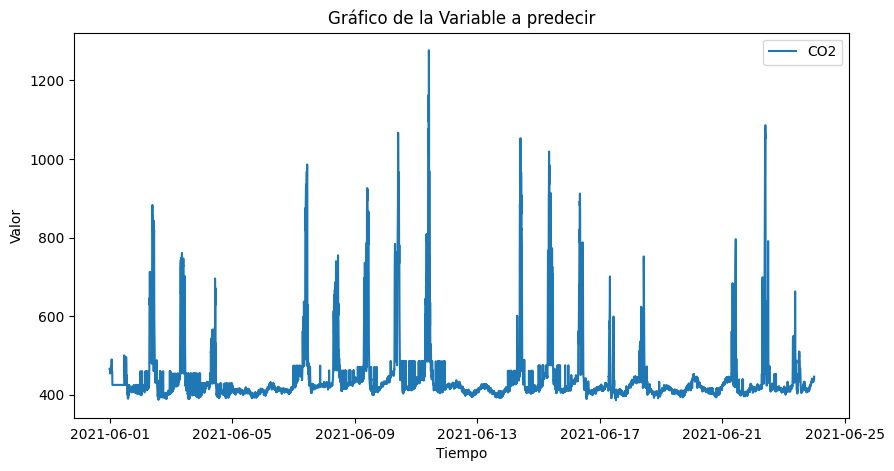

In [12]:
# Graficamos la variable a predecir
plt.figure(figsize=(10, 5))
plt.plot(df_CO2_01['co2'], label='CO2')
plt.title('Gráfico de la Variable a predecir')
plt.xlabel('Tiempo')
plt.ylabel('Valor')
plt.legend()
plt.show()

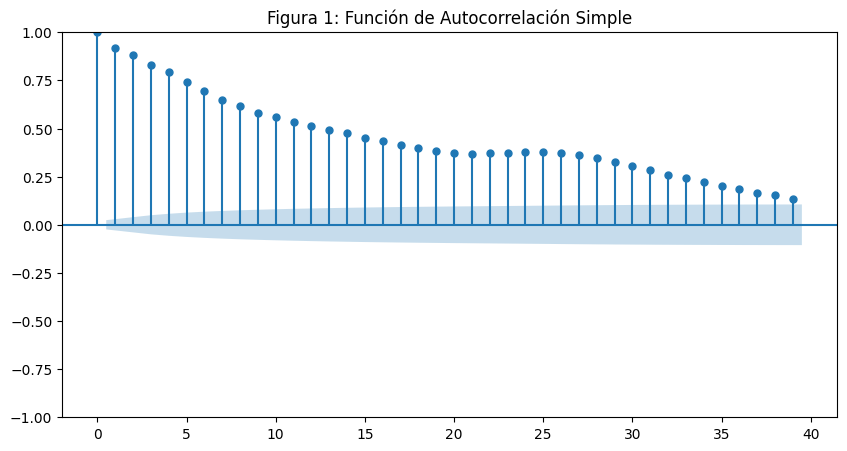

In [13]:
# Comprobamos la Autocorrelación
fig, ax = plt.subplots(figsize=(10, 5))
plot_acf(df_CO2_01['co2'], ax=ax, title='Figura 1: Función de Autocorrelación Simple')
plt.show()

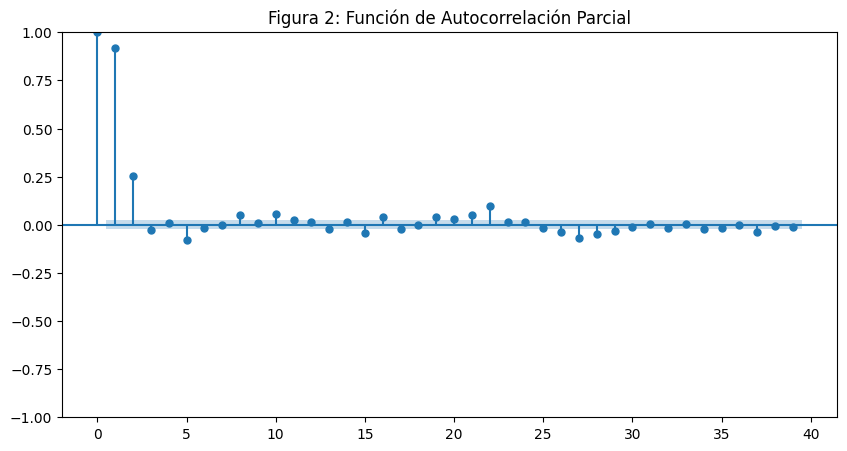

In [14]:
# Comprobamos la Autocorrelación Parcial
fig, ax = plt.subplots(figsize=(10, 5))
plot_pacf(df_CO2_01['co2'], ax=ax, title='Figura 2: Función de Autocorrelación Parcial')
plt.show()

In [15]:
# Primero, realizamos la prueba ADF
resultado_adf = adfuller(df_CO2_01['co2'])

# Imprimimos los resultados de la prueba
print('ADF Statistic: %f' % resultado_adf[0])
print('p-value: %f' % resultado_adf[1])
print('Critical Values:')
for key, value in resultado_adf[4].items():
    print('\t%s: %.3f' % (key, value))

ADF Statistic: -9.523526
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567


Obtenemos un p-value de cero, lo que indica que podemos rechazar la hipótesis nula. Esto nos sugiere que la serie temporal es estacionaria.

# 5. Generación del modelo

## 5.1 Preparación de los datos para su entrenamiento.

In [16]:
# Definimos el número de horas que observaremos para realizar la predicción (24 h x 12 registros/h)
n_pasos = 288

# Separamos el dataset en la variable objetivo y las variables de datos
data = df_CO2_01[['hum', 'temp', 'bat']].values
target = df_CO2_01['co2'].values

# Dividimos los datos para la evaluación de todos los modelos
val_train_X, val_test_X, val_train_Y, val_test_Y = train_test_split(data, target, test_size = 0.20, random_state = 42)

# Normalizamos los datos
scaler = MinMaxScaler(feature_range=(0, 1))
data_scaler = scaler.fit_transform(data)
target_scaler = scaler.fit_transform(target.reshape(-1, 1))

In [17]:
# Creamos función para separar los datos en X e Y
def createXY(dataset1, dataset2, window_size):
    dataX = []
    dataY = []
    for i in range(window_size, len(dataset1)):
            dataX.append(dataset1[i - window_size:i])
            dataY.append(dataset2[i])
    return np.array(dataX),np.array(dataY)

In [18]:
# Realizamos la división de los datos en X, Y
X, Y = createXY(data_scaler, target_scaler, n_pasos)

# Dividir los datos en entrenamiento y prueba para generar los modelos.
train_X, test_X, train_Y, test_Y = train_test_split(X, Y, test_size=0.20, random_state=42)

print(f'Training Data:{train_X.shape} with label {train_Y.shape}')
print(f' Testing Data:{test_X.shape} with label {test_Y.shape}')

Training Data:(5068, 288, 3) with label (5068, 1)
 Testing Data:(1268, 288, 3) with label (1268, 1)


## 5.2 Generación de modelo LSTM v1. Sin validación cruzada ni hiper-parámetros.

In [19]:
# Definir el modelo LSTM
def modelo_LSTM_v1():
    modelo = Sequential()
    modelo.add(LSTM(50, return_sequences = True, activation='tanh', input_shape=(train_X.shape[1], train_X.shape[2])))
    modelo.add(LSTM(units = 50))
    modelo.add(Dense(1))
    return modelo

In [20]:
# Instancia el modelo
modelo_v1 = modelo_LSTM_v1()

# Ahora puedes ver el resumen del modelo
modelo_v1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 288, 50)           10800     
                                                                 
 lstm_1 (LSTM)               (None, 50)                20200     
                                                                 
 dense (Dense)               (None, 1)                 51        
                                                                 
Total params: 31051 (121.29 KB)
Trainable params: 31051 (121.29 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [21]:
# Compilamos el modelo
modelo_v1.compile(optimizer = 'adam', loss = 'mean_squared_error', metrics = ['mean_absolute_error'])

# Entrenamos el modelo
modelo_v1.fit(train_X, train_Y, epochs = 100, batch_size = 32, verbose = 1)

Epoch 1/100
159/159 [==============================] - 7s 20ms/step - loss: 0.0097 - mean_absolute_error: 0.0543
Epoch 2/100
159/159 [==============================] - 3s 21ms/step - loss: 0.0074 - mean_absolute_error: 0.0502
Epoch 3/100
159/159 [==============================] - 3s 20ms/step - loss: 0.0067 - mean_absolute_error: 0.0497
Epoch 4/100
159/159 [==============================] - 3s 20ms/step - loss: 0.0064 - mean_absolute_error: 0.0472
Epoch 5/100
159/159 [==============================] - 3s 19ms/step - loss: 0.0061 - mean_absolute_error: 0.0467
Epoch 6/100
159/159 [==============================] - 3s 18ms/step - loss: 0.0059 - mean_absolute_error: 0.0463
Epoch 7/100
159/159 [==============================] - 3s 17ms/step - loss: 0.0058 - mean_absolute_error: 0.0470
Epoch 8/100
159/159 [==============================] - 3s 17ms/step - loss: 0.0057 - mean_absolute_error: 0.0455
Epoch 9/100
159/159 [==============================] - 3s 17ms/step - loss: 0.0055 - mean_absolu

In [22]:
# Guardamos el modelo completo
modelo_v1.save(os.path.join(rutaML, 'LSTM_best_v1.keras'))

In [23]:
# Evaluamos el modelo con el conjunto de prueba
test_loss_v1, test_mae_v1 = modelo_v1.evaluate(test_X, test_Y)

print(f'La pérdida en el conjunto de prueba es: {test_loss_v1}')

40/40 [==============================] - 1s 12ms/step - loss: 0.0024 - mean_absolute_error: 0.0229
La pérdida en el conjunto de prueba es: 0.0024089517537504435


In [24]:
# Se realiza la predicción del modelo
train_predictions_v1 = modelo_v1.predict(train_X)
test_predictions_v1 = modelo_v1.predict(test_X)

# Se calcula la metrica MSE
train_mse_v1 = mean_squared_error(train_Y, train_predictions_v1)
test_mse_v1 = mean_squared_error(test_Y, test_predictions_v1)
print(f'Train MSE: {train_mse_v1}, Test MSE: {test_mse_v1}')

# Se calcula la metrica MAE
train_mae_v1 = mean_absolute_error(train_Y, train_predictions_v1)
test_mae_v1 = mean_absolute_error(test_Y, test_predictions_v1)
print(f'Train MAE: {train_mae_v1}, Test MAE: {test_mae_v1}')

# Se calcula la metrica RMSE
train_rmse_v1 = np.sqrt(train_mse_v1)
test_rmse_v1 = np.sqrt(test_mse_v1)
print(f'Train RMSE: {train_rmse_v1}, Test RMSE: {test_rmse_v1}')

40/40 [==============================] - 0s 8ms/step
Train MSE: 0.001319898608249643, Test MSE: 0.0024089521045363585
Train MAE: 0.019658499506267572, Test MAE: 0.022896200664395832
Train RMSE: 0.03633040886433351, Test RMSE: 0.049081076847766476


In [25]:
metricsv1_df = pd.DataFrame(data=[['Train', round(train_mse_v1, 5), round(train_mae_v1, 5), round(train_rmse_v1, 5)],
                                    ['Test', round(test_mse_v1, 5), round(test_mae_v1, 5), round(test_rmse_v1, 5)]], columns=['LSTM v1','MSE', 'MAE','RMSE'])

metricsv1_df.set_index('LSTM v1', inplace=True)
metricsv1_df

,MSE,MAE,RMSE
LSTM v1,,,
Train,0.00132,0.01966,0.03633
Test,0.00241,0.02290,0.04908


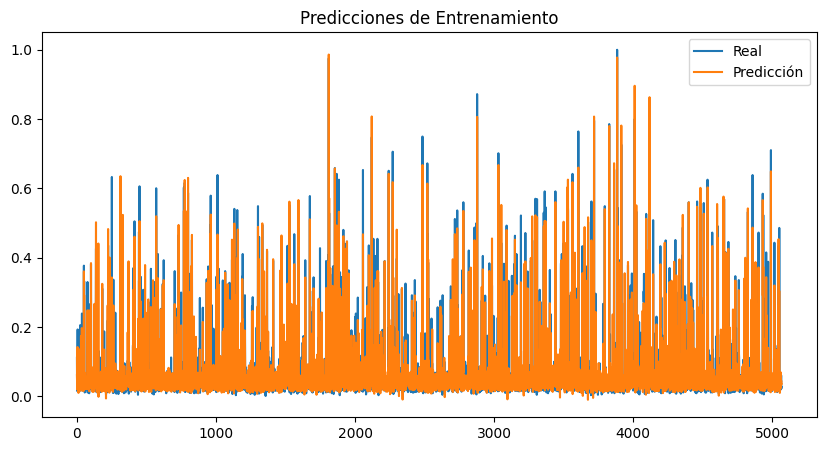

In [26]:
# Dibujamos los valores reales vs. las predicciones de entrenamiento
plt.figure(figsize=(10,5))
plt.plot(train_Y, label='Real')
plt.plot(train_predictions_v1, label='Predicción')
plt.title('Predicciones de Entrenamiento')
plt.legend()
plt.show()

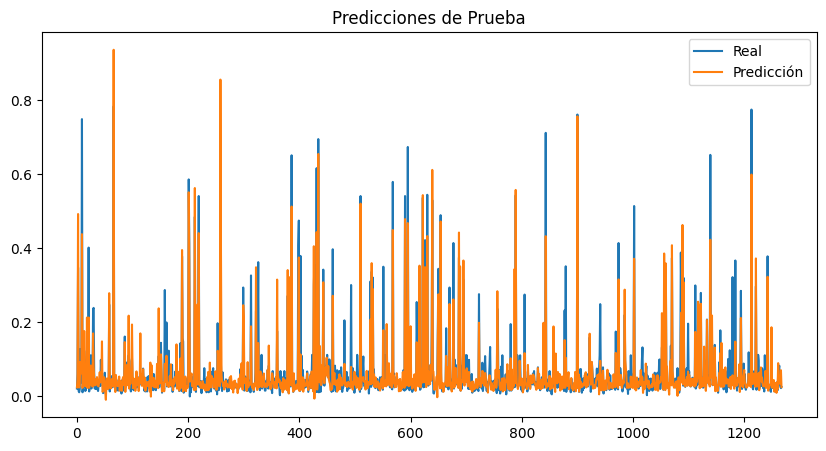

In [27]:
# Dibujamos los valores reales vs. las predicciones de prueba
plt.figure(figsize=(10,5))
plt.plot(test_Y, label='Real')
plt.plot(test_predictions_v1, label='Predicción')
plt.title('Predicciones de Prueba')
plt.legend()
plt.show()

## 5.3 Generación de modelo LSTM v2. Con validación cruzada e hiper-parámetros.

### 5.3.1 Busqueda de hiper-parámetros y empleo de validación cruzada.

In [28]:
# Definimos el modelo LSTM
def modelo_LSTM_v2(optimizer='adam'):
    modelo = Sequential()
    modelo.add(LSTM(50,
                    return_sequences = True,
                    activation='tanh',
                    input_shape=(train_X.shape[1], train_X.shape[2])))
    modelo.add(LSTM(units = 50))
    modelo.add(Dense(1))
    modelo.compile(optimizer = optimizer,
                   loss = 'mean_squared_error',
                   metrics = ['mean_absolute_error'])
    return modelo

In [29]:
# Instanciamos el modelo
modelo_v2 = modelo_LSTM_v2()

# Mostramos el resumen del modelo
modelo_v2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_2 (LSTM)               (None, 288, 50)           10800     
                                                                 
 lstm_3 (LSTM)               (None, 50)                20200     
                                                                 
 dense_1 (Dense)             (None, 1)                 51        
                                                                 
Total params: 31051 (121.29 KB)
Trainable params: 31051 (121.29 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
# Envolvemos el modelo LSTM con KerasRegressor
grid_LSTMv2_sklearn = KerasRegressor(model = modelo_LSTM_v2, optimizer='adam')

# Creamos e inicializamos una instancia de KFold
k_foldv2 = KFold(n_splits = 5, shuffle = True, random_state = 42)

In [ ]:
# Definimos los hiperparametros que queremos utilizar
parameters_v2 = {'optimizer' : ['Adam','RMSprop', 'Adadelta'],
                 'batch_size' : [32, 64, 128, 256],
                 'epochs' : [10, 25, 50, 75, 100]}

grid_search_v2  = GridSearchCV(estimator = grid_LSTMv2_sklearn,
                               param_grid = parameters_v2,
                               cv = k_foldv2,
                               scoring = 'neg_mean_squared_error')

In [ ]:
grid_search_v2.fit(train_X, train_Y)

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0120 - mean_absolute_error: 0.0624
Epoch 2/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0096 - mean_absolute_error: 0.0535
Epoch 3/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0078 - mean_absolute_error: 0.0518
Epoch 4/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0068 - mean_absolute_error: 0.0503
Epoch 5/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0070 - mean_absolute_error: 0.0529
Epoch 6/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0065 - mean_absolute_error: 0.0481
Epoch 7/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0065 - mean_absolute_error: 0.0478
Epoch 8/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0470
Epoch 9/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0061 - mean_absolute_error: 0.0486
Epoch 10/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0469
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - loss: 0.0107 - mean_absolute_error: 0.0621
Epoch 2/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0080 - mean_absolute_error: 0.0483
Epoch 3/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0077 - mean_absolute_error: 0.0529
Epoch 4/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0064 - mean_absolute_error: 0.0479
Epoch 5/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0064 - mean_absolute_error: 0.0489
Epoch 6/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0058 - mean_absolute_error: 0.0451
Epoch 7/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0054 - mean_absolute_error: 0.0440
Epoch 8/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0063 - mean_absolute_error: 0.0485
Epoch 9/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0054 - mean_absolute_error: 0.0434
Epoch 10/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0052 - mean_absolute_error: 0.0425
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0100 - mean_absolute_error: 0.0582
Epoch 2/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0096 - mean_absolute_error: 0.0537
Epoch 3/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0078 - mean_absolute_error: 0.0525
Epoch 4/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0061 - mean_absolute_error: 0.0469
Epoch 5/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0068 - mean_absolute_error: 0.0494
Epoch 6/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0064 - mean_absolute_error: 0.0487
Epoch 7/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0053 - mean_absolute_error: 0.0447
Epoch 8/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0052 - mean_absolute_error: 0.0439
Epoch 9/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0059 - mean_absolute_error: 0.0474
Epoch 10/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0051 - mean_absolute_error: 0.0432
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0101 - mean_absolute_error: 0.0558
Epoch 2/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0088 - mean_absolute_error: 0.0499
Epoch 3/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0075 - mean_absolute_error: 0.0511
Epoch 4/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0067 - mean_absolute_error: 0.0472
Epoch 5/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0059 - mean_absolute_error: 0.0442
Epoch 6/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0449
Epoch 7/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0064 - mean_absolute_error: 0.0478
Epoch 8/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0058 - mean_absolute_error: 0.0460
Epoch 9/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0063 - mean_absolute_error: 0.0485
Epoch 10/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0053 - mean_absolute_error: 0.0425
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.0101 - mean_absolute_error: 0.0596
Epoch 2/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0092 - mean_absolute_error: 0.0520
Epoch 3/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0083 - mean_absolute_error: 0.0513
Epoch 4/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0069 - mean_absolute_error: 0.0473
Epoch 5/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0071 - mean_absolute_error: 0.0482
Epoch 6/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0445
Epoch 7/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0064 - mean_absolute_error: 0.0482
Epoch 8/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0052 - mean_absolute_error: 0.0425
Epoch 9/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0057 - mean_absolute_error: 0.0444
Epoch 10/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0055 - mean_absolute_error: 0.0446
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - loss: 0.0127 - mean_absolute_error: 0.0654
Epoch 2/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0087 - mean_absolute_error: 0.0513
Epoch 3/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0082 - mean_absolute_error: 0.0524
Epoch 4/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0059 - mean_absolute_error: 0.0453
Epoch 5/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0079 - mean_absolute_error: 0.0561
Epoch 6/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0474
Epoch 7/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0494
Epoch 8/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0066 - mean_absolute_error: 0.0481
Epoch 9/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0058 - mean_absolute_error: 0.0463
Epoch 10/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0055 - mean_absolute_error: 0.0462
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0107 - mean_absolute_error: 0.0570
Epoch 2/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0085 - mean_absolute_error: 0.0522
Epoch 3/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0072 - mean_absolute_error: 0.0516
Epoch 4/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0071 - mean_absolute_error: 0.0512
Epoch 5/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0078 - mean_absolute_error: 0.0527
Epoch 6/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0060 - mean_absolute_error: 0.0466
Epoch 7/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0061 - mean_absolute_error: 0.0456
Epoch 8/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0056 - mean_absolute_error: 0.0471
Epoch 9/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0062 - mean_absolute_error: 0.0495
Epoch 10/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0057 - mean_absolute_error: 0.0455
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0112 - mean_absolute_error: 0.0642
Epoch 2/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0086 - mean_absolute_error: 0.0497
Epoch 3/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0074 - mean_absolute_error: 0.0509
Epoch 4/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0071 - mean_absolute_error: 0.0515
Epoch 5/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0062 - mean_absolute_error: 0.0489
Epoch 6/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0062 - mean_absolute_error: 0.0467
Epoch 7/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0062 - mean_absolute_error: 0.0467
Epoch 8/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0066 - mean_absolute_error: 0.0501
Epoch 9/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0051 - mean_absolute_error: 0.0437
Epoch 10/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0052 - mean_absolute_error: 0.0435
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - loss: 0.0097 - mean_absolute_error: 0.0567
Epoch 2/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0078 - mean_absolute_error: 0.0474
Epoch 3/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0076 - mean_absolute_error: 0.0532
Epoch 4/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0074 - mean_absolute_error: 0.0500
Epoch 5/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0070 - mean_absolute_error: 0.0503
Epoch 6/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0059 - mean_absolute_error: 0.0455
Epoch 7/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0060 - mean_absolute_error: 0.0460
Epoch 8/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0055 - mean_absolute_error: 0.0460
Epoch 9/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0060 - mean_absolute_error: 0.0462
Epoch 10/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0057 - mean_absolute_error: 0.0451
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0105 - mean_absolute_error: 0.0579
Epoch 2/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0089 - mean_absolute_error: 0.0533
Epoch 3/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0078 - mean_absolute_error: 0.0532
Epoch 4/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0060 - mean_absolute_error: 0.0473
Epoch 5/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0068 - mean_absolute_error: 0.0487
Epoch 6/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0059 - mean_absolute_error: 0.0480
Epoch 7/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0063 - mean_absolute_error: 0.0479
Epoch 8/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0055 - mean_absolute_error: 0.0437
Epoch 9/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0060 - mean_absolute_error: 0.0471
Epoch 10/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0055 - mean_absolute_error: 0.0438
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0115 - mean_absolute_error: 0.0603
Epoch 2/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0102 - mean_absolute_error: 0.0529
Epoch 3/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0079 - mean_absolute_error: 0.0512
Epoch 4/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0079 - mean_absolute_error: 0.0512
Epoch 5/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0064 - mean_absolute_error: 0.0489
Epoch 6/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0062 - mean_absolute_error: 0.0469
Epoch 7/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0067 - mean_absolute_error: 0.0478
Epoch 8/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0465
Epoch 9/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0059 - mean_absolute_error: 0.0461
Epoch 10/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0054 - mean_absolute_error: 0.0431
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - loss: 0.0114 - mean_absolute_error: 0.0589
Epoch 2/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0100 - mean_absolute_error: 0.0543
Epoch 3/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0075 - mean_absolute_error: 0.0494
Epoch 4/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0067 - mean_absolute_error: 0.0481
Epoch 5/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0074 - mean_absolute_error: 0.0503
Epoch 6/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0467
Epoch 7/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0061 - mean_absolute_error: 0.0479
Epoch 8/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0050 - mean_absolute_error: 0.0419
Epoch 9/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0057 - mean_absolute_error: 0.0460
Epoch 10/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0062 - mean_absolute_error: 0.0455
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0124 - mean_absolute_error: 0.0662
Epoch 2/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0096 - mean_absolute_error: 0.0520
Epoch 3/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0069 - mean_absolute_error: 0.0466
Epoch 4/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0079 - mean_absolute_error: 0.0537
Epoch 5/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0068 - mean_absolute_error: 0.0464
Epoch 6/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0054 - mean_absolute_error: 0.0434
Epoch 7/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0062 - mean_absolute_error: 0.0480
Epoch 8/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0054 - mean_absolute_error: 0.0422
Epoch 9/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0063 - mean_absolute_error: 0.0462
Epoch 10/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0059 - mean_absolute_error: 0.0455
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0103 - mean_absolute_error: 0.0569
Epoch 2/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0082 - mean_absolute_error: 0.0499
Epoch 3/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0076 - mean_absolute_error: 0.0523
Epoch 4/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0060 - mean_absolute_error: 0.0462
Epoch 5/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0065 - mean_absolute_error: 0.0475
Epoch 6/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0060 - mean_absolute_error: 0.0452
Epoch 7/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0460
Epoch 8/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0056 - mean_absolute_error: 0.0444
Epoch 9/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0055 - mean_absolute_error: 0.0445
Epoch 10/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0057 - mean_absolute_error: 0.0432
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0109 - mean_absolute_error: 0.0602
Epoch 2/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0093 - mean_absolute_error: 0.0532
Epoch 3/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0088 - mean_absolute_error: 0.0548
Epoch 4/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0065 - mean_absolute_error: 0.0473
Epoch 5/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0076 - mean_absolute_error: 0.0541
Epoch 6/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0063 - mean_absolute_error: 0.0488
Epoch 7/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0067 - mean_absolute_error: 0.0509
Epoch 8/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0057 - mean_absolute_error: 0.0451
Epoch 9/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0059 - mean_absolute_error: 0.0477
Epoch 10/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0056 - mean_absolute_error: 0.0433
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0143 - mean_absolute_error: 0.0722
Epoch 2/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0101 - mean_absolute_error: 0.0524
Epoch 3/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0103 - mean_absolute_error: 0.0553
Epoch 4/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0077 - mean_absolute_error: 0.0515
Epoch 5/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0068 - mean_absolute_error: 0.0494
Epoch 6/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0069 - mean_absolute_error: 0.0513
Epoch 7/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0060 - mean_absolute_error: 0.0459
Epoch 8/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0062 - mean_absolute_error: 0.0459
Epoch 9/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0070 - mean_absolute_error: 0.0486
Epoch 10/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0057 - mean_absolute_error: 0.0464
Epoch 11/25
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0108 - mean_absolute_error: 0.0586
Epoch 2/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0084 - mean_absolute_error: 0.0524
Epoch 3/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0074 - mean_absolute_error: 0.0506
Epoch 4/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0480
Epoch 5/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0061 - mean_absolute_error: 0.0476
Epoch 6/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0064 - mean_absolute_error: 0.0488
Epoch 7/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0063 - mean_absolute_error: 0.0492
Epoch 8/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0057 - mean_absolute_error: 0.0465
Epoch 9/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0059 - mean_absolute_error: 0.0473
Epoch 10/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0059 - mean_absolute_error: 0.0461
Epoch 11/25
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - loss: 0.0109 - mean_absolute_error: 0.0615
Epoch 2/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0103 - mean_absolute_error: 0.0559
Epoch 3/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0067 - mean_absolute_error: 0.0479
Epoch 4/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0083 - mean_absolute_error: 0.0537
Epoch 5/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0075 - mean_absolute_error: 0.0515
Epoch 6/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0063 - mean_absolute_error: 0.0479
Epoch 7/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0062 - mean_absolute_error: 0.0483
Epoch 8/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0063 - mean_absolute_error: 0.0472
Epoch 9/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0440
Epoch 10/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0053 - mean_absolute_error: 0.0448
Epoch 11/25
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.0130 - mean_absolute_error: 0.0664
Epoch 2/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0102 - mean_absolute_error: 0.0531
Epoch 3/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0083 - mean_absolute_error: 0.0480
Epoch 4/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0082 - mean_absolute_error: 0.0493
Epoch 5/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0079 - mean_absolute_error: 0.0512
Epoch 6/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0072 - mean_absolute_error: 0.0498
Epoch 7/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0060 - mean_absolute_error: 0.0470
Epoch 8/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0077 - mean_absolute_error: 0.0519
Epoch 9/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0050 - mean_absolute_error: 0.0408
Epoch 10/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0056 - mean_absolute_error: 0.0443
Epoch 11/25
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - loss: 0.0137 - mean_absolute_error: 0.0709
Epoch 2/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0094 - mean_absolute_error: 0.0497
Epoch 3/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0079 - mean_absolute_error: 0.0509
Epoch 4/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0073 - mean_absolute_error: 0.0523
Epoch 5/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0065 - mean_absolute_error: 0.0476
Epoch 6/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0063 - mean_absolute_error: 0.0456
Epoch 7/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0061 - mean_absolute_error: 0.0470
Epoch 8/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0062 - mean_absolute_error: 0.0458
Epoch 9/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0060 - mean_absolute_error: 0.0440
Epoch 10/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0057 - mean_absolute_error: 0.0439
Epoch 11/25
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0134 - mean_absolute_error: 0.0673
Epoch 2/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0121 - mean_absolute_error: 0.0602
Epoch 3/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0077 - mean_absolute_error: 0.0485
Epoch 4/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0068 - mean_absolute_error: 0.0500
Epoch 5/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0069 - mean_absolute_error: 0.0514
Epoch 6/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0073 - mean_absolute_error: 0.0490
Epoch 7/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.0063 - mean_absolute_error: 0.0477
Epoch 8/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0465
Epoch 9/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0469
Epoch 10/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0056 - mean_absolute_error: 0.0459
Epoch 11/25
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - loss: 0.0095 - mean_absolute_error: 0.0564
Epoch 2/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0088 - mean_absolute_error: 0.0529
Epoch 3/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0071 - mean_absolute_error: 0.0518
Epoch 4/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0063 - mean_absolute_error: 0.0493
Epoch 5/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0060 - mean_absolute_error: 0.0470
Epoch 6/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0055 - mean_absolute_error: 0.0447
Epoch 7/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0062 - mean_absolute_error: 0.0502
Epoch 8/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0060 - mean_absolute_error: 0.0479
Epoch 9/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0056 - mean_absolute_error: 0.0463
Epoch 10/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0439
Epoch 11/25
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.0103 - mean_absolute_error: 0.0562
Epoch 2/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0079 - mean_absolute_error: 0.0496
Epoch 3/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0070 - mean_absolute_error: 0.0491
Epoch 4/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0070 - mean_absolute_error: 0.0509
Epoch 5/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0063 - mean_absolute_error: 0.0483
Epoch 6/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0062 - mean_absolute_error: 0.0479
Epoch 7/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0473
Epoch 8/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0059 - mean_absolute_error: 0.0485
Epoch 9/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0055 - mean_absolute_error: 0.0475
Epoch 10/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0051 - mean_absolute_error: 0.0446
Epoch 11/25
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - loss: 0.0101 - mean_absolute_error: 0.0585
Epoch 2/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0079 - mean_absolute_error: 0.0488
Epoch 3/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0080 - mean_absolute_error: 0.0510
Epoch 4/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0078 - mean_absolute_error: 0.0503
Epoch 5/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0067 - mean_absolute_error: 0.0482
Epoch 6/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0069 - mean_absolute_error: 0.0518
Epoch 7/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0070 - mean_absolute_error: 0.0500
Epoch 8/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0061 - mean_absolute_error: 0.0459
Epoch 9/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0057 - mean_absolute_error: 0.0440
Epoch 10/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0055 - mean_absolute_error: 0.0433
Epoch 11/25
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0163 - mean_absolute_error: 0.0773
Epoch 2/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0103 - mean_absolute_error: 0.0550
Epoch 3/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0075 - mean_absolute_error: 0.0504
Epoch 4/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0069 - mean_absolute_error: 0.0512
Epoch 5/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0069 - mean_absolute_error: 0.0482
Epoch 6/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0436
Epoch 7/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0457
Epoch 8/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0063 - mean_absolute_error: 0.0472
Epoch 9/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0062 - mean_absolute_error: 0.0453
Epoch 10/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0061 - mean_absolute_error: 0.0466
Epoch 11/25
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - loss: 0.0118 - mean_absolute_error: 0.0596
Epoch 2/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 0.0081 - mean_absolute_error: 0.0506
Epoch 3/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0075 - mean_absolute_error: 0.0508
Epoch 4/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0065 - mean_absolute_error: 0.0491
Epoch 5/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0065 - mean_absolute_error: 0.0502
Epoch 6/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0065 - mean_absolute_error: 0.0505
Epoch 7/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0064 - mean_absolute_error: 0.0470
Epoch 8/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0060 - mean_absolute_error: 0.0485
Epoch 9/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0054 - mean_absolute_error: 0.0444
Epoch 10/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0057 - mean_absolute_error: 0.0456
Epoch 11/25
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0133 - mean_absolute_error: 0.0710
Epoch 2/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0090 - mean_absolute_error: 0.0513
Epoch 3/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0072 - mean_absolute_error: 0.0485
Epoch 4/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0072 - mean_absolute_error: 0.0525
Epoch 5/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0068 - mean_absolute_error: 0.0501
Epoch 6/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0067 - mean_absolute_error: 0.0483
Epoch 7/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0068 - mean_absolute_error: 0.0486
Epoch 8/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0056 - mean_absolute_error: 0.0448
Epoch 9/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0065 - mean_absolute_error: 0.0477
Epoch 10/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0052 - mean_absolute_error: 0.0455
Epoch 11/25
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0096 - mean_absolute_error: 0.0562
Epoch 2/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0093 - mean_absolute_error: 0.0510
Epoch 3/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0070 - mean_absolute_error: 0.0482
Epoch 4/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0093 - mean_absolute_error: 0.0598
Epoch 5/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0071 - mean_absolute_error: 0.0504
Epoch 6/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0062 - mean_absolute_error: 0.0458
Epoch 7/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0070 - mean_absolute_error: 0.0486
Epoch 8/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0467
Epoch 9/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0053 - mean_absolute_error: 0.0451
Epoch 10/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0055 - mean_absolute_error: 0.0460
Epoch 11/25
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0102 - mean_absolute_error: 0.0565
Epoch 2/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0085 - mean_absolute_error: 0.0529
Epoch 3/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0081 - mean_absolute_error: 0.0532
Epoch 4/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0057 - mean_absolute_error: 0.0446
Epoch 5/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0474
Epoch 6/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0066 - mean_absolute_error: 0.0485
Epoch 7/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0056 - mean_absolute_error: 0.0435
Epoch 8/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0058 - mean_absolute_error: 0.0444
Epoch 9/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0056 - mean_absolute_error: 0.0453
Epoch 10/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0055 - mean_absolute_error: 0.0434
Epoch 11/25
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0100 - mean_absolute_error: 0.0555
Epoch 2/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0086 - mean_absolute_error: 0.0528
Epoch 3/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0063 - mean_absolute_error: 0.0471
Epoch 4/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0075 - mean_absolute_error: 0.0522
Epoch 5/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0068 - mean_absolute_error: 0.0484
Epoch 6/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0065 - mean_absolute_error: 0.0481
Epoch 7/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0061 - mean_absolute_error: 0.0472
Epoch 8/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0058 - mean_absolute_error: 0.0442
Epoch 9/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0059 - mean_absolute_error: 0.0451
Epoch 10/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0055 - mean_absolute_error: 0.0450
Epoch 11/25
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0118 - mean_absolute_error: 0.0623
Epoch 2/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0100 - mean_absolute_error: 0.0533
Epoch 3/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0089 - mean_absolute_error: 0.0576
Epoch 4/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0071 - mean_absolute_error: 0.0495
Epoch 5/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0070 - mean_absolute_error: 0.0496
Epoch 6/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0059 - mean_absolute_error: 0.0450
Epoch 7/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0060 - mean_absolute_error: 0.0467
Epoch 8/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0055 - mean_absolute_error: 0.0447
Epoch 9/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0060 - mean_absolute_error: 0.0461
Epoch 10/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0050 - mean_absolute_error: 0.0408
Epoch 11/50
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - loss: 0.0121 - mean_absolute_error: 0.0657
Epoch 2/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0098 - mean_absolute_error: 0.0541
Epoch 3/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0082 - mean_absolute_error: 0.0526
Epoch 4/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0078 - mean_absolute_error: 0.0538
Epoch 5/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0075 - mean_absolute_error: 0.0500
Epoch 6/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0066 - mean_absolute_error: 0.0480
Epoch 7/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0056 - mean_absolute_error: 0.0450
Epoch 8/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0057 - mean_absolute_error: 0.0472
Epoch 9/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0056 - mean_absolute_error: 0.0439
Epoch 10/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0054 - mean_absolute_error: 0.0446
Epoch 11/50
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0112 - mean_absolute_error: 0.0654
Epoch 2/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0088 - mean_absolute_error: 0.0512
Epoch 3/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0093 - mean_absolute_error: 0.0533
Epoch 4/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0069 - mean_absolute_error: 0.0498
Epoch 5/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0069 - mean_absolute_error: 0.0466
Epoch 6/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0062 - mean_absolute_error: 0.0469
Epoch 7/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0069 - mean_absolute_error: 0.0501
Epoch 8/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0468
Epoch 9/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0061 - mean_absolute_error: 0.0482
Epoch 10/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0467
Epoch 11/50
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - loss: 0.0106 - mean_absolute_error: 0.0588
Epoch 2/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0090 - mean_absolute_error: 0.0498
Epoch 3/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0074 - mean_absolute_error: 0.0497
Epoch 4/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0066 - mean_absolute_error: 0.0469
Epoch 5/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0068 - mean_absolute_error: 0.0490
Epoch 6/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0060 - mean_absolute_error: 0.0457
Epoch 7/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0055 - mean_absolute_error: 0.0434
Epoch 8/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0056 - mean_absolute_error: 0.0431
Epoch 9/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0052 - mean_absolute_error: 0.0451
Epoch 10/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0052 - mean_absolute_error: 0.0424
Epoch 11/50
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0108 - mean_absolute_error: 0.0606
Epoch 2/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0081 - mean_absolute_error: 0.0500
Epoch 3/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0078 - mean_absolute_error: 0.0524
Epoch 4/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0065 - mean_absolute_error: 0.0471
Epoch 5/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0067 - mean_absolute_error: 0.0495
Epoch 6/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0475
Epoch 7/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0055 - mean_absolute_error: 0.0472
Epoch 8/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0061 - mean_absolute_error: 0.0464
Epoch 9/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0052 - mean_absolute_error: 0.0448
Epoch 10/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0463
Epoch 11/50
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.0124 - mean_absolute_error: 0.0629
Epoch 2/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0092 - mean_absolute_error: 0.0534
Epoch 3/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0068 - mean_absolute_error: 0.0486
Epoch 4/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0079 - mean_absolute_error: 0.0518
Epoch 5/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0064 - mean_absolute_error: 0.0485
Epoch 6/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0074 - mean_absolute_error: 0.0520
Epoch 7/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0054 - mean_absolute_error: 0.0459
Epoch 8/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0056 - mean_absolute_error: 0.0449
Epoch 9/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0052 - mean_absolute_error: 0.0427
Epoch 10/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0461
Epoch 11/50
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - loss: 0.0113 - mean_absolute_error: 0.0614
Epoch 2/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0100 - mean_absolute_error: 0.0543
Epoch 3/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0081 - mean_absolute_error: 0.0554
Epoch 4/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0060 - mean_absolute_error: 0.0479
Epoch 5/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0063 - mean_absolute_error: 0.0493
Epoch 6/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0064 - mean_absolute_error: 0.0475
Epoch 7/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0457
Epoch 8/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0056 - mean_absolute_error: 0.0454
Epoch 9/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0054 - mean_absolute_error: 0.0438
Epoch 10/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0052 - mean_absolute_error: 0.0438
Epoch 11/50
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - loss: 0.0104 - mean_absolute_error: 0.0590
Epoch 2/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0087 - mean_absolute_error: 0.0488
Epoch 3/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0081 - mean_absolute_error: 0.0526
Epoch 4/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0065 - mean_absolute_error: 0.0489
Epoch 5/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0078 - mean_absolute_error: 0.0530
Epoch 6/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0066 - mean_absolute_error: 0.0481
Epoch 7/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0066 - mean_absolute_error: 0.0489
Epoch 8/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0057 - mean_absolute_error: 0.0448
Epoch 9/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0061 - mean_absolute_error: 0.0467
Epoch 10/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0057 - mean_absolute_error: 0.0456
Epoch 11/50
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0118 - mean_absolute_error: 0.0589
Epoch 2/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0086 - mean_absolute_error: 0.0493
Epoch 3/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0082 - mean_absolute_error: 0.0499
Epoch 4/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0070 - mean_absolute_error: 0.0463
Epoch 5/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0072 - mean_absolute_error: 0.0483
Epoch 6/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0057 - mean_absolute_error: 0.0449
Epoch 7/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0066 - mean_absolute_error: 0.0486
Epoch 8/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0061 - mean_absolute_error: 0.0444
Epoch 9/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0456
Epoch 10/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0061 - mean_absolute_error: 0.0461
Epoch 11/50
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0118 - mean_absolute_error: 0.0623
Epoch 2/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0097 - mean_absolute_error: 0.0534
Epoch 3/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0078 - mean_absolute_error: 0.0519
Epoch 4/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0071 - mean_absolute_error: 0.0501
Epoch 5/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0071 - mean_absolute_error: 0.0507
Epoch 6/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0075 - mean_absolute_error: 0.0507
Epoch 7/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0063 - mean_absolute_error: 0.0471
Epoch 8/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0058 - mean_absolute_error: 0.0459
Epoch 9/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0458
Epoch 10/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0063 - mean_absolute_error: 0.0486
Epoch 11/50
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0116 - mean_absolute_error: 0.0592
Epoch 2/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0099 - mean_absolute_error: 0.0535
Epoch 3/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0076 - mean_absolute_error: 0.0497
Epoch 4/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0080 - mean_absolute_error: 0.0559
Epoch 5/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0077 - mean_absolute_error: 0.0525
Epoch 6/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0060 - mean_absolute_error: 0.0475
Epoch 7/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0064 - mean_absolute_error: 0.0500
Epoch 8/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0073 - mean_absolute_error: 0.0507
Epoch 9/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0053 - mean_absolute_error: 0.0433
Epoch 10/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0065 - mean_absolute_error: 0.0473
Epoch 11/50
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - loss: 0.0114 - mean_absolute_error: 0.0602
Epoch 2/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0070 - mean_absolute_error: 0.0489
Epoch 3/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0073 - mean_absolute_error: 0.0521
Epoch 4/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0063 - mean_absolute_error: 0.0477
Epoch 5/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0069 - mean_absolute_error: 0.0502
Epoch 6/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0471
Epoch 7/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0457
Epoch 8/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0047 - mean_absolute_error: 0.0412
Epoch 9/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0064 - mean_absolute_error: 0.0493
Epoch 10/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0052 - mean_absolute_error: 0.0430
Epoch 11/50
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.0115 - mean_absolute_error: 0.0626
Epoch 2/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0099 - mean_absolute_error: 0.0539
Epoch 3/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0077 - mean_absolute_error: 0.0503
Epoch 4/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0064 - mean_absolute_error: 0.0481
Epoch 5/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0072 - mean_absolute_error: 0.0508
Epoch 6/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0067 - mean_absolute_error: 0.0486
Epoch 7/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0066 - mean_absolute_error: 0.0478
Epoch 8/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0060 - mean_absolute_error: 0.0466
Epoch 9/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0060 - mean_absolute_error: 0.0453
Epoch 10/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0443
Epoch 11/50
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.0101 - mean_absolute_error: 0.0575
Epoch 2/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0096 - mean_absolute_error: 0.0518
Epoch 3/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0077 - mean_absolute_error: 0.0491
Epoch 4/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0073 - mean_absolute_error: 0.0498
Epoch 5/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0065 - mean_absolute_error: 0.0475
Epoch 6/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0429
Epoch 7/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0057 - mean_absolute_error: 0.0446
Epoch 8/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0061 - mean_absolute_error: 0.0458
Epoch 9/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0050 - mean_absolute_error: 0.0416
Epoch 10/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0055 - mean_absolute_error: 0.0437
Epoch 11/50
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0107 - mean_absolute_error: 0.0635
Epoch 2/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0093 - mean_absolute_error: 0.0528
Epoch 3/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0068 - mean_absolute_error: 0.0494
Epoch 4/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0065 - mean_absolute_error: 0.0502
Epoch 5/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0065 - mean_absolute_error: 0.0480
Epoch 6/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0067 - mean_absolute_error: 0.0477
Epoch 7/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0057 - mean_absolute_error: 0.0461
Epoch 8/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0067 - mean_absolute_error: 0.0468
Epoch 9/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0061 - mean_absolute_error: 0.0461
Epoch 10/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0059 - mean_absolute_error: 0.0447
Epoch 11/50
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0115 - mean_absolute_error: 0.0660
Epoch 2/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0093 - mean_absolute_error: 0.0516
Epoch 3/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0080 - mean_absolute_error: 0.0510
Epoch 4/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0072 - mean_absolute_error: 0.0508
Epoch 5/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0068 - mean_absolute_error: 0.0518
Epoch 6/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0061 - mean_absolute_error: 0.0482
Epoch 7/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0059 - mean_absolute_error: 0.0477
Epoch 8/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0488
Epoch 9/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0061 - mean_absolute_error: 0.0487
Epoch 10/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0453
Epoch 11/75
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.0143 - mean_absolute_error: 0.0745
Epoch 2/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0092 - mean_absolute_error: 0.0501
Epoch 3/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0088 - mean_absolute_error: 0.0525
Epoch 4/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0069 - mean_absolute_error: 0.0466
Epoch 5/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0069 - mean_absolute_error: 0.0493
Epoch 6/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0061 - mean_absolute_error: 0.0463
Epoch 7/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0060 - mean_absolute_error: 0.0472
Epoch 8/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0064 - mean_absolute_error: 0.0466
Epoch 9/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0057 - mean_absolute_error: 0.0448
Epoch 10/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0053 - mean_absolute_error: 0.0448
Epoch 11/75
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0133 - mean_absolute_error: 0.0685
Epoch 2/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0087 - mean_absolute_error: 0.0501
Epoch 3/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0073 - mean_absolute_error: 0.0476
Epoch 4/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0075 - mean_absolute_error: 0.0526
Epoch 5/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0066 - mean_absolute_error: 0.0483
Epoch 6/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0063 - mean_absolute_error: 0.0473
Epoch 7/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0062 - mean_absolute_error: 0.0482
Epoch 8/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0066 - mean_absolute_error: 0.0492
Epoch 9/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0469
Epoch 10/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0051 - mean_absolute_error: 0.0439
Epoch 11/75
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - loss: 0.0109 - mean_absolute_error: 0.0580
Epoch 2/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0078 - mean_absolute_error: 0.0488
Epoch 3/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0432
Epoch 4/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0066 - mean_absolute_error: 0.0495
Epoch 5/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0059 - mean_absolute_error: 0.0453
Epoch 6/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0059 - mean_absolute_error: 0.0470
Epoch 7/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0066 - mean_absolute_error: 0.0468
Epoch 8/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0061 - mean_absolute_error: 0.0436
Epoch 9/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0066 - mean_absolute_error: 0.0478
Epoch 10/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0053 - mean_absolute_error: 0.0435
Epoch 11/75
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - loss: 0.0100 - mean_absolute_error: 0.0600
Epoch 2/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0086 - mean_absolute_error: 0.0504
Epoch 3/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0095 - mean_absolute_error: 0.0540
Epoch 4/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0071 - mean_absolute_error: 0.0507
Epoch 5/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0071 - mean_absolute_error: 0.0521
Epoch 6/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0065 - mean_absolute_error: 0.0470
Epoch 7/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0063 - mean_absolute_error: 0.0475
Epoch 8/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0055 - mean_absolute_error: 0.0445
Epoch 9/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0051 - mean_absolute_error: 0.0426
Epoch 10/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0045 - mean_absolute_error: 0.0398
Epoch 11/75
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0128 - mean_absolute_error: 0.0707
Epoch 2/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0100 - mean_absolute_error: 0.0542
Epoch 3/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0080 - mean_absolute_error: 0.0520
Epoch 4/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0077 - mean_absolute_error: 0.0531
Epoch 5/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0071 - mean_absolute_error: 0.0502
Epoch 6/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0070 - mean_absolute_error: 0.0506
Epoch 7/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0063 - mean_absolute_error: 0.0490
Epoch 8/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0062 - mean_absolute_error: 0.0492
Epoch 9/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0060 - mean_absolute_error: 0.0473
Epoch 10/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0054 - mean_absolute_error: 0.0445
Epoch 11/75
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0128 - mean_absolute_error: 0.0698
Epoch 2/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0093 - mean_absolute_error: 0.0513
Epoch 3/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0076 - mean_absolute_error: 0.0517
Epoch 4/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0075 - mean_absolute_error: 0.0500
Epoch 5/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0062 - mean_absolute_error: 0.0487
Epoch 6/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0065 - mean_absolute_error: 0.0502
Epoch 7/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0054 - mean_absolute_error: 0.0450
Epoch 8/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0060 - mean_absolute_error: 0.0474
Epoch 9/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0060 - mean_absolute_error: 0.0460
Epoch 10/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0056 - mean_absolute_error: 0.0475
Epoch 11/75
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - loss: 0.0105 - mean_absolute_error: 0.0613
Epoch 2/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0088 - mean_absolute_error: 0.0486
Epoch 3/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0089 - mean_absolute_error: 0.0542
Epoch 4/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0061 - mean_absolute_error: 0.0448
Epoch 5/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0063 - mean_absolute_error: 0.0478
Epoch 6/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0064 - mean_absolute_error: 0.0490
Epoch 7/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0066 - mean_absolute_error: 0.0489
Epoch 8/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0052 - mean_absolute_error: 0.0446
Epoch 9/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0061 - mean_absolute_error: 0.0480
Epoch 10/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0049 - mean_absolute_error: 0.0422
Epoch 11/75
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0104 - mean_absolute_error: 0.0590
Epoch 2/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0097 - mean_absolute_error: 0.0530
Epoch 3/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0066 - mean_absolute_error: 0.0480
Epoch 4/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0071 - mean_absolute_error: 0.0498
Epoch 5/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0070 - mean_absolute_error: 0.0509
Epoch 6/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0067 - mean_absolute_error: 0.0474
Epoch 7/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0069 - mean_absolute_error: 0.0484
Epoch 8/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0061 - mean_absolute_error: 0.0470
Epoch 9/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0446
Epoch 10/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0053 - mean_absolute_error: 0.0433
Epoch 11/75
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - loss: 0.0102 - mean_absolute_error: 0.0566
Epoch 2/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0085 - mean_absolute_error: 0.0503
Epoch 3/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0075 - mean_absolute_error: 0.0509
Epoch 4/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0069 - mean_absolute_error: 0.0485
Epoch 5/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0064 - mean_absolute_error: 0.0460
Epoch 6/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0059 - mean_absolute_error: 0.0457
Epoch 7/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0053 - mean_absolute_error: 0.0460
Epoch 8/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0055 - mean_absolute_error: 0.0459
Epoch 9/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0056 - mean_absolute_error: 0.0439
Epoch 10/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0050 - mean_absolute_error: 0.0407
Epoch 11/75
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - loss: 0.0135 - mean_absolute_error: 0.0670
Epoch 2/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0082 - mean_absolute_error: 0.0510
Epoch 3/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0078 - mean_absolute_error: 0.0539
Epoch 4/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0065 - mean_absolute_error: 0.0485
Epoch 5/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0067 - mean_absolute_error: 0.0490
Epoch 6/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0061 - mean_absolute_error: 0.0455
Epoch 7/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0079 - mean_absolute_error: 0.0544
Epoch 8/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0068 - mean_absolute_error: 0.0478
Epoch 9/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0445
Epoch 10/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0052 - mean_absolute_error: 0.0430
Epoch 11/75
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0111 - mean_absolute_error: 0.0628
Epoch 2/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0098 - mean_absolute_error: 0.0536
Epoch 3/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0092 - mean_absolute_error: 0.0585
Epoch 4/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0478
Epoch 5/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0472
Epoch 6/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0065 - mean_absolute_error: 0.0476
Epoch 7/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0062 - mean_absolute_error: 0.0475
Epoch 8/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0053 - mean_absolute_error: 0.0447
Epoch 9/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0058 - mean_absolute_error: 0.0468
Epoch 10/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0051 - mean_absolute_error: 0.0437
Epoch 11/75
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0107 - mean_absolute_error: 0.0571
Epoch 2/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0095 - mean_absolute_error: 0.0532
Epoch 3/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0068 - mean_absolute_error: 0.0490
Epoch 4/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0066 - mean_absolute_error: 0.0486
Epoch 5/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0070 - mean_absolute_error: 0.0493
Epoch 6/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0062 - mean_absolute_error: 0.0477
Epoch 7/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0065 - mean_absolute_error: 0.0491
Epoch 8/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0057 - mean_absolute_error: 0.0424
Epoch 9/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0064 - mean_absolute_error: 0.0471
Epoch 10/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0053 - mean_absolute_error: 0.0434
Epoch 11/75
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0116 - mean_absolute_error: 0.0621
Epoch 2/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0089 - mean_absolute_error: 0.0502
Epoch 3/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0074 - mean_absolute_error: 0.0493
Epoch 4/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0068 - mean_absolute_error: 0.0462
Epoch 5/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0065 - mean_absolute_error: 0.0483
Epoch 6/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0063 - mean_absolute_error: 0.0465
Epoch 7/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0060 - mean_absolute_error: 0.0466
Epoch 8/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0061 - mean_absolute_error: 0.0442
Epoch 9/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0059 - mean_absolute_error: 0.0468
Epoch 10/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0051 - mean_absolute_error: 0.0432
Epoch 11/75
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - loss: 0.0100 - mean_absolute_error: 0.0557
Epoch 2/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0071 - mean_absolute_error: 0.0470
Epoch 3/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0065 - mean_absolute_error: 0.0485
Epoch 4/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0065 - mean_absolute_error: 0.0489
Epoch 5/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0452
Epoch 6/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0061 - mean_absolute_error: 0.0474
Epoch 7/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0052 - mean_absolute_error: 0.0438
Epoch 8/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0062 - mean_absolute_error: 0.0480
Epoch 9/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0061 - mean_absolute_error: 0.0470
Epoch 10/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0054 - mean_absolute_error: 0.0442
Epoch 11/75
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0124 - mean_absolute_error: 0.0637
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0092 - mean_absolute_error: 0.0515
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0080 - mean_absolute_error: 0.0493
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0495
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0059 - mean_absolute_error: 0.0462
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0066 - mean_absolute_error: 0.0512
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0065 - mean_absolute_error: 0.0477
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0064 - mean_absolute_error: 0.0473
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0061 - mean_absolute_error: 0.0480
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0057 - mean_absolute_error: 0.0460
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.0116 - mean_absolute_error: 0.0628
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0094 - mean_absolute_error: 0.0501
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0079 - mean_absolute_error: 0.0502
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0073 - mean_absolute_error: 0.0524
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0070 - mean_absolute_error: 0.0490
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0055 - mean_absolute_error: 0.0455
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0059 - mean_absolute_error: 0.0457
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0053 - mean_absolute_error: 0.0447
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0066 - mean_absolute_error: 0.0488
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0052 - mean_absolute_error: 0.0435
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0111 - mean_absolute_error: 0.0589
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0077 - mean_absolute_error: 0.0481
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0088 - mean_absolute_error: 0.0554
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0064 - mean_absolute_error: 0.0465
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0068 - mean_absolute_error: 0.0504
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0064 - mean_absolute_error: 0.0481
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0066 - mean_absolute_error: 0.0488
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0054 - mean_absolute_error: 0.0435
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0063 - mean_absolute_error: 0.0465
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0061 - mean_absolute_error: 0.0475
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.0112 - mean_absolute_error: 0.0652
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0075 - mean_absolute_error: 0.0473
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0073 - mean_absolute_error: 0.0499
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0063 - mean_absolute_error: 0.0467
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0061 - mean_absolute_error: 0.0474
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0062 - mean_absolute_error: 0.0461
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0064 - mean_absolute_error: 0.0472
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0060 - mean_absolute_error: 0.0449
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0052 - mean_absolute_error: 0.0431
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0054 - mean_absolute_error: 0.0446
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.0110 - mean_absolute_error: 0.0604
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0434
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0079 - mean_absolute_error: 0.0529
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0057 - mean_absolute_error: 0.0462
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0072 - mean_absolute_error: 0.0496
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0060 - mean_absolute_error: 0.0456
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0054 - mean_absolute_error: 0.0452
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0058 - mean_absolute_error: 0.0473
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0129 - mean_absolute_error: 0.0678
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0098 - mean_absolute_error: 0.0546
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0127 - mean_absolute_error: 0.0653
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0098 - mean_absolute_error: 0.0538
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0079 - mean_absolute_error: 0.0520
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0072 - mean_absolute_error: 0.0534
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0072 - mean_absolute_error: 0.0496
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0065 - mean_absolute_error: 0.0492
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0059 - mean_absolute_error: 0.0481
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0053 - mean_absolute_error: 0.0447
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0064 - mean_absolute_error: 0.0493
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0055 - mean_absolute_error: 0.0458
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.0109 - mean_absolute_error: 0.0588
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0074 - mean_absolute_error: 0.0486
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0079 - mean_absolute_error: 0.0520
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0068 - mean_absolute_error: 0.0495
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0066 - mean_absolute_error: 0.0495
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0448
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0056 - mean_absolute_error: 0.0451
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0059 - mean_absolute_error: 0.0475
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0054 - mean_absolute_error: 0.0430
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0055 - mean_absolute_error: 0.0434
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0090 - mean_absolute_error: 0.0535
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0077 - mean_absolute_error: 0.0511
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0072 - mean_absolute_error: 0.0504
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0068 - mean_absolute_error: 0.0491
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0059 - mean_absolute_error: 0.0477
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0484
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0054 - mean_absolute_error: 0.0446
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0070 - mean_absolute_error: 0.0508
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0466
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0055 - mean_absolute_error: 0.0433
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0092 - mean_absolute_error: 0.0557
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0099 - mean_absolute_error: 0.0562
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0080 - mean_absolute_error: 0.0521
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0073 - mean_absolute_error: 0.0496
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0064 - mean_absolute_error: 0.0474
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0057 - mean_absolute_error: 0.0454
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0057 - mean_absolute_error: 0.0465
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0068 - mean_absolute_error: 0.0507
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0061 - mean_absolute_error: 0.0458
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0054 - mean_absolute_error: 0.0464
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0117 - mean_absolute_error: 0.0661
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0090 - mean_absolute_error: 0.0534
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0077 - mean_absolute_error: 0.0518
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0072 - mean_absolute_error: 0.0490
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0468
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0075 - mean_absolute_error: 0.0499
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0060 - mean_absolute_error: 0.0459
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0063 - mean_absolute_error: 0.0475
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0458
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0057 - mean_absolute_error: 0.0450
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.0118 - mean_absolute_error: 0.0633
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0094 - mean_absolute_error: 0.0546
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0074 - mean_absolute_error: 0.0507
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0078 - mean_absolute_error: 0.0533
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0068 - mean_absolute_error: 0.0491
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0062 - mean_absolute_error: 0.0466
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0062 - mean_absolute_error: 0.0473
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0068 - mean_absolute_error: 0.0487
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0062 - mean_absolute_error: 0.0471
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0060 - mean_absolute_error: 0.0468
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - loss: 0.0096 - mean_absolute_error: 0.0548
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0099 - mean_absolute_error: 0.0556
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0085 - mean_absolute_error: 0.0546
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0076 - mean_absolute_error: 0.0529
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0064 - mean_absolute_error: 0.0468
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0057 - mean_absolute_error: 0.0458
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0060 - mean_absolute_error: 0.0470
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0060 - mean_absolute_error: 0.0479
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0063 - mean_absolute_error: 0.0462
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0049 - mean_absolute_error: 0.0413
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.0104 - mean_absolute_error: 0.0593
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0099 - mean_absolute_error: 0.0535
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0075 - mean_absolute_error: 0.0515
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0068 - mean_absolute_error: 0.0494
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0068 - mean_absolute_error: 0.0507
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0068 - mean_absolute_error: 0.0508
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0064 - mean_absolute_error: 0.0493
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0056 - mean_absolute_error: 0.0449
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0056 - mean_absolute_error: 0.0466
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0048 - mean_absolute_error: 0.0440
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0097 - mean_absolute_error: 0.0581
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0097 - mean_absolute_error: 0.0518
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0072 - mean_absolute_error: 0.0487
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0453
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0437
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0064 - mean_absolute_error: 0.0484
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0064 - mean_absolute_error: 0.0460
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0466
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0052 - mean_absolute_error: 0.0435
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0067 - mean_absolute_error: 0.0466
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.0114 - mean_absolute_error: 0.0654
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0086 - mean_absolute_error: 0.0504
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0073 - mean_absolute_error: 0.0506
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0067 - mean_absolute_error: 0.0483
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0063 - mean_absolute_error: 0.0477
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0062 - mean_absolute_error: 0.0480
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0450
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0067 - mean_absolute_error: 0.0479
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0053 - mean_absolute_error: 0.0436
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0051 - mean_absolute_error: 0.0426
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.0141 - mean_absolute_error: 0.0764
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0106 - mean_absolute_error: 0.0535
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0094 - mean_absolute_error: 0.0514
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0082 - mean_absolute_error: 0.0523
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0078 - mean_absolute_error: 0.0552
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0077 - mean_absolute_error: 0.0534
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0073 - mean_absolute_error: 0.0521
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0066 - mean_absolute_error: 0.0501
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0069 - mean_absolute_error: 0.0493
Epoch 10/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0058 - mean_absolute_error: 0.0482
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Epoch 1/10

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.0103 - mean_absolute_error: 0.0623
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0089 - mean_absolute_error: 0.0495
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0086 - mean_absolute_error: 0.0515
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0073 - mean_absolute_error: 0.0494
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0067 - mean_absolute_error: 0.0470
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0060 - mean_absolute_error: 0.0459
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0065 - mean_absolute_error: 0.0481
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0064 - mean_absolute_error: 0.0472
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0056 - mean_absolute_error: 0.0448
Epoch 10/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0058 - mean_absolute_error: 0.0447
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Epoch 1/10

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0121 - mean_absolute_error: 0.0684
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0094 - mean_absolute_error: 0.0489
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0096 - mean_absolute_error: 0.0520
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0077 - mean_absolute_error: 0.0520
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0073 - mean_absolute_error: 0.0489
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0487
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0066 - mean_absolute_error: 0.0476
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0058 - mean_absolute_error: 0.0467
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0069 - mean_absolute_error: 0.0524
Epoch 10/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0448
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Epoch 1/10

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0137 - mean_absolute_error: 0.0717
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0088 - mean_absolute_error: 0.0476
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0098 - mean_absolute_error: 0.0532
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0091 - mean_absolute_error: 0.0504
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0089 - mean_absolute_error: 0.0534
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0067 - mean_absolute_error: 0.0510
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0065 - mean_absolute_error: 0.0483
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0434
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0060 - mean_absolute_error: 0.0448
Epoch 10/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0059 - mean_absolute_error: 0.0458
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Epoch 1/10

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.0123 - mean_absolute_error: 0.0696
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0089 - mean_absolute_error: 0.0525
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0092 - mean_absolute_error: 0.0528
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0066 - mean_absolute_error: 0.0452
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0064 - mean_absolute_error: 0.0481
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0074 - mean_absolute_error: 0.0504
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0067 - mean_absolute_error: 0.0512
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0057 - mean_absolute_error: 0.0459
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0052 - mean_absolute_error: 0.0422
Epoch 10/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0064 - mean_absolute_error: 0.0487
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Epoch 1/10

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0222 - mean_absolute_error: 0.1006
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0091 - mean_absolute_error: 0.0498
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0109 - mean_absolute_error: 0.0554
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0091 - mean_absolute_error: 0.0499
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0093 - mean_absolute_error: 0.0555
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0075 - mean_absolute_error: 0.0519
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0081 - mean_absolute_error: 0.0535
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0065 - mean_absolute_error: 0.0470
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0065 - mean_absolute_error: 0.0496
Epoch 10/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0464
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Epoch 1/10

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.0111 - mean_absolute_error: 0.0579
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0092 - mean_absolute_error: 0.0501
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0073 - mean_absolute_error: 0.0518
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0068 - mean_absolute_error: 0.0493
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0058 - mean_absolute_error: 0.0469
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0061 - mean_absolute_error: 0.0483
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0056 - mean_absolute_error: 0.0444
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0070 - mean_absolute_error: 0.0512
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0063 - mean_absolute_error: 0.0492
Epoch 10/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0068 - mean_absolute_error: 0.0482
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Epoch 1/10

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0101 - mean_absolute_error: 0.0573
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0083 - mean_absolute_error: 0.0476
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0086 - mean_absolute_error: 0.0542
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0058 - mean_absolute_error: 0.0429
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0071 - mean_absolute_error: 0.0510
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0071 - mean_absolute_error: 0.0506
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0059 - mean_absolute_error: 0.0466
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0062 - mean_absolute_error: 0.0478
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0058 - mean_absolute_error: 0.0454
Epoch 10/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0064 - mean_absolute_error: 0.0498
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Epoch 1/10

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0118 - mean_absolute_error: 0.0637
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0088 - mean_absolute_error: 0.0485
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0077 - mean_absolute_error: 0.0504
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0069 - mean_absolute_error: 0.0462
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0074 - mean_absolute_error: 0.0527
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0066 - mean_absolute_error: 0.0473
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0069 - mean_absolute_error: 0.0477
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0062 - mean_absolute_error: 0.0448
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0049 - mean_absolute_error: 0.0408
Epoch 10/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0466
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Epoch 1/10

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0123 - mean_absolute_error: 0.0667
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0101 - mean_absolute_error: 0.0534
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0087 - mean_absolute_error: 0.0511
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0070 - mean_absolute_error: 0.0521
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0066 - mean_absolute_error: 0.0492
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0067 - mean_absolute_error: 0.0471
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0065 - mean_absolute_error: 0.0470
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0062 - mean_absolute_error: 0.0470
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0059 - mean_absolute_error: 0.0454
Epoch 10/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0054 - mean_absolute_error: 0.0436
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Epoch 1/10

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0112 - mean_absolute_error: 0.0575
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0092 - mean_absolute_error: 0.0495
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0085 - mean_absolute_error: 0.0556
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0084 - mean_absolute_error: 0.0539
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0066 - mean_absolute_error: 0.0488
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0069 - mean_absolute_error: 0.0487
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0081 - mean_absolute_error: 0.0504
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0066 - mean_absolute_error: 0.0488
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0059 - mean_absolute_error: 0.0473
Epoch 10/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0055 - mean_absolute_error: 0.0435
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Epoch 1/10

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0129 - mean_absolute_error: 0.0674
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0098 - mean_absolute_error: 0.0522
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0079 - mean_absolute_error: 0.0484
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0074 - mean_absolute_error: 0.0514
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0078 - mean_absolute_error: 0.0527
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0071 - mean_absolute_error: 0.0484
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0060 - mean_absolute_error: 0.0466
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0064 - mean_absolute_error: 0.0457
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0056 - mean_absolute_error: 0.0428
Epoch 10/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0050 - mean_absolute_error: 0.0417
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Epoch 1/10

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0114 - mean_absolute_error: 0.0680
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0101 - mean_absolute_error: 0.0503
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0092 - mean_absolute_error: 0.0503
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0066 - mean_absolute_error: 0.0460
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0069 - mean_absolute_error: 0.0480
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0069 - mean_absolute_error: 0.0533
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0066 - mean_absolute_error: 0.0474
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0058 - mean_absolute_error: 0.0456
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0055 - mean_absolute_error: 0.0481
Epoch 10/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0477
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Epoch 1/10

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0119 - mean_absolute_error: 0.0660
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0097 - mean_absolute_error: 0.0514
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0074 - mean_absolute_error: 0.0443
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0067 - mean_absolute_error: 0.0477
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0064 - mean_absolute_error: 0.0471
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0061 - mean_absolute_error: 0.0477
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0061 - mean_absolute_error: 0.0485
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0059 - mean_absolute_error: 0.0455
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0060 - mean_absolute_error: 0.0472
Epoch 10/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0051 - mean_absolute_error: 0.0418
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Epoch 1/10

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0147 - mean_absolute_error: 0.0759
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0099 - mean_absolute_error: 0.0544
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0089 - mean_absolute_error: 0.0535
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0086 - mean_absolute_error: 0.0543
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0071 - mean_absolute_error: 0.0485
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0074 - mean_absolute_error: 0.0506
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0464
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0462
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0466
Epoch 10/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0054 - mean_absolute_error: 0.0426
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
Epoch 1/25

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.0125 - mean_absolute_error: 0.0659
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0094 - mean_absolute_error: 0.0531
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0098 - mean_absolute_error: 0.0553
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0084 - mean_absolute_error: 0.0518
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0081 - mean_absolute_error: 0.0525
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0069 - mean_absolute_error: 0.0490
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0061 - mean_absolute_error: 0.0465
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0059 - mean_absolute_error: 0.0461
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0064 - mean_absolute_error: 0.0467
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0068 - mean_absolute_error: 0.0455
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0106 - mean_absolute_error: 0.0622
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0101 - mean_absolute_error: 0.0543
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0080 - mean_absolute_error: 0.0513
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0071 - mean_absolute_error: 0.0489
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0064 - mean_absolute_error: 0.0485
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0064 - mean_absolute_error: 0.0496
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0069 - mean_absolute_error: 0.0495
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0059 - mean_absolute_error: 0.0463
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0055 - mean_absolute_error: 0.0438
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0061 - mean_absolute_error: 0.0466
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.0124 - mean_absolute_error: 0.0656
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0098 - mean_absolute_error: 0.0527
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0076 - mean_absolute_error: 0.0505
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0070 - mean_absolute_error: 0.0496
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0064 - mean_absolute_error: 0.0477
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0060 - mean_absolute_error: 0.0471
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0066 - mean_absolute_error: 0.0490
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0058 - mean_absolute_error: 0.0453
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0473
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0058 - mean_absolute_error: 0.0434
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0152 - mean_absolute_error: 0.0797
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0099 - mean_absolute_error: 0.0533
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0088 - mean_absolute_error: 0.0515
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0079 - mean_absolute_error: 0.0511
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0074 - mean_absolute_error: 0.0487
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0060 - mean_absolute_error: 0.0441
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0057 - mean_absolute_error: 0.0447
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0059 - mean_absolute_error: 0.0474
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0055 - mean_absolute_error: 0.0450
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0067 - mean_absolute_error: 0.0471
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0133 - mean_absolute_error: 0.0696
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0104 - mean_absolute_error: 0.0561
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0077 - mean_absolute_error: 0.0495
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0061 - mean_absolute_error: 0.0461
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0059 - mean_absolute_error: 0.0460
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0054 - mean_absolute_error: 0.0447
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0059 - mean_absolute_error: 0.0471
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0062 - mean_absolute_error: 0.0457
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0054 - mean_absolute_error: 0.0438
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0052 - mean_absolute_error: 0.0425
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0125 - mean_absolute_error: 0.0651
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0092 - mean_absolute_error: 0.0499
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0083 - mean_absolute_error: 0.0531
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0077 - mean_absolute_error: 0.0498
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0068 - mean_absolute_error: 0.0480
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0063 - mean_absolute_error: 0.0472
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0068 - mean_absolute_error: 0.0511
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0066 - mean_absolute_error: 0.0476
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0059 - mean_absolute_error: 0.0433
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0058 - mean_absolute_error: 0.0453
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.0107 - mean_absolute_error: 0.0618
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0088 - mean_absolute_error: 0.0490
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0084 - mean_absolute_error: 0.0489
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0070 - mean_absolute_error: 0.0515
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0068 - mean_absolute_error: 0.0498
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0459
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0065 - mean_absolute_error: 0.0483
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0490
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0064 - mean_absolute_error: 0.0492
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0060 - mean_absolute_error: 0.0476
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.0106 - mean_absolute_error: 0.0625
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0084 - mean_absolute_error: 0.0487
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0094 - mean_absolute_error: 0.0551
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0084 - mean_absolute_error: 0.0528
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0066 - mean_absolute_error: 0.0483
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0061 - mean_absolute_error: 0.0472
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0072 - mean_absolute_error: 0.0532
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0064 - mean_absolute_error: 0.0469
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0061 - mean_absolute_error: 0.0481
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0466
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.0118 - mean_absolute_error: 0.0641
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0086 - mean_absolute_error: 0.0486
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0066 - mean_absolute_error: 0.0458
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0060 - mean_absolute_error: 0.0476
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0462
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0468
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0056 - mean_absolute_error: 0.0445
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0056 - mean_absolute_error: 0.0432
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0052 - mean_absolute_error: 0.0442
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0051 - mean_absolute_error: 0.0424
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.0112 - mean_absolute_error: 0.0629
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0094 - mean_absolute_error: 0.0529
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0074 - mean_absolute_error: 0.0494
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0070 - mean_absolute_error: 0.0499
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0064 - mean_absolute_error: 0.0491
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0473
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0066 - mean_absolute_error: 0.0474
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0068 - mean_absolute_error: 0.0501
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0064 - mean_absolute_error: 0.0462
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0064 - mean_absolute_error: 0.0488
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.0132 - mean_absolute_error: 0.0692
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0096 - mean_absolute_error: 0.0514
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0101 - mean_absolute_error: 0.0530
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0091 - mean_absolute_error: 0.0544
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0080 - mean_absolute_error: 0.0519
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0075 - mean_absolute_error: 0.0553
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0061 - mean_absolute_error: 0.0479
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0068 - mean_absolute_error: 0.0529
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0060 - mean_absolute_error: 0.0480
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0068 - mean_absolute_error: 0.0496
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0104 - mean_absolute_error: 0.0578
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0095 - mean_absolute_error: 0.0511
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0066 - mean_absolute_error: 0.0469
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0073 - mean_absolute_error: 0.0525
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0059 - mean_absolute_error: 0.0477
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0060 - mean_absolute_error: 0.0472
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0478
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0061 - mean_absolute_error: 0.0457
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0056 - mean_absolute_error: 0.0443
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0054 - mean_absolute_error: 0.0435
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0155 - mean_absolute_error: 0.0806
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0098 - mean_absolute_error: 0.0514
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0087 - mean_absolute_error: 0.0493
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0068 - mean_absolute_error: 0.0444
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0079 - mean_absolute_error: 0.0516
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0068 - mean_absolute_error: 0.0485
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0073 - mean_absolute_error: 0.0509
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0072 - mean_absolute_error: 0.0494
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0063 - mean_absolute_error: 0.0465
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0061 - mean_absolute_error: 0.0478
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0107 - mean_absolute_error: 0.0595
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0094 - mean_absolute_error: 0.0516
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0084 - mean_absolute_error: 0.0515
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0082 - mean_absolute_error: 0.0509
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0064 - mean_absolute_error: 0.0465
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0479
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0052 - mean_absolute_error: 0.0426
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0066 - mean_absolute_error: 0.0485
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0456
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0056 - mean_absolute_error: 0.0426
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0111 - mean_absolute_error: 0.0613
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0091 - mean_absolute_error: 0.0518
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0078 - mean_absolute_error: 0.0534
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0073 - mean_absolute_error: 0.0502
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0459
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0073 - mean_absolute_error: 0.0519
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0065 - mean_absolute_error: 0.0473
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0060 - mean_absolute_error: 0.0454
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0053 - mean_absolute_error: 0.0423
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0469
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 0.0136 - mean_absolute_error: 0.0715
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0099 - mean_absolute_error: 0.0531
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0100 - mean_absolute_error: 0.0531
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0109 - mean_absolute_error: 0.0543
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0103 - mean_absolute_error: 0.0557
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0104 - mean_absolute_error: 0.0574
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0089 - mean_absolute_error: 0.0520
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0072 - mean_absolute_error: 0.0515
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0071 - mean_absolute_error: 0.0515
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0075 - mean_absolute_error: 0.0515
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.0109 - mean_absolute_error: 0.0590
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0092 - mean_absolute_error: 0.0519
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0081 - mean_absolute_error: 0.0503
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0066 - mean_absolute_error: 0.0480
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0085 - mean_absolute_error: 0.0576
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0064 - mean_absolute_error: 0.0475
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0056 - mean_absolute_error: 0.0440
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0065 - mean_absolute_error: 0.0497
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0051 - mean_absolute_error: 0.0422
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0052 - mean_absolute_error: 0.0435
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0109 - mean_absolute_error: 0.0614
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0079 - mean_absolute_error: 0.0500
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0082 - mean_absolute_error: 0.0474
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0077 - mean_absolute_error: 0.0490
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0072 - mean_absolute_error: 0.0477
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0053 - mean_absolute_error: 0.0432
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0061 - mean_absolute_error: 0.0480
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0059 - mean_absolute_error: 0.0467
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0056 - mean_absolute_error: 0.0454
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0059 - mean_absolute_error: 0.0454
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0206 - mean_absolute_error: 0.0989
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0084 - mean_absolute_error: 0.0528
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0082 - mean_absolute_error: 0.0486
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0081 - mean_absolute_error: 0.0460
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0075 - mean_absolute_error: 0.0468
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0072 - mean_absolute_error: 0.0483
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0066 - mean_absolute_error: 0.0471
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0066 - mean_absolute_error: 0.0465
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0060 - mean_absolute_error: 0.0446
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0466
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0121 - mean_absolute_error: 0.0653
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0092 - mean_absolute_error: 0.0533
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0085 - mean_absolute_error: 0.0498
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0070 - mean_absolute_error: 0.0504
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0066 - mean_absolute_error: 0.0485
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0064 - mean_absolute_error: 0.0485
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0072 - mean_absolute_error: 0.0487
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0050 - mean_absolute_error: 0.0424
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0060 - mean_absolute_error: 0.0466
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0057 - mean_absolute_error: 0.0454
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0117 - mean_absolute_error: 0.0651
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0107 - mean_absolute_error: 0.0544
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0092 - mean_absolute_error: 0.0556
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0081 - mean_absolute_error: 0.0533
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0069 - mean_absolute_error: 0.0499
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0070 - mean_absolute_error: 0.0495
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0067 - mean_absolute_error: 0.0481
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0069 - mean_absolute_error: 0.0498
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0071 - mean_absolute_error: 0.0476
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0054 - mean_absolute_error: 0.0447
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.0139 - mean_absolute_error: 0.0736
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0091 - mean_absolute_error: 0.0500
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0088 - mean_absolute_error: 0.0527
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0072 - mean_absolute_error: 0.0476
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0070 - mean_absolute_error: 0.0493
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0061 - mean_absolute_error: 0.0466
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0067 - mean_absolute_error: 0.0483
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0070 - mean_absolute_error: 0.0506
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0056 - mean_absolute_error: 0.0449
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0058 - mean_absolute_error: 0.0459
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0237 - mean_absolute_error: 0.1058
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0094 - mean_absolute_error: 0.0503
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0092 - mean_absolute_error: 0.0505
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0095 - mean_absolute_error: 0.0525
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0091 - mean_absolute_error: 0.0503
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0078 - mean_absolute_error: 0.0520
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0077 - mean_absolute_error: 0.0523
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0062 - mean_absolute_error: 0.0464
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0067 - mean_absolute_error: 0.0497
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0070 - mean_absolute_error: 0.0491
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.0123 - mean_absolute_error: 0.0707
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0101 - mean_absolute_error: 0.0545
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0091 - mean_absolute_error: 0.0505
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0072 - mean_absolute_error: 0.0474
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0063 - mean_absolute_error: 0.0468
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0062 - mean_absolute_error: 0.0453
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0064 - mean_absolute_error: 0.0477
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0056 - mean_absolute_error: 0.0432
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0058 - mean_absolute_error: 0.0424
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0059 - mean_absolute_error: 0.0458
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.0100 - mean_absolute_error: 0.0581
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0095 - mean_absolute_error: 0.0519
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0079 - mean_absolute_error: 0.0474
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0072 - mean_absolute_error: 0.0507
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0072 - mean_absolute_error: 0.0496
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0062 - mean_absolute_error: 0.0469
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0057 - mean_absolute_error: 0.0438
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0071 - mean_absolute_error: 0.0487
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0053 - mean_absolute_error: 0.0442
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0055 - mean_absolute_error: 0.0444
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.0132 - mean_absolute_error: 0.0691
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0103 - mean_absolute_error: 0.0533
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0094 - mean_absolute_error: 0.0568
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0073 - mean_absolute_error: 0.0493
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0072 - mean_absolute_error: 0.0522
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0068 - mean_absolute_error: 0.0484
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0065 - mean_absolute_error: 0.0464
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0067 - mean_absolute_error: 0.0474
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0065 - mean_absolute_error: 0.0507
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0057 - mean_absolute_error: 0.0458
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0115 - mean_absolute_error: 0.0641
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0090 - mean_absolute_error: 0.0487
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0086 - mean_absolute_error: 0.0521
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0076 - mean_absolute_error: 0.0528
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0059 - mean_absolute_error: 0.0456
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0069 - mean_absolute_error: 0.0505
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0068 - mean_absolute_error: 0.0527
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0065 - mean_absolute_error: 0.0472
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0057 - mean_absolute_error: 0.0449
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0056 - mean_absolute_error: 0.0444
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.0119 - mean_absolute_error: 0.0642
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0105 - mean_absolute_error: 0.0554
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0083 - mean_absolute_error: 0.0536
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0075 - mean_absolute_error: 0.0497
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0071 - mean_absolute_error: 0.0508
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0065 - mean_absolute_error: 0.0477
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0061 - mean_absolute_error: 0.0465
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0071 - mean_absolute_error: 0.0493
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0462
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0061 - mean_absolute_error: 0.0479
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.0100 - mean_absolute_error: 0.0608
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0097 - mean_absolute_error: 0.0502
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0091 - mean_absolute_error: 0.0506
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0086 - mean_absolute_error: 0.0503
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0073 - mean_absolute_error: 0.0472
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0080 - mean_absolute_error: 0.0507
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0067 - mean_absolute_error: 0.0508
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0478
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0059 - mean_absolute_error: 0.0458
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0454
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0121 - mean_absolute_error: 0.0638
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0093 - mean_absolute_error: 0.0526
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0078 - mean_absolute_error: 0.0528
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0066 - mean_absolute_error: 0.0478
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0070 - mean_absolute_error: 0.0471
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0463
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0053 - mean_absolute_error: 0.0431
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0066 - mean_absolute_error: 0.0499
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0053 - mean_absolute_error: 0.0431
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0059 - mean_absolute_error: 0.0460
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0143 - mean_absolute_error: 0.0727
Epoch 2/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0098 - mean_absolute_error: 0.0505
Epoch 3/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0105 - mean_absolute_error: 0.0557
Epoch 4/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0088 - mean_absolute_error: 0.0485
Epoch 5/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0072 - mean_absolute_error: 0.0503
Epoch 6/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0064 - mean_absolute_error: 0.0477
Epoch 7/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0071 - mean_absolute_error: 0.0473
Epoch 8/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0069 - mean_absolute_error: 0.0506
Epoch 9/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0070 - mean_absolute_error: 0.0489
Epoch 10/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0061 - mean_absolute_error: 0.0473
Epoch 11/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0126 - mean_absolute_error: 0.0710
Epoch 2/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0097 - mean_absolute_error: 0.0521
Epoch 3/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0082 - mean_absolute_error: 0.0486
Epoch 4/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0074 - mean_absolute_error: 0.0524
Epoch 5/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0070 - mean_absolute_error: 0.0473
Epoch 6/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0066 - mean_absolute_error: 0.0471
Epoch 7/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0068 - mean_absolute_error: 0.0507
Epoch 8/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0066 - mean_absolute_error: 0.0490
Epoch 9/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0056 - mean_absolute_error: 0.0454
Epoch 10/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0064 - mean_absolute_error: 0.0476
Epoch 11/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.0098 - mean_absolute_error: 0.0548
Epoch 2/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0093 - mean_absolute_error: 0.0544
Epoch 3/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0068 - mean_absolute_error: 0.0478
Epoch 4/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0064 - mean_absolute_error: 0.0491
Epoch 5/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0472
Epoch 6/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0059 - mean_absolute_error: 0.0437
Epoch 7/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0053 - mean_absolute_error: 0.0446
Epoch 8/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0057 - mean_absolute_error: 0.0462
Epoch 9/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0053 - mean_absolute_error: 0.0454
Epoch 10/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0063 - mean_absolute_error: 0.0462
Epoch 11/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0109 - mean_absolute_error: 0.0582
Epoch 2/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0095 - mean_absolute_error: 0.0506
Epoch 3/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0092 - mean_absolute_error: 0.0521
Epoch 4/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0068 - mean_absolute_error: 0.0473
Epoch 5/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0066 - mean_absolute_error: 0.0460
Epoch 6/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0066 - mean_absolute_error: 0.0486
Epoch 7/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0064 - mean_absolute_error: 0.0444
Epoch 8/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0065 - mean_absolute_error: 0.0478
Epoch 9/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0458
Epoch 10/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0060 - mean_absolute_error: 0.0445
Epoch 11/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0117 - mean_absolute_error: 0.0646
Epoch 2/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0088 - mean_absolute_error: 0.0525
Epoch 3/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0081 - mean_absolute_error: 0.0517
Epoch 4/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0087 - mean_absolute_error: 0.0561
Epoch 5/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0470
Epoch 6/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0514
Epoch 7/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0065 - mean_absolute_error: 0.0492
Epoch 8/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0059 - mean_absolute_error: 0.0465
Epoch 9/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0458
Epoch 10/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0054 - mean_absolute_error: 0.0450
Epoch 11/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.0134 - mean_absolute_error: 0.0671
Epoch 2/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0101 - mean_absolute_error: 0.0532
Epoch 3/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0074 - mean_absolute_error: 0.0469
Epoch 4/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0090 - mean_absolute_error: 0.0594
Epoch 5/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0063 - mean_absolute_error: 0.0469
Epoch 6/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0069 - mean_absolute_error: 0.0492
Epoch 7/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0075 - mean_absolute_error: 0.0492
Epoch 8/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0061 - mean_absolute_error: 0.0465
Epoch 9/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0059 - mean_absolute_error: 0.0456
Epoch 10/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0057 - mean_absolute_error: 0.0451
Epoch 11/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.0127 - mean_absolute_error: 0.0705
Epoch 2/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0104 - mean_absolute_error: 0.0578
Epoch 3/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0105 - mean_absolute_error: 0.0543
Epoch 4/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0079 - mean_absolute_error: 0.0499
Epoch 5/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0068 - mean_absolute_error: 0.0478
Epoch 6/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0065 - mean_absolute_error: 0.0485
Epoch 7/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0064 - mean_absolute_error: 0.0493
Epoch 8/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0069 - mean_absolute_error: 0.0509
Epoch 9/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0059 - mean_absolute_error: 0.0466
Epoch 10/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0462
Epoch 11/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.0121 - mean_absolute_error: 0.0667
Epoch 2/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0097 - mean_absolute_error: 0.0521
Epoch 3/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0094 - mean_absolute_error: 0.0555
Epoch 4/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0104 - mean_absolute_error: 0.0542
Epoch 5/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0095 - mean_absolute_error: 0.0496
Epoch 6/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0079 - mean_absolute_error: 0.0508
Epoch 7/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0083 - mean_absolute_error: 0.0585
Epoch 8/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0071 - mean_absolute_error: 0.0500
Epoch 9/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0072 - mean_absolute_error: 0.0513
Epoch 10/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0063 - mean_absolute_error: 0.0468
Epoch 11/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0099 - mean_absolute_error: 0.0573
Epoch 2/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0088 - mean_absolute_error: 0.0524
Epoch 3/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0085 - mean_absolute_error: 0.0524
Epoch 4/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0076 - mean_absolute_error: 0.0481
Epoch 5/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0056 - mean_absolute_error: 0.0446
Epoch 6/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0073 - mean_absolute_error: 0.0488
Epoch 7/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0061 - mean_absolute_error: 0.0466
Epoch 8/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0056 - mean_absolute_error: 0.0451
Epoch 9/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0056 - mean_absolute_error: 0.0437
Epoch 10/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0050 - mean_absolute_error: 0.0414
Epoch 11/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.0096 - mean_absolute_error: 0.0544
Epoch 2/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0080 - mean_absolute_error: 0.0476
Epoch 3/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0067 - mean_absolute_error: 0.0462
Epoch 4/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0060 - mean_absolute_error: 0.0482
Epoch 5/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0058 - mean_absolute_error: 0.0464
Epoch 6/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0490
Epoch 7/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0066 - mean_absolute_error: 0.0477
Epoch 8/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0055 - mean_absolute_error: 0.0448
Epoch 9/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0051 - mean_absolute_error: 0.0431
Epoch 10/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0054 - mean_absolute_error: 0.0447
Epoch 11/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0120 - mean_absolute_error: 0.0635
Epoch 2/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0093 - mean_absolute_error: 0.0501
Epoch 3/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0093 - mean_absolute_error: 0.0595
Epoch 4/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0080 - mean_absolute_error: 0.0517
Epoch 5/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0081 - mean_absolute_error: 0.0574
Epoch 6/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0071 - mean_absolute_error: 0.0519
Epoch 7/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0062 - mean_absolute_error: 0.0474
Epoch 8/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0058 - mean_absolute_error: 0.0453
Epoch 9/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0064 - mean_absolute_error: 0.0507
Epoch 10/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0058 - mean_absolute_error: 0.0470
Epoch 11/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0123 - mean_absolute_error: 0.0686
Epoch 2/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0085 - mean_absolute_error: 0.0486
Epoch 3/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0091 - mean_absolute_error: 0.0526
Epoch 4/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0087 - mean_absolute_error: 0.0556
Epoch 5/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0069 - mean_absolute_error: 0.0483
Epoch 6/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0471
Epoch 7/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0068 - mean_absolute_error: 0.0513
Epoch 8/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0061 - mean_absolute_error: 0.0484
Epoch 9/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0057 - mean_absolute_error: 0.0458
Epoch 10/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0057 - mean_absolute_error: 0.0451
Epoch 11/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0123 - mean_absolute_error: 0.0646
Epoch 2/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0091 - mean_absolute_error: 0.0498
Epoch 3/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0087 - mean_absolute_error: 0.0496
Epoch 4/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0076 - mean_absolute_error: 0.0508
Epoch 5/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0467
Epoch 6/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0066 - mean_absolute_error: 0.0491
Epoch 7/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0068 - mean_absolute_error: 0.0482
Epoch 8/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0061 - mean_absolute_error: 0.0471
Epoch 9/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0484
Epoch 10/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0054 - mean_absolute_error: 0.0456
Epoch 11/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.0112 - mean_absolute_error: 0.0633
Epoch 2/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0088 - mean_absolute_error: 0.0488
Epoch 3/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0099 - mean_absolute_error: 0.0533
Epoch 4/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0079 - mean_absolute_error: 0.0486
Epoch 5/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0078 - mean_absolute_error: 0.0524
Epoch 6/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0476
Epoch 7/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0067 - mean_absolute_error: 0.0483
Epoch 8/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0055 - mean_absolute_error: 0.0433
Epoch 9/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0063 - mean_absolute_error: 0.0461
Epoch 10/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0052 - mean_absolute_error: 0.0440
Epoch 11/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0113 - mean_absolute_error: 0.0592
Epoch 2/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0096 - mean_absolute_error: 0.0543
Epoch 3/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0092 - mean_absolute_error: 0.0569
Epoch 4/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0074 - mean_absolute_error: 0.0489
Epoch 5/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0065 - mean_absolute_error: 0.0462
Epoch 6/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0060 - mean_absolute_error: 0.0462
Epoch 7/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0062 - mean_absolute_error: 0.0481
Epoch 8/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0074 - mean_absolute_error: 0.0513
Epoch 9/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0057 - mean_absolute_error: 0.0470
Epoch 10/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0058 - mean_absolute_error: 0.0451
Epoch 11/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0132 - mean_absolute_error: 0.0691
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0104 - mean_absolute_error: 0.0543
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0099 - mean_absolute_error: 0.0554
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0093 - mean_absolute_error: 0.0564
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0071 - mean_absolute_error: 0.0471
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0078 - mean_absolute_error: 0.0547
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0065 - mean_absolute_error: 0.0479
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0068 - mean_absolute_error: 0.0498
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0061 - mean_absolute_error: 0.0474
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0058 - mean_absolute_error: 0.0455
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0120 - mean_absolute_error: 0.0664
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0091 - mean_absolute_error: 0.0493
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0094 - mean_absolute_error: 0.0512
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0074 - mean_absolute_error: 0.0496
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0067 - mean_absolute_error: 0.0491
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0071 - mean_absolute_error: 0.0504
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0058 - mean_absolute_error: 0.0463
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0059 - mean_absolute_error: 0.0462
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0063 - mean_absolute_error: 0.0488
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0054 - mean_absolute_error: 0.0449
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - loss: 0.0152 - mean_absolute_error: 0.0796
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0097 - mean_absolute_error: 0.0499
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0101 - mean_absolute_error: 0.0522
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0077 - mean_absolute_error: 0.0469
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0066 - mean_absolute_error: 0.0494
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0060 - mean_absolute_error: 0.0456
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0063 - mean_absolute_error: 0.0482
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0062 - mean_absolute_error: 0.0490
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0060 - mean_absolute_error: 0.0472
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0063 - mean_absolute_error: 0.0453
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0098 - mean_absolute_error: 0.0561
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0092 - mean_absolute_error: 0.0510
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0079 - mean_absolute_error: 0.0524
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0072 - mean_absolute_error: 0.0481
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0061 - mean_absolute_error: 0.0455
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0063 - mean_absolute_error: 0.0463
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0057 - mean_absolute_error: 0.0440
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0050 - mean_absolute_error: 0.0428
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0055 - mean_absolute_error: 0.0438
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0061 - mean_absolute_error: 0.0445
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.0137 - mean_absolute_error: 0.0746
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0085 - mean_absolute_error: 0.0485
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0093 - mean_absolute_error: 0.0512
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0075 - mean_absolute_error: 0.0494
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0070 - mean_absolute_error: 0.0488
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0062 - mean_absolute_error: 0.0465
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0059 - mean_absolute_error: 0.0466
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0064 - mean_absolute_error: 0.0484
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0061 - mean_absolute_error: 0.0458
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0055 - mean_absolute_error: 0.0462
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.0212 - mean_absolute_error: 0.0970
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0107 - mean_absolute_error: 0.0558
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0099 - mean_absolute_error: 0.0537
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0094 - mean_absolute_error: 0.0532
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0075 - mean_absolute_error: 0.0506
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0083 - mean_absolute_error: 0.0550
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0066 - mean_absolute_error: 0.0496
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0074 - mean_absolute_error: 0.0511
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0057 - mean_absolute_error: 0.0449
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0068 - mean_absolute_error: 0.0499
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.0109 - mean_absolute_error: 0.0612
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0098 - mean_absolute_error: 0.0510
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0088 - mean_absolute_error: 0.0506
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0083 - mean_absolute_error: 0.0515
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0069 - mean_absolute_error: 0.0508
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0061 - mean_absolute_error: 0.0466
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0064 - mean_absolute_error: 0.0504
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0058 - mean_absolute_error: 0.0450
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0053 - mean_absolute_error: 0.0433
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0052 - mean_absolute_error: 0.0438
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.0185 - mean_absolute_error: 0.0922
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0102 - mean_absolute_error: 0.0512
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0092 - mean_absolute_error: 0.0512
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0100 - mean_absolute_error: 0.0551
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0089 - mean_absolute_error: 0.0502
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0074 - mean_absolute_error: 0.0498
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0069 - mean_absolute_error: 0.0499
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0079 - mean_absolute_error: 0.0513
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0060 - mean_absolute_error: 0.0474
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0060 - mean_absolute_error: 0.0476
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0116 - mean_absolute_error: 0.0663
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0095 - mean_absolute_error: 0.0548
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0083 - mean_absolute_error: 0.0477
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0069 - mean_absolute_error: 0.0493
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0079 - mean_absolute_error: 0.0524
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0060 - mean_absolute_error: 0.0448
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0057 - mean_absolute_error: 0.0444
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0061 - mean_absolute_error: 0.0459
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0053 - mean_absolute_error: 0.0424
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0063 - mean_absolute_error: 0.0454
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.0121 - mean_absolute_error: 0.0670
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0099 - mean_absolute_error: 0.0536
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0097 - mean_absolute_error: 0.0522
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0088 - mean_absolute_error: 0.0495
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0071 - mean_absolute_error: 0.0507
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0077 - mean_absolute_error: 0.0492
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0064 - mean_absolute_error: 0.0467
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0067 - mean_absolute_error: 0.0480
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0061 - mean_absolute_error: 0.0472
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0056 - mean_absolute_error: 0.0447
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0181 - mean_absolute_error: 0.0901
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0114 - mean_absolute_error: 0.0550
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0099 - mean_absolute_error: 0.0528
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0113 - mean_absolute_error: 0.0559
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0097 - mean_absolute_error: 0.0516
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0084 - mean_absolute_error: 0.0511
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0080 - mean_absolute_error: 0.0508
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0066 - mean_absolute_error: 0.0492
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0066 - mean_absolute_error: 0.0492
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0059 - mean_absolute_error: 0.0470
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.0102 - mean_absolute_error: 0.0618
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0082 - mean_absolute_error: 0.0476
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0083 - mean_absolute_error: 0.0485
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0075 - mean_absolute_error: 0.0502
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0066 - mean_absolute_error: 0.0484
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0053 - mean_absolute_error: 0.0438
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0060 - mean_absolute_error: 0.0456
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0063 - mean_absolute_error: 0.0476
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0058 - mean_absolute_error: 0.0458
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0059 - mean_absolute_error: 0.0474
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.0118 - mean_absolute_error: 0.0654
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0089 - mean_absolute_error: 0.0516
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0093 - mean_absolute_error: 0.0531
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0071 - mean_absolute_error: 0.0476
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0066 - mean_absolute_error: 0.0473
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0056 - mean_absolute_error: 0.0433
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0068 - mean_absolute_error: 0.0489
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0066 - mean_absolute_error: 0.0507
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0065 - mean_absolute_error: 0.0500
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0063 - mean_absolute_error: 0.0477
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0191 - mean_absolute_error: 0.0922
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0094 - mean_absolute_error: 0.0521
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0093 - mean_absolute_error: 0.0503
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0086 - mean_absolute_error: 0.0529
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0063 - mean_absolute_error: 0.0467
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0066 - mean_absolute_error: 0.0482
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0061 - mean_absolute_error: 0.0466
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0060 - mean_absolute_error: 0.0454
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0066 - mean_absolute_error: 0.0487
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0063 - mean_absolute_error: 0.0479
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.0173 - mean_absolute_error: 0.0839
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0099 - mean_absolute_error: 0.0522
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0080 - mean_absolute_error: 0.0454
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0074 - mean_absolute_error: 0.0486
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0081 - mean_absolute_error: 0.0526
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0071 - mean_absolute_error: 0.0475
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0060 - mean_absolute_error: 0.0456
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0066 - mean_absolute_error: 0.0516
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0054 - mean_absolute_error: 0.0436
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0056 - mean_absolute_error: 0.0485
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0140 - mean_absolute_error: 0.0764
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0106 - mean_absolute_error: 0.0522
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0101 - mean_absolute_error: 0.0517
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0088 - mean_absolute_error: 0.0484
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0106 - mean_absolute_error: 0.0525
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0072 - mean_absolute_error: 0.0512
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0077 - mean_absolute_error: 0.0504
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0068 - mean_absolute_error: 0.0500
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0068 - mean_absolute_error: 0.0480
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0067 - mean_absolute_error: 0.0498
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0115 - mean_absolute_error: 0.0663
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0093 - mean_absolute_error: 0.0513
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0089 - mean_absolute_error: 0.0521
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0098 - mean_absolute_error: 0.0535
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0084 - mean_absolute_error: 0.0527
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0071 - mean_absolute_error: 0.0525
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0067 - mean_absolute_error: 0.0467
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0060 - mean_absolute_error: 0.0458
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0061 - mean_absolute_error: 0.0464
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0064 - mean_absolute_error: 0.0478


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0124 - mean_absolute_error: 0.0647
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0087 - mean_absolute_error: 0.0495
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0095 - mean_absolute_error: 0.0497
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0089 - mean_absolute_error: 0.0526
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0085 - mean_absolute_error: 0.0507
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0078 - mean_absolute_error: 0.0517
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0065 - mean_absolute_error: 0.0455
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0067 - mean_absolute_error: 0.0510
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0062 - mean_absolute_error: 0.0459
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0060 - mean_absolute_error: 0.0449


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0105 - mean_absolute_error: 0.0592
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0091 - mean_absolute_error: 0.0481
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0087 - mean_absolute_error: 0.0493
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0077 - mean_absolute_error: 0.0492
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0063 - mean_absolute_error: 0.0458
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0068 - mean_absolute_error: 0.0488
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0061 - mean_absolute_error: 0.0454
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0072 - mean_absolute_error: 0.0499
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0063 - mean_absolute_error: 0.0470
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0057 - mean_absolute_error: 0.0433
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0119 - mean_absolute_error: 0.0629
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0100 - mean_absolute_error: 0.0492
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0082 - mean_absolute_error: 0.0481
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0090 - mean_absolute_error: 0.0569
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0079 - mean_absolute_error: 0.0518
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0067 - mean_absolute_error: 0.0451
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0058 - mean_absolute_error: 0.0445
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0060 - mean_absolute_error: 0.0451
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0062 - mean_absolute_error: 0.0468
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0058 - mean_absolute_error: 0.0458
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0149 - mean_absolute_error: 0.0738
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0088 - mean_absolute_error: 0.0476
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0097 - mean_absolute_error: 0.0509
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0089 - mean_absolute_error: 0.0516
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0087 - mean_absolute_error: 0.0517
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0073 - mean_absolute_error: 0.0476
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0072 - mean_absolute_error: 0.0477
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0061 - mean_absolute_error: 0.0451
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0069 - mean_absolute_error: 0.0491
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0069 - mean_absolute_error: 0.0498
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0110 - mean_absolute_error: 0.0643
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0098 - mean_absolute_error: 0.0551
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0087 - mean_absolute_error: 0.0499
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0080 - mean_absolute_error: 0.0493
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0064 - mean_absolute_error: 0.0464
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0060 - mean_absolute_error: 0.0456
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0065 - mean_absolute_error: 0.0473
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0058 - mean_absolute_error: 0.0471
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0059 - mean_absolute_error: 0.0462
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0062 - mean_absolute_error: 0.0474
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0183 - mean_absolute_error: 0.0931
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0093 - mean_absolute_error: 0.0510
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0094 - mean_absolute_error: 0.0505
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0098 - mean_absolute_error: 0.0533
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0091 - mean_absolute_error: 0.0504
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0070 - mean_absolute_error: 0.0456
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0081 - mean_absolute_error: 0.0550
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0074 - mean_absolute_error: 0.0521
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0079 - mean_absolute_error: 0.0469
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0074 - mean_absolute_error: 0.0488
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0107 - mean_absolute_error: 0.0589
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0105 - mean_absolute_error: 0.0559
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0082 - mean_absolute_error: 0.0474
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0066 - mean_absolute_error: 0.0477
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0065 - mean_absolute_error: 0.0475
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0061 - mean_absolute_error: 0.0463
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0056 - mean_absolute_error: 0.0452
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0060 - mean_absolute_error: 0.0459
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0056 - mean_absolute_error: 0.0444
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0051 - mean_absolute_error: 0.0436
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0186 - mean_absolute_error: 0.0894
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0095 - mean_absolute_error: 0.0505
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0095 - mean_absolute_error: 0.0513
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0094 - mean_absolute_error: 0.0504
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0093 - mean_absolute_error: 0.0510
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0090 - mean_absolute_error: 0.0487
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0087 - mean_absolute_error: 0.0515
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0067 - mean_absolute_error: 0.0474
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0068 - mean_absolute_error: 0.0496
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0063 - mean_absolute_error: 0.0472
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0157 - mean_absolute_error: 0.0775
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0103 - mean_absolute_error: 0.0546
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0093 - mean_absolute_error: 0.0498
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0081 - mean_absolute_error: 0.0466
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0075 - mean_absolute_error: 0.0494
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0088 - mean_absolute_error: 0.0518
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0068 - mean_absolute_error: 0.0471
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0073 - mean_absolute_error: 0.0509
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0068 - mean_absolute_error: 0.0470
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0066 - mean_absolute_error: 0.0487
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0114 - mean_absolute_error: 0.0636
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0092 - mean_absolute_error: 0.0532
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0086 - mean_absolute_error: 0.0494
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0086 - mean_absolute_error: 0.0479
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0086 - mean_absolute_error: 0.0521
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0068 - mean_absolute_error: 0.0470
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0073 - mean_absolute_error: 0.0504
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0062 - mean_absolute_error: 0.0478
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0060 - mean_absolute_error: 0.0441
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0056 - mean_absolute_error: 0.0447
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0115 - mean_absolute_error: 0.0645
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0100 - mean_absolute_error: 0.0533
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0098 - mean_absolute_error: 0.0502
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0084 - mean_absolute_error: 0.0504
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0068 - mean_absolute_error: 0.0487
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0071 - mean_absolute_error: 0.0504
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0062 - mean_absolute_error: 0.0487
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0065 - mean_absolute_error: 0.0485
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0071 - mean_absolute_error: 0.0498
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0060 - mean_absolute_error: 0.0456
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0110 - mean_absolute_error: 0.0625
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0090 - mean_absolute_error: 0.0512
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0095 - mean_absolute_error: 0.0489
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0094 - mean_absolute_error: 0.0504
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0102 - mean_absolute_error: 0.0553
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0078 - mean_absolute_error: 0.0477
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0069 - mean_absolute_error: 0.0494
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0063 - mean_absolute_error: 0.0474
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0063 - mean_absolute_error: 0.0474
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0057 - mean_absolute_error: 0.0446
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0128 - mean_absolute_error: 0.0687
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0092 - mean_absolute_error: 0.0488
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0093 - mean_absolute_error: 0.0501
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0092 - mean_absolute_error: 0.0532
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0093 - mean_absolute_error: 0.0507
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0076 - mean_absolute_error: 0.0510
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0075 - mean_absolute_error: 0.0536
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0068 - mean_absolute_error: 0.0531
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0058 - mean_absolute_error: 0.0439
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0057 - mean_absolute_error: 0.0441
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Epoch 1/25


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0126 - mean_absolute_error: 0.0692
Epoch 2/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0103 - mean_absolute_error: 0.0518
Epoch 3/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0106 - mean_absolute_error: 0.0529
Epoch 4/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0084 - mean_absolute_error: 0.0495
Epoch 5/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0075 - mean_absolute_error: 0.0518
Epoch 6/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0066 - mean_absolute_error: 0.0484
Epoch 7/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0066 - mean_absolute_error: 0.0481
Epoch 8/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0072 - mean_absolute_error: 0.0500
Epoch 9/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0064 - mean_absolute_error: 0.0469
Epoch 10/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0068 - mean_absolute_error: 0.0492
Epoch 11/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0113 - mean_absolute_error: 0.0704
Epoch 2/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0093 - mean_absolute_error: 0.0550
Epoch 3/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0088 - mean_absolute_error: 0.0484
Epoch 4/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0081 - mean_absolute_error: 0.0468
Epoch 5/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0076 - mean_absolute_error: 0.0518
Epoch 6/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0065 - mean_absolute_error: 0.0466
Epoch 7/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0079 - mean_absolute_error: 0.0516
Epoch 8/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0064 - mean_absolute_error: 0.0486
Epoch 9/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0060 - mean_absolute_error: 0.0493
Epoch 10/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0061 - mean_absolute_error: 0.0450
Epoch 11/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0116 - mean_absolute_error: 0.0623
Epoch 2/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0092 - mean_absolute_error: 0.0509
Epoch 3/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0090 - mean_absolute_error: 0.0495
Epoch 4/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0090 - mean_absolute_error: 0.0494
Epoch 5/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0082 - mean_absolute_error: 0.0501
Epoch 6/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0068 - mean_absolute_error: 0.0469
Epoch 7/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0067 - mean_absolute_error: 0.0486
Epoch 8/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0071 - mean_absolute_error: 0.0532
Epoch 9/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0063 - mean_absolute_error: 0.0467
Epoch 10/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0056 - mean_absolute_error: 0.0428
Epoch 11/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0110 - mean_absolute_error: 0.0618
Epoch 2/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0092 - mean_absolute_error: 0.0477
Epoch 3/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0088 - mean_absolute_error: 0.0481
Epoch 4/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0088 - mean_absolute_error: 0.0489
Epoch 5/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0075 - mean_absolute_error: 0.0492
Epoch 6/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0063 - mean_absolute_error: 0.0458
Epoch 7/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0063 - mean_absolute_error: 0.0454
Epoch 8/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0066 - mean_absolute_error: 0.0464
Epoch 9/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0054 - mean_absolute_error: 0.0417
Epoch 10/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0055 - mean_absolute_error: 0.0450
Epoch 11/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0139 - mean_absolute_error: 0.0780
Epoch 2/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0089 - mean_absolute_error: 0.0514
Epoch 3/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0096 - mean_absolute_error: 0.0519
Epoch 4/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0099 - mean_absolute_error: 0.0543
Epoch 5/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0087 - mean_absolute_error: 0.0480
Epoch 6/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0079 - mean_absolute_error: 0.0470
Epoch 7/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0070 - mean_absolute_error: 0.0478
Epoch 8/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0064 - mean_absolute_error: 0.0462
Epoch 9/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0055 - mean_absolute_error: 0.0430
Epoch 10/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0065 - mean_absolute_error: 0.0480
Epoch 11/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0118 - mean_absolute_error: 0.0650
Epoch 2/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0102 - mean_absolute_error: 0.0518
Epoch 3/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0098 - mean_absolute_error: 0.0533
Epoch 4/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0089 - mean_absolute_error: 0.0525
Epoch 5/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0075 - mean_absolute_error: 0.0531
Epoch 6/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0070 - mean_absolute_error: 0.0508
Epoch 7/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0064 - mean_absolute_error: 0.0461
Epoch 8/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0059 - mean_absolute_error: 0.0466
Epoch 9/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0063 - mean_absolute_error: 0.0468
Epoch 10/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0067 - mean_absolute_error: 0.0480
Epoch 11/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0130 - mean_absolute_error: 0.0734
Epoch 2/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0092 - mean_absolute_error: 0.0534
Epoch 3/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0081 - mean_absolute_error: 0.0478
Epoch 4/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0090 - mean_absolute_error: 0.0464
Epoch 5/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0080 - mean_absolute_error: 0.0518
Epoch 6/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0072 - mean_absolute_error: 0.0478
Epoch 7/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0071 - mean_absolute_error: 0.0476
Epoch 8/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0064 - mean_absolute_error: 0.0474
Epoch 9/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0062 - mean_absolute_error: 0.0471
Epoch 10/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0065 - mean_absolute_error: 0.0488
Epoch 11/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0137 - mean_absolute_error: 0.0686
Epoch 2/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0094 - mean_absolute_error: 0.0521
Epoch 3/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0090 - mean_absolute_error: 0.0528
Epoch 4/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0090 - mean_absolute_error: 0.0490
Epoch 5/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0083 - mean_absolute_error: 0.0506
Epoch 6/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0080 - mean_absolute_error: 0.0510
Epoch 7/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0071 - mean_absolute_error: 0.0464
Epoch 8/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0068 - mean_absolute_error: 0.0448
Epoch 9/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0072 - mean_absolute_error: 0.0506
Epoch 10/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0063 - mean_absolute_error: 0.0445
Epoch 11/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0112 - mean_absolute_error: 0.0643
Epoch 2/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0098 - mean_absolute_error: 0.0507
Epoch 3/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0076 - mean_absolute_error: 0.0462
Epoch 4/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0068 - mean_absolute_error: 0.0493
Epoch 5/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0064 - mean_absolute_error: 0.0437
Epoch 6/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0059 - mean_absolute_error: 0.0446
Epoch 7/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0074 - mean_absolute_error: 0.0508
Epoch 8/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0063 - mean_absolute_error: 0.0483
Epoch 9/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0058 - mean_absolute_error: 0.0446
Epoch 10/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0063 - mean_absolute_error: 0.0474
Epoch 11/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0128 - mean_absolute_error: 0.0737
Epoch 2/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0099 - mean_absolute_error: 0.0548
Epoch 3/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0105 - mean_absolute_error: 0.0529
Epoch 4/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0098 - mean_absolute_error: 0.0558
Epoch 5/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0075 - mean_absolute_error: 0.0513
Epoch 6/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0073 - mean_absolute_error: 0.0503
Epoch 7/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0081 - mean_absolute_error: 0.0500
Epoch 8/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0076 - mean_absolute_error: 0.0521
Epoch 9/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0055 - mean_absolute_error: 0.0437
Epoch 10/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0063 - mean_absolute_error: 0.0464
Epoch 11/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0125 - mean_absolute_error: 0.0682
Epoch 2/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0105 - mean_absolute_error: 0.0518
Epoch 3/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0110 - mean_absolute_error: 0.0537
Epoch 4/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0095 - mean_absolute_error: 0.0513
Epoch 5/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0095 - mean_absolute_error: 0.0516
Epoch 6/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0074 - mean_absolute_error: 0.0493
Epoch 7/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0072 - mean_absolute_error: 0.0498
Epoch 8/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0068 - mean_absolute_error: 0.0489
Epoch 9/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0068 - mean_absolute_error: 0.0497
Epoch 10/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0057 - mean_absolute_error: 0.0445
Epoch 11/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0147 - mean_absolute_error: 0.0770
Epoch 2/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0102 - mean_absolute_error: 0.0536
Epoch 3/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0099 - mean_absolute_error: 0.0505
Epoch 4/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0086 - mean_absolute_error: 0.0477
Epoch 5/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0086 - mean_absolute_error: 0.0492
Epoch 6/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0079 - mean_absolute_error: 0.0478
Epoch 7/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0076 - mean_absolute_error: 0.0502
Epoch 8/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0068 - mean_absolute_error: 0.0482
Epoch 9/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0065 - mean_absolute_error: 0.0446
Epoch 10/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0059 - mean_absolute_error: 0.0473
Epoch 11/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0152 - mean_absolute_error: 0.0814
Epoch 2/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0102 - mean_absolute_error: 0.0544
Epoch 3/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0089 - mean_absolute_error: 0.0488
Epoch 4/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0097 - mean_absolute_error: 0.0538
Epoch 5/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0094 - mean_absolute_error: 0.0497
Epoch 6/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0071 - mean_absolute_error: 0.0455
Epoch 7/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0068 - mean_absolute_error: 0.0478
Epoch 8/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0067 - mean_absolute_error: 0.0451
Epoch 9/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0066 - mean_absolute_error: 0.0491
Epoch 10/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0063 - mean_absolute_error: 0.0458
Epoch 11/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0102 - mean_absolute_error: 0.0616
Epoch 2/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0089 - mean_absolute_error: 0.0490
Epoch 3/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0086 - mean_absolute_error: 0.0474
Epoch 4/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0082 - mean_absolute_error: 0.0477
Epoch 5/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0089 - mean_absolute_error: 0.0514
Epoch 6/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0070 - mean_absolute_error: 0.0491
Epoch 7/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0065 - mean_absolute_error: 0.0471
Epoch 8/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0070 - mean_absolute_error: 0.0488
Epoch 9/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0056 - mean_absolute_error: 0.0434
Epoch 10/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0061 - mean_absolute_error: 0.0479
Epoch 11/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0142 - mean_absolute_error: 0.0773
Epoch 2/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0101 - mean_absolute_error: 0.0521
Epoch 3/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0109 - mean_absolute_error: 0.0565
Epoch 4/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0083 - mean_absolute_error: 0.0485
Epoch 5/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0084 - mean_absolute_error: 0.0502
Epoch 6/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0078 - mean_absolute_error: 0.0488
Epoch 7/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0057 - mean_absolute_error: 0.0445
Epoch 8/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0067 - mean_absolute_error: 0.0480
Epoch 9/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0067 - mean_absolute_error: 0.0476
Epoch 10/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0066 - mean_absolute_error: 0.0471
Epoch 11/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0139 - mean_absolute_error: 0.0740
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0095 - mean_absolute_error: 0.0473
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0097 - mean_absolute_error: 0.0525
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0089 - mean_absolute_error: 0.0491
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0079 - mean_absolute_error: 0.0502
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0081 - mean_absolute_error: 0.0527
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0068 - mean_absolute_error: 0.0487
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0068 - mean_absolute_error: 0.0471
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0071 - mean_absolute_error: 0.0496
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0065 - mean_absolute_error: 0.0477
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0134 - mean_absolute_error: 0.0757
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0096 - mean_absolute_error: 0.0506
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0085 - mean_absolute_error: 0.0520
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0079 - mean_absolute_error: 0.0460
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0076 - mean_absolute_error: 0.0491
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0074 - mean_absolute_error: 0.0496
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0080 - mean_absolute_error: 0.0547
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0066 - mean_absolute_error: 0.0477
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0057 - mean_absolute_error: 0.0454
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0065 - mean_absolute_error: 0.0484
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0125 - mean_absolute_error: 0.0724
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0102 - mean_absolute_error: 0.0525
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0104 - mean_absolute_error: 0.0520
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0078 - mean_absolute_error: 0.0468
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0063 - mean_absolute_error: 0.0491
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0063 - mean_absolute_error: 0.0481
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0072 - mean_absolute_error: 0.0502
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0072 - mean_absolute_error: 0.0482
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0062 - mean_absolute_error: 0.0449
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0059 - mean_absolute_error: 0.0467
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0106 - mean_absolute_error: 0.0605
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0099 - mean_absolute_error: 0.0524
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0089 - mean_absolute_error: 0.0476
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0076 - mean_absolute_error: 0.0506
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0077 - mean_absolute_error: 0.0520
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0065 - mean_absolute_error: 0.0472
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0059 - mean_absolute_error: 0.0454
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0054 - mean_absolute_error: 0.0445
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0059 - mean_absolute_error: 0.0437
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0052 - mean_absolute_error: 0.0419
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0111 - mean_absolute_error: 0.0640
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0087 - mean_absolute_error: 0.0492
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0096 - mean_absolute_error: 0.0538
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0080 - mean_absolute_error: 0.0501
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0067 - mean_absolute_error: 0.0464
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0067 - mean_absolute_error: 0.0496
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0065 - mean_absolute_error: 0.0508
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0060 - mean_absolute_error: 0.0464
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0068 - mean_absolute_error: 0.0483
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0052 - mean_absolute_error: 0.0427
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0133 - mean_absolute_error: 0.0708
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0110 - mean_absolute_error: 0.0540
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0097 - mean_absolute_error: 0.0514
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0091 - mean_absolute_error: 0.0496
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0090 - mean_absolute_error: 0.0467
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0080 - mean_absolute_error: 0.0537
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0078 - mean_absolute_error: 0.0580
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0075 - mean_absolute_error: 0.0513
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0060 - mean_absolute_error: 0.0458
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0067 - mean_absolute_error: 0.0494
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0129 - mean_absolute_error: 0.0709
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0100 - mean_absolute_error: 0.0535
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0091 - mean_absolute_error: 0.0519
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0073 - mean_absolute_error: 0.0481
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0082 - mean_absolute_error: 0.0532
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0069 - mean_absolute_error: 0.0468
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0072 - mean_absolute_error: 0.0490
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0066 - mean_absolute_error: 0.0497
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0064 - mean_absolute_error: 0.0462
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0059 - mean_absolute_error: 0.0456
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0135 - mean_absolute_error: 0.0733
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0094 - mean_absolute_error: 0.0492
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0089 - mean_absolute_error: 0.0500
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0085 - mean_absolute_error: 0.0481
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0093 - mean_absolute_error: 0.0507
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0101 - mean_absolute_error: 0.0508
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0079 - mean_absolute_error: 0.0490
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0067 - mean_absolute_error: 0.0479
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0074 - mean_absolute_error: 0.0547
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0064 - mean_absolute_error: 0.0484
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0121 - mean_absolute_error: 0.0660
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0094 - mean_absolute_error: 0.0525
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0082 - mean_absolute_error: 0.0472
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0088 - mean_absolute_error: 0.0459
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0075 - mean_absolute_error: 0.0456
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0079 - mean_absolute_error: 0.0472
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0063 - mean_absolute_error: 0.0470
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0064 - mean_absolute_error: 0.0490
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0061 - mean_absolute_error: 0.0444
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0058 - mean_absolute_error: 0.0439
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0116 - mean_absolute_error: 0.0649
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0100 - mean_absolute_error: 0.0507
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0104 - mean_absolute_error: 0.0529
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0085 - mean_absolute_error: 0.0484
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0076 - mean_absolute_error: 0.0529
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0065 - mean_absolute_error: 0.0469
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0062 - mean_absolute_error: 0.0465
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0068 - mean_absolute_error: 0.0476
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0065 - mean_absolute_error: 0.0460
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0058 - mean_absolute_error: 0.0438
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0132 - mean_absolute_error: 0.0741
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0110 - mean_absolute_error: 0.0597
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0101 - mean_absolute_error: 0.0536
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0101 - mean_absolute_error: 0.0554
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0094 - mean_absolute_error: 0.0531
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0081 - mean_absolute_error: 0.0530
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0068 - mean_absolute_error: 0.0492
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0066 - mean_absolute_error: 0.0476
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0064 - mean_absolute_error: 0.0475
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0068 - mean_absolute_error: 0.0521
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0182 - mean_absolute_error: 0.0944
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0094 - mean_absolute_error: 0.0504
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0096 - mean_absolute_error: 0.0508
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0091 - mean_absolute_error: 0.0505
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0100 - mean_absolute_error: 0.0520
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0081 - mean_absolute_error: 0.0514
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0072 - mean_absolute_error: 0.0481
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0072 - mean_absolute_error: 0.0484
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0062 - mean_absolute_error: 0.0463
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0057 - mean_absolute_error: 0.0441
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0129 - mean_absolute_error: 0.0704
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0087 - mean_absolute_error: 0.0499
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0096 - mean_absolute_error: 0.0495
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0087 - mean_absolute_error: 0.0474
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0075 - mean_absolute_error: 0.0507
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0074 - mean_absolute_error: 0.0518
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0065 - mean_absolute_error: 0.0465
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0068 - mean_absolute_error: 0.0472
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0063 - mean_absolute_error: 0.0461
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0064 - mean_absolute_error: 0.0465
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0144 - mean_absolute_error: 0.0794
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0095 - mean_absolute_error: 0.0523
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0090 - mean_absolute_error: 0.0483
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0081 - mean_absolute_error: 0.0454
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0069 - mean_absolute_error: 0.0482
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0073 - mean_absolute_error: 0.0499
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0067 - mean_absolute_error: 0.0464
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0063 - mean_absolute_error: 0.0463
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0060 - mean_absolute_error: 0.0458
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0065 - mean_absolute_error: 0.0489
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0168 - mean_absolute_error: 0.0876
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0099 - mean_absolute_error: 0.0544
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0101 - mean_absolute_error: 0.0533
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0085 - mean_absolute_error: 0.0474
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0094 - mean_absolute_error: 0.0504
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0092 - mean_absolute_error: 0.0521
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0087 - mean_absolute_error: 0.0480
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0077 - mean_absolute_error: 0.0482
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0071 - mean_absolute_error: 0.0502
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0069 - mean_absolute_error: 0.0506
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0127 - mean_absolute_error: 0.0734
Epoch 2/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0108 - mean_absolute_error: 0.0547
Epoch 3/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0110 - mean_absolute_error: 0.0556
Epoch 4/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0096 - mean_absolute_error: 0.0526
Epoch 5/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0101 - mean_absolute_error: 0.0527
Epoch 6/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0103 - mean_absolute_error: 0.0553
Epoch 7/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0084 - mean_absolute_error: 0.0532
Epoch 8/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0068 - mean_absolute_error: 0.0477
Epoch 9/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0068 - mean_absolute_error: 0.0494
Epoch 10/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0060 - mean_absolute_error: 0.0459
Epoch 11/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0118 - mean_absolute_error: 0.0661
Epoch 2/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0104 - mean_absolute_error: 0.0508
Epoch 3/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0091 - mean_absolute_error: 0.0497
Epoch 4/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0099 - mean_absolute_error: 0.0540
Epoch 5/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0082 - mean_absolute_error: 0.0485
Epoch 6/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0061 - mean_absolute_error: 0.0465
Epoch 7/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0079 - mean_absolute_error: 0.0565
Epoch 8/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0065 - mean_absolute_error: 0.0477
Epoch 9/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0068 - mean_absolute_error: 0.0475
Epoch 10/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0063 - mean_absolute_error: 0.0471
Epoch 11/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0384 - mean_absolute_error: 0.1440
Epoch 2/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0091 - mean_absolute_error: 0.0483
Epoch 3/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0087 - mean_absolute_error: 0.0498
Epoch 4/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0091 - mean_absolute_error: 0.0492
Epoch 5/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0096 - mean_absolute_error: 0.0502
Epoch 6/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0095 - mean_absolute_error: 0.0522
Epoch 7/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0094 - mean_absolute_error: 0.0509
Epoch 8/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0099 - mean_absolute_error: 0.0524
Epoch 9/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0088 - mean_absolute_error: 0.0474
Epoch 10/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0093 - mean_absolute_error: 0.0500
Epoch 11/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0123 - mean_absolute_error: 0.0669
Epoch 2/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0098 - mean_absolute_error: 0.0508
Epoch 3/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0083 - mean_absolute_error: 0.0480
Epoch 4/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0082 - mean_absolute_error: 0.0520
Epoch 5/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0077 - mean_absolute_error: 0.0524
Epoch 6/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0064 - mean_absolute_error: 0.0459
Epoch 7/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0069 - mean_absolute_error: 0.0505
Epoch 8/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0058 - mean_absolute_error: 0.0431
Epoch 9/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0070 - mean_absolute_error: 0.0488
Epoch 10/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0058 - mean_absolute_error: 0.0450
Epoch 11/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0111 - mean_absolute_error: 0.0626
Epoch 2/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0101 - mean_absolute_error: 0.0568
Epoch 3/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0101 - mean_absolute_error: 0.0506
Epoch 4/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0082 - mean_absolute_error: 0.0521
Epoch 5/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0069 - mean_absolute_error: 0.0471
Epoch 6/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0068 - mean_absolute_error: 0.0482
Epoch 7/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0059 - mean_absolute_error: 0.0450
Epoch 8/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0065 - mean_absolute_error: 0.0471
Epoch 9/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0058 - mean_absolute_error: 0.0442
Epoch 10/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0059 - mean_absolute_error: 0.0451
Epoch 11/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0157 - mean_absolute_error: 0.0809
Epoch 2/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0107 - mean_absolute_error: 0.0546
Epoch 3/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0100 - mean_absolute_error: 0.0530
Epoch 4/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0100 - mean_absolute_error: 0.0508
Epoch 5/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0099 - mean_absolute_error: 0.0556
Epoch 6/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0089 - mean_absolute_error: 0.0538
Epoch 7/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0074 - mean_absolute_error: 0.0511
Epoch 8/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0065 - mean_absolute_error: 0.0489
Epoch 9/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0060 - mean_absolute_error: 0.0472
Epoch 10/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0071 - mean_absolute_error: 0.0476
Epoch 11/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0129 - mean_absolute_error: 0.0757
Epoch 2/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0089 - mean_absolute_error: 0.0515
Epoch 3/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0113 - mean_absolute_error: 0.0588
Epoch 4/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0096 - mean_absolute_error: 0.0509
Epoch 5/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0084 - mean_absolute_error: 0.0476
Epoch 6/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0072 - mean_absolute_error: 0.0477
Epoch 7/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0069 - mean_absolute_error: 0.0511
Epoch 8/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0063 - mean_absolute_error: 0.0478
Epoch 9/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0054 - mean_absolute_error: 0.0441
Epoch 10/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0059 - mean_absolute_error: 0.0450
Epoch 11/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0119 - mean_absolute_error: 0.0671
Epoch 2/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0082 - mean_absolute_error: 0.0477
Epoch 3/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0092 - mean_absolute_error: 0.0511
Epoch 4/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0087 - mean_absolute_error: 0.0500
Epoch 5/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0076 - mean_absolute_error: 0.0499
Epoch 6/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0082 - mean_absolute_error: 0.0519
Epoch 7/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0064 - mean_absolute_error: 0.0466
Epoch 8/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0071 - mean_absolute_error: 0.0487
Epoch 9/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0065 - mean_absolute_error: 0.0463
Epoch 10/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0060 - mean_absolute_error: 0.0460
Epoch 11/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0136 - mean_absolute_error: 0.0751
Epoch 2/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0099 - mean_absolute_error: 0.0547
Epoch 3/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0090 - mean_absolute_error: 0.0484
Epoch 4/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0085 - mean_absolute_error: 0.0480
Epoch 5/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0078 - mean_absolute_error: 0.0427
Epoch 6/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0076 - mean_absolute_error: 0.0499
Epoch 7/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0065 - mean_absolute_error: 0.0464
Epoch 8/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0064 - mean_absolute_error: 0.0454
Epoch 9/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0064 - mean_absolute_error: 0.0441
Epoch 10/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0062 - mean_absolute_error: 0.0447
Epoch 11/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0118 - mean_absolute_error: 0.0661
Epoch 2/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0089 - mean_absolute_error: 0.0500
Epoch 3/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0110 - mean_absolute_error: 0.0556
Epoch 4/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0082 - mean_absolute_error: 0.0495
Epoch 5/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0079 - mean_absolute_error: 0.0538
Epoch 6/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0068 - mean_absolute_error: 0.0486
Epoch 7/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0063 - mean_absolute_error: 0.0477
Epoch 8/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0066 - mean_absolute_error: 0.0487
Epoch 9/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0061 - mean_absolute_error: 0.0446
Epoch 10/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0063 - mean_absolute_error: 0.0449
Epoch 11/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0196 - mean_absolute_error: 0.0993
Epoch 2/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0098 - mean_absolute_error: 0.0552
Epoch 3/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0088 - mean_absolute_error: 0.0477
Epoch 4/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0097 - mean_absolute_error: 0.0529
Epoch 5/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0090 - mean_absolute_error: 0.0495
Epoch 6/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0108 - mean_absolute_error: 0.0579
Epoch 7/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0089 - mean_absolute_error: 0.0566
Epoch 8/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0075 - mean_absolute_error: 0.0509
Epoch 9/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0067 - mean_absolute_error: 0.0484
Epoch 10/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0061 - mean_absolute_error: 0.0470
Epoch 11/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0205 - mean_absolute_error: 0.1004
Epoch 2/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0094 - mean_absolute_error: 0.0490
Epoch 3/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0100 - mean_absolute_error: 0.0512
Epoch 4/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0088 - mean_absolute_error: 0.0505
Epoch 5/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0093 - mean_absolute_error: 0.0513
Epoch 6/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0096 - mean_absolute_error: 0.0521
Epoch 7/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0082 - mean_absolute_error: 0.0484
Epoch 8/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0073 - mean_absolute_error: 0.0490
Epoch 9/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0075 - mean_absolute_error: 0.0534
Epoch 10/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0058 - mean_absolute_error: 0.0429
Epoch 11/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0116 - mean_absolute_error: 0.0663
Epoch 2/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0098 - mean_absolute_error: 0.0526
Epoch 3/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0097 - mean_absolute_error: 0.0500
Epoch 4/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0093 - mean_absolute_error: 0.0529
Epoch 5/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0073 - mean_absolute_error: 0.0463
Epoch 6/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0074 - mean_absolute_error: 0.0488
Epoch 7/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0064 - mean_absolute_error: 0.0453
Epoch 8/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0073 - mean_absolute_error: 0.0527
Epoch 9/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0063 - mean_absolute_error: 0.0466
Epoch 10/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0058 - mean_absolute_error: 0.0436
Epoch 11/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0147 - mean_absolute_error: 0.0794
Epoch 2/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0103 - mean_absolute_error: 0.0495
Epoch 3/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0084 - mean_absolute_error: 0.0491
Epoch 4/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0091 - mean_absolute_error: 0.0534
Epoch 5/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0094 - mean_absolute_error: 0.0533
Epoch 6/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0085 - mean_absolute_error: 0.0476
Epoch 7/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0083 - mean_absolute_error: 0.0475
Epoch 8/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0076 - mean_absolute_error: 0.0497
Epoch 9/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0069 - mean_absolute_error: 0.0485
Epoch 10/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0058 - mean_absolute_error: 0.0456
Epoch 11/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0112 - mean_absolute_error: 0.0654
Epoch 2/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0093 - mean_absolute_error: 0.0495
Epoch 3/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0100 - mean_absolute_error: 0.0506
Epoch 4/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0079 - mean_absolute_error: 0.0484
Epoch 5/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0070 - mean_absolute_error: 0.0526
Epoch 6/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0069 - mean_absolute_error: 0.0479
Epoch 7/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0070 - mean_absolute_error: 0.0456
Epoch 8/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0062 - mean_absolute_error: 0.0434
Epoch 9/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0063 - mean_absolute_error: 0.0458
Epoch 10/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0063 - mean_absolute_error: 0.0467
Epoch 11/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0225 - mean_absolute_error: 0.1030
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0106 - mean_absolute_error: 0.0539
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0101 - mean_absolute_error: 0.0539
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0095 - mean_absolute_error: 0.0550
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0094 - mean_absolute_error: 0.0502
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0102 - mean_absolute_error: 0.0521
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0089 - mean_absolute_error: 0.0519
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0078 - mean_absolute_error: 0.0514
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0079 - mean_absolute_error: 0.0507
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0071 - mean_absolute_error: 0.0476
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0150 - mean_absolute_error: 0.0796
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0097 - mean_absolute_error: 0.0474
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0086 - mean_absolute_error: 0.0504
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0088 - mean_absolute_error: 0.0506
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0093 - mean_absolute_error: 0.0513
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0084 - mean_absolute_error: 0.0489
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0065 - mean_absolute_error: 0.0470
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0069 - mean_absolute_error: 0.0469
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0067 - mean_absolute_error: 0.0482
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0062 - mean_absolute_error: 0.0478
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0135 - mean_absolute_error: 0.0711
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0084 - mean_absolute_error: 0.0503
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0091 - mean_absolute_error: 0.0504
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0089 - mean_absolute_error: 0.0492
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0063 - mean_absolute_error: 0.0455
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0065 - mean_absolute_error: 0.0480
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0065 - mean_absolute_error: 0.0486
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0068 - mean_absolute_error: 0.0501
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0065 - mean_absolute_error: 0.0465
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0064 - mean_absolute_error: 0.0473
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0116 - mean_absolute_error: 0.0617
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0094 - mean_absolute_error: 0.0470
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0088 - mean_absolute_error: 0.0485
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0077 - mean_absolute_error: 0.0455
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0066 - mean_absolute_error: 0.0467
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0076 - mean_absolute_error: 0.0491
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0067 - mean_absolute_error: 0.0454
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0070 - mean_absolute_error: 0.0488
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0064 - mean_absolute_error: 0.0457
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0057 - mean_absolute_error: 0.0442
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0124 - mean_absolute_error: 0.0644
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0092 - mean_absolute_error: 0.0499
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0086 - mean_absolute_error: 0.0507
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0079 - mean_absolute_error: 0.0530
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0065 - mean_absolute_error: 0.0464
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0064 - mean_absolute_error: 0.0462
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0070 - mean_absolute_error: 0.0501
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0061 - mean_absolute_error: 0.0469
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0062 - mean_absolute_error: 0.0467
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0058 - mean_absolute_error: 0.0446
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0165 - mean_absolute_error: 0.0827
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0114 - mean_absolute_error: 0.0573
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0102 - mean_absolute_error: 0.0523
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0106 - mean_absolute_error: 0.0530
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0088 - mean_absolute_error: 0.0516
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0070 - mean_absolute_error: 0.0474
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0068 - mean_absolute_error: 0.0494
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0071 - mean_absolute_error: 0.0505
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0065 - mean_absolute_error: 0.0508
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0061 - mean_absolute_error: 0.0464
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0149 - mean_absolute_error: 0.0777
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0082 - mean_absolute_error: 0.0494
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0096 - mean_absolute_error: 0.0524
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0096 - mean_absolute_error: 0.0521
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0081 - mean_absolute_error: 0.0483
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0072 - mean_absolute_error: 0.0491
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0066 - mean_absolute_error: 0.0477
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0062 - mean_absolute_error: 0.0473
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0056 - mean_absolute_error: 0.0453
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0066 - mean_absolute_error: 0.0520
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.0101 - mean_absolute_error: 0.0593
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0100 - mean_absolute_error: 0.0547
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0081 - mean_absolute_error: 0.0485
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0082 - mean_absolute_error: 0.0522
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0063 - mean_absolute_error: 0.0450
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0064 - mean_absolute_error: 0.0456
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0060 - mean_absolute_error: 0.0459
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0054 - mean_absolute_error: 0.0432
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0062 - mean_absolute_error: 0.0465
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0058 - mean_absolute_error: 0.0455
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0174 - mean_absolute_error: 0.0880
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0083 - mean_absolute_error: 0.0503
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0089 - mean_absolute_error: 0.0494
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0088 - mean_absolute_error: 0.0463
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0086 - mean_absolute_error: 0.0497
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0091 - mean_absolute_error: 0.0533
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0095 - mean_absolute_error: 0.0503
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0084 - mean_absolute_error: 0.0466
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0078 - mean_absolute_error: 0.0467
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0069 - mean_absolute_error: 0.0460
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0106 - mean_absolute_error: 0.0625
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0091 - mean_absolute_error: 0.0510
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0101 - mean_absolute_error: 0.0534
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0090 - mean_absolute_error: 0.0509
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0071 - mean_absolute_error: 0.0469
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0080 - mean_absolute_error: 0.0508
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0060 - mean_absolute_error: 0.0452
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0065 - mean_absolute_error: 0.0478
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0065 - mean_absolute_error: 0.0458
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0056 - mean_absolute_error: 0.0439
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0126 - mean_absolute_error: 0.0701
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0102 - mean_absolute_error: 0.0541
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0100 - mean_absolute_error: 0.0515
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0081 - mean_absolute_error: 0.0489
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0069 - mean_absolute_error: 0.0483
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0074 - mean_absolute_error: 0.0529
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0058 - mean_absolute_error: 0.0435
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0059 - mean_absolute_error: 0.0455
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0067 - mean_absolute_error: 0.0490
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0075 - mean_absolute_error: 0.0501
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0117 - mean_absolute_error: 0.0685
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0099 - mean_absolute_error: 0.0514
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0106 - mean_absolute_error: 0.0523
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0080 - mean_absolute_error: 0.0474
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0073 - mean_absolute_error: 0.0488
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0064 - mean_absolute_error: 0.0472
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0057 - mean_absolute_error: 0.0459
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0062 - mean_absolute_error: 0.0474
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0065 - mean_absolute_error: 0.0473
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0062 - mean_absolute_error: 0.0455
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0250 - mean_absolute_error: 0.1102
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0102 - mean_absolute_error: 0.0490
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0100 - mean_absolute_error: 0.0549
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0092 - mean_absolute_error: 0.0482
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0102 - mean_absolute_error: 0.0550
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0099 - mean_absolute_error: 0.0531
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0085 - mean_absolute_error: 0.0499
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0085 - mean_absolute_error: 0.0530
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0070 - mean_absolute_error: 0.0505
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0075 - mean_absolute_error: 0.0514
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0139 - mean_absolute_error: 0.0799
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0086 - mean_absolute_error: 0.0478
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0099 - mean_absolute_error: 0.0544
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0095 - mean_absolute_error: 0.0529
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0085 - mean_absolute_error: 0.0492
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0092 - mean_absolute_error: 0.0520
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0071 - mean_absolute_error: 0.0475
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0065 - mean_absolute_error: 0.0470
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0064 - mean_absolute_error: 0.0480
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0063 - mean_absolute_error: 0.0462
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0150 - mean_absolute_error: 0.0808
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0103 - mean_absolute_error: 0.0513
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0097 - mean_absolute_error: 0.0532
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0087 - mean_absolute_error: 0.0501
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0080 - mean_absolute_error: 0.0452
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0063 - mean_absolute_error: 0.0464
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0062 - mean_absolute_error: 0.0463
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0060 - mean_absolute_error: 0.0460
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0056 - mean_absolute_error: 0.0453
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0062 - mean_absolute_error: 0.0463
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0147 - mean_absolute_error: 0.0777
Epoch 2/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0111 - mean_absolute_error: 0.0634
Epoch 3/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0107 - mean_absolute_error: 0.0596
Epoch 4/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0101 - mean_absolute_error: 0.0522
Epoch 5/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0098 - mean_absolute_error: 0.0538
Epoch 6/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0108 - mean_absolute_error: 0.0525
Epoch 7/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0087 - mean_absolute_error: 0.0519
Epoch 8/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0081 - mean_absolute_error: 0.0515
Epoch 9/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0079 - mean_absolute_error: 0.0569
Epoch 10/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0061 - mean_absolute_error: 0.0473
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0118 - mean_absolute_error: 0.0691
Epoch 2/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0085 - mean_absolute_error: 0.0461
Epoch 3/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0102 - mean_absolute_error: 0.0513
Epoch 4/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0545
Epoch 5/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0099 - mean_absolute_error: 0.0501
Epoch 6/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0537
Epoch 7/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0086 - mean_absolute_error: 0.0476
Epoch 8/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0087 - mean_absolute_error: 0.0542
Epoch 9/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0080 - mean_absolute_error: 0.0477
Epoch 10/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0065 - mean_absolute_error: 0.0447
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0130 - mean_absolute_error: 0.0699
Epoch 2/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0104 - mean_absolute_error: 0.0528
Epoch 3/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0523
Epoch 4/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0486
Epoch 5/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0079 - mean_absolute_error: 0.0464
Epoch 6/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0080 - mean_absolute_error: 0.0483
Epoch 7/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0077 - mean_absolute_error: 0.0494
Epoch 8/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0066 - mean_absolute_error: 0.0448
Epoch 9/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0061 - mean_absolute_error: 0.0462
Epoch 10/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0066 - mean_absolute_error: 0.0454
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0209 - mean_absolute_error: 0.1085
Epoch 2/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0104 - mean_absolute_error: 0.0535
Epoch 3/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0086 - mean_absolute_error: 0.0438
Epoch 4/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0097 - mean_absolute_error: 0.0552
Epoch 5/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0087 - mean_absolute_error: 0.0479
Epoch 6/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0078 - mean_absolute_error: 0.0446
Epoch 7/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0085 - mean_absolute_error: 0.0516
Epoch 8/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0088 - mean_absolute_error: 0.0513
Epoch 9/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0086 - mean_absolute_error: 0.0503
Epoch 10/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0084 - mean_absolute_error: 0.0497
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0361 - mean_absolute_error: 0.1475
Epoch 2/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0103 - mean_absolute_error: 0.0542
Epoch 3/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0447
Epoch 4/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0570
Epoch 5/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0515
Epoch 6/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0087 - mean_absolute_error: 0.0477
Epoch 7/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0515
Epoch 8/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0097 - mean_absolute_error: 0.0522
Epoch 9/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0083 - mean_absolute_error: 0.0475
Epoch 10/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0543
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0145 - mean_absolute_error: 0.0775
Epoch 2/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0107 - mean_absolute_error: 0.0609
Epoch 3/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0105 - mean_absolute_error: 0.0556
Epoch 4/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0105 - mean_absolute_error: 0.0542
Epoch 5/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0099 - mean_absolute_error: 0.0550
Epoch 6/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0499
Epoch 7/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0074 - mean_absolute_error: 0.0453
Epoch 8/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0525
Epoch 9/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0533
Epoch 10/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0073 - mean_absolute_error: 0.0494
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0122 - mean_absolute_error: 0.0676
Epoch 2/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0097 - mean_absolute_error: 0.0506
Epoch 3/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0516
Epoch 4/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0506
Epoch 5/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0097 - mean_absolute_error: 0.0513
Epoch 6/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0078 - mean_absolute_error: 0.0476
Epoch 7/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0071 - mean_absolute_error: 0.0497
Epoch 8/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0062 - mean_absolute_error: 0.0448
Epoch 9/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0067 - mean_absolute_error: 0.0471
Epoch 10/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0056 - mean_absolute_error: 0.0427
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0150 - mean_absolute_error: 0.0822
Epoch 2/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0099 - mean_absolute_error: 0.0554
Epoch 3/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0534
Epoch 4/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0095 - mean_absolute_error: 0.0535
Epoch 5/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0533
Epoch 6/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0489
Epoch 7/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0094 - mean_absolute_error: 0.0499
Epoch 8/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0519
Epoch 9/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0076 - mean_absolute_error: 0.0490
Epoch 10/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0068 - mean_absolute_error: 0.0476
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0210 - mean_absolute_error: 0.1029
Epoch 2/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0102 - mean_absolute_error: 0.0617
Epoch 3/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0100 - mean_absolute_error: 0.0556
Epoch 4/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0083 - mean_absolute_error: 0.0479
Epoch 5/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0508
Epoch 6/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0499
Epoch 7/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0097 - mean_absolute_error: 0.0491
Epoch 8/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0087 - mean_absolute_error: 0.0499
Epoch 9/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0083 - mean_absolute_error: 0.0454
Epoch 10/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0083 - mean_absolute_error: 0.0463
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0131 - mean_absolute_error: 0.0740
Epoch 2/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0100 - mean_absolute_error: 0.0553
Epoch 3/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0495
Epoch 4/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0094 - mean_absolute_error: 0.0498
Epoch 5/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0085 - mean_absolute_error: 0.0474
Epoch 6/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0088 - mean_absolute_error: 0.0483
Epoch 7/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0078 - mean_absolute_error: 0.0478
Epoch 8/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0075 - mean_absolute_error: 0.0474
Epoch 9/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0081 - mean_absolute_error: 0.0512
Epoch 10/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0063 - mean_absolute_error: 0.0438
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0141 - mean_absolute_error: 0.0805
Epoch 2/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0113 - mean_absolute_error: 0.0615
Epoch 3/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0098 - mean_absolute_error: 0.0569
Epoch 4/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0100 - mean_absolute_error: 0.0553
Epoch 5/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0101 - mean_absolute_error: 0.0551
Epoch 6/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0097 - mean_absolute_error: 0.0526
Epoch 7/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0088 - mean_absolute_error: 0.0479
Epoch 8/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0081 - mean_absolute_error: 0.0471
Epoch 9/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0077 - mean_absolute_error: 0.0468
Epoch 10/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0076 - mean_absolute_error: 0.0489
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0116 - mean_absolute_error: 0.0657
Epoch 2/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0094 - mean_absolute_error: 0.0491
Epoch 3/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0103 - mean_absolute_error: 0.0567
Epoch 4/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0503
Epoch 5/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0098 - mean_absolute_error: 0.0524
Epoch 6/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0079 - mean_absolute_error: 0.0453
Epoch 7/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0078 - mean_absolute_error: 0.0490
Epoch 8/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0079 - mean_absolute_error: 0.0477
Epoch 9/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0074 - mean_absolute_error: 0.0476
Epoch 10/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0063 - mean_absolute_error: 0.0452
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.0161 - mean_absolute_error: 0.0845
Epoch 2/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0469
Epoch 3/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0499
Epoch 4/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0106 - mean_absolute_error: 0.0552
Epoch 5/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0496
Epoch 6/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0516
Epoch 7/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0503
Epoch 8/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0099 - mean_absolute_error: 0.0503
Epoch 9/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0082 - mean_absolute_error: 0.0503
Epoch 10/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0072 - mean_absolute_error: 0.0485
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0120 - mean_absolute_error: 0.0727
Epoch 2/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0492
Epoch 3/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0088 - mean_absolute_error: 0.0500
Epoch 4/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0491
Epoch 5/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0513
Epoch 6/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0082 - mean_absolute_error: 0.0492
Epoch 7/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0077 - mean_absolute_error: 0.0450
Epoch 8/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0067 - mean_absolute_error: 0.0458
Epoch 9/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0057 - mean_absolute_error: 0.0432
Epoch 10/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0072 - mean_absolute_error: 0.0490
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0143 - mean_absolute_error: 0.0794
Epoch 2/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0094 - mean_absolute_error: 0.0579
Epoch 3/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0083 - mean_absolute_error: 0.0523
Epoch 4/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0107 - mean_absolute_error: 0.0554
Epoch 5/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0531
Epoch 6/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0097 - mean_absolute_error: 0.0528
Epoch 7/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0497
Epoch 8/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0086 - mean_absolute_error: 0.0470
Epoch 9/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0073 - mean_absolute_error: 0.0478
Epoch 10/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0062 - mean_absolute_error: 0.0453
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
Epoch 1/25


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0134 - mean_absolute_error: 0.0737
Epoch 2/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0107 - mean_absolute_error: 0.0491
Epoch 3/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0103 - mean_absolute_error: 0.0530
Epoch 4/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0099 - mean_absolute_error: 0.0519
Epoch 5/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0517
Epoch 6/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0511
Epoch 7/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0085 - mean_absolute_error: 0.0490
Epoch 8/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0075 - mean_absolute_error: 0.0509
Epoch 9/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0068 - mean_absolute_error: 0.0462
Epoch 10/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0070 - mean_absolute_error: 0.0489
Epoch 11/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0258 - mean_absolute_error: 0.1168
Epoch 2/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0520
Epoch 3/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0094 - mean_absolute_error: 0.0455
Epoch 4/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0103 - mean_absolute_error: 0.0565
Epoch 5/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0501
Epoch 6/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0095 - mean_absolute_error: 0.0542
Epoch 7/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0523
Epoch 8/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0089 - mean_absolute_error: 0.0484
Epoch 9/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0094 - mean_absolute_error: 0.0540
Epoch 10/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0521
Epoch 11/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0346 - mean_absolute_error: 0.1443
Epoch 2/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0123 - mean_absolute_error: 0.0566
Epoch 3/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0088 - mean_absolute_error: 0.0507
Epoch 4/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0094 - mean_absolute_error: 0.0543
Epoch 5/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0100 - mean_absolute_error: 0.0501
Epoch 6/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0516
Epoch 7/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0495
Epoch 8/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0097 - mean_absolute_error: 0.0534
Epoch 9/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0085 - mean_absolute_error: 0.0486
Epoch 10/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0098 - mean_absolute_error: 0.0527
Epoch 11/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0229 - mean_absolute_error: 0.1102
Epoch 2/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0095 - mean_absolute_error: 0.0621
Epoch 3/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0536
Epoch 4/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0094 - mean_absolute_error: 0.0551
Epoch 5/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0522
Epoch 6/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0102 - mean_absolute_error: 0.0507
Epoch 7/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0094 - mean_absolute_error: 0.0526
Epoch 8/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0099 - mean_absolute_error: 0.0538
Epoch 9/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0507
Epoch 10/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0088 - mean_absolute_error: 0.0475
Epoch 11/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0112 - mean_absolute_error: 0.0670
Epoch 2/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0094 - mean_absolute_error: 0.0483
Epoch 3/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0088 - mean_absolute_error: 0.0499
Epoch 4/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0511
Epoch 5/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0511
Epoch 6/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0523
Epoch 7/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0526
Epoch 8/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0081 - mean_absolute_error: 0.0509
Epoch 9/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0067 - mean_absolute_error: 0.0456
Epoch 10/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0070 - mean_absolute_error: 0.0481
Epoch 11/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0155 - mean_absolute_error: 0.0823
Epoch 2/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0118 - mean_absolute_error: 0.0500
Epoch 3/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0112 - mean_absolute_error: 0.0515
Epoch 4/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0101 - mean_absolute_error: 0.0501
Epoch 5/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0480
Epoch 6/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0098 - mean_absolute_error: 0.0513
Epoch 7/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0099 - mean_absolute_error: 0.0519
Epoch 8/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0094 - mean_absolute_error: 0.0507
Epoch 9/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0080 - mean_absolute_error: 0.0529
Epoch 10/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0080 - mean_absolute_error: 0.0495
Epoch 11/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0129 - mean_absolute_error: 0.0707
Epoch 2/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0098 - mean_absolute_error: 0.0490
Epoch 3/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0098 - mean_absolute_error: 0.0525
Epoch 4/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0095 - mean_absolute_error: 0.0526
Epoch 5/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0101 - mean_absolute_error: 0.0536
Epoch 6/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0480
Epoch 7/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0083 - mean_absolute_error: 0.0509
Epoch 8/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0088 - mean_absolute_error: 0.0476
Epoch 9/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0073 - mean_absolute_error: 0.0502
Epoch 10/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0070 - mean_absolute_error: 0.0468
Epoch 11/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0126 - mean_absolute_error: 0.0738
Epoch 2/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0463
Epoch 3/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0097 - mean_absolute_error: 0.0516
Epoch 4/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0475
Epoch 5/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0094 - mean_absolute_error: 0.0543
Epoch 6/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0483
Epoch 7/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0462
Epoch 8/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0088 - mean_absolute_error: 0.0498
Epoch 9/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0077 - mean_absolute_error: 0.0464
Epoch 10/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0074 - mean_absolute_error: 0.0478
Epoch 11/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0128 - mean_absolute_error: 0.0715
Epoch 2/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0084 - mean_absolute_error: 0.0494
Epoch 3/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0511
Epoch 4/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0088 - mean_absolute_error: 0.0483
Epoch 5/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0081 - mean_absolute_error: 0.0452
Epoch 6/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0081 - mean_absolute_error: 0.0477
Epoch 7/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0080 - mean_absolute_error: 0.0515
Epoch 8/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0085 - mean_absolute_error: 0.0525
Epoch 9/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0079 - mean_absolute_error: 0.0503
Epoch 10/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0066 - mean_absolute_error: 0.0459
Epoch 11/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0123 - mean_absolute_error: 0.0685
Epoch 2/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0104 - mean_absolute_error: 0.0494
Epoch 3/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0085 - mean_absolute_error: 0.0466
Epoch 4/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0082 - mean_absolute_error: 0.0469
Epoch 5/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0088 - mean_absolute_error: 0.0499
Epoch 6/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0476
Epoch 7/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0082 - mean_absolute_error: 0.0497
Epoch 8/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0067 - mean_absolute_error: 0.0478
Epoch 9/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0064 - mean_absolute_error: 0.0457
Epoch 10/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0059 - mean_absolute_error: 0.0444
Epoch 11/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0170 - mean_absolute_error: 0.0920
Epoch 2/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0098 - mean_absolute_error: 0.0605
Epoch 3/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0110 - mean_absolute_error: 0.0571
Epoch 4/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0102 - mean_absolute_error: 0.0516
Epoch 5/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0104 - mean_absolute_error: 0.0509
Epoch 6/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0099 - mean_absolute_error: 0.0506
Epoch 7/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0106 - mean_absolute_error: 0.0556
Epoch 8/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0095 - mean_absolute_error: 0.0513
Epoch 9/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0101 - mean_absolute_error: 0.0533
Epoch 10/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0077 - mean_absolute_error: 0.0468
Epoch 11/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0138 - mean_absolute_error: 0.0778
Epoch 2/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0109 - mean_absolute_error: 0.0509
Epoch 3/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0097 - mean_absolute_error: 0.0471
Epoch 4/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0095 - mean_absolute_error: 0.0515
Epoch 5/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0087 - mean_absolute_error: 0.0516
Epoch 6/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0083 - mean_absolute_error: 0.0463
Epoch 7/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0084 - mean_absolute_error: 0.0540
Epoch 8/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0069 - mean_absolute_error: 0.0473
Epoch 9/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0068 - mean_absolute_error: 0.0472
Epoch 10/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0063 - mean_absolute_error: 0.0465
Epoch 11/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0105 - mean_absolute_error: 0.0592
Epoch 2/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0534
Epoch 3/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0504
Epoch 4/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0085 - mean_absolute_error: 0.0464
Epoch 5/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0105 - mean_absolute_error: 0.0550
Epoch 6/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0502
Epoch 7/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0523
Epoch 8/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0502
Epoch 9/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0074 - mean_absolute_error: 0.0449
Epoch 10/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0075 - mean_absolute_error: 0.0496
Epoch 11/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0123 - mean_absolute_error: 0.0685
Epoch 2/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0088 - mean_absolute_error: 0.0549
Epoch 3/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0506
Epoch 4/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0098 - mean_absolute_error: 0.0488
Epoch 5/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0095 - mean_absolute_error: 0.0517
Epoch 6/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0078 - mean_absolute_error: 0.0465
Epoch 7/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0072 - mean_absolute_error: 0.0475
Epoch 8/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0074 - mean_absolute_error: 0.0480
Epoch 9/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0067 - mean_absolute_error: 0.0443
Epoch 10/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0068 - mean_absolute_error: 0.0494
Epoch 11/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0181 - mean_absolute_error: 0.0958
Epoch 2/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0107 - mean_absolute_error: 0.0674
Epoch 3/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0097 - mean_absolute_error: 0.0526
Epoch 4/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0088 - mean_absolute_error: 0.0492
Epoch 5/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0097 - mean_absolute_error: 0.0522
Epoch 6/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0106 - mean_absolute_error: 0.0546
Epoch 7/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0098 - mean_absolute_error: 0.0538
Epoch 8/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0491
Epoch 9/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0079 - mean_absolute_error: 0.0491
Epoch 10/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0067 - mean_absolute_error: 0.0469
Epoch 11/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0126 - mean_absolute_error: 0.0696
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0107 - mean_absolute_error: 0.0533
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0107 - mean_absolute_error: 0.0525
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0110 - mean_absolute_error: 0.0534
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0105 - mean_absolute_error: 0.0552
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0098 - mean_absolute_error: 0.0534
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0086 - mean_absolute_error: 0.0511
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0074 - mean_absolute_error: 0.0473
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0079 - mean_absolute_error: 0.0513
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0065 - mean_absolute_error: 0.0479
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0111 - mean_absolute_error: 0.0641
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0490
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0524
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0080 - mean_absolute_error: 0.0463
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0079 - mean_absolute_error: 0.0473
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0074 - mean_absolute_error: 0.0488
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0065 - mean_absolute_error: 0.0472
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0065 - mean_absolute_error: 0.0479
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0064 - mean_absolute_error: 0.0454
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0059 - mean_absolute_error: 0.0456
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0121 - mean_absolute_error: 0.0693
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0474
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0106 - mean_absolute_error: 0.0568
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0519
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0087 - mean_absolute_error: 0.0479
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0100 - mean_absolute_error: 0.0557
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0078 - mean_absolute_error: 0.0457
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0071 - mean_absolute_error: 0.0500
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0067 - mean_absolute_error: 0.0485
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0063 - mean_absolute_error: 0.0447
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0173 - mean_absolute_error: 0.0926
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0098 - mean_absolute_error: 0.0596
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0094 - mean_absolute_error: 0.0493
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0462
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0086 - mean_absolute_error: 0.0478
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0088 - mean_absolute_error: 0.0510
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0104 - mean_absolute_error: 0.0533
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0083 - mean_absolute_error: 0.0481
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0095 - mean_absolute_error: 0.0508
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0084 - mean_absolute_error: 0.0482
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0119 - mean_absolute_error: 0.0674
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0102 - mean_absolute_error: 0.0474
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0094 - mean_absolute_error: 0.0483
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0101 - mean_absolute_error: 0.0526
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0087 - mean_absolute_error: 0.0470
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0084 - mean_absolute_error: 0.0505
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0079 - mean_absolute_error: 0.0471
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0066 - mean_absolute_error: 0.0468
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0071 - mean_absolute_error: 0.0477
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0063 - mean_absolute_error: 0.0457
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0111 - mean_absolute_error: 0.0636
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0103 - mean_absolute_error: 0.0531
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0102 - mean_absolute_error: 0.0536
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0110 - mean_absolute_error: 0.0528
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0099 - mean_absolute_error: 0.0516
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0563
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0075 - mean_absolute_error: 0.0504
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0070 - mean_absolute_error: 0.0478
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0069 - mean_absolute_error: 0.0506
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0071 - mean_absolute_error: 0.0508
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0121 - mean_absolute_error: 0.0683
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0102 - mean_absolute_error: 0.0496
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0529
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0492
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0514
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0097 - mean_absolute_error: 0.0526
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0083 - mean_absolute_error: 0.0475
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0071 - mean_absolute_error: 0.0463
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0063 - mean_absolute_error: 0.0444
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0063 - mean_absolute_error: 0.0473
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.0114 - mean_absolute_error: 0.0614
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0103 - mean_absolute_error: 0.0492
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0115 - mean_absolute_error: 0.0548
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0514
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0510
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0488
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0545
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0082 - mean_absolute_error: 0.0448
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0073 - mean_absolute_error: 0.0469
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0072 - mean_absolute_error: 0.0497
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0122 - mean_absolute_error: 0.0724
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0598
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0105 - mean_absolute_error: 0.0553
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0094 - mean_absolute_error: 0.0505
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0079 - mean_absolute_error: 0.0445
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0094 - mean_absolute_error: 0.0492
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0095 - mean_absolute_error: 0.0503
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0079 - mean_absolute_error: 0.0465
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0068 - mean_absolute_error: 0.0463
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0062 - mean_absolute_error: 0.0455
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0173 - mean_absolute_error: 0.0936
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0104 - mean_absolute_error: 0.0647
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0110 - mean_absolute_error: 0.0545
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0086 - mean_absolute_error: 0.0457
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0084 - mean_absolute_error: 0.0484
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0481
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0505
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0519
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0496
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0081 - mean_absolute_error: 0.0456
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0123 - mean_absolute_error: 0.0694
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0104 - mean_absolute_error: 0.0580
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0097 - mean_absolute_error: 0.0483
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0473
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0524
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0536
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0079 - mean_absolute_error: 0.0491
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0071 - mean_absolute_error: 0.0514
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0076 - mean_absolute_error: 0.0540
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0070 - mean_absolute_error: 0.0483
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0167 - mean_absolute_error: 0.0904
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0103 - mean_absolute_error: 0.0657
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0099 - mean_absolute_error: 0.0571
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0471
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0502
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0482
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0083 - mean_absolute_error: 0.0484
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0084 - mean_absolute_error: 0.0490
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0068 - mean_absolute_error: 0.0444
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0083 - mean_absolute_error: 0.0542
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0224 - mean_absolute_error: 0.1108
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0100 - mean_absolute_error: 0.0629
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0086 - mean_absolute_error: 0.0470
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0485
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0494
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0506
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0085 - mean_absolute_error: 0.0483
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0520
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0077 - mean_absolute_error: 0.0449
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0078 - mean_absolute_error: 0.0483
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0118 - mean_absolute_error: 0.0661
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0095 - mean_absolute_error: 0.0472
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0088 - mean_absolute_error: 0.0498
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0083 - mean_absolute_error: 0.0475
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0087 - mean_absolute_error: 0.0485
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0095 - mean_absolute_error: 0.0553
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0076 - mean_absolute_error: 0.0457
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0066 - mean_absolute_error: 0.0437
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0076 - mean_absolute_error: 0.0530
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0067 - mean_absolute_error: 0.0474
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0161 - mean_absolute_error: 0.0881
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0097 - mean_absolute_error: 0.0628
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0098 - mean_absolute_error: 0.0555
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0095 - mean_absolute_error: 0.0510
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0505
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0496
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0097 - mean_absolute_error: 0.0514
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0530
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0077 - mean_absolute_error: 0.0460
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0065 - mean_absolute_error: 0.0456
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0134 - mean_absolute_error: 0.0702
Epoch 2/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0104 - mean_absolute_error: 0.0505
Epoch 3/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0099 - mean_absolute_error: 0.0510
Epoch 4/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0099 - mean_absolute_error: 0.0531
Epoch 5/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0106 - mean_absolute_error: 0.0572
Epoch 6/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0074 - mean_absolute_error: 0.0442
Epoch 7/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0085 - mean_absolute_error: 0.0541
Epoch 8/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0074 - mean_absolute_error: 0.0488
Epoch 9/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0066 - mean_absolute_error: 0.0461
Epoch 10/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0059 - mean_absolute_error: 0.0452
Epoch 11/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0144 - mean_absolute_error: 0.0807
Epoch 2/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0098 - mean_absolute_error: 0.0577
Epoch 3/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0083 - mean_absolute_error: 0.0483
Epoch 4/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0098 - mean_absolute_error: 0.0522
Epoch 5/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0082 - mean_absolute_error: 0.0476
Epoch 6/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0100 - mean_absolute_error: 0.0524
Epoch 7/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0481
Epoch 8/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0084 - mean_absolute_error: 0.0479
Epoch 9/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0079 - mean_absolute_error: 0.0518
Epoch 10/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0074 - mean_absolute_error: 0.0494
Epoch 11/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0137 - mean_absolute_error: 0.0719
Epoch 2/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0103 - mean_absolute_error: 0.0515
Epoch 3/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0101 - mean_absolute_error: 0.0538
Epoch 4/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0099 - mean_absolute_error: 0.0491
Epoch 5/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0540
Epoch 6/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0086 - mean_absolute_error: 0.0478
Epoch 7/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0075 - mean_absolute_error: 0.0482
Epoch 8/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0078 - mean_absolute_error: 0.0514
Epoch 9/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0064 - mean_absolute_error: 0.0475
Epoch 10/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0064 - mean_absolute_error: 0.0440
Epoch 11/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0123 - mean_absolute_error: 0.0663
Epoch 2/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0103 - mean_absolute_error: 0.0473
Epoch 3/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0086 - mean_absolute_error: 0.0470
Epoch 4/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0477
Epoch 5/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0495
Epoch 6/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0087 - mean_absolute_error: 0.0495
Epoch 7/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0076 - mean_absolute_error: 0.0476
Epoch 8/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0067 - mean_absolute_error: 0.0453
Epoch 9/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0069 - mean_absolute_error: 0.0486
Epoch 10/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0068 - mean_absolute_error: 0.0478
Epoch 11/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0185 - mean_absolute_error: 0.0959
Epoch 2/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0110 - mean_absolute_error: 0.0476
Epoch 3/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0105 - mean_absolute_error: 0.0507
Epoch 4/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0481
Epoch 5/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0103 - mean_absolute_error: 0.0535
Epoch 6/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0099 - mean_absolute_error: 0.0525
Epoch 7/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0099 - mean_absolute_error: 0.0544
Epoch 8/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0086 - mean_absolute_error: 0.0497
Epoch 9/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0496
Epoch 10/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0078 - mean_absolute_error: 0.0438
Epoch 11/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0210 - mean_absolute_error: 0.1073
Epoch 2/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0112 - mean_absolute_error: 0.0676
Epoch 3/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0103 - mean_absolute_error: 0.0579
Epoch 4/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0095 - mean_absolute_error: 0.0527
Epoch 5/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0100 - mean_absolute_error: 0.0510
Epoch 6/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0101 - mean_absolute_error: 0.0506
Epoch 7/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0104 - mean_absolute_error: 0.0565
Epoch 8/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0097 - mean_absolute_error: 0.0501
Epoch 9/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0474
Epoch 10/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0503
Epoch 11/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0109 - mean_absolute_error: 0.0668
Epoch 2/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0085 - mean_absolute_error: 0.0493
Epoch 3/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0087 - mean_absolute_error: 0.0503
Epoch 4/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0518
Epoch 5/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0095 - mean_absolute_error: 0.0493
Epoch 6/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0491
Epoch 7/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0074 - mean_absolute_error: 0.0451
Epoch 8/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0076 - mean_absolute_error: 0.0484
Epoch 9/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0073 - mean_absolute_error: 0.0500
Epoch 10/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0063 - mean_absolute_error: 0.0472
Epoch 11/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0150 - mean_absolute_error: 0.0816
Epoch 2/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0095 - mean_absolute_error: 0.0472
Epoch 3/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0483
Epoch 4/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0094 - mean_absolute_error: 0.0489
Epoch 5/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0108 - mean_absolute_error: 0.0532
Epoch 6/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0086 - mean_absolute_error: 0.0497
Epoch 7/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0084 - mean_absolute_error: 0.0475
Epoch 8/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0078 - mean_absolute_error: 0.0474
Epoch 9/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0082 - mean_absolute_error: 0.0515
Epoch 10/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0068 - mean_absolute_error: 0.0449
Epoch 11/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0130 - mean_absolute_error: 0.0790
Epoch 2/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0088 - mean_absolute_error: 0.0502
Epoch 3/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0480
Epoch 4/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0476
Epoch 5/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0087 - mean_absolute_error: 0.0451
Epoch 6/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0518
Epoch 7/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0518
Epoch 8/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0095 - mean_absolute_error: 0.0485
Epoch 9/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0079 - mean_absolute_error: 0.0464
Epoch 10/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0070 - mean_absolute_error: 0.0492
Epoch 11/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0263 - mean_absolute_error: 0.1223
Epoch 2/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0635
Epoch 3/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0556
Epoch 4/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0097 - mean_absolute_error: 0.0492
Epoch 5/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0104 - mean_absolute_error: 0.0528
Epoch 6/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0095 - mean_absolute_error: 0.0498
Epoch 7/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0503
Epoch 8/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0098 - mean_absolute_error: 0.0529
Epoch 9/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0481
Epoch 10/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0078 - mean_absolute_error: 0.0488
Epoch 11/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0122 - mean_absolute_error: 0.0699
Epoch 2/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0106 - mean_absolute_error: 0.0485
Epoch 3/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0100 - mean_absolute_error: 0.0539
Epoch 4/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0100 - mean_absolute_error: 0.0557
Epoch 5/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0098 - mean_absolute_error: 0.0503
Epoch 6/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0488
Epoch 7/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0088 - mean_absolute_error: 0.0544
Epoch 8/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0080 - mean_absolute_error: 0.0494
Epoch 9/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0075 - mean_absolute_error: 0.0498
Epoch 10/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0066 - mean_absolute_error: 0.0481
Epoch 11/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0342 - mean_absolute_error: 0.1422
Epoch 2/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0108 - mean_absolute_error: 0.0706
Epoch 3/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0459
Epoch 4/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0083 - mean_absolute_error: 0.0463
Epoch 5/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0534
Epoch 6/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0086 - mean_absolute_error: 0.0517
Epoch 7/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0111 - mean_absolute_error: 0.0562
Epoch 8/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0095 - mean_absolute_error: 0.0520
Epoch 9/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0492
Epoch 10/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0503
Epoch 11/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.0133 - mean_absolute_error: 0.0736
Epoch 2/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0086 - mean_absolute_error: 0.0449
Epoch 3/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0491
Epoch 4/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0528
Epoch 5/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0105 - mean_absolute_error: 0.0506
Epoch 6/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0081 - mean_absolute_error: 0.0484
Epoch 7/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0078 - mean_absolute_error: 0.0501
Epoch 8/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0067 - mean_absolute_error: 0.0478
Epoch 9/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0062 - mean_absolute_error: 0.0449
Epoch 10/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0066 - mean_absolute_error: 0.0477
Epoch 11/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0131 - mean_absolute_error: 0.0770
Epoch 2/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0100 - mean_absolute_error: 0.0558
Epoch 3/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0513
Epoch 4/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0503
Epoch 5/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0520
Epoch 6/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0083 - mean_absolute_error: 0.0454
Epoch 7/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0082 - mean_absolute_error: 0.0484
Epoch 8/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0072 - mean_absolute_error: 0.0439
Epoch 9/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0064 - mean_absolute_error: 0.0428
Epoch 10/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0066 - mean_absolute_error: 0.0458
Epoch 11/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0171 - mean_absolute_error: 0.0933
Epoch 2/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0112 - mean_absolute_error: 0.0672
Epoch 3/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0525
Epoch 4/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0094 - mean_absolute_error: 0.0506
Epoch 5/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0088 - mean_absolute_error: 0.0512
Epoch 6/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0088 - mean_absolute_error: 0.0488
Epoch 7/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0496
Epoch 8/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0084 - mean_absolute_error: 0.0490
Epoch 9/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0525
Epoch 10/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0078 - mean_absolute_error: 0.0468
Epoch 11/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0176 - mean_absolute_error: 0.0892
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0101 - mean_absolute_error: 0.0623
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0107 - mean_absolute_error: 0.0597
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0108 - mean_absolute_error: 0.0548
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0101 - mean_absolute_error: 0.0545
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0097 - mean_absolute_error: 0.0488
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0098 - mean_absolute_error: 0.0534
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0106 - mean_absolute_error: 0.0558
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0099 - mean_absolute_error: 0.0505
Epoch 10/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0077 - mean_absolute_error: 0.0466
Epoch 11/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0143 - mean_absolute_error: 0.0779
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0100 - mean_absolute_error: 0.0616
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0108 - mean_absolute_error: 0.0550
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0503
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0087 - mean_absolute_error: 0.0489
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0478
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0082 - mean_absolute_error: 0.0505
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0071 - mean_absolute_error: 0.0494
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0071 - mean_absolute_error: 0.0493
Epoch 10/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0076 - mean_absolute_error: 0.0477
Epoch 11/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0128 - mean_absolute_error: 0.0750
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0097 - mean_absolute_error: 0.0609
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0098 - mean_absolute_error: 0.0570
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0095 - mean_absolute_error: 0.0501
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0101 - mean_absolute_error: 0.0524
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0095 - mean_absolute_error: 0.0520
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0098 - mean_absolute_error: 0.0517
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0087 - mean_absolute_error: 0.0484
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0104 - mean_absolute_error: 0.0539
Epoch 10/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0088 - mean_absolute_error: 0.0501
Epoch 11/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0122 - mean_absolute_error: 0.0688
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0101 - mean_absolute_error: 0.0518
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0085 - mean_absolute_error: 0.0448
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0496
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0507
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0472
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0083 - mean_absolute_error: 0.0501
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0067 - mean_absolute_error: 0.0468
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0061 - mean_absolute_error: 0.0473
Epoch 10/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0068 - mean_absolute_error: 0.0484
Epoch 11/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0144 - mean_absolute_error: 0.0788
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0105 - mean_absolute_error: 0.0552
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0482
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0491
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0105 - mean_absolute_error: 0.0546
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0084 - mean_absolute_error: 0.0496
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0077 - mean_absolute_error: 0.0456
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0076 - mean_absolute_error: 0.0476
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0066 - mean_absolute_error: 0.0505
Epoch 10/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0057 - mean_absolute_error: 0.0435
Epoch 11/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0265 - mean_absolute_error: 0.1168
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0102 - mean_absolute_error: 0.0596
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0107 - mean_absolute_error: 0.0469
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0097 - mean_absolute_error: 0.0510
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0087 - mean_absolute_error: 0.0527
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0106 - mean_absolute_error: 0.0551
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0099 - mean_absolute_error: 0.0519
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0108 - mean_absolute_error: 0.0550
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0502
Epoch 10/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0106 - mean_absolute_error: 0.0552
Epoch 11/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0171 - mean_absolute_error: 0.0924
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0104 - mean_absolute_error: 0.0627
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0546
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0095 - mean_absolute_error: 0.0554
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0097 - mean_absolute_error: 0.0529
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0102 - mean_absolute_error: 0.0511
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0496
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0487
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0517
Epoch 10/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0086 - mean_absolute_error: 0.0491
Epoch 11/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0106 - mean_absolute_error: 0.0622
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0095 - mean_absolute_error: 0.0479
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0101 - mean_absolute_error: 0.0505
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0089 - mean_absolute_error: 0.0497
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0081 - mean_absolute_error: 0.0458
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0081 - mean_absolute_error: 0.0503
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0073 - mean_absolute_error: 0.0480
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0068 - mean_absolute_error: 0.0485
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0068 - mean_absolute_error: 0.0476
Epoch 10/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0067 - mean_absolute_error: 0.0450
Epoch 11/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0178 - mean_absolute_error: 0.0925
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0544
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0487
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0479
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0504
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0488
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0084 - mean_absolute_error: 0.0459
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0088 - mean_absolute_error: 0.0490
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0062 - mean_absolute_error: 0.0412
Epoch 10/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0071 - mean_absolute_error: 0.0470
Epoch 11/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.0269 - mean_absolute_error: 0.1245
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0102 - mean_absolute_error: 0.0618
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0100 - mean_absolute_error: 0.0562
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0086 - mean_absolute_error: 0.0465
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0109 - mean_absolute_error: 0.0557
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0502
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0085 - mean_absolute_error: 0.0474
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0101 - mean_absolute_error: 0.0511
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0085 - mean_absolute_error: 0.0463
Epoch 10/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0072 - mean_absolute_error: 0.0435
Epoch 11/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0171 - mean_absolute_error: 0.0931
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0610
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0107 - mean_absolute_error: 0.0587
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0108 - mean_absolute_error: 0.0543
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0111 - mean_absolute_error: 0.0561
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0508
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0110 - mean_absolute_error: 0.0515
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0112 - mean_absolute_error: 0.0585
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0094 - mean_absolute_error: 0.0531
Epoch 10/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0082 - mean_absolute_error: 0.0439
Epoch 11/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0377 - mean_absolute_error: 0.1514
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0100 - mean_absolute_error: 0.0595
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0105 - mean_absolute_error: 0.0442
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0552
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0513
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0499
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0100 - mean_absolute_error: 0.0539
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0095 - mean_absolute_error: 0.0517
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0100 - mean_absolute_error: 0.0523
Epoch 10/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0095 - mean_absolute_error: 0.0488
Epoch 11/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0234 - mean_absolute_error: 0.1152
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0107 - mean_absolute_error: 0.0618
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0097 - mean_absolute_error: 0.0471
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0095 - mean_absolute_error: 0.0487
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0102 - mean_absolute_error: 0.0533
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0491
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0086 - mean_absolute_error: 0.0453
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0085 - mean_absolute_error: 0.0488
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0487
Epoch 10/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0098 - mean_absolute_error: 0.0493
Epoch 11/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0179 - mean_absolute_error: 0.0966
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0094 - mean_absolute_error: 0.0435
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0100 - mean_absolute_error: 0.0521
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0097 - mean_absolute_error: 0.0526
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0511
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0100 - mean_absolute_error: 0.0513
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0097 - mean_absolute_error: 0.0520
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0514
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0524
Epoch 10/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0502
Epoch 11/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0135 - mean_absolute_error: 0.0751
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0445
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0476
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0104 - mean_absolute_error: 0.0508
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0508
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0099 - mean_absolute_error: 0.0535
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0498
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0475
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0095 - mean_absolute_error: 0.0529
Epoch 10/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0542
Epoch 11/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


80/80 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0115 - mean_absolute_error: 0.0620
Epoch 2/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0073 - mean_absolute_error: 0.0483
Epoch 3/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0067 - mean_absolute_error: 0.0483
Epoch 4/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0074 - mean_absolute_error: 0.0535
Epoch 5/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0065 - mean_absolute_error: 0.0471
Epoch 6/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0064 - mean_absolute_error: 0.0484
Epoch 7/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 0.0062 - mean_absolute_error: 0.0483
Epoch 8/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 0.0070 - mean_absolute_error: 0.0521
Epoch 9/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0051 - mean_absolute_error: 0.0437
Epoch 10/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0059 - mean_absolute_error: 0.0485
Epoch 11/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 1

GridSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
             estimator=KerasRegressor(model=<function modelo_LSTM_v2 at 0x795544fd8ca0>, optimizer='adam'),
             param_grid={'batch_size': [32, 64, 128, 256],
                         'epochs': [10, 25, 50, 75, 100],
                         'optimizer': ['Adam', 'RMSprop', 'Adadelta']},
             scoring='neg_mean_squared_error')

In [ ]:
# Guardas el modelo en un archivo
dump(grid_search_v2, os.path.join(rutaML, 'LSTM_v2.joblib'))

['/content/drive/MyDrive/TFM_ML/Models/LSTM_v2.joblib']

In [ ]:
# Mostramos cuales han sido los mejores parámetros
grid_search_v2.best_params_

{'batch_size': 64, 'epochs': 100, 'optimizer': 'Adam'}

In [ ]:
# Se realiza la predicción del modelo
train_predictions_v2 = grid_search_v2.predict(train_X)
test_predictions_v2 = grid_search_v2.predict(test_X)

# Se calcula la metrica MSE
train_mse_v2 = mean_squared_error(train_Y, train_predictions_v2)
test_mse_v2 = mean_squared_error(test_Y, test_predictions_v2)
print(f'Train MSE: {train_mse_v2}, Test MSE: {test_mse_v2}')

# Se calcula la metrica MAE
train_mae_v2 = mean_absolute_error(train_Y, train_predictions_v2)
test_mae_v2 = mean_absolute_error(test_Y, test_predictions_v2)
print(f'Train MAE: {train_mae_v2}, Test MAE: {test_mae_v2}')

# Se calcula la metrica RMSE
train_rmse_v2 = np.sqrt(train_mse_v2)
test_rmse_v2 = np.sqrt(test_mse_v2)
print(f'Train RMSE: {train_rmse_v2}, Test RMSE: {test_rmse_v2}')

80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Train MSE: 0.0017455139863292626, Test MSE: 0.0027477571616111008
Train MAE: 0.02371551832182335, Test MAE: 0.02709431994709874
Train RMSE: 0.041779348802120676, Test RMSE: 0.05241905342154798


In [ ]:
# Mejores parámetros
print("Mejores parámetros:", grid_search_v2.best_params_)

# Mejor puntuación
print("Mejor puntuación de validación cruzada:", grid_search_v2.best_score_)

# Estimador con el mejor rendimiento
mejor_estimador_v2 = grid_search_v2.best_estimator_
print("Estimador con el mejor rendimiento:", mejor_estimador_v2)

# Resultados de la validación cruzada
resultados_cv2 = grid_search_v2.cv_results_
for mean_score_v2, params_v2 in zip(resultados_cv2["mean_test_score"], resultados_cv2["params"]):
    print(params_v2, 'tiene una puntuación media de:', mean_score_v2)

Mejores parámetros: {'batch_size': 64, 'epochs': 100, 'optimizer': 'Adam'}
Mejor puntuación de validación cruzada: -0.0022521366100868695
Estimador con el mejor rendimiento: KerasRegressor(
	model=<function modelo_LSTM_v2 at 0x795544fd8ca0>
	build_fn=None
	warm_start=False
	random_state=None
	optimizer=Adam
	loss=None
	metrics=None
	batch_size=64
	validation_batch_size=None
	verbose=1
	callbacks=None
	validation_split=0.0
	shuffle=True
	run_eagerly=False
	epochs=100
)
{'batch_size': 32, 'epochs': 10, 'optimizer': 'Adam'} tiene una puntuación media de: -0.0057960482613869935
{'batch_size': 32, 'epochs': 10, 'optimizer': 'RMSprop'} tiene una puntuación media de: -0.005339359493429214
{'batch_size': 32, 'epochs': 10, 'optimizer': 'Adadelta'} tiene una puntuación media de: -0.005345528207850723
{'batch_size': 32, 'epochs': 25, 'optimizer': 'Adam'} tiene una puntuación media de: -0.003932896106303001
{'batch_size': 32, 'epochs': 25, 'optimizer': 'RMSprop'} tiene una puntuación media de: -0.

Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0198 - mean_absolute_error: 0.1064
Epoch 2/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.0095 - mean_absolute_error: 0.0498
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0068 - mean_absolute_error: 0.0535
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0066 - mean_absolute_error: 0.0478
Epoch 5/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0066 - mean_absolute_error: 0.0370
Epoch 6/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0065 - mean_absolute_error: 0.0559
Epoch 7/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0060 - mean_absolute_error: 0.0392
Epoch 8/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0066 - mean_absolute_error: 0.0445
Epoch 9/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0059 - mean_absolute_error: 0.0440
Epoch 10/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0050 - mean_absolute_error: 0.0362
Epoch 11/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0119 - mean_absolute_error: 0.0710
Epoch 2/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0089 - mean_absolute_error: 0.0487
Epoch 3/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0077 - mean_absolute_error: 0.0395
Epoch 4/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0066 - mean_absolute_error: 0.0465
Epoch 5/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0082 - mean_absolute_error: 0.0550
Epoch 6/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0092 - mean_absolute_error: 0.0570
Epoch 7/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0089 - mean_absolute_error: 0.0499
Epoch 8/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0089 - mean_absolute_error: 0.0480
Epoch 9/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0087 - mean_absolute_error: 0.0478
Epoch 10/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0070 - mean_absolute_error: 0.0377
Epoch 11/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0148 - mean_absolute_error: 0.0823
Epoch 2/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0083 - mean_absolute_error: 0.0528
Epoch 3/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0083 - mean_absolute_error: 0.0512
Epoch 4/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0083 - mean_absolute_error: 0.0488
Epoch 5/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0420
Epoch 6/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0080 - mean_absolute_error: 0.0481
Epoch 7/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0070 - mean_absolute_error: 0.0446
Epoch 8/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0049 - mean_absolute_error: 0.0395
Epoch 9/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0049 - mean_absolute_error: 0.0406
Epoch 10/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0060 - mean_absolute_error: 0.0449
Epoch 11/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0092 - mean_absolute_error: 0.0655
Epoch 2/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0085 - mean_absolute_error: 0.0468
Epoch 3/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0095 - mean_absolute_error: 0.0496
Epoch 4/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0079 - mean_absolute_error: 0.0486
Epoch 5/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0093 - mean_absolute_error: 0.0540
Epoch 6/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0089 - mean_absolute_error: 0.0550
Epoch 7/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0089 - mean_absolute_error: 0.0512
Epoch 8/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0425
Epoch 9/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0069 - mean_absolute_error: 0.0542
Epoch 10/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0055 - mean_absolute_error: 0.0458
Epoch 11/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0090 - mean_absolute_error: 0.0598
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0097 - mean_absolute_error: 0.0508
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0074 - mean_absolute_error: 0.0442
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0089 - mean_absolute_error: 0.0524
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0073 - mean_absolute_error: 0.0480
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0070 - mean_absolute_error: 0.0505
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0065 - mean_absolute_error: 0.0497
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0055 - mean_absolute_error: 0.0409
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0061 - mean_absolute_error: 0.0458
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0061 - mean_absolute_error: 0.0430
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0109 - mean_absolute_error: 0.0623
Epoch 2/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0081 - mean_absolute_error: 0.0459
Epoch 3/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0085 - mean_absolute_error: 0.0501
Epoch 4/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0081 - mean_absolute_error: 0.0492
Epoch 5/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0076 - mean_absolute_error: 0.0474
Epoch 6/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0064 - mean_absolute_error: 0.0461
Epoch 7/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0469
Epoch 8/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0061 - mean_absolute_error: 0.0460
Epoch 9/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0060 - mean_absolute_error: 0.0445
Epoch 10/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0056 - mean_absolute_error: 0.0443
Epoch 11/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


45/45 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0104 - mean_absolute_error: 0.0598
Epoch 2/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0096 - mean_absolute_error: 0.0487
Epoch 3/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0087 - mean_absolute_error: 0.0458
Epoch 4/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0067 - mean_absolute_error: 0.0458
Epoch 5/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0070 - mean_absolute_error: 0.0455
Epoch 6/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0059 - mean_absolute_error: 0.0449
Epoch 7/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0067 - mean_absolute_error: 0.0521
Epoch 8/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0064 - mean_absolute_error: 0.0483
Epoch 9/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0061 - mean_absolute_error: 0.0464
Epoch 10/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0051 - mean_absolute_error: 0.0434
Epoch 11/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0149 - mean_absolute_error: 0.0715
Epoch 2/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0102 - mean_absolute_error: 0.0526
Epoch 3/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0105 - mean_absolute_error: 0.0529
Epoch 4/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0090 - mean_absolute_error: 0.0488
Epoch 5/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0083 - mean_absolute_error: 0.0514
Epoch 6/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0082 - mean_absolute_error: 0.0507
Epoch 7/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0078 - mean_absolute_error: 0.0513
Epoch 8/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0074 - mean_absolute_error: 0.0507
Epoch 9/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0064 - mean_absolute_error: 0.0472
Epoch 10/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0059 - mean_absolute_error: 0.0467
Epoch 11/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0132 - mean_absolute_error: 0.0726
Epoch 2/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0107 - mean_absolute_error: 0.0512
Epoch 3/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0097 - mean_absolute_error: 0.0526
Epoch 4/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0082 - mean_absolute_error: 0.0507
Epoch 5/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0086 - mean_absolute_error: 0.0537
Epoch 6/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0067 - mean_absolute_error: 0.0475
Epoch 7/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0079 - mean_absolute_error: 0.0515
Epoch 8/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0058 - mean_absolute_error: 0.0460
Epoch 9/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0061 - mean_absolute_error: 0.0456
Epoch 10/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0060 - mean_absolute_error: 0.0452
Epoch 11/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.0175 - mean_absolute_error: 0.0856
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0107 - mean_absolute_error: 0.0551
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0103 - mean_absolute_error: 0.0540
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0090 - mean_absolute_error: 0.0499
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0076 - mean_absolute_error: 0.0510
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0083 - mean_absolute_error: 0.0517
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0074 - mean_absolute_error: 0.0527
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0067 - mean_absolute_error: 0.0478
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0073 - mean_absolute_error: 0.0544
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0069 - mean_absolute_error: 0.0521
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0106 - mean_absolute_error: 0.0665
Epoch 2/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0056 - mean_absolute_error: 0.0455
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0066 - mean_absolute_error: 0.0428
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0070 - mean_absolute_error: 0.0430
Epoch 5/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0060 - mean_absolute_error: 0.0423
Epoch 6/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0073 - mean_absolute_error: 0.0432
Epoch 7/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0066 - mean_absolute_error: 0.0412
Epoch 8/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0060 - mean_absolute_error: 0.0483
Epoch 9/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0066 - mean_absolute_error: 0.0389
Epoch 10/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0067 - mean_absolute_error: 0.0468
Epoch 11/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0173 - mean_absolute_error: 0.0924
Epoch 2/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0093 - mean_absolute_error: 0.0610
Epoch 3/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0089 - mean_absolute_error: 0.0474
Epoch 4/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0096 - mean_absolute_error: 0.0462
Epoch 5/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0078 - mean_absolute_error: 0.0495
Epoch 6/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0090 - mean_absolute_error: 0.0506
Epoch 7/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0074 - mean_absolute_error: 0.0501
Epoch 8/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0085 - mean_absolute_error: 0.0464
Epoch 9/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0069 - mean_absolute_error: 0.0433
Epoch 10/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0066 - mean_absolute_error: 0.0422
Epoch 11/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0158 - mean_absolute_error: 0.0897
Epoch 2/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0076 - mean_absolute_error: 0.0422
Epoch 3/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0067 - mean_absolute_error: 0.0421
Epoch 4/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0065 - mean_absolute_error: 0.0459
Epoch 5/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0074 - mean_absolute_error: 0.0456
Epoch 6/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0425
Epoch 7/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0060 - mean_absolute_error: 0.0455
Epoch 8/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0075 - mean_absolute_error: 0.0467
Epoch 9/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0068 - mean_absolute_error: 0.0413
Epoch 10/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0053 - mean_absolute_error: 0.0372
Epoch 11/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0101 - mean_absolute_error: 0.0599
Epoch 2/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0101 - mean_absolute_error: 0.0503
Epoch 3/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0084 - mean_absolute_error: 0.0506
Epoch 4/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0084 - mean_absolute_error: 0.0505
Epoch 5/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0076 - mean_absolute_error: 0.0467
Epoch 6/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0076 - mean_absolute_error: 0.0480
Epoch 7/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0069 - mean_absolute_error: 0.0465
Epoch 8/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0077 - mean_absolute_error: 0.0490
Epoch 9/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0061 - mean_absolute_error: 0.0428
Epoch 10/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0075 - mean_absolute_error: 0.0535
Epoch 11/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0107 - mean_absolute_error: 0.0606
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0095 - mean_absolute_error: 0.0548
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0083 - mean_absolute_error: 0.0451
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0070 - mean_absolute_error: 0.0438
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0066 - mean_absolute_error: 0.0482
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0069 - mean_absolute_error: 0.0470
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0061 - mean_absolute_error: 0.0476
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0060 - mean_absolute_error: 0.0451
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0054 - mean_absolute_error: 0.0455
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0057 - mean_absolute_error: 0.0459
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0129 - mean_absolute_error: 0.0718
Epoch 2/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0085 - mean_absolute_error: 0.0471
Epoch 3/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0095 - mean_absolute_error: 0.0553
Epoch 4/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0078 - mean_absolute_error: 0.0465
Epoch 5/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0079 - mean_absolute_error: 0.0460
Epoch 6/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0070 - mean_absolute_error: 0.0491
Epoch 7/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0067 - mean_absolute_error: 0.0458
Epoch 8/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0077 - mean_absolute_error: 0.0483
Epoch 9/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0062 - mean_absolute_error: 0.0462
Epoch 10/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0068 - mean_absolute_error: 0.0486
Epoch 11/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


45/45 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0134 - mean_absolute_error: 0.0711
Epoch 2/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0077 - mean_absolute_error: 0.0451
Epoch 3/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0087 - mean_absolute_error: 0.0517
Epoch 4/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0082 - mean_absolute_error: 0.0474
Epoch 5/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0085 - mean_absolute_error: 0.0507
Epoch 6/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0072 - mean_absolute_error: 0.0493
Epoch 7/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0077 - mean_absolute_error: 0.0508
Epoch 8/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0072 - mean_absolute_error: 0.0513
Epoch 9/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0057 - mean_absolute_error: 0.0480
Epoch 10/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0055 - mean_absolute_error: 0.0451
Epoch 11/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0136 - mean_absolute_error: 0.0709
Epoch 2/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0091 - mean_absolute_error: 0.0489
Epoch 3/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0074 - mean_absolute_error: 0.0437
Epoch 4/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0082 - mean_absolute_error: 0.0484
Epoch 5/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0070 - mean_absolute_error: 0.0469
Epoch 6/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0076 - mean_absolute_error: 0.0536
Epoch 7/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0059 - mean_absolute_error: 0.0461
Epoch 8/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0067 - mean_absolute_error: 0.0498
Epoch 9/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0061 - mean_absolute_error: 0.0473
Epoch 10/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0054 - mean_absolute_error: 0.0433
Epoch 11/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0140 - mean_absolute_error: 0.0759
Epoch 2/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0088 - mean_absolute_error: 0.0507
Epoch 3/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0080 - mean_absolute_error: 0.0470
Epoch 4/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0073 - mean_absolute_error: 0.0485
Epoch 5/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0068 - mean_absolute_error: 0.0510
Epoch 6/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0074 - mean_absolute_error: 0.0508
Epoch 7/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0059 - mean_absolute_error: 0.0464
Epoch 8/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0065 - mean_absolute_error: 0.0489
Epoch 9/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0056 - mean_absolute_error: 0.0445
Epoch 10/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0465
Epoch 11/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0127 - mean_absolute_error: 0.0689
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0089 - mean_absolute_error: 0.0505
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0080 - mean_absolute_error: 0.0476
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0069 - mean_absolute_error: 0.0483
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0065 - mean_absolute_error: 0.0481
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0065 - mean_absolute_error: 0.0471
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0063 - mean_absolute_error: 0.0462
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0062 - mean_absolute_error: 0.0484
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0057 - mean_absolute_error: 0.0449
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0061 - mean_absolute_error: 0.0443
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 0.0177 - mean_absolute_error: 0.1155
Epoch 2/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0074 - mean_absolute_error: 0.0398
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.0057 - mean_absolute_error: 0.0352
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0063 - mean_absolute_error: 0.0496
Epoch 5/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0072 - mean_absolute_error: 0.0373
Epoch 6/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0057 - mean_absolute_error: 0.0375
Epoch 7/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0052 - mean_absolute_error: 0.0370
Epoch 8/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0061 - mean_absolute_error: 0.0412
Epoch 9/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0074 - mean_absolute_error: 0.0426
Epoch 10/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0069 - mean_absolute_error: 0.0374
Epoch 11/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0202 - mean_absolute_error: 0.1074
Epoch 2/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0079 - mean_absolute_error: 0.0522
Epoch 3/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0076 - mean_absolute_error: 0.0392
Epoch 4/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0074 - mean_absolute_error: 0.0441
Epoch 5/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0057 - mean_absolute_error: 0.0420
Epoch 6/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0073 - mean_absolute_error: 0.0458
Epoch 7/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0068 - mean_absolute_error: 0.0413
Epoch 8/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0083 - mean_absolute_error: 0.0467
Epoch 9/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0061 - mean_absolute_error: 0.0406
Epoch 10/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0060 - mean_absolute_error: 0.0406
Epoch 11/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0164 - mean_absolute_error: 0.0966
Epoch 2/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0057 - mean_absolute_error: 0.0492
Epoch 3/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0064 - mean_absolute_error: 0.0448
Epoch 4/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0066 - mean_absolute_error: 0.0452
Epoch 5/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0068 - mean_absolute_error: 0.0421
Epoch 6/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0392
Epoch 7/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0397
Epoch 8/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0077 - mean_absolute_error: 0.0460
Epoch 9/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0056 - mean_absolute_error: 0.0404
Epoch 10/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0073 - mean_absolute_error: 0.0466
Epoch 11/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0324 - mean_absolute_error: 0.1393
Epoch 2/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0076 - mean_absolute_error: 0.0558
Epoch 3/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0071 - mean_absolute_error: 0.0497
Epoch 4/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0072 - mean_absolute_error: 0.0460
Epoch 5/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0069 - mean_absolute_error: 0.0439
Epoch 6/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0075 - mean_absolute_error: 0.0475
Epoch 7/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0073 - mean_absolute_error: 0.0482
Epoch 8/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0075 - mean_absolute_error: 0.0442
Epoch 9/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0077 - mean_absolute_error: 0.0477
Epoch 10/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0069 - mean_absolute_error: 0.0435
Epoch 11/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0113 - mean_absolute_error: 0.0722
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0076 - mean_absolute_error: 0.0485
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0083 - mean_absolute_error: 0.0467
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0071 - mean_absolute_error: 0.0480
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0068 - mean_absolute_error: 0.0469
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0053 - mean_absolute_error: 0.0437
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0059 - mean_absolute_error: 0.0444
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0052 - mean_absolute_error: 0.0404
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0053 - mean_absolute_error: 0.0424
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0043 - mean_absolute_error: 0.0391
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


38/38 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0089 - mean_absolute_error: 0.0528
Epoch 2/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0093 - mean_absolute_error: 0.0509
Epoch 3/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0089 - mean_absolute_error: 0.0514
Epoch 4/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0076 - mean_absolute_error: 0.0508
Epoch 5/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0480
Epoch 6/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0050 - mean_absolute_error: 0.0418
Epoch 7/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0056 - mean_absolute_error: 0.0434
Epoch 8/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0051 - mean_absolute_error: 0.0436
Epoch 9/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0053 - mean_absolute_error: 0.0429
Epoch 10/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0047 - mean_absolute_error: 0.0413
Epoch 11/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


45/45 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0120 - mean_absolute_error: 0.0691
Epoch 2/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0077 - mean_absolute_error: 0.0455
Epoch 3/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0090 - mean_absolute_error: 0.0501
Epoch 4/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0077 - mean_absolute_error: 0.0492
Epoch 5/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0067 - mean_absolute_error: 0.0467
Epoch 6/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0074 - mean_absolute_error: 0.0487
Epoch 7/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0056 - mean_absolute_error: 0.0456
Epoch 8/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0051 - mean_absolute_error: 0.0417
Epoch 9/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0067 - mean_absolute_error: 0.0524
Epoch 10/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0056 - mean_absolute_error: 0.0456
Epoch 11/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


51/51 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 0.0146 - mean_absolute_error: 0.0785
Epoch 2/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0099 - mean_absolute_error: 0.0518
Epoch 3/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0092 - mean_absolute_error: 0.0502
Epoch 4/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0083 - mean_absolute_error: 0.0466
Epoch 5/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0088 - mean_absolute_error: 0.0523
Epoch 6/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0069 - mean_absolute_error: 0.0502
Epoch 7/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0058 - mean_absolute_error: 0.0432
Epoch 8/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0070 - mean_absolute_error: 0.0517
Epoch 9/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0061 - mean_absolute_error: 0.0469
Epoch 10/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0056 - mean_absolute_error: 0.0470
Epoch 11/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0129 - mean_absolute_error: 0.0697
Epoch 2/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0088 - mean_absolute_error: 0.0505
Epoch 3/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0086 - mean_absolute_error: 0.0484
Epoch 4/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0080 - mean_absolute_error: 0.0501
Epoch 5/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0083 - mean_absolute_error: 0.0538
Epoch 6/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0070 - mean_absolute_error: 0.0479
Epoch 7/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0058 - mean_absolute_error: 0.0432
Epoch 8/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0492
Epoch 9/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0065 - mean_absolute_error: 0.0477
Epoch 10/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0058 - mean_absolute_error: 0.0451
Epoch 11/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.0101 - mean_absolute_error: 0.0568
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0093 - mean_absolute_error: 0.0494
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0088 - mean_absolute_error: 0.0537
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0068 - mean_absolute_error: 0.0492
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0068 - mean_absolute_error: 0.0490
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0061 - mean_absolute_error: 0.0464
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0056 - mean_absolute_error: 0.0447
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0065 - mean_absolute_error: 0.0472
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0055 - mean_absolute_error: 0.0459
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0054 - mean_absolute_error: 0.0455
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0112 - mean_absolute_error: 0.0691
Epoch 2/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0078 - mean_absolute_error: 0.0518
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0080 - mean_absolute_error: 0.0418
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0079 - mean_absolute_error: 0.0498
Epoch 5/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0082 - mean_absolute_error: 0.0509
Epoch 6/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0076 - mean_absolute_error: 0.0410
Epoch 7/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0076 - mean_absolute_error: 0.0532
Epoch 8/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0063 - mean_absolute_error: 0.0426
Epoch 9/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0077 - mean_absolute_error: 0.0491
Epoch 10/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0073 - mean_absolute_error: 0.0452
Epoch 11/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0155 - mean_absolute_error: 0.0911
Epoch 2/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0079 - mean_absolute_error: 0.0519
Epoch 3/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0089 - mean_absolute_error: 0.0435
Epoch 4/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0109 - mean_absolute_error: 0.0532
Epoch 5/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0081 - mean_absolute_error: 0.0456
Epoch 6/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0071 - mean_absolute_error: 0.0496
Epoch 7/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0090 - mean_absolute_error: 0.0553
Epoch 8/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0095 - mean_absolute_error: 0.0507
Epoch 9/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0093 - mean_absolute_error: 0.0542
Epoch 10/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0083 - mean_absolute_error: 0.0496
Epoch 11/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0109 - mean_absolute_error: 0.0617
Epoch 2/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0092 - mean_absolute_error: 0.0482
Epoch 3/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0070 - mean_absolute_error: 0.0474
Epoch 4/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0075 - mean_absolute_error: 0.0464
Epoch 5/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0085 - mean_absolute_error: 0.0505
Epoch 6/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0089 - mean_absolute_error: 0.0548
Epoch 7/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0075 - mean_absolute_error: 0.0449
Epoch 8/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0070 - mean_absolute_error: 0.0533
Epoch 9/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0057 - mean_absolute_error: 0.0418
Epoch 10/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0056 - mean_absolute_error: 0.0454
Epoch 11/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0108 - mean_absolute_error: 0.0594
Epoch 2/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0082 - mean_absolute_error: 0.0455
Epoch 3/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0088 - mean_absolute_error: 0.0516
Epoch 4/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0087 - mean_absolute_error: 0.0519
Epoch 5/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0079 - mean_absolute_error: 0.0467
Epoch 6/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0089 - mean_absolute_error: 0.0537
Epoch 7/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0092 - mean_absolute_error: 0.0562
Epoch 8/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0081 - mean_absolute_error: 0.0481
Epoch 9/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0068 - mean_absolute_error: 0.0487
Epoch 10/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0065 - mean_absolute_error: 0.0449
Epoch 11/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0203 - mean_absolute_error: 0.1027
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0099 - mean_absolute_error: 0.0497
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0079 - mean_absolute_error: 0.0477
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0085 - mean_absolute_error: 0.0490
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0092 - mean_absolute_error: 0.0485
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0085 - mean_absolute_error: 0.0506
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0071 - mean_absolute_error: 0.0499
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0061 - mean_absolute_error: 0.0452
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0060 - mean_absolute_error: 0.0448
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0048 - mean_absolute_error: 0.0425
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0112 - mean_absolute_error: 0.0661
Epoch 2/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0083 - mean_absolute_error: 0.0459
Epoch 3/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0094 - mean_absolute_error: 0.0524
Epoch 4/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0096 - mean_absolute_error: 0.0500
Epoch 5/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0067 - mean_absolute_error: 0.0475
Epoch 6/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0068 - mean_absolute_error: 0.0480
Epoch 7/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0059 - mean_absolute_error: 0.0455
Epoch 8/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0061 - mean_absolute_error: 0.0432
Epoch 9/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0061 - mean_absolute_error: 0.0455
Epoch 10/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0052 - mean_absolute_error: 0.0411
Epoch 11/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


45/45 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 0.0105 - mean_absolute_error: 0.0600
Epoch 2/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0086 - mean_absolute_error: 0.0496
Epoch 3/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0079 - mean_absolute_error: 0.0477
Epoch 4/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0062 - mean_absolute_error: 0.0443
Epoch 5/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0070 - mean_absolute_error: 0.0482
Epoch 6/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0071 - mean_absolute_error: 0.0495
Epoch 7/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0056 - mean_absolute_error: 0.0433
Epoch 8/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0056 - mean_absolute_error: 0.0445
Epoch 9/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0060 - mean_absolute_error: 0.0437
Epoch 10/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0057 - mean_absolute_error: 0.0457
Epoch 11/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0119 - mean_absolute_error: 0.0595
Epoch 2/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0112 - mean_absolute_error: 0.0543
Epoch 3/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0075 - mean_absolute_error: 0.0472
Epoch 4/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0080 - mean_absolute_error: 0.0532
Epoch 5/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0067 - mean_absolute_error: 0.0480
Epoch 6/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0067 - mean_absolute_error: 0.0482
Epoch 7/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0058 - mean_absolute_error: 0.0444
Epoch 8/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0067 - mean_absolute_error: 0.0455
Epoch 9/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0065 - mean_absolute_error: 0.0469
Epoch 10/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0066 - mean_absolute_error: 0.0464
Epoch 11/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0129 - mean_absolute_error: 0.0707
Epoch 2/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0093 - mean_absolute_error: 0.0511
Epoch 3/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0088 - mean_absolute_error: 0.0483
Epoch 4/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0070 - mean_absolute_error: 0.0480
Epoch 5/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0067 - mean_absolute_error: 0.0473
Epoch 6/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0069 - mean_absolute_error: 0.0493
Epoch 7/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0064 - mean_absolute_error: 0.0454
Epoch 8/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0061 - mean_absolute_error: 0.0456
Epoch 9/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0057 - mean_absolute_error: 0.0442
Epoch 10/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0056 - mean_absolute_error: 0.0444
Epoch 11/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0113 - mean_absolute_error: 0.0592
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0099 - mean_absolute_error: 0.0548
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0081 - mean_absolute_error: 0.0523
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0073 - mean_absolute_error: 0.0507
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0059 - mean_absolute_error: 0.0465
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0065 - mean_absolute_error: 0.0472
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0058 - mean_absolute_error: 0.0455
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0059 - mean_absolute_error: 0.0462
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0060 - mean_absolute_error: 0.0455
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0064 - mean_absolute_error: 0.0477
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0097 - mean_absolute_error: 0.0621
Epoch 2/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0066 - mean_absolute_error: 0.0469
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0069 - mean_absolute_error: 0.0351
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0073 - mean_absolute_error: 0.0523
Epoch 5/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0081 - mean_absolute_error: 0.0395
Epoch 6/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0065 - mean_absolute_error: 0.0424
Epoch 7/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0056 - mean_absolute_error: 0.0387
Epoch 8/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0083 - mean_absolute_error: 0.0477
Epoch 9/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0071 - mean_absolute_error: 0.0405
Epoch 10/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0081 - mean_absolute_error: 0.0420
Epoch 11/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0181 - mean_absolute_error: 0.1023
Epoch 2/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0082 - mean_absolute_error: 0.0533
Epoch 3/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0062 - mean_absolute_error: 0.0358
Epoch 4/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0085 - mean_absolute_error: 0.0558
Epoch 5/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0068 - mean_absolute_error: 0.0436
Epoch 6/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0052 - mean_absolute_error: 0.0393
Epoch 7/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0077 - mean_absolute_error: 0.0487
Epoch 8/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0075 - mean_absolute_error: 0.0511
Epoch 9/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0090 - mean_absolute_error: 0.0495
Epoch 10/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0060 - mean_absolute_error: 0.0372
Epoch 11/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0135 - mean_absolute_error: 0.0812
Epoch 2/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0073 - mean_absolute_error: 0.0400
Epoch 3/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0074 - mean_absolute_error: 0.0475
Epoch 4/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0058 - mean_absolute_error: 0.0426
Epoch 5/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0075 - mean_absolute_error: 0.0529
Epoch 6/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0074 - mean_absolute_error: 0.0444
Epoch 7/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.0065 - mean_absolute_error: 0.0431
Epoch 8/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0065 - mean_absolute_error: 0.0433
Epoch 9/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0043 - mean_absolute_error: 0.0351
Epoch 10/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0059 - mean_absolute_error: 0.0448
Epoch 11/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 0.0206 - mean_absolute_error: 0.1058
Epoch 2/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0093 - mean_absolute_error: 0.0477
Epoch 3/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0085 - mean_absolute_error: 0.0477
Epoch 4/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0083 - mean_absolute_error: 0.0462
Epoch 5/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0082 - mean_absolute_error: 0.0493
Epoch 6/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0099 - mean_absolute_error: 0.0528
Epoch 7/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0087 - mean_absolute_error: 0.0565
Epoch 8/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0092 - mean_absolute_error: 0.0487
Epoch 9/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0094 - mean_absolute_error: 0.0535
Epoch 10/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0070 - mean_absolute_error: 0.0439
Epoch 11/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0116 - mean_absolute_error: 0.0709
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0084 - mean_absolute_error: 0.0460
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0081 - mean_absolute_error: 0.0461
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0099 - mean_absolute_error: 0.0502
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0078 - mean_absolute_error: 0.0445
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0065 - mean_absolute_error: 0.0428
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0057 - mean_absolute_error: 0.0424
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0064 - mean_absolute_error: 0.0476
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0062 - mean_absolute_error: 0.0475
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0055 - mean_absolute_error: 0.0441
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0118 - mean_absolute_error: 0.0677
Epoch 2/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0073 - mean_absolute_error: 0.0465
Epoch 3/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0079 - mean_absolute_error: 0.0483
Epoch 4/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0069 - mean_absolute_error: 0.0440
Epoch 5/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0071 - mean_absolute_error: 0.0485
Epoch 6/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0060 - mean_absolute_error: 0.0466
Epoch 7/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0055 - mean_absolute_error: 0.0452
Epoch 8/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0492
Epoch 9/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0055 - mean_absolute_error: 0.0426
Epoch 10/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0049 - mean_absolute_error: 0.0434
Epoch 11/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


45/45 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0095 - mean_absolute_error: 0.0623
Epoch 2/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0083 - mean_absolute_error: 0.0487
Epoch 3/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0083 - mean_absolute_error: 0.0481
Epoch 4/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0073 - mean_absolute_error: 0.0504
Epoch 5/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0068 - mean_absolute_error: 0.0455
Epoch 6/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0063 - mean_absolute_error: 0.0495
Epoch 7/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0059 - mean_absolute_error: 0.0454
Epoch 8/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0060 - mean_absolute_error: 0.0451
Epoch 9/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0066 - mean_absolute_error: 0.0475
Epoch 10/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0057 - mean_absolute_error: 0.0441
Epoch 11/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.0149 - mean_absolute_error: 0.0818
Epoch 2/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0082 - mean_absolute_error: 0.0488
Epoch 3/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0098 - mean_absolute_error: 0.0515
Epoch 4/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0076 - mean_absolute_error: 0.0477
Epoch 5/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0431
Epoch 6/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0067 - mean_absolute_error: 0.0452
Epoch 7/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0058 - mean_absolute_error: 0.0440
Epoch 8/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0067 - mean_absolute_error: 0.0505
Epoch 9/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0055 - mean_absolute_error: 0.0416
Epoch 10/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0071 - mean_absolute_error: 0.0474
Epoch 11/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0104 - mean_absolute_error: 0.0625
Epoch 2/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0080 - mean_absolute_error: 0.0468
Epoch 3/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0072 - mean_absolute_error: 0.0502
Epoch 4/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0071 - mean_absolute_error: 0.0494
Epoch 5/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0069 - mean_absolute_error: 0.0498
Epoch 6/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0057 - mean_absolute_error: 0.0434
Epoch 7/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0469
Epoch 8/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0060 - mean_absolute_error: 0.0461
Epoch 9/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0055 - mean_absolute_error: 0.0449
Epoch 10/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0465
Epoch 11/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0097 - mean_absolute_error: 0.0576
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0098 - mean_absolute_error: 0.0531
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0083 - mean_absolute_error: 0.0522
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0071 - mean_absolute_error: 0.0465
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0066 - mean_absolute_error: 0.0480
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0057 - mean_absolute_error: 0.0460
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0058 - mean_absolute_error: 0.0457
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0069 - mean_absolute_error: 0.0514
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0058 - mean_absolute_error: 0.0444
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0053 - mean_absolute_error: 0.0439
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

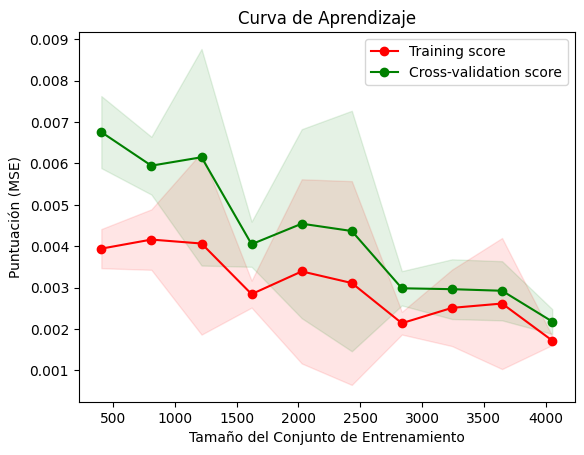

In [ ]:
# Curva de aprendizaje
train_sizes_v2, train_scores_v2, validation_scores_v2 = learning_curve(
    estimator = mejor_estimador_v2, # El estimador obtenido de GridSearchCV
    X = train_X,
    y = train_Y,
    train_sizes = np.linspace(0.1, 1.0, 10),
    cv = k_foldv2, # El objeto de k-fold CV utilizado en GridSearchCV
    scoring = 'neg_mean_squared_error'
)

# Calcula las medias y desviaciones estándar de los scores de entrenamiento y validación
train_scores_mean_v2 = -train_scores_v2.mean(axis = 1)
validation_scores_mean_v2 = -validation_scores_v2.mean(axis = 1)
train_scores_std_v2 = train_scores_v2.std(axis = 1)
validation_scores_std_v2 = validation_scores_v2.std(axis = 1)

# Grafica las curvas de aprendizaje
plt.fill_between(train_sizes_v2, train_scores_mean_v2 - train_scores_std_v2,
                 train_scores_mean_v2 + train_scores_std_v2, alpha=0.1, color="r")
plt.fill_between(train_sizes_v2, validation_scores_mean_v2 - validation_scores_std_v2,
                 validation_scores_mean_v2 + validation_scores_std_v2, alpha=0.1, color="g")
plt.plot(train_sizes_v2, train_scores_mean_v2, 'o-', color="r", label="Training score")
plt.plot(train_sizes_v2, validation_scores_mean_v2, 'o-', color="g", label="Cross-validation score")

plt.title("Curva de Aprendizaje")
plt.xlabel("Tamaño del Conjunto de Entrenamiento")
plt.ylabel("Puntuación (MSE)")
plt.legend(loc="best")
plt.show()

Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0141 - mean_absolute_error: 0.0744
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0097 - mean_absolute_error: 0.0527
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0081 - mean_absolute_error: 0.0526
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0081 - mean_absolute_error: 0.0530
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0067 - mean_absolute_error: 0.0487
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0067 - mean_absolute_error: 0.0485
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0489
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0066 - mean_absolute_error: 0.0507
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0063 - mean_absolute_error: 0.0480
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0056 - mean_absolute_error: 0.0452
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0140 - mean_absolute_error: 0.0722
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0104 - mean_absolute_error: 0.0560
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0083 - mean_absolute_error: 0.0502
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0080 - mean_absolute_error: 0.0493
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0072 - mean_absolute_error: 0.0515
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0072 - mean_absolute_error: 0.0513
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0071 - mean_absolute_error: 0.0543
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0053 - mean_absolute_error: 0.0435
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0057 - mean_absolute_error: 0.0430
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0059 - mean_absolute_error: 0.0451
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0126 - mean_absolute_error: 0.0703
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0096 - mean_absolute_error: 0.0513
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0092 - mean_absolute_error: 0.0499
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0088 - mean_absolute_error: 0.0529
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0075 - mean_absolute_error: 0.0497
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0073 - mean_absolute_error: 0.0501
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0063 - mean_absolute_error: 0.0445
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0065 - mean_absolute_error: 0.0477
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0066 - mean_absolute_error: 0.0473
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0066 - mean_absolute_error: 0.0462
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0133 - mean_absolute_error: 0.0749
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0104 - mean_absolute_error: 0.0512
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0103 - mean_absolute_error: 0.0527
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0114 - mean_absolute_error: 0.0548
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0108 - mean_absolute_error: 0.0523
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0106 - mean_absolute_error: 0.0529
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0535
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0086 - mean_absolute_error: 0.0476
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0078 - mean_absolute_error: 0.0507
Epoch 10/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0074 - mean_absolute_error: 0.0489
Epoch 11/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.0141 - mean_absolute_error: 0.0728
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0089 - mean_absolute_error: 0.0491
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0074 - mean_absolute_error: 0.0497
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0077 - mean_absolute_error: 0.0530
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0062 - mean_absolute_error: 0.0480
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0056 - mean_absolute_error: 0.0459
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0492
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0054 - mean_absolute_error: 0.0465
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0060 - mean_absolute_error: 0.0471
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0054 - mean_absolute_error: 0.0449
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 0.0127 - mean_absolute_error: 0.0672
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0097 - mean_absolute_error: 0.0528
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0088 - mean_absolute_error: 0.0500
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0482
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0067 - mean_absolute_error: 0.0488
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0065 - mean_absolute_error: 0.0474
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0062 - mean_absolute_error: 0.0468
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0488
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0066 - mean_absolute_error: 0.0500
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0063 - mean_absolute_error: 0.0482
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0252 - mean_absolute_error: 0.1139
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0093 - mean_absolute_error: 0.0469
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0100 - mean_absolute_error: 0.0562
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0084 - mean_absolute_error: 0.0494
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0102 - mean_absolute_error: 0.0542
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0081 - mean_absolute_error: 0.0484
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0082 - mean_absolute_error: 0.0485
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0080 - mean_absolute_error: 0.0501
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0072 - mean_absolute_error: 0.0489
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0063 - mean_absolute_error: 0.0468
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0129 - mean_absolute_error: 0.0727
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0099 - mean_absolute_error: 0.0490
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0496
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0086 - mean_absolute_error: 0.0495
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0496
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0530
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0485
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0083 - mean_absolute_error: 0.0495
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0070 - mean_absolute_error: 0.0493
Epoch 10/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0063 - mean_absolute_error: 0.0476
Epoch 11/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.0106 - mean_absolute_error: 0.0561
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0066 - mean_absolute_error: 0.0462
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0077 - mean_absolute_error: 0.0511
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0069 - mean_absolute_error: 0.0502
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0065 - mean_absolute_error: 0.0500
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0076 - mean_absolute_error: 0.0539
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0462
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0060 - mean_absolute_error: 0.0485
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0057 - mean_absolute_error: 0.0469
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0054 - mean_absolute_error: 0.0431
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0107 - mean_absolute_error: 0.0623
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0093 - mean_absolute_error: 0.0532
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0082 - mean_absolute_error: 0.0479
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0071 - mean_absolute_error: 0.0479
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0067 - mean_absolute_error: 0.0491
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0066 - mean_absolute_error: 0.0487
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0068 - mean_absolute_error: 0.0479
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0065 - mean_absolute_error: 0.0467
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0060 - mean_absolute_error: 0.0481
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0057 - mean_absolute_error: 0.0463
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0195 - mean_absolute_error: 0.0992
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0089 - mean_absolute_error: 0.0514
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0094 - mean_absolute_error: 0.0485
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0096 - mean_absolute_error: 0.0512
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0090 - mean_absolute_error: 0.0482
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0089 - mean_absolute_error: 0.0505
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0098 - mean_absolute_error: 0.0526
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0102 - mean_absolute_error: 0.0537
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0098 - mean_absolute_error: 0.0528
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0086 - mean_absolute_error: 0.0490
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0120 - mean_absolute_error: 0.0635
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0098 - mean_absolute_error: 0.0484
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0525
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0501
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0095 - mean_absolute_error: 0.0479
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0074 - mean_absolute_error: 0.0458
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0079 - mean_absolute_error: 0.0530
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0064 - mean_absolute_error: 0.0473
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0078 - mean_absolute_error: 0.0531
Epoch 10/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0067 - mean_absolute_error: 0.0460
Epoch 11/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0108 - mean_absolute_error: 0.0616
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0080 - mean_absolute_error: 0.0462
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0072 - mean_absolute_error: 0.0474
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0077 - mean_absolute_error: 0.0480
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0060 - mean_absolute_error: 0.0474
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0058 - mean_absolute_error: 0.0454
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0062 - mean_absolute_error: 0.0456
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0058 - mean_absolute_error: 0.0446
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0052 - mean_absolute_error: 0.0416
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0046 - mean_absolute_error: 0.0395
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0145 - mean_absolute_error: 0.0771
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0089 - mean_absolute_error: 0.0484
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0087 - mean_absolute_error: 0.0481
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0080 - mean_absolute_error: 0.0453
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0071 - mean_absolute_error: 0.0474
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0067 - mean_absolute_error: 0.0486
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0064 - mean_absolute_error: 0.0462
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0059 - mean_absolute_error: 0.0457
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0059 - mean_absolute_error: 0.0447
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0060 - mean_absolute_error: 0.0464
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.0117 - mean_absolute_error: 0.0653
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0085 - mean_absolute_error: 0.0484
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0089 - mean_absolute_error: 0.0502
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0096 - mean_absolute_error: 0.0483
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0071 - mean_absolute_error: 0.0469
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0064 - mean_absolute_error: 0.0479
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0071 - mean_absolute_error: 0.0496
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0065 - mean_absolute_error: 0.0450
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0058 - mean_absolute_error: 0.0431
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0059 - mean_absolute_error: 0.0462
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0316 - mean_absolute_error: 0.1392
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0105 - mean_absolute_error: 0.0508
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0088 - mean_absolute_error: 0.0476
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0543
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0083 - mean_absolute_error: 0.0480
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0497
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0082 - mean_absolute_error: 0.0471
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0491
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0087 - mean_absolute_error: 0.0487
Epoch 10/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0526
Epoch 11/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - loss: 0.0120 - mean_absolute_error: 0.0627
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0092 - mean_absolute_error: 0.0510
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0078 - mean_absolute_error: 0.0516
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0072 - mean_absolute_error: 0.0496
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0064 - mean_absolute_error: 0.0479
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0074 - mean_absolute_error: 0.0489
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0056 - mean_absolute_error: 0.0457
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - loss: 0.0054 - mean_absolute_error: 0.0445
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0055 - mean_absolute_error: 0.0452
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.0051 - mean_absolute_error: 0.0412
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0142 - mean_absolute_error: 0.0765
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0099 - mean_absolute_error: 0.0527
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0093 - mean_absolute_error: 0.0525
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0078 - mean_absolute_error: 0.0538
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0067 - mean_absolute_error: 0.0470
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0060 - mean_absolute_error: 0.0445
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0060 - mean_absolute_error: 0.0453
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0060 - mean_absolute_error: 0.0469
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0064 - mean_absolute_error: 0.0471
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0059 - mean_absolute_error: 0.0464
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.0227 - mean_absolute_error: 0.1060
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.0093 - mean_absolute_error: 0.0487
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0088 - mean_absolute_error: 0.0508
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0100 - mean_absolute_error: 0.0557
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0093 - mean_absolute_error: 0.0485
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0090 - mean_absolute_error: 0.0482
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0089 - mean_absolute_error: 0.0492
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0079 - mean_absolute_error: 0.0504
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0077 - mean_absolute_error: 0.0491
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0065 - mean_absolute_error: 0.0472
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0150 - mean_absolute_error: 0.0797
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0101 - mean_absolute_error: 0.0608
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0101 - mean_absolute_error: 0.0574
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0505
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0098 - mean_absolute_error: 0.0493
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0496
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0083 - mean_absolute_error: 0.0500
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0086 - mean_absolute_error: 0.0465
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0099 - mean_absolute_error: 0.0558
Epoch 10/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0087 - mean_absolute_error: 0.0504
Epoch 11/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0

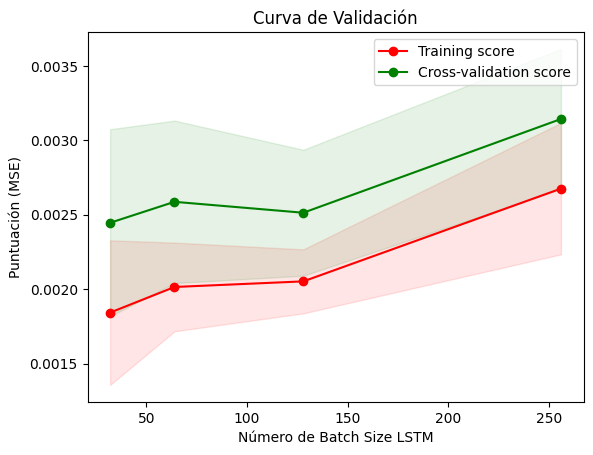

In [ ]:
# Curva de validación con el hiperparámetro 'batch_size'
param_range_v2 = parameters_v2['batch_size']
train_scorescur_v2, test_scorescur_v2 = validation_curve(
    estimator = mejor_estimador_v2,
    X = train_X,
    y = train_Y,
    param_name = "batch_size",
    param_range = param_range_v2,
    cv = k_foldv2,
    scoring = "neg_mean_squared_error"
)

# Calcula las medias y desviaciones estándar y grafica la curva de validación
train_scorescur_mean_v2 = -train_scorescur_v2.mean(axis = 1)
test_scorescur_mean_v2 = -test_scorescur_v2.mean(axis = 1)
train_scorescur_std_v2 = train_scorescur_v2.std(axis = 1)
test_scorescur_std_v2 = test_scorescur_v2.std(axis = 1)

plt.fill_between(param_range_v2, train_scorescur_mean_v2 - train_scorescur_std_v2,
                 train_scorescur_mean_v2 + train_scorescur_std_v2, alpha=0.1, color = "r")
plt.fill_between(param_range_v2, test_scorescur_mean_v2 - test_scorescur_std_v2,
                 test_scorescur_mean_v2 + test_scorescur_std_v2, alpha=0.1, color = "g")
plt.plot(param_range_v2, train_scorescur_mean_v2, 'o-', color = "r", label="Training score")
plt.plot(param_range_v2, test_scorescur_mean_v2, 'o-', color = "g", label="Cross-validation score")

plt.title("Curva de Validación")
plt.xlabel("Número de Batch Size LSTM")
plt.ylabel("Puntuación (MSE)")
plt.legend(loc="best")
plt.show()

### 5.3.2 Entrenamiento del modelo con parametros finales.

En este punto nos ocupamos de entrenar el modelo definido en el punto anterior con los mejores hiper-parámetros obtenidos en este punto.

In [30]:
# Definimos el modelo LSTM
def best_LSTM_v2():
    modelo = Sequential()
    modelo.add(LSTM(50, return_sequences = True, activation='tanh', input_shape=(train_X.shape[1], train_X.shape[2])))
    modelo.add(LSTM(units = 50))
    modelo.add(Dense(1))
    return modelo

In [31]:
# Instanciamos el modelo
best_modelo_v2 = best_LSTM_v2()

# Mostramos el resumen del modelo
best_modelo_v2.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_4 (LSTM)               (None, 288, 50)           10800     
                                                                 
 lstm_5 (LSTM)               (None, 50)                20200     
                                                                 
 dense_2 (Dense)             (None, 1)                 51        
                                                                 
Total params: 31051 (121.29 KB)
Trainable params: 31051 (121.29 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [32]:
# Compilamos el modelo
best_modelo_v2.compile(optimizer = 'adam', loss = 'mean_squared_error', metrics = ['mean_absolute_error'])

# Entrenamos el modelo
best_modelo_v2.fit(train_X, train_Y, epochs = 100, batch_size = 64, verbose = 1)

Epoch 1/100
80/80 [==============================] - 4s 19ms/step - loss: 0.0100 - mean_absolute_error: 0.0538
Epoch 2/100
80/80 [==============================] - 1s 17ms/step - loss: 0.0096 - mean_absolute_error: 0.0523
Epoch 3/100
80/80 [==============================] - 1s 17ms/step - loss: 0.0085 - mean_absolute_error: 0.0511
Epoch 4/100
80/80 [==============================] - 1s 17ms/step - loss: 0.0072 - mean_absolute_error: 0.0495
Epoch 5/100
80/80 [==============================] - 1s 18ms/step - loss: 0.0070 - mean_absolute_error: 0.0500
Epoch 6/100
80/80 [==============================] - 1s 18ms/step - loss: 0.0065 - mean_absolute_error: 0.0485
Epoch 7/100
80/80 [==============================] - 1s 18ms/step - loss: 0.0061 - mean_absolute_error: 0.0478
Epoch 8/100
80/80 [==============================] - 1s 17ms/step - loss: 0.0059 - mean_absolute_error: 0.0463
Epoch 9/100
80/80 [==============================] - 1s 17ms/step - loss: 0.0060 - mean_absolute_error: 0.0464
E

In [33]:
# Guardamos el modelo completo
best_modelo_v2.save(os.path.join(rutaML, 'LSTM_best_v2.keras'))

In [34]:
# Evaluamos el modelo con el conjunto de prueba
test_loss_v2, test_mae_v2 = best_modelo_v2.evaluate(test_X, test_Y)

print(f'La pérdida en el conjunto de prueba es: {test_loss_v2}')

40/40 [==============================] - 1s 12ms/step - loss: 0.0031 - mean_absolute_error: 0.0323
La pérdida en el conjunto de prueba es: 0.0031324035953730345


In [35]:
# Se realiza la predicción del modelo
best_train_predic_v2 = best_modelo_v2.predict(train_X)
best_test_predic_v2 = best_modelo_v2.predict(test_X)

# Se calcula la metrica MSE
best_train_mse_v2 = mean_squared_error(train_Y, best_train_predic_v2)
best_test_mse_v2 = mean_squared_error(test_Y, best_test_predic_v2)
print(f'Train MSE: {best_train_mse_v2}, Test MSE: {best_test_mse_v2}')

# Se calcula la metrica MAE
best_train_mae_v2 = mean_absolute_error(train_Y, best_train_predic_v2)
best_test_mae_v2 = mean_absolute_error(test_Y, best_test_predic_v2)
print(f'Train MAE: {best_train_mae_v2}, Test MAE: {best_test_mae_v2}')

# Se calcula la metrica RMSE
best_train_rmse_v2 = np.sqrt(best_train_mse_v2)
best_test_rmse_v2 = np.sqrt(best_test_mse_v2)
print(f'Train RMSE: {best_train_rmse_v2}, Test RMSE: {best_test_rmse_v2}')

40/40 [==============================] - 0s 8ms/step
Train MSE: 0.0022568312340653686, Test MSE: 0.0031324038058388464
Train MAE: 0.02957005469044166, Test MAE: 0.0323219852690483
Train RMSE: 0.04750611785933859, Test RMSE: 0.05596788191310125


In [36]:
metricsv2_df = pd.DataFrame(data=[['Train', round(best_train_mse_v2, 5), round(best_train_mae_v2, 5), round(best_train_rmse_v2, 5)],
                                    ['Test', round(best_test_mse_v2, 5), round(best_test_mae_v2, 5), round(best_test_rmse_v2, 5)]], columns=['LSTM v2','MSE', 'MAE','RMSE'])

metricsv2_df.set_index('LSTM v2', inplace=True)
metricsv2_df

,MSE,MAE,RMSE
LSTM v2,,,
Train,0.00226,0.02957,0.04751
Test,0.00313,0.03232,0.05597


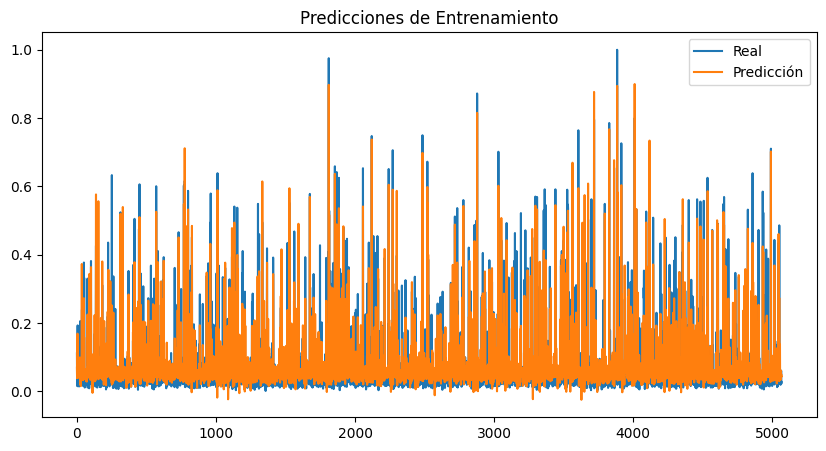

In [37]:
# Dibujamos los valores reales vs. las predicciones de entrenamiento
plt.figure(figsize=(10,5))
plt.plot(train_Y, label='Real')
plt.plot(best_train_predic_v2, label='Predicción')
plt.title('Predicciones de Entrenamiento')
plt.legend()
plt.show()

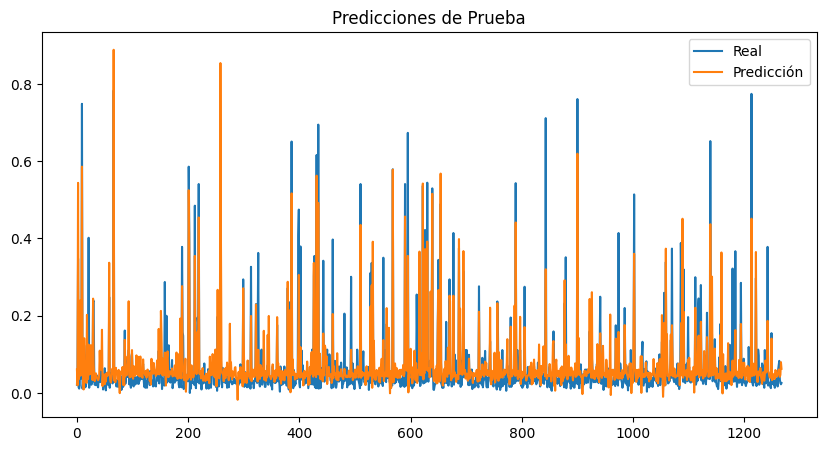

In [38]:
# Dibujamos los valores reales vs. las predicciones de prueba
plt.figure(figsize=(10,5))
plt.plot(test_Y, label='Real')
plt.plot(best_test_predic_v2, label='Predicción')
plt.title('Predicciones de Prueba')
plt.legend()
plt.show()

## 5.4 Generación de modelo LSTM v3. Se añaden capas al modelo LSTM v2.

### 5.4.1 Modificación del modelo LSTM

In [39]:
# Reajustamos nuestro modelo añadiendo una capa de regularización, otra capa LSTM con más unidades y una capa Dense antes de la salida.
# Definir el modelo LSTM
def modelo_LSTM_v3(optimizer='adam'):
    modelo = Sequential()
    modelo.add(LSTM(50,
                    return_sequences = True,
                    activation='tanh',
                    input_shape=(train_X.shape[1], train_X.shape[2])))
    modelo.add(Dropout(0.2))
    modelo.add(LSTM(100, return_sequences=True, activation='tanh'))
    modelo.add(Dropout(0.2))
    modelo.add(LSTM(units = 50))
    modelo.add(Dense(50, activation='relu'))
    modelo.add(Dense(1))
    modelo.compile(optimizer = optimizer,
                   loss = 'mean_squared_error',
                   metrics = ['mean_absolute_error'])
    return modelo

In [40]:
# Instancia el modelo
modelo_v3 = modelo_LSTM_v3()

# Ahora puedes ver el resumen del modelo
modelo_v3.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_6 (LSTM)               (None, 288, 50)           10800     
                                                                 
 dropout (Dropout)           (None, 288, 50)           0         
                                                                 
 lstm_7 (LSTM)               (None, 288, 100)          60400     
                                                                 
 dropout_1 (Dropout)         (None, 288, 100)          0         
                                                                 
 lstm_8 (LSTM)               (None, 50)                30200     
                                                                 
 dense_3 (Dense)             (None, 50)                2550      
                                                                 
 dense_4 (Dense)             (None, 1)                

### 5.4.2 Busqueda de hiper-parámetros y empleo de validación cruzada.

In [ ]:
# Envolvemos el modelo LSTM con KerasRegressor
grid_LSTMv3_sklearn = KerasRegressor(model = modelo_LSTM_v3, optimizer='adam')

# Creamos e inicializamos una instancia de KFold
k_foldv3 = KFold(n_splits = 5, shuffle = True, random_state = 42)

In [ ]:
# Definimos los hiperparametros que queremos utilizar
parameters_v3 = {'optimizer' : ['Adam','RMSprop', 'Adadelta'],
                 'batch_size' : [32, 64, 128, 256],
                 'epochs' : [10, 25, 50, 75, 100]}

grid_search_v3 = GridSearchCV(estimator = grid_LSTMv3_sklearn,
                              param_grid = parameters_v3,
                              cv = k_foldv3,
                              scoring = 'neg_mean_squared_error')

In [ ]:
grid_search_v3.fit(train_X, train_Y)

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - loss: 0.0096 - mean_absolute_error: 0.0539
Epoch 2/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0105 - mean_absolute_error: 0.0542
Epoch 3/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0073 - mean_absolute_error: 0.0469
Epoch 4/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0085 - mean_absolute_error: 0.0492
Epoch 5/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0076 - mean_absolute_error: 0.0471
Epoch 6/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0074 - mean_absolute_error: 0.0477
Epoch 7/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0064 - mean_absolute_error: 0.0418
Epoch 8/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0063 - mean_absolute_error: 0.0428
Epoch 9/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0065 - mean_absolute_error: 0.0422
Epoch 10/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0067 - mean_absolute_error: 0.0411
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 0.0096 - mean_absolute_error: 0.0544
Epoch 2/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0099 - mean_absolute_error: 0.0528
Epoch 3/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0088 - mean_absolute_error: 0.0531
Epoch 4/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0073 - mean_absolute_error: 0.0466
Epoch 5/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0056 - mean_absolute_error: 0.0428
Epoch 6/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0066 - mean_absolute_error: 0.0460
Epoch 7/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0061 - mean_absolute_error: 0.0416
Epoch 8/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0062 - mean_absolute_error: 0.0416
Epoch 9/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0055 - mean_absolute_error: 0.0392
Epoch 10/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0062 - mean_absolute_error: 0.0433
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0102 - mean_absolute_error: 0.0553
Epoch 2/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0505
Epoch 3/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0103 - mean_absolute_error: 0.0529
Epoch 4/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0513
Epoch 5/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0514
Epoch 6/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0077 - mean_absolute_error: 0.0481
Epoch 7/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0069 - mean_absolute_error: 0.0454
Epoch 8/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0063 - mean_absolute_error: 0.0415
Epoch 9/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0068 - mean_absolute_error: 0.0444
Epoch 10/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0063 - mean_absolute_error: 0.0406
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 0.0102 - mean_absolute_error: 0.0571
Epoch 2/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0100 - mean_absolute_error: 0.0536
Epoch 3/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0521
Epoch 4/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0072 - mean_absolute_error: 0.0475
Epoch 5/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0072 - mean_absolute_error: 0.0467
Epoch 6/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0062 - mean_absolute_error: 0.0419
Epoch 7/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0060 - mean_absolute_error: 0.0419
Epoch 8/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0075 - mean_absolute_error: 0.0443
Epoch 9/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0066 - mean_absolute_error: 0.0446
Epoch 10/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0058 - mean_absolute_error: 0.0421
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.0112 - mean_absolute_error: 0.0582
Epoch 2/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0084 - mean_absolute_error: 0.0485
Epoch 3/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0094 - mean_absolute_error: 0.0539
Epoch 4/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0074 - mean_absolute_error: 0.0474
Epoch 5/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0064 - mean_absolute_error: 0.0422
Epoch 6/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0060 - mean_absolute_error: 0.0426
Epoch 7/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.0053 - mean_absolute_error: 0.0379
Epoch 8/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0063 - mean_absolute_error: 0.0434
Epoch 9/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0065 - mean_absolute_error: 0.0433
Epoch 10/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.0050 - mean_absolute_error: 0.0372
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0104 - mean_absolute_error: 0.0558
Epoch 2/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0100 - mean_absolute_error: 0.0520
Epoch 3/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0101 - mean_absolute_error: 0.0553
Epoch 4/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0079 - mean_absolute_error: 0.0497
Epoch 5/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0076 - mean_absolute_error: 0.0496
Epoch 6/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0071 - mean_absolute_error: 0.0462
Epoch 7/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0059 - mean_absolute_error: 0.0417
Epoch 8/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0063 - mean_absolute_error: 0.0427
Epoch 9/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0064 - mean_absolute_error: 0.0428
Epoch 10/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0065 - mean_absolute_error: 0.0422
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0105 - mean_absolute_error: 0.0572
Epoch 2/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0095 - mean_absolute_error: 0.0519
Epoch 3/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0556
Epoch 4/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0079 - mean_absolute_error: 0.0498
Epoch 5/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0086 - mean_absolute_error: 0.0532
Epoch 6/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0068 - mean_absolute_error: 0.0440
Epoch 7/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0063 - mean_absolute_error: 0.0421
Epoch 8/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0056 - mean_absolute_error: 0.0404
Epoch 9/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0056 - mean_absolute_error: 0.0409
Epoch 10/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0062 - mean_absolute_error: 0.0415
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0108 - mean_absolute_error: 0.0544
Epoch 2/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0098 - mean_absolute_error: 0.0534
Epoch 3/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0097 - mean_absolute_error: 0.0551
Epoch 4/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0085 - mean_absolute_error: 0.0513
Epoch 5/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0088 - mean_absolute_error: 0.0545
Epoch 6/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0065 - mean_absolute_error: 0.0436
Epoch 7/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0052 - mean_absolute_error: 0.0390
Epoch 8/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0064 - mean_absolute_error: 0.0434
Epoch 9/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0056 - mean_absolute_error: 0.0400
Epoch 10/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0061 - mean_absolute_error: 0.0395
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0097 - mean_absolute_error: 0.0559
Epoch 2/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0084 - mean_absolute_error: 0.0501
Epoch 3/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0068 - mean_absolute_error: 0.0455
Epoch 4/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0063 - mean_absolute_error: 0.0429
Epoch 5/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0065 - mean_absolute_error: 0.0391
Epoch 6/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0058 - mean_absolute_error: 0.0423
Epoch 7/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0058 - mean_absolute_error: 0.0395
Epoch 8/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0057 - mean_absolute_error: 0.0397
Epoch 9/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0068 - mean_absolute_error: 0.0435
Epoch 10/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0062 - mean_absolute_error: 0.0407
32/32 ━━━━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0113 - mean_absolute_error: 0.0593
Epoch 2/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0507
Epoch 3/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0101 - mean_absolute_error: 0.0557
Epoch 4/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0080 - mean_absolute_error: 0.0502
Epoch 5/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0068 - mean_absolute_error: 0.0453
Epoch 6/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0063 - mean_absolute_error: 0.0408
Epoch 7/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0063 - mean_absolute_error: 0.0414
Epoch 8/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0057 - mean_absolute_error: 0.0402
Epoch 9/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0063 - mean_absolute_error: 0.0418
Epoch 10/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0060 - mean_absolute_error: 0.0410
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.0105 - mean_absolute_error: 0.0558
Epoch 2/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0105 - mean_absolute_error: 0.0547
Epoch 3/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0087 - mean_absolute_error: 0.0524
Epoch 4/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0079 - mean_absolute_error: 0.0466
Epoch 5/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0075 - mean_absolute_error: 0.0457
Epoch 6/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0069 - mean_absolute_error: 0.0461
Epoch 7/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0066 - mean_absolute_error: 0.0419
Epoch 8/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0057 - mean_absolute_error: 0.0398
Epoch 9/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0059 - mean_absolute_error: 0.0401
Epoch 10/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0058 - mean_absolute_error: 0.0396
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0098 - mean_absolute_error: 0.0533
Epoch 2/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0547
Epoch 3/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0081 - mean_absolute_error: 0.0486
Epoch 4/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0076 - mean_absolute_error: 0.0488
Epoch 5/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0067 - mean_absolute_error: 0.0448
Epoch 6/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0065 - mean_absolute_error: 0.0419
Epoch 7/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0054 - mean_absolute_error: 0.0393
Epoch 8/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0062 - mean_absolute_error: 0.0409
Epoch 9/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0056 - mean_absolute_error: 0.0401
Epoch 10/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0051 - mean_absolute_error: 0.0368
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0096 - mean_absolute_error: 0.0533
Epoch 2/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0082 - mean_absolute_error: 0.0469
Epoch 3/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0495
Epoch 4/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0106 - mean_absolute_error: 0.0548
Epoch 5/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0078 - mean_absolute_error: 0.0477
Epoch 6/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0074 - mean_absolute_error: 0.0479
Epoch 7/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0071 - mean_absolute_error: 0.0457
Epoch 8/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0061 - mean_absolute_error: 0.0413
Epoch 9/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0068 - mean_absolute_error: 0.0434
Epoch 10/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0060 - mean_absolute_error: 0.0412
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0097 - mean_absolute_error: 0.0554
Epoch 2/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0504
Epoch 3/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0098 - mean_absolute_error: 0.0542
Epoch 4/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0069 - mean_absolute_error: 0.0457
Epoch 5/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0071 - mean_absolute_error: 0.0461
Epoch 6/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0062 - mean_absolute_error: 0.0421
Epoch 7/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0063 - mean_absolute_error: 0.0431
Epoch 8/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0059 - mean_absolute_error: 0.0389
Epoch 9/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0056 - mean_absolute_error: 0.0385
Epoch 10/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0058 - mean_absolute_error: 0.0387
32/32 ━━━━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0110 - mean_absolute_error: 0.0600
Epoch 2/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0100 - mean_absolute_error: 0.0533
Epoch 3/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0536
Epoch 4/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0067 - mean_absolute_error: 0.0459
Epoch 5/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0069 - mean_absolute_error: 0.0451
Epoch 6/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0064 - mean_absolute_error: 0.0428
Epoch 7/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0073 - mean_absolute_error: 0.0472
Epoch 8/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0052 - mean_absolute_error: 0.0383
Epoch 9/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0058 - mean_absolute_error: 0.0401
Epoch 10/10
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0057 - mean_absolute_error: 0.0405
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0107 - mean_absolute_error: 0.0571
Epoch 2/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0106 - mean_absolute_error: 0.0539
Epoch 3/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0104 - mean_absolute_error: 0.0563
Epoch 4/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0079 - mean_absolute_error: 0.0482
Epoch 5/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0077 - mean_absolute_error: 0.0469
Epoch 6/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0080 - mean_absolute_error: 0.0504
Epoch 7/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0081 - mean_absolute_error: 0.0446
Epoch 8/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0066 - mean_absolute_error: 0.0428
Epoch 9/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0062 - mean_absolute_error: 0.0411
Epoch 10/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0059 - mean_absolute_error: 0.0407
Epoch 11/25
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0112 - mean_absolute_error: 0.0562
Epoch 2/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0508
Epoch 3/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0104 - mean_absolute_error: 0.0547
Epoch 4/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0072 - mean_absolute_error: 0.0475
Epoch 5/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0067 - mean_absolute_error: 0.0437
Epoch 6/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0063 - mean_absolute_error: 0.0421
Epoch 7/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0065 - mean_absolute_error: 0.0421
Epoch 8/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 0.0066 - mean_absolute_error: 0.0424
Epoch 9/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0052 - mean_absolute_error: 0.0372
Epoch 10/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0060 - mean_absolute_error: 0.0407
Epoch 11/25
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0100 - mean_absolute_error: 0.0549
Epoch 2/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0494
Epoch 3/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0083 - mean_absolute_error: 0.0497
Epoch 4/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0080 - mean_absolute_error: 0.0495
Epoch 5/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0057 - mean_absolute_error: 0.0391
Epoch 6/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0073 - mean_absolute_error: 0.0455
Epoch 7/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0062 - mean_absolute_error: 0.0407
Epoch 8/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0068 - mean_absolute_error: 0.0421
Epoch 9/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0062 - mean_absolute_error: 0.0400
Epoch 10/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0056 - mean_absolute_error: 0.0385
Epoch 11/25
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0105 - mean_absolute_error: 0.0539
Epoch 2/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0088 - mean_absolute_error: 0.0489
Epoch 3/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0087 - mean_absolute_error: 0.0520
Epoch 4/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0081 - mean_absolute_error: 0.0498
Epoch 5/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0071 - mean_absolute_error: 0.0462
Epoch 6/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0071 - mean_absolute_error: 0.0437
Epoch 7/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0064 - mean_absolute_error: 0.0411
Epoch 8/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0060 - mean_absolute_error: 0.0401
Epoch 9/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0057 - mean_absolute_error: 0.0391
Epoch 10/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0061 - mean_absolute_error: 0.0413
Epoch 11/25
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0097 - mean_absolute_error: 0.0560
Epoch 2/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0080 - mean_absolute_error: 0.0459
Epoch 3/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0541
Epoch 4/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0084 - mean_absolute_error: 0.0499
Epoch 5/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0070 - mean_absolute_error: 0.0468
Epoch 6/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0071 - mean_absolute_error: 0.0462
Epoch 7/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0054 - mean_absolute_error: 0.0388
Epoch 8/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0063 - mean_absolute_error: 0.0424
Epoch 9/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0061 - mean_absolute_error: 0.0428
Epoch 10/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0064 - mean_absolute_error: 0.0421
Epoch 11/25
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0111 - mean_absolute_error: 0.0567
Epoch 2/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0098 - mean_absolute_error: 0.0510
Epoch 3/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0106 - mean_absolute_error: 0.0530
Epoch 4/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0540
Epoch 5/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0087 - mean_absolute_error: 0.0535
Epoch 6/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0088 - mean_absolute_error: 0.0500
Epoch 7/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0071 - mean_absolute_error: 0.0465
Epoch 8/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0057 - mean_absolute_error: 0.0411
Epoch 9/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0060 - mean_absolute_error: 0.0418
Epoch 10/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0063 - mean_absolute_error: 0.0418
Epoch 11/25
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0103 - mean_absolute_error: 0.0580
Epoch 2/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0497
Epoch 3/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0529
Epoch 4/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0102 - mean_absolute_error: 0.0554
Epoch 5/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0078 - mean_absolute_error: 0.0498
Epoch 6/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0073 - mean_absolute_error: 0.0463
Epoch 7/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0062 - mean_absolute_error: 0.0419
Epoch 8/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0063 - mean_absolute_error: 0.0432
Epoch 9/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0057 - mean_absolute_error: 0.0406
Epoch 10/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0058 - mean_absolute_error: 0.0393
Epoch 11/25
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.0100 - mean_absolute_error: 0.0538
Epoch 2/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0537
Epoch 3/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0078 - mean_absolute_error: 0.0504
Epoch 4/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0070 - mean_absolute_error: 0.0463
Epoch 5/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0072 - mean_absolute_error: 0.0449
Epoch 6/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0059 - mean_absolute_error: 0.0406
Epoch 7/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0056 - mean_absolute_error: 0.0393
Epoch 8/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0061 - mean_absolute_error: 0.0405
Epoch 9/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0065 - mean_absolute_error: 0.0461
Epoch 10/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0057 - mean_absolute_error: 0.0398
Epoch 11/25
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0098 - mean_absolute_error: 0.0544
Epoch 2/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0502
Epoch 3/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0090 - mean_absolute_error: 0.0513
Epoch 4/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0071 - mean_absolute_error: 0.0449
Epoch 5/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0071 - mean_absolute_error: 0.0458
Epoch 6/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0071 - mean_absolute_error: 0.0449
Epoch 7/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0059 - mean_absolute_error: 0.0408
Epoch 8/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0063 - mean_absolute_error: 0.0417
Epoch 9/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0064 - mean_absolute_error: 0.0424
Epoch 10/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0054 - mean_absolute_error: 0.0402
Epoch 11/25
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0108 - mean_absolute_error: 0.0579
Epoch 2/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0088 - mean_absolute_error: 0.0511
Epoch 3/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0078 - mean_absolute_error: 0.0497
Epoch 4/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0083 - mean_absolute_error: 0.0531
Epoch 5/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0072 - mean_absolute_error: 0.0455
Epoch 6/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0071 - mean_absolute_error: 0.0446
Epoch 7/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0069 - mean_absolute_error: 0.0452
Epoch 8/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0060 - mean_absolute_error: 0.0406
Epoch 9/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0062 - mean_absolute_error: 0.0420
Epoch 10/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0057 - mean_absolute_error: 0.0405
Epoch 11/25
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0118 - mean_absolute_error: 0.0585
Epoch 2/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0100 - mean_absolute_error: 0.0532
Epoch 3/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0101 - mean_absolute_error: 0.0549
Epoch 4/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0104 - mean_absolute_error: 0.0553
Epoch 5/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0070 - mean_absolute_error: 0.0452
Epoch 6/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0073 - mean_absolute_error: 0.0435
Epoch 7/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0063 - mean_absolute_error: 0.0423
Epoch 8/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0066 - mean_absolute_error: 0.0426
Epoch 9/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0057 - mean_absolute_error: 0.0406
Epoch 10/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0050 - mean_absolute_error: 0.0364
Epoch 11/25
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0116 - mean_absolute_error: 0.0600
Epoch 2/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0091 - mean_absolute_error: 0.0512
Epoch 3/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0515
Epoch 4/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0097 - mean_absolute_error: 0.0536
Epoch 5/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0094 - mean_absolute_error: 0.0504
Epoch 6/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0084 - mean_absolute_error: 0.0488
Epoch 7/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0084 - mean_absolute_error: 0.0519
Epoch 8/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0084 - mean_absolute_error: 0.0502
Epoch 9/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0074 - mean_absolute_error: 0.0490
Epoch 10/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0066 - mean_absolute_error: 0.0438
Epoch 11/25
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.0093 - mean_absolute_error: 0.0526
Epoch 2/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0101 - mean_absolute_error: 0.0515
Epoch 3/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0101 - mean_absolute_error: 0.0535
Epoch 4/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0080 - mean_absolute_error: 0.0506
Epoch 5/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0063 - mean_absolute_error: 0.0449
Epoch 6/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0069 - mean_absolute_error: 0.0440
Epoch 7/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0061 - mean_absolute_error: 0.0411
Epoch 8/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0047 - mean_absolute_error: 0.0354
Epoch 9/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0059 - mean_absolute_error: 0.0390
Epoch 10/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0053 - mean_absolute_error: 0.0385
Epoch 11/25
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0103 - mean_absolute_error: 0.0541
Epoch 2/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0099 - mean_absolute_error: 0.0519
Epoch 3/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0499
Epoch 4/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0082 - mean_absolute_error: 0.0495
Epoch 5/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0081 - mean_absolute_error: 0.0480
Epoch 6/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0070 - mean_absolute_error: 0.0438
Epoch 7/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0061 - mean_absolute_error: 0.0413
Epoch 8/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0068 - mean_absolute_error: 0.0427
Epoch 9/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0065 - mean_absolute_error: 0.0435
Epoch 10/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0062 - mean_absolute_error: 0.0423
Epoch 11/25
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0100 - mean_absolute_error: 0.0569
Epoch 2/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0096 - mean_absolute_error: 0.0524
Epoch 3/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0088 - mean_absolute_error: 0.0493
Epoch 4/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0069 - mean_absolute_error: 0.0471
Epoch 5/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0066 - mean_absolute_error: 0.0459
Epoch 6/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0067 - mean_absolute_error: 0.0442
Epoch 7/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0063 - mean_absolute_error: 0.0426
Epoch 8/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0063 - mean_absolute_error: 0.0399
Epoch 9/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0065 - mean_absolute_error: 0.0433
Epoch 10/25
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0068 - mean_absolute_error: 0.0434
Epoch 11/25
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.0103 - mean_absolute_error: 0.0552
Epoch 2/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0102 - mean_absolute_error: 0.0525
Epoch 3/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0506
Epoch 4/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0512
Epoch 5/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0070 - mean_absolute_error: 0.0473
Epoch 6/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0072 - mean_absolute_error: 0.0476
Epoch 7/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0057 - mean_absolute_error: 0.0404
Epoch 8/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0063 - mean_absolute_error: 0.0401
Epoch 9/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0058 - mean_absolute_error: 0.0400
Epoch 10/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0059 - mean_absolute_error: 0.0390
Epoch 11/50
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0093 - mean_absolute_error: 0.0515
Epoch 2/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0104 - mean_absolute_error: 0.0535
Epoch 3/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0100 - mean_absolute_error: 0.0562
Epoch 4/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0078 - mean_absolute_error: 0.0497
Epoch 5/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0074 - mean_absolute_error: 0.0478
Epoch 6/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0063 - mean_absolute_error: 0.0448
Epoch 7/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0057 - mean_absolute_error: 0.0400
Epoch 8/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0058 - mean_absolute_error: 0.0412
Epoch 9/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0056 - mean_absolute_error: 0.0403
Epoch 10/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0054 - mean_absolute_error: 0.0394
Epoch 11/50
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.0114 - mean_absolute_error: 0.0599
Epoch 2/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0512
Epoch 3/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0084 - mean_absolute_error: 0.0516
Epoch 4/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0073 - mean_absolute_error: 0.0477
Epoch 5/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0068 - mean_absolute_error: 0.0442
Epoch 6/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0076 - mean_absolute_error: 0.0448
Epoch 7/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0066 - mean_absolute_error: 0.0414
Epoch 8/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0049 - mean_absolute_error: 0.0365
Epoch 9/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0052 - mean_absolute_error: 0.0383
Epoch 10/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0055 - mean_absolute_error: 0.0370
Epoch 11/50
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0097 - mean_absolute_error: 0.0536
Epoch 2/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0095 - mean_absolute_error: 0.0509
Epoch 3/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0080 - mean_absolute_error: 0.0478
Epoch 4/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0089 - mean_absolute_error: 0.0505
Epoch 5/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0064 - mean_absolute_error: 0.0426
Epoch 6/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0065 - mean_absolute_error: 0.0448
Epoch 7/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0069 - mean_absolute_error: 0.0446
Epoch 8/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0066 - mean_absolute_error: 0.0419
Epoch 9/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0058 - mean_absolute_error: 0.0390
Epoch 10/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0069 - mean_absolute_error: 0.0439
Epoch 11/50
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0097 - mean_absolute_error: 0.0539
Epoch 2/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0504
Epoch 3/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0094 - mean_absolute_error: 0.0526
Epoch 4/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0086 - mean_absolute_error: 0.0519
Epoch 5/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0075 - mean_absolute_error: 0.0485
Epoch 6/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0064 - mean_absolute_error: 0.0443
Epoch 7/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0059 - mean_absolute_error: 0.0408
Epoch 8/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0062 - mean_absolute_error: 0.0416
Epoch 9/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0060 - mean_absolute_error: 0.0420
Epoch 10/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0057 - mean_absolute_error: 0.0396
Epoch 11/50
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.0116 - mean_absolute_error: 0.0586
Epoch 2/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0107 - mean_absolute_error: 0.0548
Epoch 3/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0115 - mean_absolute_error: 0.0571
Epoch 4/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0084 - mean_absolute_error: 0.0530
Epoch 5/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0081 - mean_absolute_error: 0.0516
Epoch 6/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0065 - mean_absolute_error: 0.0441
Epoch 7/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0065 - mean_absolute_error: 0.0433
Epoch 8/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0067 - mean_absolute_error: 0.0415
Epoch 9/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0067 - mean_absolute_error: 0.0428
Epoch 10/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0055 - mean_absolute_error: 0.0381
Epoch 11/50
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0101 - mean_absolute_error: 0.0562
Epoch 2/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0094 - mean_absolute_error: 0.0523
Epoch 3/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0496
Epoch 4/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0073 - mean_absolute_error: 0.0480
Epoch 5/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0074 - mean_absolute_error: 0.0468
Epoch 6/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0069 - mean_absolute_error: 0.0439
Epoch 7/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0060 - mean_absolute_error: 0.0419
Epoch 8/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0059 - mean_absolute_error: 0.0394
Epoch 9/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0063 - mean_absolute_error: 0.0421
Epoch 10/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0054 - mean_absolute_error: 0.0392
Epoch 11/50
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0111 - mean_absolute_error: 0.0581
Epoch 2/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0510
Epoch 3/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0513
Epoch 4/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0520
Epoch 5/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0086 - mean_absolute_error: 0.0519
Epoch 6/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0080 - mean_absolute_error: 0.0530
Epoch 7/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0080 - mean_absolute_error: 0.0497
Epoch 8/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0067 - mean_absolute_error: 0.0468
Epoch 9/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0066 - mean_absolute_error: 0.0439
Epoch 10/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0061 - mean_absolute_error: 0.0405
Epoch 11/50
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0093 - mean_absolute_error: 0.0525
Epoch 2/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0087 - mean_absolute_error: 0.0493
Epoch 3/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0077 - mean_absolute_error: 0.0477
Epoch 4/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0063 - mean_absolute_error: 0.0433
Epoch 5/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0066 - mean_absolute_error: 0.0434
Epoch 6/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0061 - mean_absolute_error: 0.0410
Epoch 7/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0062 - mean_absolute_error: 0.0421
Epoch 8/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0053 - mean_absolute_error: 0.0386
Epoch 9/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0060 - mean_absolute_error: 0.0398
Epoch 10/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0065 - mean_absolute_error: 0.0421
Epoch 11/50
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0096 - mean_absolute_error: 0.0524
Epoch 2/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0505
Epoch 3/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0077 - mean_absolute_error: 0.0487
Epoch 4/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0080 - mean_absolute_error: 0.0515
Epoch 5/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0073 - mean_absolute_error: 0.0463
Epoch 6/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0077 - mean_absolute_error: 0.0485
Epoch 7/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0061 - mean_absolute_error: 0.0406
Epoch 8/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0061 - mean_absolute_error: 0.0421
Epoch 9/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0053 - mean_absolute_error: 0.0383
Epoch 10/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0057 - mean_absolute_error: 0.0389
Epoch 11/50
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0116 - mean_absolute_error: 0.0609
Epoch 2/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0098 - mean_absolute_error: 0.0525
Epoch 3/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0094 - mean_absolute_error: 0.0548
Epoch 4/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0101 - mean_absolute_error: 0.0526
Epoch 5/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0527
Epoch 6/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0073 - mean_absolute_error: 0.0468
Epoch 7/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0070 - mean_absolute_error: 0.0467
Epoch 8/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0068 - mean_absolute_error: 0.0451
Epoch 9/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0070 - mean_absolute_error: 0.0435
Epoch 10/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0063 - mean_absolute_error: 0.0428
Epoch 11/50
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0115 - mean_absolute_error: 0.0595
Epoch 2/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0095 - mean_absolute_error: 0.0520
Epoch 3/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0086 - mean_absolute_error: 0.0512
Epoch 4/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0074 - mean_absolute_error: 0.0477
Epoch 5/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0073 - mean_absolute_error: 0.0467
Epoch 6/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0063 - mean_absolute_error: 0.0454
Epoch 7/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0064 - mean_absolute_error: 0.0436
Epoch 8/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0052 - mean_absolute_error: 0.0387
Epoch 9/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0082 - mean_absolute_error: 0.0491
Epoch 10/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0054 - mean_absolute_error: 0.0374
Epoch 11/50
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0102 - mean_absolute_error: 0.0556
Epoch 2/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0095 - mean_absolute_error: 0.0523
Epoch 3/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0517
Epoch 4/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0095 - mean_absolute_error: 0.0516
Epoch 5/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0073 - mean_absolute_error: 0.0444
Epoch 6/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0073 - mean_absolute_error: 0.0444
Epoch 7/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0066 - mean_absolute_error: 0.0435
Epoch 8/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0061 - mean_absolute_error: 0.0394
Epoch 9/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0064 - mean_absolute_error: 0.0430
Epoch 10/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0069 - mean_absolute_error: 0.0451
Epoch 11/50
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0096 - mean_absolute_error: 0.0553
Epoch 2/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0095 - mean_absolute_error: 0.0506
Epoch 3/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0080 - mean_absolute_error: 0.0482
Epoch 4/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0071 - mean_absolute_error: 0.0505
Epoch 5/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0064 - mean_absolute_error: 0.0455
Epoch 6/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0070 - mean_absolute_error: 0.0461
Epoch 7/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0065 - mean_absolute_error: 0.0439
Epoch 8/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0055 - mean_absolute_error: 0.0377
Epoch 9/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0057 - mean_absolute_error: 0.0389
Epoch 10/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0059 - mean_absolute_error: 0.0372
Epoch 11/50
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.0106 - mean_absolute_error: 0.0563
Epoch 2/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0105 - mean_absolute_error: 0.0541
Epoch 3/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0550
Epoch 4/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0077 - mean_absolute_error: 0.0494
Epoch 5/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0076 - mean_absolute_error: 0.0500
Epoch 6/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0067 - mean_absolute_error: 0.0433
Epoch 7/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0062 - mean_absolute_error: 0.0419
Epoch 8/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0060 - mean_absolute_error: 0.0402
Epoch 9/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0060 - mean_absolute_error: 0.0405
Epoch 10/50
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0059 - mean_absolute_error: 0.0413
Epoch 11/50
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.0123 - mean_absolute_error: 0.0624
Epoch 2/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0093 - mean_absolute_error: 0.0498
Epoch 3/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0101 - mean_absolute_error: 0.0531
Epoch 4/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0101 - mean_absolute_error: 0.0529
Epoch 5/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0094 - mean_absolute_error: 0.0532
Epoch 6/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0511
Epoch 7/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0075 - mean_absolute_error: 0.0470
Epoch 8/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0062 - mean_absolute_error: 0.0425
Epoch 9/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0061 - mean_absolute_error: 0.0410
Epoch 10/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0080 - mean_absolute_error: 0.0456
Epoch 11/75
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0107 - mean_absolute_error: 0.0589
Epoch 2/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0094 - mean_absolute_error: 0.0504
Epoch 3/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0097 - mean_absolute_error: 0.0541
Epoch 4/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0076 - mean_absolute_error: 0.0511
Epoch 5/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0076 - mean_absolute_error: 0.0459
Epoch 6/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0074 - mean_absolute_error: 0.0463
Epoch 7/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0062 - mean_absolute_error: 0.0410
Epoch 8/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0067 - mean_absolute_error: 0.0427
Epoch 9/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0058 - mean_absolute_error: 0.0409
Epoch 10/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0064 - mean_absolute_error: 0.0424
Epoch 11/75
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.0095 - mean_absolute_error: 0.0522
Epoch 2/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0526
Epoch 3/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0095 - mean_absolute_error: 0.0521
Epoch 4/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0067 - mean_absolute_error: 0.0478
Epoch 5/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0069 - mean_absolute_error: 0.0457
Epoch 6/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0068 - mean_absolute_error: 0.0445
Epoch 7/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0053 - mean_absolute_error: 0.0388
Epoch 8/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0053 - mean_absolute_error: 0.0395
Epoch 9/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0058 - mean_absolute_error: 0.0417
Epoch 10/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0051 - mean_absolute_error: 0.0371
Epoch 11/75
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.0100 - mean_absolute_error: 0.0550
Epoch 2/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0087 - mean_absolute_error: 0.0491
Epoch 3/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0083 - mean_absolute_error: 0.0495
Epoch 4/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0074 - mean_absolute_error: 0.0457
Epoch 5/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0075 - mean_absolute_error: 0.0455
Epoch 6/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0070 - mean_absolute_error: 0.0455
Epoch 7/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0068 - mean_absolute_error: 0.0452
Epoch 8/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0060 - mean_absolute_error: 0.0383
Epoch 9/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0053 - mean_absolute_error: 0.0384
Epoch 10/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0062 - mean_absolute_error: 0.0404
Epoch 11/75
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0094 - mean_absolute_error: 0.0537
Epoch 2/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0080 - mean_absolute_error: 0.0485
Epoch 3/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0530
Epoch 4/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0074 - mean_absolute_error: 0.0485
Epoch 5/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0079 - mean_absolute_error: 0.0486
Epoch 6/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0078 - mean_absolute_error: 0.0477
Epoch 7/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0063 - mean_absolute_error: 0.0414
Epoch 8/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0060 - mean_absolute_error: 0.0389
Epoch 9/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0067 - mean_absolute_error: 0.0419
Epoch 10/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0061 - mean_absolute_error: 0.0396
Epoch 11/75
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0126 - mean_absolute_error: 0.0635
Epoch 2/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0105 - mean_absolute_error: 0.0525
Epoch 3/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0113 - mean_absolute_error: 0.0552
Epoch 4/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0106 - mean_absolute_error: 0.0578
Epoch 5/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0075 - mean_absolute_error: 0.0479
Epoch 6/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0074 - mean_absolute_error: 0.0450
Epoch 7/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0068 - mean_absolute_error: 0.0443
Epoch 8/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0065 - mean_absolute_error: 0.0434
Epoch 9/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0065 - mean_absolute_error: 0.0441
Epoch 10/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0066 - mean_absolute_error: 0.0424
Epoch 11/75
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0102 - mean_absolute_error: 0.0553
Epoch 2/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0106 - mean_absolute_error: 0.0543
Epoch 3/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0094 - mean_absolute_error: 0.0523
Epoch 4/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0082 - mean_absolute_error: 0.0480
Epoch 5/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0062 - mean_absolute_error: 0.0427
Epoch 6/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0068 - mean_absolute_error: 0.0455
Epoch 7/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0060 - mean_absolute_error: 0.0421
Epoch 8/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0060 - mean_absolute_error: 0.0419
Epoch 9/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0055 - mean_absolute_error: 0.0393
Epoch 10/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0055 - mean_absolute_error: 0.0378
Epoch 11/75
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0107 - mean_absolute_error: 0.0548
Epoch 2/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0085 - mean_absolute_error: 0.0479
Epoch 3/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0106 - mean_absolute_error: 0.0550
Epoch 4/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0087 - mean_absolute_error: 0.0505
Epoch 5/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0072 - mean_absolute_error: 0.0457
Epoch 6/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0077 - mean_absolute_error: 0.0462
Epoch 7/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0059 - mean_absolute_error: 0.0402
Epoch 8/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0056 - mean_absolute_error: 0.0377
Epoch 9/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0058 - mean_absolute_error: 0.0383
Epoch 10/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0055 - mean_absolute_error: 0.0383
Epoch 11/75
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0113 - mean_absolute_error: 0.0578
Epoch 2/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0100 - mean_absolute_error: 0.0528
Epoch 3/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0084 - mean_absolute_error: 0.0496
Epoch 4/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0073 - mean_absolute_error: 0.0491
Epoch 5/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0085 - mean_absolute_error: 0.0510
Epoch 6/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0067 - mean_absolute_error: 0.0449
Epoch 7/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0060 - mean_absolute_error: 0.0430
Epoch 8/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0067 - mean_absolute_error: 0.0435
Epoch 9/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0056 - mean_absolute_error: 0.0398
Epoch 10/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0060 - mean_absolute_error: 0.0402
Epoch 11/75
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0098 - mean_absolute_error: 0.0547
Epoch 2/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0113 - mean_absolute_error: 0.0546
Epoch 3/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0091 - mean_absolute_error: 0.0534
Epoch 4/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0078 - mean_absolute_error: 0.0475
Epoch 5/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0085 - mean_absolute_error: 0.0500
Epoch 6/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0058 - mean_absolute_error: 0.0396
Epoch 7/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0053 - mean_absolute_error: 0.0390
Epoch 8/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0053 - mean_absolute_error: 0.0393
Epoch 9/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0060 - mean_absolute_error: 0.0406
Epoch 10/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0051 - mean_absolute_error: 0.0372
Epoch 11/75
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0100 - mean_absolute_error: 0.0561
Epoch 2/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0501
Epoch 3/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0101 - mean_absolute_error: 0.0563
Epoch 4/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0087 - mean_absolute_error: 0.0530
Epoch 5/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0076 - mean_absolute_error: 0.0491
Epoch 6/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0067 - mean_absolute_error: 0.0434
Epoch 7/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0059 - mean_absolute_error: 0.0431
Epoch 8/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0064 - mean_absolute_error: 0.0423
Epoch 9/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0057 - mean_absolute_error: 0.0405
Epoch 10/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0052 - mean_absolute_error: 0.0380
Epoch 11/75
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0100 - mean_absolute_error: 0.0541
Epoch 2/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0094 - mean_absolute_error: 0.0507
Epoch 3/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0095 - mean_absolute_error: 0.0534
Epoch 4/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0073 - mean_absolute_error: 0.0480
Epoch 5/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0066 - mean_absolute_error: 0.0452
Epoch 6/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0056 - mean_absolute_error: 0.0397
Epoch 7/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0057 - mean_absolute_error: 0.0398
Epoch 8/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0059 - mean_absolute_error: 0.0403
Epoch 9/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0060 - mean_absolute_error: 0.0409
Epoch 10/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0056 - mean_absolute_error: 0.0389
Epoch 11/75
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0099 - mean_absolute_error: 0.0563
Epoch 2/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0103 - mean_absolute_error: 0.0543
Epoch 3/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0106 - mean_absolute_error: 0.0538
Epoch 4/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0082 - mean_absolute_error: 0.0496
Epoch 5/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0095 - mean_absolute_error: 0.0518
Epoch 6/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0072 - mean_absolute_error: 0.0476
Epoch 7/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0076 - mean_absolute_error: 0.0487
Epoch 8/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0071 - mean_absolute_error: 0.0458
Epoch 9/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0057 - mean_absolute_error: 0.0406
Epoch 10/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0052 - mean_absolute_error: 0.0396
Epoch 11/75
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.0108 - mean_absolute_error: 0.0578
Epoch 2/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0087 - mean_absolute_error: 0.0474
Epoch 3/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0103 - mean_absolute_error: 0.0536
Epoch 4/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0084 - mean_absolute_error: 0.0486
Epoch 5/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0070 - mean_absolute_error: 0.0461
Epoch 6/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0072 - mean_absolute_error: 0.0453
Epoch 7/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0063 - mean_absolute_error: 0.0403
Epoch 8/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0056 - mean_absolute_error: 0.0381
Epoch 9/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0059 - mean_absolute_error: 0.0385
Epoch 10/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0064 - mean_absolute_error: 0.0417
Epoch 11/75
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0109 - mean_absolute_error: 0.0558
Epoch 2/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0097 - mean_absolute_error: 0.0530
Epoch 3/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0075 - mean_absolute_error: 0.0452
Epoch 4/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0073 - mean_absolute_error: 0.0430
Epoch 5/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0072 - mean_absolute_error: 0.0433
Epoch 6/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0058 - mean_absolute_error: 0.0380
Epoch 7/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0051 - mean_absolute_error: 0.0368
Epoch 8/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0054 - mean_absolute_error: 0.0387
Epoch 9/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0067 - mean_absolute_error: 0.0405
Epoch 10/75
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0058 - mean_absolute_error: 0.0382
Epoch 11/75
127/127 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.0110 - mean_absolute_error: 0.0586
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0101 - mean_absolute_error: 0.0537
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0510
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0080 - mean_absolute_error: 0.0505
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0078 - mean_absolute_error: 0.0466
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0078 - mean_absolute_error: 0.0495
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0073 - mean_absolute_error: 0.0447
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0053 - mean_absolute_error: 0.0378
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0078 - mean_absolute_error: 0.0477
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0060 - mean_absolute_error: 0.0394
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0109 - mean_absolute_error: 0.0582
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0097 - mean_absolute_error: 0.0522
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0090 - mean_absolute_error: 0.0523
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0076 - mean_absolute_error: 0.0500
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0084 - mean_absolute_error: 0.0492
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0061 - mean_absolute_error: 0.0413
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0061 - mean_absolute_error: 0.0418
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0057 - mean_absolute_error: 0.0410
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0056 - mean_absolute_error: 0.0403
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0056 - mean_absolute_error: 0.0397
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0104 - mean_absolute_error: 0.0560
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0512
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0102 - mean_absolute_error: 0.0528
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0085 - mean_absolute_error: 0.0498
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0081 - mean_absolute_error: 0.0470
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0088 - mean_absolute_error: 0.0520
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0068 - mean_absolute_error: 0.0437
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0056 - mean_absolute_error: 0.0407
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0053 - mean_absolute_error: 0.0385
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0059 - mean_absolute_error: 0.0395
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0113 - mean_absolute_error: 0.0574
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0101 - mean_absolute_error: 0.0511
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0088 - mean_absolute_error: 0.0516
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0085 - mean_absolute_error: 0.0517
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0075 - mean_absolute_error: 0.0482
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0059 - mean_absolute_error: 0.0413
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0061 - mean_absolute_error: 0.0410
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0059 - mean_absolute_error: 0.0408
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0061 - mean_absolute_error: 0.0409
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0062 - mean_absolute_error: 0.0427
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0096 - mean_absolute_error: 0.0534
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0493
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0095 - mean_absolute_error: 0.0521
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0088 - mean_absolute_error: 0.0503
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0069 - mean_absolute_error: 0.0438
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0073 - mean_absolute_error: 0.0461
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0082 - mean_absolute_error: 0.0505
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0073 - mean_absolute_error: 0.0485
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0054 - mean_absolute_error: 0.0381
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0048 - mean_absolute_error: 0.0373
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0112 - mean_absolute_error: 0.0589
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0104 - mean_absolute_error: 0.0526
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0508
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0526
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0091 - mean_absolute_error: 0.0549
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0065 - mean_absolute_error: 0.0443
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0064 - mean_absolute_error: 0.0413
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0065 - mean_absolute_error: 0.0437
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0064 - mean_absolute_error: 0.0411
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0059 - mean_absolute_error: 0.0396
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0101 - mean_absolute_error: 0.0560
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0091 - mean_absolute_error: 0.0513
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0106 - mean_absolute_error: 0.0579
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0080 - mean_absolute_error: 0.0512
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0074 - mean_absolute_error: 0.0470
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0068 - mean_absolute_error: 0.0453
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0066 - mean_absolute_error: 0.0449
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0052 - mean_absolute_error: 0.0381
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0050 - mean_absolute_error: 0.0374
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0053 - mean_absolute_error: 0.0374
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - loss: 0.0110 - mean_absolute_error: 0.0575
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0483
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0098 - mean_absolute_error: 0.0536
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0492
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0104 - mean_absolute_error: 0.0532
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0507
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0104 - mean_absolute_error: 0.0544
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0080 - mean_absolute_error: 0.0448
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0063 - mean_absolute_error: 0.0407
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0058 - mean_absolute_error: 0.0392
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0093 - mean_absolute_error: 0.0537
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0086 - mean_absolute_error: 0.0492
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0078 - mean_absolute_error: 0.0481
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0073 - mean_absolute_error: 0.0475
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0067 - mean_absolute_error: 0.0424
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0063 - mean_absolute_error: 0.0415
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0058 - mean_absolute_error: 0.0375
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0051 - mean_absolute_error: 0.0378
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0072 - mean_absolute_error: 0.0425
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0053 - mean_absolute_error: 0.0390
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0105 - mean_absolute_error: 0.0578
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0098 - mean_absolute_error: 0.0530
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0083 - mean_absolute_error: 0.0486
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0076 - mean_absolute_error: 0.0475
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0078 - mean_absolute_error: 0.0484
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0067 - mean_absolute_error: 0.0437
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0068 - mean_absolute_error: 0.0451
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0063 - mean_absolute_error: 0.0416
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0050 - mean_absolute_error: 0.0359
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0057 - mean_absolute_error: 0.0396
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0116 - mean_absolute_error: 0.0564
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0112 - mean_absolute_error: 0.0558
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0108 - mean_absolute_error: 0.0551
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0078 - mean_absolute_error: 0.0497
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0075 - mean_absolute_error: 0.0465
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0065 - mean_absolute_error: 0.0447
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0062 - mean_absolute_error: 0.0422
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0056 - mean_absolute_error: 0.0405
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0060 - mean_absolute_error: 0.0414
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0058 - mean_absolute_error: 0.0382
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0106 - mean_absolute_error: 0.0570
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0087 - mean_absolute_error: 0.0489
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0087 - mean_absolute_error: 0.0550
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0068 - mean_absolute_error: 0.0460
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0059 - mean_absolute_error: 0.0423
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0077 - mean_absolute_error: 0.0482
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0060 - mean_absolute_error: 0.0413
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0053 - mean_absolute_error: 0.0402
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0060 - mean_absolute_error: 0.0400
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0055 - mean_absolute_error: 0.0386
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0097 - mean_absolute_error: 0.0543
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0094 - mean_absolute_error: 0.0491
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0106 - mean_absolute_error: 0.0537
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0090 - mean_absolute_error: 0.0508
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0068 - mean_absolute_error: 0.0446
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0519
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0074 - mean_absolute_error: 0.0437
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0067 - mean_absolute_error: 0.0432
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0062 - mean_absolute_error: 0.0410
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0059 - mean_absolute_error: 0.0399
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.0104 - mean_absolute_error: 0.0581
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0521
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0503
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0079 - mean_absolute_error: 0.0482
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0102 - mean_absolute_error: 0.0538
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0079 - mean_absolute_error: 0.0503
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0064 - mean_absolute_error: 0.0424
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0064 - mean_absolute_error: 0.0440
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0054 - mean_absolute_error: 0.0375
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0055 - mean_absolute_error: 0.0378
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0098 - mean_absolute_error: 0.0548
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0110 - mean_absolute_error: 0.0554
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0524
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0083 - mean_absolute_error: 0.0543
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0072 - mean_absolute_error: 0.0456
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0069 - mean_absolute_error: 0.0471
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0069 - mean_absolute_error: 0.0469
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0058 - mean_absolute_error: 0.0407
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0063 - mean_absolute_error: 0.0412
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0070 - mean_absolute_error: 0.0436
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0105 - mean_absolute_error: 0.0568
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0098 - mean_absolute_error: 0.0505
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0093 - mean_absolute_error: 0.0498
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0091 - mean_absolute_error: 0.0526
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0079 - mean_absolute_error: 0.0459
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0080 - mean_absolute_error: 0.0494
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0082 - mean_absolute_error: 0.0450
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0059 - mean_absolute_error: 0.0403
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0066 - mean_absolute_error: 0.0436
Epoch 10/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0066 - mean_absolute_error: 0.0429
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step
Epoch 1/10

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0088 - mean_absolute_error: 0.0530
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0104 - mean_absolute_error: 0.0534
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0104 - mean_absolute_error: 0.0512
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0083 - mean_absolute_error: 0.0505
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0073 - mean_absolute_error: 0.0486
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0066 - mean_absolute_error: 0.0461
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0458
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0061 - mean_absolute_error: 0.0407
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0430
Epoch 10/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0051 - mean_absolute_error: 0.0375
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step
Epoch 1/10

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.0120 - mean_absolute_error: 0.0603
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0109 - mean_absolute_error: 0.0546
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0088 - mean_absolute_error: 0.0479
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0087 - mean_absolute_error: 0.0494
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0084 - mean_absolute_error: 0.0512
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0067 - mean_absolute_error: 0.0484
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0074 - mean_absolute_error: 0.0498
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0434
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0058 - mean_absolute_error: 0.0400
Epoch 10/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0457
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step
Epoch 1/10

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0111 - mean_absolute_error: 0.0588
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0089 - mean_absolute_error: 0.0511
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0094 - mean_absolute_error: 0.0549
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0085 - mean_absolute_error: 0.0514
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0461
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0438
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0068 - mean_absolute_error: 0.0443
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0060 - mean_absolute_error: 0.0422
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0434
Epoch 10/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0068 - mean_absolute_error: 0.0446
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step
Epoch 1/10

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0133 - mean_absolute_error: 0.0660
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0092 - mean_absolute_error: 0.0494
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0107 - mean_absolute_error: 0.0539
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0085 - mean_absolute_error: 0.0518
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0460
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0067 - mean_absolute_error: 0.0456
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0064 - mean_absolute_error: 0.0427
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0070 - mean_absolute_error: 0.0448
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0446
Epoch 10/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0060 - mean_absolute_error: 0.0431
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step
Epoch 1/10

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.0107 - mean_absolute_error: 0.0581
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0093 - mean_absolute_error: 0.0489
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0089 - mean_absolute_error: 0.0480
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0084 - mean_absolute_error: 0.0521
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0508
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0066 - mean_absolute_error: 0.0440
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0067 - mean_absolute_error: 0.0433
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0071 - mean_absolute_error: 0.0433
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0070 - mean_absolute_error: 0.0423
Epoch 10/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0064 - mean_absolute_error: 0.0415
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step
Epoch 1/10

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0095 - mean_absolute_error: 0.0549
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0090 - mean_absolute_error: 0.0514
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0095 - mean_absolute_error: 0.0515
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0080 - mean_absolute_error: 0.0511
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0079 - mean_absolute_error: 0.0503
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0066 - mean_absolute_error: 0.0455
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0067 - mean_absolute_error: 0.0411
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0061 - mean_absolute_error: 0.0405
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0064 - mean_absolute_error: 0.0418
Epoch 10/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0054 - mean_absolute_error: 0.0394
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step
Epoch 1/10

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.0108 - mean_absolute_error: 0.0588
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0100 - mean_absolute_error: 0.0500
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0091 - mean_absolute_error: 0.0493
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0100 - mean_absolute_error: 0.0548
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0084 - mean_absolute_error: 0.0520
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0062 - mean_absolute_error: 0.0444
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0074 - mean_absolute_error: 0.0471
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0073 - mean_absolute_error: 0.0475
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0066 - mean_absolute_error: 0.0439
Epoch 10/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0064 - mean_absolute_error: 0.0446
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step
Epoch 1/10

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0108 - mean_absolute_error: 0.0587
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0079 - mean_absolute_error: 0.0462
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0080 - mean_absolute_error: 0.0495
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0085 - mean_absolute_error: 0.0558
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0080 - mean_absolute_error: 0.0477
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0408
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0059 - mean_absolute_error: 0.0393
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0066 - mean_absolute_error: 0.0433
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0400
Epoch 10/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0064 - mean_absolute_error: 0.0437
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step
Epoch 1/10

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.0106 - mean_absolute_error: 0.0586
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0096 - mean_absolute_error: 0.0501
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0091 - mean_absolute_error: 0.0500
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0099 - mean_absolute_error: 0.0560
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0072 - mean_absolute_error: 0.0473
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0065 - mean_absolute_error: 0.0451
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0439
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0454
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0058 - mean_absolute_error: 0.0404
Epoch 10/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0058 - mean_absolute_error: 0.0416
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step
Epoch 1/10

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0125 - mean_absolute_error: 0.0649
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0115 - mean_absolute_error: 0.0555
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0094 - mean_absolute_error: 0.0505
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0096 - mean_absolute_error: 0.0514
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0081 - mean_absolute_error: 0.0529
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0094 - mean_absolute_error: 0.0501
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0066 - mean_absolute_error: 0.0450
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0064 - mean_absolute_error: 0.0412
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0061 - mean_absolute_error: 0.0426
Epoch 10/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0064 - mean_absolute_error: 0.0407
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step
Epoch 1/10

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0116 - mean_absolute_error: 0.0584
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0094 - mean_absolute_error: 0.0516
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0104 - mean_absolute_error: 0.0536
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0106 - mean_absolute_error: 0.0539
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0074 - mean_absolute_error: 0.0478
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0484
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0066 - mean_absolute_error: 0.0442
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0061 - mean_absolute_error: 0.0408
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0066 - mean_absolute_error: 0.0422
Epoch 10/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0055 - mean_absolute_error: 0.0406
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step
Epoch 1/10

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0118 - mean_absolute_error: 0.0632
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0091 - mean_absolute_error: 0.0521
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0096 - mean_absolute_error: 0.0525
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0091 - mean_absolute_error: 0.0520
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0074 - mean_absolute_error: 0.0495
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0078 - mean_absolute_error: 0.0482
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0084 - mean_absolute_error: 0.0493
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0074 - mean_absolute_error: 0.0476
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0412
Epoch 10/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0059 - mean_absolute_error: 0.0390
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step
Epoch 1/10

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0108 - mean_absolute_error: 0.0590
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0102 - mean_absolute_error: 0.0550
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0084 - mean_absolute_error: 0.0509
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0463
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0070 - mean_absolute_error: 0.0439
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0414
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0074 - mean_absolute_error: 0.0452
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0062 - mean_absolute_error: 0.0412
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0066 - mean_absolute_error: 0.0418
Epoch 10/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0430
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step
Epoch 1/10

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.0095 - mean_absolute_error: 0.0538
Epoch 2/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0092 - mean_absolute_error: 0.0508
Epoch 3/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0072 - mean_absolute_error: 0.0460
Epoch 4/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0082 - mean_absolute_error: 0.0508
Epoch 5/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0074 - mean_absolute_error: 0.0474
Epoch 6/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0067 - mean_absolute_error: 0.0442
Epoch 7/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0068 - mean_absolute_error: 0.0484
Epoch 8/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0487
Epoch 9/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0062 - mean_absolute_error: 0.0396
Epoch 10/10
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0066 - mean_absolute_error: 0.0429
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step
Epoch 1/25

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0118 - mean_absolute_error: 0.0605
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0098 - mean_absolute_error: 0.0534
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0104 - mean_absolute_error: 0.0537
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0097 - mean_absolute_error: 0.0535
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0098 - mean_absolute_error: 0.0565
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0083 - mean_absolute_error: 0.0544
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0079 - mean_absolute_error: 0.0497
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0071 - mean_absolute_error: 0.0471
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0066 - mean_absolute_error: 0.0431
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0058 - mean_absolute_error: 0.0421
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0102 - mean_absolute_error: 0.0562
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0100 - mean_absolute_error: 0.0525
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0095 - mean_absolute_error: 0.0505
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0073 - mean_absolute_error: 0.0489
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0075 - mean_absolute_error: 0.0461
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0072 - mean_absolute_error: 0.0449
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0058 - mean_absolute_error: 0.0411
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0054 - mean_absolute_error: 0.0401
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0057 - mean_absolute_error: 0.0419
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0060 - mean_absolute_error: 0.0414
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.0104 - mean_absolute_error: 0.0555
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0085 - mean_absolute_error: 0.0486
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0092 - mean_absolute_error: 0.0523
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0100 - mean_absolute_error: 0.0560
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0089 - mean_absolute_error: 0.0519
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0078 - mean_absolute_error: 0.0528
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0060 - mean_absolute_error: 0.0413
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0073 - mean_absolute_error: 0.0450
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0070 - mean_absolute_error: 0.0448
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0061 - mean_absolute_error: 0.0440
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.0115 - mean_absolute_error: 0.0582
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0087 - mean_absolute_error: 0.0477
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0081 - mean_absolute_error: 0.0476
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0083 - mean_absolute_error: 0.0504
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0066 - mean_absolute_error: 0.0463
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0071 - mean_absolute_error: 0.0445
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0054 - mean_absolute_error: 0.0371
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0051 - mean_absolute_error: 0.0357
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0054 - mean_absolute_error: 0.0381
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0059 - mean_absolute_error: 0.0398
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0107 - mean_absolute_error: 0.0564
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0086 - mean_absolute_error: 0.0495
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0093 - mean_absolute_error: 0.0514
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0089 - mean_absolute_error: 0.0490
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0082 - mean_absolute_error: 0.0507
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0072 - mean_absolute_error: 0.0476
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0061 - mean_absolute_error: 0.0428
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0071 - mean_absolute_error: 0.0480
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0072 - mean_absolute_error: 0.0437
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0067 - mean_absolute_error: 0.0427
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0121 - mean_absolute_error: 0.0606
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0111 - mean_absolute_error: 0.0541
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0089 - mean_absolute_error: 0.0496
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0095 - mean_absolute_error: 0.0516
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0079 - mean_absolute_error: 0.0490
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0079 - mean_absolute_error: 0.0479
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0072 - mean_absolute_error: 0.0459
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0082 - mean_absolute_error: 0.0486
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0062 - mean_absolute_error: 0.0429
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0420
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0098 - mean_absolute_error: 0.0541
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0107 - mean_absolute_error: 0.0530
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0083 - mean_absolute_error: 0.0500
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0064 - mean_absolute_error: 0.0438
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0071 - mean_absolute_error: 0.0486
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0072 - mean_absolute_error: 0.0457
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0070 - mean_absolute_error: 0.0455
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0054 - mean_absolute_error: 0.0378
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0070 - mean_absolute_error: 0.0453
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0060 - mean_absolute_error: 0.0405
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.0116 - mean_absolute_error: 0.0580
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0092 - mean_absolute_error: 0.0504
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0111 - mean_absolute_error: 0.0554
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0092 - mean_absolute_error: 0.0519
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0084 - mean_absolute_error: 0.0524
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0079 - mean_absolute_error: 0.0502
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0072 - mean_absolute_error: 0.0452
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0064 - mean_absolute_error: 0.0436
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0062 - mean_absolute_error: 0.0432
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0066 - mean_absolute_error: 0.0426
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0101 - mean_absolute_error: 0.0575
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0085 - mean_absolute_error: 0.0479
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0077 - mean_absolute_error: 0.0445
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0084 - mean_absolute_error: 0.0497
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0071 - mean_absolute_error: 0.0466
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0062 - mean_absolute_error: 0.0439
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0060 - mean_absolute_error: 0.0435
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0060 - mean_absolute_error: 0.0429
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0054 - mean_absolute_error: 0.0391
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0058 - mean_absolute_error: 0.0402
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.0109 - mean_absolute_error: 0.0587
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0098 - mean_absolute_error: 0.0530
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0087 - mean_absolute_error: 0.0496
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0084 - mean_absolute_error: 0.0540
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0442
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0436
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0071 - mean_absolute_error: 0.0460
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0071 - mean_absolute_error: 0.0449
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0439
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0063 - mean_absolute_error: 0.0418
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.0115 - mean_absolute_error: 0.0587
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0108 - mean_absolute_error: 0.0515
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0105 - mean_absolute_error: 0.0551
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0086 - mean_absolute_error: 0.0536
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0091 - mean_absolute_error: 0.0534
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0081 - mean_absolute_error: 0.0486
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0440
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0070 - mean_absolute_error: 0.0456
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0064 - mean_absolute_error: 0.0434
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0061 - mean_absolute_error: 0.0413
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0098 - mean_absolute_error: 0.0553
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0105 - mean_absolute_error: 0.0523
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0108 - mean_absolute_error: 0.0565
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0107 - mean_absolute_error: 0.0531
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0088 - mean_absolute_error: 0.0541
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0078 - mean_absolute_error: 0.0486
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0064 - mean_absolute_error: 0.0436
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0071 - mean_absolute_error: 0.0466
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0436
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0058 - mean_absolute_error: 0.0400
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0099 - mean_absolute_error: 0.0565
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0097 - mean_absolute_error: 0.0501
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0093 - mean_absolute_error: 0.0517
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0074 - mean_absolute_error: 0.0475
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0062 - mean_absolute_error: 0.0427
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0091 - mean_absolute_error: 0.0532
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0066 - mean_absolute_error: 0.0458
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0061 - mean_absolute_error: 0.0413
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0424
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0056 - mean_absolute_error: 0.0386
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0117 - mean_absolute_error: 0.0603
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0094 - mean_absolute_error: 0.0503
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0105 - mean_absolute_error: 0.0520
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0087 - mean_absolute_error: 0.0484
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0081 - mean_absolute_error: 0.0495
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0087 - mean_absolute_error: 0.0535
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0455
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0070 - mean_absolute_error: 0.0436
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0061 - mean_absolute_error: 0.0421
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0063 - mean_absolute_error: 0.0403
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0105 - mean_absolute_error: 0.0564
Epoch 2/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0092 - mean_absolute_error: 0.0499
Epoch 3/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0091 - mean_absolute_error: 0.0485
Epoch 4/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0081 - mean_absolute_error: 0.0519
Epoch 5/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0425
Epoch 6/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0452
Epoch 7/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0057 - mean_absolute_error: 0.0397
Epoch 8/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0061 - mean_absolute_error: 0.0394
Epoch 9/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.0057 - mean_absolute_error: 0.0405
Epoch 10/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0070 - mean_absolute_error: 0.0466
Epoch 11/25
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0109 - mean_absolute_error: 0.0585
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0109 - mean_absolute_error: 0.0556
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0103 - mean_absolute_error: 0.0575
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0086 - mean_absolute_error: 0.0521
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0087 - mean_absolute_error: 0.0504
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0074 - mean_absolute_error: 0.0452
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0068 - mean_absolute_error: 0.0443
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0059 - mean_absolute_error: 0.0388
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0070 - mean_absolute_error: 0.0447
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0071 - mean_absolute_error: 0.0468
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0101 - mean_absolute_error: 0.0573
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0096 - mean_absolute_error: 0.0542
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0086 - mean_absolute_error: 0.0510
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0076 - mean_absolute_error: 0.0496
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0077 - mean_absolute_error: 0.0489
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0068 - mean_absolute_error: 0.0434
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0062 - mean_absolute_error: 0.0425
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0058 - mean_absolute_error: 0.0387
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0062 - mean_absolute_error: 0.0415
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0416
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.0120 - mean_absolute_error: 0.0622
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0095 - mean_absolute_error: 0.0561
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0094 - mean_absolute_error: 0.0508
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0098 - mean_absolute_error: 0.0560
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0083 - mean_absolute_error: 0.0522
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0070 - mean_absolute_error: 0.0448
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0444
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0074 - mean_absolute_error: 0.0462
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0070 - mean_absolute_error: 0.0436
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0060 - mean_absolute_error: 0.0405
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.0106 - mean_absolute_error: 0.0611
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0088 - mean_absolute_error: 0.0499
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0087 - mean_absolute_error: 0.0492
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0079 - mean_absolute_error: 0.0500
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0442
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0071 - mean_absolute_error: 0.0467
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0068 - mean_absolute_error: 0.0432
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0062 - mean_absolute_error: 0.0402
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0061 - mean_absolute_error: 0.0407
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0063 - mean_absolute_error: 0.0416
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.0109 - mean_absolute_error: 0.0585
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0093 - mean_absolute_error: 0.0495
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0092 - mean_absolute_error: 0.0499
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0084 - mean_absolute_error: 0.0472
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0082 - mean_absolute_error: 0.0514
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0079 - mean_absolute_error: 0.0470
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0070 - mean_absolute_error: 0.0455
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0071 - mean_absolute_error: 0.0465
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0062 - mean_absolute_error: 0.0425
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0060 - mean_absolute_error: 0.0392
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0111 - mean_absolute_error: 0.0565
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0110 - mean_absolute_error: 0.0555
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0084 - mean_absolute_error: 0.0497
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0089 - mean_absolute_error: 0.0551
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0075 - mean_absolute_error: 0.0496
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0077 - mean_absolute_error: 0.0495
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0064 - mean_absolute_error: 0.0438
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0062 - mean_absolute_error: 0.0417
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0062 - mean_absolute_error: 0.0422
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0056 - mean_absolute_error: 0.0394
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0109 - mean_absolute_error: 0.0582
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0103 - mean_absolute_error: 0.0510
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0081 - mean_absolute_error: 0.0507
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0078 - mean_absolute_error: 0.0474
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0090 - mean_absolute_error: 0.0543
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0075 - mean_absolute_error: 0.0466
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0072 - mean_absolute_error: 0.0476
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0068 - mean_absolute_error: 0.0446
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0064 - mean_absolute_error: 0.0424
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0062 - mean_absolute_error: 0.0408
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.0121 - mean_absolute_error: 0.0616
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0104 - mean_absolute_error: 0.0519
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0095 - mean_absolute_error: 0.0499
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0085 - mean_absolute_error: 0.0514
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0099 - mean_absolute_error: 0.0527
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0071 - mean_absolute_error: 0.0478
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0068 - mean_absolute_error: 0.0453
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0074 - mean_absolute_error: 0.0433
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0423
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0061 - mean_absolute_error: 0.0439
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.0097 - mean_absolute_error: 0.0562
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0091 - mean_absolute_error: 0.0499
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0089 - mean_absolute_error: 0.0485
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0079 - mean_absolute_error: 0.0486
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0075 - mean_absolute_error: 0.0491
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0073 - mean_absolute_error: 0.0456
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0070 - mean_absolute_error: 0.0447
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0067 - mean_absolute_error: 0.0425
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0432
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0057 - mean_absolute_error: 0.0394
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0110 - mean_absolute_error: 0.0577
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0100 - mean_absolute_error: 0.0519
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0092 - mean_absolute_error: 0.0501
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0091 - mean_absolute_error: 0.0510
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0085 - mean_absolute_error: 0.0536
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0067 - mean_absolute_error: 0.0441
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0085 - mean_absolute_error: 0.0464
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0081 - mean_absolute_error: 0.0500
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0436
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0055 - mean_absolute_error: 0.0391
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.0107 - mean_absolute_error: 0.0587
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0107 - mean_absolute_error: 0.0554
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0089 - mean_absolute_error: 0.0526
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0084 - mean_absolute_error: 0.0541
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0079 - mean_absolute_error: 0.0495
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0070 - mean_absolute_error: 0.0454
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0064 - mean_absolute_error: 0.0418
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0433
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0059 - mean_absolute_error: 0.0410
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0067 - mean_absolute_error: 0.0424
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0115 - mean_absolute_error: 0.0575
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0089 - mean_absolute_error: 0.0505
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0090 - mean_absolute_error: 0.0491
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0086 - mean_absolute_error: 0.0501
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0072 - mean_absolute_error: 0.0485
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0069 - mean_absolute_error: 0.0465
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0073 - mean_absolute_error: 0.0454
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0066 - mean_absolute_error: 0.0426
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0394
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0062 - mean_absolute_error: 0.0404
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0113 - mean_absolute_error: 0.0600
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0109 - mean_absolute_error: 0.0563
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0099 - mean_absolute_error: 0.0519
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0095 - mean_absolute_error: 0.0487
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0089 - mean_absolute_error: 0.0515
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0095 - mean_absolute_error: 0.0512
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0081 - mean_absolute_error: 0.0517
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0429
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0454
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0068 - mean_absolute_error: 0.0436
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.0092 - mean_absolute_error: 0.0543
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0079 - mean_absolute_error: 0.0449
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0093 - mean_absolute_error: 0.0496
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0098 - mean_absolute_error: 0.0521
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0080 - mean_absolute_error: 0.0485
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0079 - mean_absolute_error: 0.0496
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0079 - mean_absolute_error: 0.0525
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0060 - mean_absolute_error: 0.0424
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0059 - mean_absolute_error: 0.0405
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0074 - mean_absolute_error: 0.0450
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0109 - mean_absolute_error: 0.0586
Epoch 2/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0107 - mean_absolute_error: 0.0561
Epoch 3/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0085 - mean_absolute_error: 0.0486
Epoch 4/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0068 - mean_absolute_error: 0.0463
Epoch 5/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0068 - mean_absolute_error: 0.0454
Epoch 6/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0064 - mean_absolute_error: 0.0453
Epoch 7/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0079 - mean_absolute_error: 0.0501
Epoch 8/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0447
Epoch 9/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0057 - mean_absolute_error: 0.0410
Epoch 10/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0057 - mean_absolute_error: 0.0384
Epoch 11/50
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - loss: 0.0112 - mean_absolute_error: 0.0587
Epoch 2/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0106 - mean_absolute_error: 0.0538
Epoch 3/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0094 - mean_absolute_error: 0.0515
Epoch 4/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0090 - mean_absolute_error: 0.0564
Epoch 5/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0080 - mean_absolute_error: 0.0477
Epoch 6/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0446
Epoch 7/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0061 - mean_absolute_error: 0.0428
Epoch 8/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0061 - mean_absolute_error: 0.0417
Epoch 9/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0070 - mean_absolute_error: 0.0446
Epoch 10/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0061 - mean_absolute_error: 0.0441
Epoch 11/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0104 - mean_absolute_error: 0.0546
Epoch 2/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0094 - mean_absolute_error: 0.0546
Epoch 3/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0086 - mean_absolute_error: 0.0508
Epoch 4/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0085 - mean_absolute_error: 0.0514
Epoch 5/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0066 - mean_absolute_error: 0.0448
Epoch 6/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0071 - mean_absolute_error: 0.0452
Epoch 7/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0061 - mean_absolute_error: 0.0423
Epoch 8/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0057 - mean_absolute_error: 0.0404
Epoch 9/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0058 - mean_absolute_error: 0.0418
Epoch 10/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0056 - mean_absolute_error: 0.0403
Epoch 11/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0110 - mean_absolute_error: 0.0583
Epoch 2/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0103 - mean_absolute_error: 0.0534
Epoch 3/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0089 - mean_absolute_error: 0.0511
Epoch 4/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0086 - mean_absolute_error: 0.0493
Epoch 5/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0076 - mean_absolute_error: 0.0489
Epoch 6/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0086 - mean_absolute_error: 0.0512
Epoch 7/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0075 - mean_absolute_error: 0.0458
Epoch 8/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0073 - mean_absolute_error: 0.0480
Epoch 9/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0078 - mean_absolute_error: 0.0471
Epoch 10/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0431
Epoch 11/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0107 - mean_absolute_error: 0.0534
Epoch 2/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0095 - mean_absolute_error: 0.0498
Epoch 3/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0091 - mean_absolute_error: 0.0495
Epoch 4/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0094 - mean_absolute_error: 0.0514
Epoch 5/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0082 - mean_absolute_error: 0.0485
Epoch 6/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0070 - mean_absolute_error: 0.0468
Epoch 7/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0068 - mean_absolute_error: 0.0451
Epoch 8/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0451
Epoch 9/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0060 - mean_absolute_error: 0.0419
Epoch 10/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0071 - mean_absolute_error: 0.0425
Epoch 11/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0102 - mean_absolute_error: 0.0574
Epoch 2/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0096 - mean_absolute_error: 0.0496
Epoch 3/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0094 - mean_absolute_error: 0.0494
Epoch 4/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0082 - mean_absolute_error: 0.0520
Epoch 5/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0075 - mean_absolute_error: 0.0489
Epoch 6/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0068 - mean_absolute_error: 0.0449
Epoch 7/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0073 - mean_absolute_error: 0.0455
Epoch 8/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0424
Epoch 9/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0055 - mean_absolute_error: 0.0392
Epoch 10/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0072 - mean_absolute_error: 0.0444
Epoch 11/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.0112 - mean_absolute_error: 0.0582
Epoch 2/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0100 - mean_absolute_error: 0.0521
Epoch 3/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0099 - mean_absolute_error: 0.0523
Epoch 4/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0101 - mean_absolute_error: 0.0547
Epoch 5/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0103 - mean_absolute_error: 0.0582
Epoch 6/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0079 - mean_absolute_error: 0.0487
Epoch 7/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0073 - mean_absolute_error: 0.0455
Epoch 8/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0440
Epoch 9/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0067 - mean_absolute_error: 0.0441
Epoch 10/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0443
Epoch 11/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.0101 - mean_absolute_error: 0.0562
Epoch 2/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0101 - mean_absolute_error: 0.0521
Epoch 3/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0089 - mean_absolute_error: 0.0537
Epoch 4/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0081 - mean_absolute_error: 0.0524
Epoch 5/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0482
Epoch 6/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0092 - mean_absolute_error: 0.0502
Epoch 7/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0072 - mean_absolute_error: 0.0475
Epoch 8/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0426
Epoch 9/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0062 - mean_absolute_error: 0.0413
Epoch 10/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0061 - mean_absolute_error: 0.0405
Epoch 11/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0104 - mean_absolute_error: 0.0573
Epoch 2/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0098 - mean_absolute_error: 0.0527
Epoch 3/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0094 - mean_absolute_error: 0.0531
Epoch 4/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0071 - mean_absolute_error: 0.0462
Epoch 5/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0081 - mean_absolute_error: 0.0487
Epoch 6/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0081 - mean_absolute_error: 0.0508
Epoch 7/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0080 - mean_absolute_error: 0.0481
Epoch 8/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0062 - mean_absolute_error: 0.0404
Epoch 9/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0056 - mean_absolute_error: 0.0396
Epoch 10/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0062 - mean_absolute_error: 0.0404
Epoch 11/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0104 - mean_absolute_error: 0.0565
Epoch 2/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0083 - mean_absolute_error: 0.0467
Epoch 3/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0094 - mean_absolute_error: 0.0495
Epoch 4/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0092 - mean_absolute_error: 0.0518
Epoch 5/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0085 - mean_absolute_error: 0.0458
Epoch 6/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0083 - mean_absolute_error: 0.0505
Epoch 7/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0077 - mean_absolute_error: 0.0498
Epoch 8/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0064 - mean_absolute_error: 0.0425
Epoch 9/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0422
Epoch 10/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0062 - mean_absolute_error: 0.0399
Epoch 11/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.0107 - mean_absolute_error: 0.0593
Epoch 2/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0090 - mean_absolute_error: 0.0493
Epoch 3/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0096 - mean_absolute_error: 0.0532
Epoch 4/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0100 - mean_absolute_error: 0.0519
Epoch 5/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0102 - mean_absolute_error: 0.0519
Epoch 6/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0087 - mean_absolute_error: 0.0496
Epoch 7/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0091 - mean_absolute_error: 0.0541
Epoch 8/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0072 - mean_absolute_error: 0.0452
Epoch 9/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0072 - mean_absolute_error: 0.0475
Epoch 10/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0067 - mean_absolute_error: 0.0429
Epoch 11/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0110 - mean_absolute_error: 0.0614
Epoch 2/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0107 - mean_absolute_error: 0.0582
Epoch 3/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0112 - mean_absolute_error: 0.0564
Epoch 4/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0092 - mean_absolute_error: 0.0534
Epoch 5/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0091 - mean_absolute_error: 0.0553
Epoch 6/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0068 - mean_absolute_error: 0.0462
Epoch 7/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0073 - mean_absolute_error: 0.0453
Epoch 8/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0070 - mean_absolute_error: 0.0446
Epoch 9/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0068 - mean_absolute_error: 0.0414
Epoch 10/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0061 - mean_absolute_error: 0.0408
Epoch 11/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0118 - mean_absolute_error: 0.0635
Epoch 2/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0102 - mean_absolute_error: 0.0544
Epoch 3/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0102 - mean_absolute_error: 0.0525
Epoch 4/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0092 - mean_absolute_error: 0.0544
Epoch 5/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0089 - mean_absolute_error: 0.0502
Epoch 6/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0067 - mean_absolute_error: 0.0484
Epoch 7/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0080 - mean_absolute_error: 0.0508
Epoch 8/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0072 - mean_absolute_error: 0.0485
Epoch 9/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0464
Epoch 10/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0059 - mean_absolute_error: 0.0417
Epoch 11/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0098 - mean_absolute_error: 0.0567
Epoch 2/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0097 - mean_absolute_error: 0.0518
Epoch 3/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0100 - mean_absolute_error: 0.0527
Epoch 4/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0083 - mean_absolute_error: 0.0499
Epoch 5/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0089 - mean_absolute_error: 0.0514
Epoch 6/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0076 - mean_absolute_error: 0.0478
Epoch 7/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0067 - mean_absolute_error: 0.0458
Epoch 8/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0067 - mean_absolute_error: 0.0446
Epoch 9/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0062 - mean_absolute_error: 0.0412
Epoch 10/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0057 - mean_absolute_error: 0.0394
Epoch 11/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0091 - mean_absolute_error: 0.0527
Epoch 2/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0094 - mean_absolute_error: 0.0504
Epoch 3/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0080 - mean_absolute_error: 0.0470
Epoch 4/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0070 - mean_absolute_error: 0.0479
Epoch 5/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0433
Epoch 6/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0071 - mean_absolute_error: 0.0433
Epoch 7/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0453
Epoch 8/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0056 - mean_absolute_error: 0.0392
Epoch 9/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0061 - mean_absolute_error: 0.0428
Epoch 10/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - loss: 0.0060 - mean_absolute_error: 0.0413
Epoch 11/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0116 - mean_absolute_error: 0.0610
Epoch 2/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0100 - mean_absolute_error: 0.0550
Epoch 3/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0106 - mean_absolute_error: 0.0519
Epoch 4/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0090 - mean_absolute_error: 0.0530
Epoch 5/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0075 - mean_absolute_error: 0.0488
Epoch 6/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0070 - mean_absolute_error: 0.0446
Epoch 7/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0066 - mean_absolute_error: 0.0446
Epoch 8/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0060 - mean_absolute_error: 0.0418
Epoch 9/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0417
Epoch 10/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0411
Epoch 11/75
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0115 - mean_absolute_error: 0.0622
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0103 - mean_absolute_error: 0.0556
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0099 - mean_absolute_error: 0.0544
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0117 - mean_absolute_error: 0.0591
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0093 - mean_absolute_error: 0.0510
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0087 - mean_absolute_error: 0.0520
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0446
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0410
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0060 - mean_absolute_error: 0.0427
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0066 - mean_absolute_error: 0.0399
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0107 - mean_absolute_error: 0.0590
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0090 - mean_absolute_error: 0.0531
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0099 - mean_absolute_error: 0.0530
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0081 - mean_absolute_error: 0.0490
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0089 - mean_absolute_error: 0.0581
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0078 - mean_absolute_error: 0.0466
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0059 - mean_absolute_error: 0.0406
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0065 - mean_absolute_error: 0.0446
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0071 - mean_absolute_error: 0.0432
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0058 - mean_absolute_error: 0.0384
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0097 - mean_absolute_error: 0.0588
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0096 - mean_absolute_error: 0.0502
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0094 - mean_absolute_error: 0.0521
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0093 - mean_absolute_error: 0.0523
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0080 - mean_absolute_error: 0.0507
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0077 - mean_absolute_error: 0.0499
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0058 - mean_absolute_error: 0.0394
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0062 - mean_absolute_error: 0.0413
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0060 - mean_absolute_error: 0.0413
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0064 - mean_absolute_error: 0.0447
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0118 - mean_absolute_error: 0.0617
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0095 - mean_absolute_error: 0.0508
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0090 - mean_absolute_error: 0.0511
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0081 - mean_absolute_error: 0.0514
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0446
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0076 - mean_absolute_error: 0.0501
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0067 - mean_absolute_error: 0.0463
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0416
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0059 - mean_absolute_error: 0.0392
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0404
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0122 - mean_absolute_error: 0.0630
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0098 - mean_absolute_error: 0.0505
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0084 - mean_absolute_error: 0.0477
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0084 - mean_absolute_error: 0.0526
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0076 - mean_absolute_error: 0.0502
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0073 - mean_absolute_error: 0.0461
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0064 - mean_absolute_error: 0.0431
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0064 - mean_absolute_error: 0.0418
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0058 - mean_absolute_error: 0.0420
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0066 - mean_absolute_error: 0.0437
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0128 - mean_absolute_error: 0.0628
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0100 - mean_absolute_error: 0.0527
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0100 - mean_absolute_error: 0.0550
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0105 - mean_absolute_error: 0.0541
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0097 - mean_absolute_error: 0.0544
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0101 - mean_absolute_error: 0.0551
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0080 - mean_absolute_error: 0.0495
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0070 - mean_absolute_error: 0.0470
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0075 - mean_absolute_error: 0.0476
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0078 - mean_absolute_error: 0.0448
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0112 - mean_absolute_error: 0.0605
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0087 - mean_absolute_error: 0.0510
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0097 - mean_absolute_error: 0.0518
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0094 - mean_absolute_error: 0.0556
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0073 - mean_absolute_error: 0.0491
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0078 - mean_absolute_error: 0.0508
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0064 - mean_absolute_error: 0.0423
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0427
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0073 - mean_absolute_error: 0.0458
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0059 - mean_absolute_error: 0.0400
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0120 - mean_absolute_error: 0.0615
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0097 - mean_absolute_error: 0.0512
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0091 - mean_absolute_error: 0.0485
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0090 - mean_absolute_error: 0.0542
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0070 - mean_absolute_error: 0.0450
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0072 - mean_absolute_error: 0.0472
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0078 - mean_absolute_error: 0.0472
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0074 - mean_absolute_error: 0.0491
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0058 - mean_absolute_error: 0.0417
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0426
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0105 - mean_absolute_error: 0.0583
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0108 - mean_absolute_error: 0.0501
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0081 - mean_absolute_error: 0.0486
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0101 - mean_absolute_error: 0.0538
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0081 - mean_absolute_error: 0.0508
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0072 - mean_absolute_error: 0.0479
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0068 - mean_absolute_error: 0.0455
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0420
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0067 - mean_absolute_error: 0.0451
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0070 - mean_absolute_error: 0.0410
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0103 - mean_absolute_error: 0.0546
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0097 - mean_absolute_error: 0.0514
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0099 - mean_absolute_error: 0.0518
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0096 - mean_absolute_error: 0.0579
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0071 - mean_absolute_error: 0.0468
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0071 - mean_absolute_error: 0.0438
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0057 - mean_absolute_error: 0.0404
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0068 - mean_absolute_error: 0.0428
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0061 - mean_absolute_error: 0.0391
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0066 - mean_absolute_error: 0.0418
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 0.0122 - mean_absolute_error: 0.0626
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0099 - mean_absolute_error: 0.0530
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0092 - mean_absolute_error: 0.0510
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0093 - mean_absolute_error: 0.0573
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0079 - mean_absolute_error: 0.0529
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0458
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0076 - mean_absolute_error: 0.0457
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0070 - mean_absolute_error: 0.0451
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0064 - mean_absolute_error: 0.0408
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0057 - mean_absolute_error: 0.0412
Epoch 11/100
64/64 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0105 - mean_absolute_error: 0.0561
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0084 - mean_absolute_error: 0.0490
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0097 - mean_absolute_error: 0.0520
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0072 - mean_absolute_error: 0.0469
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0471
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0067 - mean_absolute_error: 0.0463
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0436
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0058 - mean_absolute_error: 0.0413
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0051 - mean_absolute_error: 0.0395
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0057 - mean_absolute_error: 0.0389
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0109 - mean_absolute_error: 0.0573
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0091 - mean_absolute_error: 0.0506
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0098 - mean_absolute_error: 0.0535
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0096 - mean_absolute_error: 0.0508
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0078 - mean_absolute_error: 0.0468
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0071 - mean_absolute_error: 0.0465
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0075 - mean_absolute_error: 0.0483
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0074 - mean_absolute_error: 0.0455
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0062 - mean_absolute_error: 0.0405
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0068 - mean_absolute_error: 0.0429
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0123 - mean_absolute_error: 0.0640
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0102 - mean_absolute_error: 0.0532
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0091 - mean_absolute_error: 0.0521
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0088 - mean_absolute_error: 0.0491
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0087 - mean_absolute_error: 0.0511
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0079 - mean_absolute_error: 0.0485
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0418
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0071 - mean_absolute_error: 0.0440
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0067 - mean_absolute_error: 0.0446
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0060 - mean_absolute_error: 0.0408
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0107 - mean_absolute_error: 0.0600
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0093 - mean_absolute_error: 0.0530
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0092 - mean_absolute_error: 0.0500
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0076 - mean_absolute_error: 0.0496
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0070 - mean_absolute_error: 0.0480
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0079 - mean_absolute_error: 0.0494
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0082 - mean_absolute_error: 0.0469
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0064 - mean_absolute_error: 0.0439
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0059 - mean_absolute_error: 0.0447
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0060 - mean_absolute_error: 0.0411
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0122 - mean_absolute_error: 0.0640
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0098 - mean_absolute_error: 0.0551
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0096 - mean_absolute_error: 0.0525
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0090 - mean_absolute_error: 0.0508
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0084 - mean_absolute_error: 0.0511
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0071 - mean_absolute_error: 0.0454
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0073 - mean_absolute_error: 0.0459
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0082 - mean_absolute_error: 0.0469
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0085 - mean_absolute_error: 0.0477
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0061 - mean_absolute_error: 0.0405
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0101 - mean_absolute_error: 0.0593
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0107 - mean_absolute_error: 0.0520
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0104 - mean_absolute_error: 0.0544
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0094 - mean_absolute_error: 0.0513
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0101 - mean_absolute_error: 0.0561
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0084 - mean_absolute_error: 0.0497
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0075 - mean_absolute_error: 0.0465
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0066 - mean_absolute_error: 0.0424
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0069 - mean_absolute_error: 0.0454
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0061 - mean_absolute_error: 0.0403


8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0116 - mean_absolute_error: 0.0650
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0101 - mean_absolute_error: 0.0543
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0103 - mean_absolute_error: 0.0534
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0088 - mean_absolute_error: 0.0503
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0070 - mean_absolute_error: 0.0488
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0067 - mean_absolute_error: 0.0446
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0066 - mean_absolute_error: 0.0427
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0058 - mean_absolute_error: 0.0405
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0076 - mean_absolute_error: 0.0473
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0065 - mean_absolute_error: 0.0439


8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0102 - mean_absolute_error: 0.0546
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0097 - mean_absolute_error: 0.0545
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0084 - mean_absolute_error: 0.0451
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0082 - mean_absolute_error: 0.0464
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0077 - mean_absolute_error: 0.0482
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0082 - mean_absolute_error: 0.0498
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0064 - mean_absolute_error: 0.0428
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0065 - mean_absolute_error: 0.0460
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0058 - mean_absolute_error: 0.0416
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0064 - mean_absolute_error: 0.0429
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.0130 - mean_absolute_error: 0.0664
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0094 - mean_absolute_error: 0.0523
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0089 - mean_absolute_error: 0.0519
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0097 - mean_absolute_error: 0.0494
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0095 - mean_absolute_error: 0.0536
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0101 - mean_absolute_error: 0.0539
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0093 - mean_absolute_error: 0.0516
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0083 - mean_absolute_error: 0.0507
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0096 - mean_absolute_error: 0.0508
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0084 - mean_absolute_error: 0.0535
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0118 - mean_absolute_error: 0.0607
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0115 - mean_absolute_error: 0.0571
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0114 - mean_absolute_error: 0.0549
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0109 - mean_absolute_error: 0.0523
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0096 - mean_absolute_error: 0.0529
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0081 - mean_absolute_error: 0.0526
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0077 - mean_absolute_error: 0.0478
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0071 - mean_absolute_error: 0.0446
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0076 - mean_absolute_error: 0.0451
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0075 - mean_absolute_error: 0.0445
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0122 - mean_absolute_error: 0.0661
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0100 - mean_absolute_error: 0.0507
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0093 - mean_absolute_error: 0.0523
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0074 - mean_absolute_error: 0.0454
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0071 - mean_absolute_error: 0.0485
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0072 - mean_absolute_error: 0.0480
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0063 - mean_absolute_error: 0.0437
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0067 - mean_absolute_error: 0.0431
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0057 - mean_absolute_error: 0.0414
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0082 - mean_absolute_error: 0.0464
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0123 - mean_absolute_error: 0.0656
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0090 - mean_absolute_error: 0.0519
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0103 - mean_absolute_error: 0.0552
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0097 - mean_absolute_error: 0.0526
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0090 - mean_absolute_error: 0.0496
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0093 - mean_absolute_error: 0.0503
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0083 - mean_absolute_error: 0.0512
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0079 - mean_absolute_error: 0.0498
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0073 - mean_absolute_error: 0.0487
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0065 - mean_absolute_error: 0.0432
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.0108 - mean_absolute_error: 0.0592
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0101 - mean_absolute_error: 0.0517
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0100 - mean_absolute_error: 0.0539
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0093 - mean_absolute_error: 0.0513
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0076 - mean_absolute_error: 0.0482
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0081 - mean_absolute_error: 0.0513
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0069 - mean_absolute_error: 0.0439
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0055 - mean_absolute_error: 0.0395
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0059 - mean_absolute_error: 0.0376
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0057 - mean_absolute_error: 0.0416
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0110 - mean_absolute_error: 0.0589
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0091 - mean_absolute_error: 0.0486
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0090 - mean_absolute_error: 0.0492
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0091 - mean_absolute_error: 0.0531
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0084 - mean_absolute_error: 0.0549
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0072 - mean_absolute_error: 0.0456
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0070 - mean_absolute_error: 0.0434
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0067 - mean_absolute_error: 0.0434
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0056 - mean_absolute_error: 0.0377
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0065 - mean_absolute_error: 0.0438
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0117 - mean_absolute_error: 0.0592
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0091 - mean_absolute_error: 0.0479
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0110 - mean_absolute_error: 0.0554
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0100 - mean_absolute_error: 0.0530
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0109 - mean_absolute_error: 0.0568
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0087 - mean_absolute_error: 0.0495
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0082 - mean_absolute_error: 0.0500
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0066 - mean_absolute_error: 0.0452
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0070 - mean_absolute_error: 0.0442
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0071 - mean_absolute_error: 0.0406
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0108 - mean_absolute_error: 0.0623
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0100 - mean_absolute_error: 0.0538
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0095 - mean_absolute_error: 0.0519
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0085 - mean_absolute_error: 0.0493
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0073 - mean_absolute_error: 0.0469
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0074 - mean_absolute_error: 0.0476
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0070 - mean_absolute_error: 0.0436
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0066 - mean_absolute_error: 0.0436
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0060 - mean_absolute_error: 0.0390
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0062 - mean_absolute_error: 0.0422
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0116 - mean_absolute_error: 0.0645
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0091 - mean_absolute_error: 0.0517
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0102 - mean_absolute_error: 0.0518
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0090 - mean_absolute_error: 0.0491
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0091 - mean_absolute_error: 0.0515
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0096 - mean_absolute_error: 0.0544
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0073 - mean_absolute_error: 0.0485
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0068 - mean_absolute_error: 0.0456
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0076 - mean_absolute_error: 0.0480
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0069 - mean_absolute_error: 0.0460
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0102 - mean_absolute_error: 0.0606
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0096 - mean_absolute_error: 0.0518
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0093 - mean_absolute_error: 0.0513
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0102 - mean_absolute_error: 0.0542
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0093 - mean_absolute_error: 0.0516
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0097 - mean_absolute_error: 0.0542
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0075 - mean_absolute_error: 0.0509
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0071 - mean_absolute_error: 0.0484
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0072 - mean_absolute_error: 0.0435
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0063 - mean_absolute_error: 0.0430
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0126 - mean_absolute_error: 0.0650
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0107 - mean_absolute_error: 0.0541
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0103 - mean_absolute_error: 0.0521
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0092 - mean_absolute_error: 0.0515
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0107 - mean_absolute_error: 0.0564
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0076 - mean_absolute_error: 0.0465
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0075 - mean_absolute_error: 0.0498
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0067 - mean_absolute_error: 0.0449
Epoch 9/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0061 - mean_absolute_error: 0.0396
Epoch 10/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0064 - mean_absolute_error: 0.0421
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step
Epoch 1/25


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0116 - mean_absolute_error: 0.0614
Epoch 2/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0103 - mean_absolute_error: 0.0516
Epoch 3/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0096 - mean_absolute_error: 0.0519
Epoch 4/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0108 - mean_absolute_error: 0.0544
Epoch 5/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0101 - mean_absolute_error: 0.0524
Epoch 6/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0082 - mean_absolute_error: 0.0486
Epoch 7/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0080 - mean_absolute_error: 0.0506
Epoch 8/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0073 - mean_absolute_error: 0.0513
Epoch 9/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0075 - mean_absolute_error: 0.0484
Epoch 10/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0073 - mean_absolute_error: 0.0445
Epoch 11/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0093 - mean_absolute_error: 0.0527
Epoch 2/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0089 - mean_absolute_error: 0.0514
Epoch 3/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0097 - mean_absolute_error: 0.0504
Epoch 4/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0099 - mean_absolute_error: 0.0529
Epoch 5/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0097 - mean_absolute_error: 0.0505
Epoch 6/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0074 - mean_absolute_error: 0.0451
Epoch 7/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0072 - mean_absolute_error: 0.0496
Epoch 8/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0071 - mean_absolute_error: 0.0451
Epoch 9/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0062 - mean_absolute_error: 0.0436
Epoch 10/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0062 - mean_absolute_error: 0.0407
Epoch 11/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0122 - mean_absolute_error: 0.0618
Epoch 2/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0095 - mean_absolute_error: 0.0535
Epoch 3/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0094 - mean_absolute_error: 0.0484
Epoch 4/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0090 - mean_absolute_error: 0.0499
Epoch 5/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0092 - mean_absolute_error: 0.0484
Epoch 6/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0095 - mean_absolute_error: 0.0495
Epoch 7/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0088 - mean_absolute_error: 0.0509
Epoch 8/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0082 - mean_absolute_error: 0.0493
Epoch 9/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0071 - mean_absolute_error: 0.0472
Epoch 10/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0065 - mean_absolute_error: 0.0435
Epoch 11/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.0107 - mean_absolute_error: 0.0591
Epoch 2/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0097 - mean_absolute_error: 0.0524
Epoch 3/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0088 - mean_absolute_error: 0.0499
Epoch 4/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0085 - mean_absolute_error: 0.0482
Epoch 5/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0082 - mean_absolute_error: 0.0505
Epoch 6/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0077 - mean_absolute_error: 0.0501
Epoch 7/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0075 - mean_absolute_error: 0.0501
Epoch 8/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0056 - mean_absolute_error: 0.0406
Epoch 9/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0062 - mean_absolute_error: 0.0413
Epoch 10/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0060 - mean_absolute_error: 0.0411
Epoch 11/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0103 - mean_absolute_error: 0.0551
Epoch 2/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0102 - mean_absolute_error: 0.0546
Epoch 3/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0097 - mean_absolute_error: 0.0542
Epoch 4/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0096 - mean_absolute_error: 0.0549
Epoch 5/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0099 - mean_absolute_error: 0.0512
Epoch 6/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0078 - mean_absolute_error: 0.0473
Epoch 7/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0072 - mean_absolute_error: 0.0487
Epoch 8/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0068 - mean_absolute_error: 0.0438
Epoch 9/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0064 - mean_absolute_error: 0.0408
Epoch 10/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0060 - mean_absolute_error: 0.0387
Epoch 11/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0133 - mean_absolute_error: 0.0655
Epoch 2/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0104 - mean_absolute_error: 0.0521
Epoch 3/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0101 - mean_absolute_error: 0.0549
Epoch 4/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0098 - mean_absolute_error: 0.0536
Epoch 5/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0099 - mean_absolute_error: 0.0519
Epoch 6/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0096 - mean_absolute_error: 0.0525
Epoch 7/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0096 - mean_absolute_error: 0.0542
Epoch 8/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0091 - mean_absolute_error: 0.0544
Epoch 9/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0076 - mean_absolute_error: 0.0511
Epoch 10/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0068 - mean_absolute_error: 0.0412
Epoch 11/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0114 - mean_absolute_error: 0.0619
Epoch 2/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0099 - mean_absolute_error: 0.0517
Epoch 3/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0104 - mean_absolute_error: 0.0537
Epoch 4/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0086 - mean_absolute_error: 0.0479
Epoch 5/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0104 - mean_absolute_error: 0.0518
Epoch 6/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0092 - mean_absolute_error: 0.0497
Epoch 7/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0073 - mean_absolute_error: 0.0501
Epoch 8/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0071 - mean_absolute_error: 0.0524
Epoch 9/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0070 - mean_absolute_error: 0.0440
Epoch 10/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0079 - mean_absolute_error: 0.0488
Epoch 11/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0113 - mean_absolute_error: 0.0574
Epoch 2/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0093 - mean_absolute_error: 0.0487
Epoch 3/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0090 - mean_absolute_error: 0.0531
Epoch 4/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0079 - mean_absolute_error: 0.0474
Epoch 5/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0092 - mean_absolute_error: 0.0521
Epoch 6/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0096 - mean_absolute_error: 0.0547
Epoch 7/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0075 - mean_absolute_error: 0.0476
Epoch 8/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0074 - mean_absolute_error: 0.0449
Epoch 9/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0066 - mean_absolute_error: 0.0441
Epoch 10/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0070 - mean_absolute_error: 0.0445
Epoch 11/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 8s 41ms/step - loss: 0.0103 - mean_absolute_error: 0.0559
Epoch 2/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0091 - mean_absolute_error: 0.0470
Epoch 3/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0087 - mean_absolute_error: 0.0491
Epoch 4/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0090 - mean_absolute_error: 0.0502
Epoch 5/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0089 - mean_absolute_error: 0.0505
Epoch 6/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0087 - mean_absolute_error: 0.0528
Epoch 7/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0075 - mean_absolute_error: 0.0474
Epoch 8/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0067 - mean_absolute_error: 0.0438
Epoch 9/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0061 - mean_absolute_error: 0.0433
Epoch 10/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0060 - mean_absolute_error: 0.0405
Epoch 11/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0119 - mean_absolute_error: 0.0653
Epoch 2/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0094 - mean_absolute_error: 0.0522
Epoch 3/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0101 - mean_absolute_error: 0.0519
Epoch 4/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0081 - mean_absolute_error: 0.0489
Epoch 5/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0087 - mean_absolute_error: 0.0523
Epoch 6/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0078 - mean_absolute_error: 0.0507
Epoch 7/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0072 - mean_absolute_error: 0.0485
Epoch 8/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0067 - mean_absolute_error: 0.0467
Epoch 9/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0062 - mean_absolute_error: 0.0444
Epoch 10/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0062 - mean_absolute_error: 0.0410
Epoch 11/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0117 - mean_absolute_error: 0.0618
Epoch 2/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0107 - mean_absolute_error: 0.0523
Epoch 3/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0111 - mean_absolute_error: 0.0549
Epoch 4/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0094 - mean_absolute_error: 0.0531
Epoch 5/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0086 - mean_absolute_error: 0.0493
Epoch 6/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0089 - mean_absolute_error: 0.0556
Epoch 7/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0071 - mean_absolute_error: 0.0455
Epoch 8/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0076 - mean_absolute_error: 0.0457
Epoch 9/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0068 - mean_absolute_error: 0.0452
Epoch 10/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0067 - mean_absolute_error: 0.0444
Epoch 11/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0105 - mean_absolute_error: 0.0596
Epoch 2/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0095 - mean_absolute_error: 0.0506
Epoch 3/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0095 - mean_absolute_error: 0.0512
Epoch 4/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0098 - mean_absolute_error: 0.0552
Epoch 5/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0083 - mean_absolute_error: 0.0509
Epoch 6/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0071 - mean_absolute_error: 0.0485
Epoch 7/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0074 - mean_absolute_error: 0.0477
Epoch 8/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0068 - mean_absolute_error: 0.0439
Epoch 9/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0064 - mean_absolute_error: 0.0457
Epoch 10/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0063 - mean_absolute_error: 0.0433
Epoch 11/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0109 - mean_absolute_error: 0.0585
Epoch 2/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0110 - mean_absolute_error: 0.0558
Epoch 3/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0099 - mean_absolute_error: 0.0521
Epoch 4/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0095 - mean_absolute_error: 0.0547
Epoch 5/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0075 - mean_absolute_error: 0.0514
Epoch 6/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0069 - mean_absolute_error: 0.0469
Epoch 7/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0066 - mean_absolute_error: 0.0447
Epoch 8/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0067 - mean_absolute_error: 0.0439
Epoch 9/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0063 - mean_absolute_error: 0.0435
Epoch 10/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0056 - mean_absolute_error: 0.0396
Epoch 11/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0106 - mean_absolute_error: 0.0570
Epoch 2/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0084 - mean_absolute_error: 0.0475
Epoch 3/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0088 - mean_absolute_error: 0.0529
Epoch 4/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0086 - mean_absolute_error: 0.0485
Epoch 5/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0081 - mean_absolute_error: 0.0480
Epoch 6/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0073 - mean_absolute_error: 0.0482
Epoch 7/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0076 - mean_absolute_error: 0.0487
Epoch 8/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0079 - mean_absolute_error: 0.0519
Epoch 9/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0060 - mean_absolute_error: 0.0420
Epoch 10/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0059 - mean_absolute_error: 0.0439
Epoch 11/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0110 - mean_absolute_error: 0.0617
Epoch 2/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0088 - mean_absolute_error: 0.0512
Epoch 3/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0101 - mean_absolute_error: 0.0526
Epoch 4/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0088 - mean_absolute_error: 0.0493
Epoch 5/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0092 - mean_absolute_error: 0.0475
Epoch 6/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0080 - mean_absolute_error: 0.0496
Epoch 7/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0074 - mean_absolute_error: 0.0489
Epoch 8/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0069 - mean_absolute_error: 0.0490
Epoch 9/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0066 - mean_absolute_error: 0.0460
Epoch 10/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0058 - mean_absolute_error: 0.0430
Epoch 11/25
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.0118 - mean_absolute_error: 0.0625
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0104 - mean_absolute_error: 0.0525
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0098 - mean_absolute_error: 0.0520
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0117 - mean_absolute_error: 0.0589
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0105 - mean_absolute_error: 0.0561
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0095 - mean_absolute_error: 0.0538
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0096 - mean_absolute_error: 0.0529
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0081 - mean_absolute_error: 0.0510
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0081 - mean_absolute_error: 0.0522
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0069 - mean_absolute_error: 0.0437
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0129 - mean_absolute_error: 0.0676
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0099 - mean_absolute_error: 0.0547
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0095 - mean_absolute_error: 0.0504
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0091 - mean_absolute_error: 0.0532
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0088 - mean_absolute_error: 0.0484
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0087 - mean_absolute_error: 0.0543
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0074 - mean_absolute_error: 0.0504
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0077 - mean_absolute_error: 0.0458
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0069 - mean_absolute_error: 0.0433
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0057 - mean_absolute_error: 0.0395
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.0105 - mean_absolute_error: 0.0589
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0101 - mean_absolute_error: 0.0520
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0084 - mean_absolute_error: 0.0484
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0083 - mean_absolute_error: 0.0482
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0083 - mean_absolute_error: 0.0495
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0067 - mean_absolute_error: 0.0444
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0056 - mean_absolute_error: 0.0412
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0069 - mean_absolute_error: 0.0468
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0064 - mean_absolute_error: 0.0421
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0066 - mean_absolute_error: 0.0428
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0100 - mean_absolute_error: 0.0570
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0092 - mean_absolute_error: 0.0486
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0092 - mean_absolute_error: 0.0515
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0083 - mean_absolute_error: 0.0495
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0075 - mean_absolute_error: 0.0487
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0065 - mean_absolute_error: 0.0446
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0069 - mean_absolute_error: 0.0465
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0062 - mean_absolute_error: 0.0416
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0057 - mean_absolute_error: 0.0402
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0060 - mean_absolute_error: 0.0393
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0125 - mean_absolute_error: 0.0667
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0093 - mean_absolute_error: 0.0517
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0095 - mean_absolute_error: 0.0503
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0094 - mean_absolute_error: 0.0534
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0090 - mean_absolute_error: 0.0513
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0093 - mean_absolute_error: 0.0490
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0085 - mean_absolute_error: 0.0535
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0080 - mean_absolute_error: 0.0492
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0077 - mean_absolute_error: 0.0465
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0070 - mean_absolute_error: 0.0455
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.0135 - mean_absolute_error: 0.0696
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0098 - mean_absolute_error: 0.0525
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0096 - mean_absolute_error: 0.0495
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0101 - mean_absolute_error: 0.0537
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0094 - mean_absolute_error: 0.0551
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0082 - mean_absolute_error: 0.0515
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0063 - mean_absolute_error: 0.0429
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0077 - mean_absolute_error: 0.0466
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0073 - mean_absolute_error: 0.0438
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0068 - mean_absolute_error: 0.0411
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0102 - mean_absolute_error: 0.0544
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0093 - mean_absolute_error: 0.0526
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0103 - mean_absolute_error: 0.0536
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0095 - mean_absolute_error: 0.0522
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0077 - mean_absolute_error: 0.0515
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0069 - mean_absolute_error: 0.0444
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0065 - mean_absolute_error: 0.0408
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0066 - mean_absolute_error: 0.0438
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0066 - mean_absolute_error: 0.0447
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0059 - mean_absolute_error: 0.0413
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0134 - mean_absolute_error: 0.0705
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0091 - mean_absolute_error: 0.0511
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0100 - mean_absolute_error: 0.0526
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0101 - mean_absolute_error: 0.0513
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0095 - mean_absolute_error: 0.0525
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0086 - mean_absolute_error: 0.0495
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0098 - mean_absolute_error: 0.0524
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0088 - mean_absolute_error: 0.0489
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0071 - mean_absolute_error: 0.0490
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0072 - mean_absolute_error: 0.0458
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0102 - mean_absolute_error: 0.0558
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0098 - mean_absolute_error: 0.0469
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0089 - mean_absolute_error: 0.0507
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0091 - mean_absolute_error: 0.0523
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0063 - mean_absolute_error: 0.0434
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0069 - mean_absolute_error: 0.0469
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0064 - mean_absolute_error: 0.0433
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0067 - mean_absolute_error: 0.0438
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0065 - mean_absolute_error: 0.0406
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0055 - mean_absolute_error: 0.0393
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0097 - mean_absolute_error: 0.0535
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0089 - mean_absolute_error: 0.0500
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0100 - mean_absolute_error: 0.0551
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0095 - mean_absolute_error: 0.0533
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0084 - mean_absolute_error: 0.0497
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0065 - mean_absolute_error: 0.0436
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0070 - mean_absolute_error: 0.0453
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0061 - mean_absolute_error: 0.0403
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0055 - mean_absolute_error: 0.0391
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0057 - mean_absolute_error: 0.0399
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0118 - mean_absolute_error: 0.0612
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0107 - mean_absolute_error: 0.0567
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0102 - mean_absolute_error: 0.0533
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0089 - mean_absolute_error: 0.0516
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0087 - mean_absolute_error: 0.0561
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0072 - mean_absolute_error: 0.0493
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0068 - mean_absolute_error: 0.0439
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0068 - mean_absolute_error: 0.0440
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0073 - mean_absolute_error: 0.0467
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0062 - mean_absolute_error: 0.0422
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0098 - mean_absolute_error: 0.0581
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0109 - mean_absolute_error: 0.0559
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0086 - mean_absolute_error: 0.0491
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0075 - mean_absolute_error: 0.0498
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0072 - mean_absolute_error: 0.0457
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0069 - mean_absolute_error: 0.0476
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0067 - mean_absolute_error: 0.0476
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0061 - mean_absolute_error: 0.0435
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0061 - mean_absolute_error: 0.0418
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0066 - mean_absolute_error: 0.0420
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0120 - mean_absolute_error: 0.0622
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0100 - mean_absolute_error: 0.0519
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0106 - mean_absolute_error: 0.0537
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0104 - mean_absolute_error: 0.0537
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0093 - mean_absolute_error: 0.0521
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0088 - mean_absolute_error: 0.0503
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0084 - mean_absolute_error: 0.0539
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0070 - mean_absolute_error: 0.0478
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0069 - mean_absolute_error: 0.0455
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0077 - mean_absolute_error: 0.0478
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.0122 - mean_absolute_error: 0.0642
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0102 - mean_absolute_error: 0.0531
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0093 - mean_absolute_error: 0.0511
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0099 - mean_absolute_error: 0.0525
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0089 - mean_absolute_error: 0.0520
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0084 - mean_absolute_error: 0.0482
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0078 - mean_absolute_error: 0.0476
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0078 - mean_absolute_error: 0.0480
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0088 - mean_absolute_error: 0.0493
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0068 - mean_absolute_error: 0.0489
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0119 - mean_absolute_error: 0.0675
Epoch 2/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0093 - mean_absolute_error: 0.0501
Epoch 3/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0084 - mean_absolute_error: 0.0470
Epoch 4/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0101 - mean_absolute_error: 0.0543
Epoch 5/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0090 - mean_absolute_error: 0.0503
Epoch 6/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0077 - mean_absolute_error: 0.0501
Epoch 7/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0071 - mean_absolute_error: 0.0475
Epoch 8/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0076 - mean_absolute_error: 0.0502
Epoch 9/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0071 - mean_absolute_error: 0.0463
Epoch 10/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0068 - mean_absolute_error: 0.0441
Epoch 11/50
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0121 - mean_absolute_error: 0.0613
Epoch 2/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0104 - mean_absolute_error: 0.0509
Epoch 3/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0092 - mean_absolute_error: 0.0524
Epoch 4/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0104 - mean_absolute_error: 0.0533
Epoch 5/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0085 - mean_absolute_error: 0.0476
Epoch 6/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0073 - mean_absolute_error: 0.0495
Epoch 7/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0080 - mean_absolute_error: 0.0520
Epoch 8/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0078 - mean_absolute_error: 0.0481
Epoch 9/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0067 - mean_absolute_error: 0.0436
Epoch 10/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0069 - mean_absolute_error: 0.0446
Epoch 11/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0101 - mean_absolute_error: 0.0572
Epoch 2/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0092 - mean_absolute_error: 0.0528
Epoch 3/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0098 - mean_absolute_error: 0.0511
Epoch 4/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0083 - mean_absolute_error: 0.0496
Epoch 5/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0085 - mean_absolute_error: 0.0517
Epoch 6/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0081 - mean_absolute_error: 0.0510
Epoch 7/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0078 - mean_absolute_error: 0.0492
Epoch 8/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0063 - mean_absolute_error: 0.0451
Epoch 9/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0072 - mean_absolute_error: 0.0459
Epoch 10/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0064 - mean_absolute_error: 0.0444
Epoch 11/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0114 - mean_absolute_error: 0.0619
Epoch 2/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0087 - mean_absolute_error: 0.0491
Epoch 3/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0087 - mean_absolute_error: 0.0485
Epoch 4/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0084 - mean_absolute_error: 0.0520
Epoch 5/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0092 - mean_absolute_error: 0.0524
Epoch 6/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0097 - mean_absolute_error: 0.0534
Epoch 7/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0079 - mean_absolute_error: 0.0492
Epoch 8/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0084 - mean_absolute_error: 0.0522
Epoch 9/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0066 - mean_absolute_error: 0.0417
Epoch 10/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0059 - mean_absolute_error: 0.0415
Epoch 11/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0111 - mean_absolute_error: 0.0612
Epoch 2/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0086 - mean_absolute_error: 0.0468
Epoch 3/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0089 - mean_absolute_error: 0.0507
Epoch 4/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0077 - mean_absolute_error: 0.0514
Epoch 5/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0071 - mean_absolute_error: 0.0476
Epoch 6/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0063 - mean_absolute_error: 0.0429
Epoch 7/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0061 - mean_absolute_error: 0.0442
Epoch 8/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0060 - mean_absolute_error: 0.0415
Epoch 9/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0064 - mean_absolute_error: 0.0412
Epoch 10/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0059 - mean_absolute_error: 0.0402
Epoch 11/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - loss: 0.0132 - mean_absolute_error: 0.0677
Epoch 2/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0091 - mean_absolute_error: 0.0504
Epoch 3/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0096 - mean_absolute_error: 0.0521
Epoch 4/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0101 - mean_absolute_error: 0.0536
Epoch 5/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0101 - mean_absolute_error: 0.0520
Epoch 6/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0091 - mean_absolute_error: 0.0488
Epoch 7/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0084 - mean_absolute_error: 0.0507
Epoch 8/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0095 - mean_absolute_error: 0.0514
Epoch 9/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0081 - mean_absolute_error: 0.0510
Epoch 10/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0067 - mean_absolute_error: 0.0463
Epoch 11/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0119 - mean_absolute_error: 0.0604
Epoch 2/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0111 - mean_absolute_error: 0.0548
Epoch 3/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0101 - mean_absolute_error: 0.0543
Epoch 4/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0100 - mean_absolute_error: 0.0496
Epoch 5/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0087 - mean_absolute_error: 0.0515
Epoch 6/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0078 - mean_absolute_error: 0.0503
Epoch 7/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0069 - mean_absolute_error: 0.0435
Epoch 8/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0065 - mean_absolute_error: 0.0444
Epoch 9/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0058 - mean_absolute_error: 0.0399
Epoch 10/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0067 - mean_absolute_error: 0.0418
Epoch 11/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0133 - mean_absolute_error: 0.0692
Epoch 2/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0099 - mean_absolute_error: 0.0504
Epoch 3/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0096 - mean_absolute_error: 0.0522
Epoch 4/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0101 - mean_absolute_error: 0.0536
Epoch 5/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0093 - mean_absolute_error: 0.0521
Epoch 6/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0090 - mean_absolute_error: 0.0514
Epoch 7/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0086 - mean_absolute_error: 0.0505
Epoch 8/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0079 - mean_absolute_error: 0.0486
Epoch 9/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0067 - mean_absolute_error: 0.0478
Epoch 10/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0063 - mean_absolute_error: 0.0422
Epoch 11/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0106 - mean_absolute_error: 0.0584
Epoch 2/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0096 - mean_absolute_error: 0.0522
Epoch 3/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0105 - mean_absolute_error: 0.0538
Epoch 4/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0100 - mean_absolute_error: 0.0536
Epoch 5/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0086 - mean_absolute_error: 0.0472
Epoch 6/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0081 - mean_absolute_error: 0.0494
Epoch 7/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0070 - mean_absolute_error: 0.0499
Epoch 8/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0066 - mean_absolute_error: 0.0447
Epoch 9/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0068 - mean_absolute_error: 0.0483
Epoch 10/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0064 - mean_absolute_error: 0.0439
Epoch 11/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0122 - mean_absolute_error: 0.0613
Epoch 2/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0096 - mean_absolute_error: 0.0502
Epoch 3/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0085 - mean_absolute_error: 0.0459
Epoch 4/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0084 - mean_absolute_error: 0.0470
Epoch 5/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0095 - mean_absolute_error: 0.0513
Epoch 6/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0078 - mean_absolute_error: 0.0507
Epoch 7/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0068 - mean_absolute_error: 0.0464
Epoch 8/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0072 - mean_absolute_error: 0.0457
Epoch 9/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0065 - mean_absolute_error: 0.0418
Epoch 10/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0068 - mean_absolute_error: 0.0423
Epoch 11/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0130 - mean_absolute_error: 0.0676
Epoch 2/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0103 - mean_absolute_error: 0.0518
Epoch 3/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0106 - mean_absolute_error: 0.0522
Epoch 4/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0094 - mean_absolute_error: 0.0505
Epoch 5/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0096 - mean_absolute_error: 0.0515
Epoch 6/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0093 - mean_absolute_error: 0.0491
Epoch 7/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0101 - mean_absolute_error: 0.0541
Epoch 8/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0074 - mean_absolute_error: 0.0473
Epoch 9/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0075 - mean_absolute_error: 0.0496
Epoch 10/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0074 - mean_absolute_error: 0.0472
Epoch 11/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0123 - mean_absolute_error: 0.0659
Epoch 2/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0100 - mean_absolute_error: 0.0512
Epoch 3/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0113 - mean_absolute_error: 0.0562
Epoch 4/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0086 - mean_absolute_error: 0.0478
Epoch 5/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0085 - mean_absolute_error: 0.0528
Epoch 6/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0084 - mean_absolute_error: 0.0501
Epoch 7/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0072 - mean_absolute_error: 0.0477
Epoch 8/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0061 - mean_absolute_error: 0.0429
Epoch 9/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0065 - mean_absolute_error: 0.0446
Epoch 10/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0067 - mean_absolute_error: 0.0452
Epoch 11/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step - loss: 0.0153 - mean_absolute_error: 0.0738
Epoch 2/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0101 - mean_absolute_error: 0.0526
Epoch 3/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0098 - mean_absolute_error: 0.0546
Epoch 4/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0101 - mean_absolute_error: 0.0567
Epoch 5/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0088 - mean_absolute_error: 0.0497
Epoch 6/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0097 - mean_absolute_error: 0.0540
Epoch 7/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0082 - mean_absolute_error: 0.0473
Epoch 8/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0085 - mean_absolute_error: 0.0508
Epoch 9/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0085 - mean_absolute_error: 0.0513
Epoch 10/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0081 - mean_absolute_error: 0.0493
Epoch 11/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0124 - mean_absolute_error: 0.0640
Epoch 2/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0103 - mean_absolute_error: 0.0541
Epoch 3/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0088 - mean_absolute_error: 0.0509
Epoch 4/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0100 - mean_absolute_error: 0.0527
Epoch 5/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0096 - mean_absolute_error: 0.0533
Epoch 6/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0089 - mean_absolute_error: 0.0533
Epoch 7/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0069 - mean_absolute_error: 0.0461
Epoch 8/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0076 - mean_absolute_error: 0.0487
Epoch 9/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0075 - mean_absolute_error: 0.0493
Epoch 10/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0067 - mean_absolute_error: 0.0437
Epoch 11/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0121 - mean_absolute_error: 0.0628
Epoch 2/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0099 - mean_absolute_error: 0.0506
Epoch 3/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0092 - mean_absolute_error: 0.0507
Epoch 4/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0079 - mean_absolute_error: 0.0451
Epoch 5/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0089 - mean_absolute_error: 0.0516
Epoch 6/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0073 - mean_absolute_error: 0.0506
Epoch 7/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0063 - mean_absolute_error: 0.0460
Epoch 8/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0068 - mean_absolute_error: 0.0467
Epoch 9/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0065 - mean_absolute_error: 0.0432
Epoch 10/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0064 - mean_absolute_error: 0.0445
Epoch 11/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0105 - mean_absolute_error: 0.0579
Epoch 2/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0083 - mean_absolute_error: 0.0474
Epoch 3/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0089 - mean_absolute_error: 0.0498
Epoch 4/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0080 - mean_absolute_error: 0.0493
Epoch 5/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0077 - mean_absolute_error: 0.0516
Epoch 6/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0067 - mean_absolute_error: 0.0462
Epoch 7/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0062 - mean_absolute_error: 0.0425
Epoch 8/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0061 - mean_absolute_error: 0.0435
Epoch 9/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0074 - mean_absolute_error: 0.0459
Epoch 10/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0062 - mean_absolute_error: 0.0458
Epoch 11/75
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0129 - mean_absolute_error: 0.0632
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0108 - mean_absolute_error: 0.0534
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0100 - mean_absolute_error: 0.0515
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0104 - mean_absolute_error: 0.0534
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0105 - mean_absolute_error: 0.0503
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0084 - mean_absolute_error: 0.0513
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0089 - mean_absolute_error: 0.0486
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0073 - mean_absolute_error: 0.0483
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0062 - mean_absolute_error: 0.0437
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0063 - mean_absolute_error: 0.0411
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0103 - mean_absolute_error: 0.0574
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0100 - mean_absolute_error: 0.0521
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0091 - mean_absolute_error: 0.0498
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0083 - mean_absolute_error: 0.0493
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0070 - mean_absolute_error: 0.0474
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0076 - mean_absolute_error: 0.0505
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0070 - mean_absolute_error: 0.0464
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0072 - mean_absolute_error: 0.0452
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0061 - mean_absolute_error: 0.0441
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0074 - mean_absolute_error: 0.0438
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0099 - mean_absolute_error: 0.0599
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0097 - mean_absolute_error: 0.0506
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0095 - mean_absolute_error: 0.0508
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0095 - mean_absolute_error: 0.0532
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0075 - mean_absolute_error: 0.0480
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0073 - mean_absolute_error: 0.0438
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0061 - mean_absolute_error: 0.0419
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0073 - mean_absolute_error: 0.0453
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0067 - mean_absolute_error: 0.0423
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0062 - mean_absolute_error: 0.0412
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0140 - mean_absolute_error: 0.0681
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0101 - mean_absolute_error: 0.0520
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0084 - mean_absolute_error: 0.0470
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0086 - mean_absolute_error: 0.0523
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0070 - mean_absolute_error: 0.0475
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0073 - mean_absolute_error: 0.0474
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0064 - mean_absolute_error: 0.0423
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0066 - mean_absolute_error: 0.0448
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0060 - mean_absolute_error: 0.0422
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0057 - mean_absolute_error: 0.0397
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0100 - mean_absolute_error: 0.0564
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0097 - mean_absolute_error: 0.0528
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0108 - mean_absolute_error: 0.0528
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0095 - mean_absolute_error: 0.0549
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0083 - mean_absolute_error: 0.0537
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0063 - mean_absolute_error: 0.0434
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0059 - mean_absolute_error: 0.0423
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0057 - mean_absolute_error: 0.0402
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0061 - mean_absolute_error: 0.0412
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0066 - mean_absolute_error: 0.0412
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0137 - mean_absolute_error: 0.0677
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0102 - mean_absolute_error: 0.0513
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0112 - mean_absolute_error: 0.0524
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0098 - mean_absolute_error: 0.0505
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0104 - mean_absolute_error: 0.0545
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0085 - mean_absolute_error: 0.0511
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0074 - mean_absolute_error: 0.0449
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0069 - mean_absolute_error: 0.0443
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0078 - mean_absolute_error: 0.0479
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0060 - mean_absolute_error: 0.0409
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0118 - mean_absolute_error: 0.0647
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0103 - mean_absolute_error: 0.0510
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0096 - mean_absolute_error: 0.0497
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0094 - mean_absolute_error: 0.0546
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0092 - mean_absolute_error: 0.0484
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0094 - mean_absolute_error: 0.0534
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0091 - mean_absolute_error: 0.0520
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0079 - mean_absolute_error: 0.0495
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0073 - mean_absolute_error: 0.0462
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0066 - mean_absolute_error: 0.0443
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0107 - mean_absolute_error: 0.0596
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0091 - mean_absolute_error: 0.0493
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0094 - mean_absolute_error: 0.0507
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0099 - mean_absolute_error: 0.0527
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0089 - mean_absolute_error: 0.0484
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0078 - mean_absolute_error: 0.0494
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0092 - mean_absolute_error: 0.0549
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0072 - mean_absolute_error: 0.0453
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0077 - mean_absolute_error: 0.0475
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0067 - mean_absolute_error: 0.0422
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0098 - mean_absolute_error: 0.0574
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0096 - mean_absolute_error: 0.0498
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0093 - mean_absolute_error: 0.0493
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0087 - mean_absolute_error: 0.0476
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0092 - mean_absolute_error: 0.0513
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0080 - mean_absolute_error: 0.0441
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0087 - mean_absolute_error: 0.0522
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0069 - mean_absolute_error: 0.0440
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0072 - mean_absolute_error: 0.0474
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0067 - mean_absolute_error: 0.0448
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0116 - mean_absolute_error: 0.0622
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0100 - mean_absolute_error: 0.0555
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0113 - mean_absolute_error: 0.0555
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0094 - mean_absolute_error: 0.0520
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0082 - mean_absolute_error: 0.0498
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0072 - mean_absolute_error: 0.0474
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0072 - mean_absolute_error: 0.0453
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0063 - mean_absolute_error: 0.0405
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0063 - mean_absolute_error: 0.0438
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0069 - mean_absolute_error: 0.0408
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0109 - mean_absolute_error: 0.0607
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0109 - mean_absolute_error: 0.0562
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0105 - mean_absolute_error: 0.0541
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0091 - mean_absolute_error: 0.0490
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0098 - mean_absolute_error: 0.0529
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0081 - mean_absolute_error: 0.0526
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0078 - mean_absolute_error: 0.0507
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0089 - mean_absolute_error: 0.0487
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0082 - mean_absolute_error: 0.0512
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0066 - mean_absolute_error: 0.0455
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0096 - mean_absolute_error: 0.0559
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0097 - mean_absolute_error: 0.0526
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0095 - mean_absolute_error: 0.0529
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0078 - mean_absolute_error: 0.0467
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0091 - mean_absolute_error: 0.0542
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0074 - mean_absolute_error: 0.0474
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0068 - mean_absolute_error: 0.0456
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0067 - mean_absolute_error: 0.0433
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0060 - mean_absolute_error: 0.0412
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0058 - mean_absolute_error: 0.0416
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0097 - mean_absolute_error: 0.0582
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0092 - mean_absolute_error: 0.0510
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0097 - mean_absolute_error: 0.0511
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0101 - mean_absolute_error: 0.0550
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0086 - mean_absolute_error: 0.0480
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0087 - mean_absolute_error: 0.0534
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0066 - mean_absolute_error: 0.0455
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0066 - mean_absolute_error: 0.0434
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0062 - mean_absolute_error: 0.0404
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0054 - mean_absolute_error: 0.0387
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - loss: 0.0104 - mean_absolute_error: 0.0600
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0086 - mean_absolute_error: 0.0479
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0104 - mean_absolute_error: 0.0539
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0086 - mean_absolute_error: 0.0485
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0078 - mean_absolute_error: 0.0495
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0077 - mean_absolute_error: 0.0516
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0072 - mean_absolute_error: 0.0461
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0067 - mean_absolute_error: 0.0439
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0064 - mean_absolute_error: 0.0415
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0060 - mean_absolute_error: 0.0407
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - loss: 0.0110 - mean_absolute_error: 0.0580
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0105 - mean_absolute_error: 0.0535
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0088 - mean_absolute_error: 0.0504
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0087 - mean_absolute_error: 0.0547
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0069 - mean_absolute_error: 0.0442
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0070 - mean_absolute_error: 0.0448
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0058 - mean_absolute_error: 0.0397
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0060 - mean_absolute_error: 0.0393
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0059 - mean_absolute_error: 0.0397
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0058 - mean_absolute_error: 0.0401
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0116 - mean_absolute_error: 0.0624
Epoch 2/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0114 - mean_absolute_error: 0.0533
Epoch 3/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0100 - mean_absolute_error: 0.0538
Epoch 4/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0116 - mean_absolute_error: 0.0557
Epoch 5/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0089 - mean_absolute_error: 0.0494
Epoch 6/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0092 - mean_absolute_error: 0.0514
Epoch 7/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0078 - mean_absolute_error: 0.0498
Epoch 8/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0079 - mean_absolute_error: 0.0524
Epoch 9/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0071 - mean_absolute_error: 0.0448
Epoch 10/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0071 - mean_absolute_error: 0.0438
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.0119 - mean_absolute_error: 0.0652
Epoch 2/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0096 - mean_absolute_error: 0.0556
Epoch 3/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0102 - mean_absolute_error: 0.0504
Epoch 4/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0090 - mean_absolute_error: 0.0498
Epoch 5/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0092 - mean_absolute_error: 0.0498
Epoch 6/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0091 - mean_absolute_error: 0.0473
Epoch 7/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0092 - mean_absolute_error: 0.0503
Epoch 8/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0081 - mean_absolute_error: 0.0498
Epoch 9/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0076 - mean_absolute_error: 0.0485
Epoch 10/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0065 - mean_absolute_error: 0.0445
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0129 - mean_absolute_error: 0.0679
Epoch 2/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0090 - mean_absolute_error: 0.0507
Epoch 3/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0109 - mean_absolute_error: 0.0544
Epoch 4/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0086 - mean_absolute_error: 0.0459
Epoch 5/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0101 - mean_absolute_error: 0.0550
Epoch 6/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0088 - mean_absolute_error: 0.0485
Epoch 7/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0084 - mean_absolute_error: 0.0523
Epoch 8/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0071 - mean_absolute_error: 0.0478
Epoch 9/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0068 - mean_absolute_error: 0.0471
Epoch 10/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0071 - mean_absolute_error: 0.0460
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0128 - mean_absolute_error: 0.0725
Epoch 2/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0098 - mean_absolute_error: 0.0558
Epoch 3/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0095 - mean_absolute_error: 0.0507
Epoch 4/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0097 - mean_absolute_error: 0.0498
Epoch 5/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0100 - mean_absolute_error: 0.0532
Epoch 6/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0098 - mean_absolute_error: 0.0503
Epoch 7/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0093 - mean_absolute_error: 0.0527
Epoch 8/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0096 - mean_absolute_error: 0.0490
Epoch 9/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0084 - mean_absolute_error: 0.0483
Epoch 10/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0074 - mean_absolute_error: 0.0464
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0116 - mean_absolute_error: 0.0647
Epoch 2/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0100 - mean_absolute_error: 0.0502
Epoch 3/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0101 - mean_absolute_error: 0.0542
Epoch 4/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0091 - mean_absolute_error: 0.0498
Epoch 5/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0096 - mean_absolute_error: 0.0506
Epoch 6/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0094 - mean_absolute_error: 0.0478
Epoch 7/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0103 - mean_absolute_error: 0.0542
Epoch 8/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0098 - mean_absolute_error: 0.0532
Epoch 9/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0096 - mean_absolute_error: 0.0505
Epoch 10/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0086 - mean_absolute_error: 0.0496
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0121 - mean_absolute_error: 0.0606
Epoch 2/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0087 - mean_absolute_error: 0.0478
Epoch 3/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0103 - mean_absolute_error: 0.0541
Epoch 4/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0106 - mean_absolute_error: 0.0512
Epoch 5/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0099 - mean_absolute_error: 0.0551
Epoch 6/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0099 - mean_absolute_error: 0.0528
Epoch 7/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0098 - mean_absolute_error: 0.0520
Epoch 8/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0091 - mean_absolute_error: 0.0519
Epoch 9/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0084 - mean_absolute_error: 0.0540
Epoch 10/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0074 - mean_absolute_error: 0.0486
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0135 - mean_absolute_error: 0.0735
Epoch 2/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0101 - mean_absolute_error: 0.0487
Epoch 3/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0105 - mean_absolute_error: 0.0528
Epoch 4/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0086 - mean_absolute_error: 0.0479
Epoch 5/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0088 - mean_absolute_error: 0.0503
Epoch 6/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0094 - mean_absolute_error: 0.0496
Epoch 7/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0090 - mean_absolute_error: 0.0489
Epoch 8/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0091 - mean_absolute_error: 0.0495
Epoch 9/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0103 - mean_absolute_error: 0.0512
Epoch 10/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0083 - mean_absolute_error: 0.0454
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0101 - mean_absolute_error: 0.0583
Epoch 2/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0094 - mean_absolute_error: 0.0527
Epoch 3/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0097 - mean_absolute_error: 0.0514
Epoch 4/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0099 - mean_absolute_error: 0.0530
Epoch 5/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0086 - mean_absolute_error: 0.0470
Epoch 6/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0079 - mean_absolute_error: 0.0486
Epoch 7/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0077 - mean_absolute_error: 0.0505
Epoch 8/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0064 - mean_absolute_error: 0.0451
Epoch 9/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0076 - mean_absolute_error: 0.0474
Epoch 10/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0062 - mean_absolute_error: 0.0434
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0094 - mean_absolute_error: 0.0539
Epoch 2/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0098 - mean_absolute_error: 0.0508
Epoch 3/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0100 - mean_absolute_error: 0.0510
Epoch 4/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0086 - mean_absolute_error: 0.0459
Epoch 5/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0077 - mean_absolute_error: 0.0482
Epoch 6/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0074 - mean_absolute_error: 0.0494
Epoch 7/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0066 - mean_absolute_error: 0.0449
Epoch 8/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0067 - mean_absolute_error: 0.0465
Epoch 9/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0074 - mean_absolute_error: 0.0464
Epoch 10/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0068 - mean_absolute_error: 0.0414
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0158 - mean_absolute_error: 0.0761
Epoch 2/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0102 - mean_absolute_error: 0.0564
Epoch 3/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0107 - mean_absolute_error: 0.0568
Epoch 4/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0105 - mean_absolute_error: 0.0534
Epoch 5/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0094 - mean_absolute_error: 0.0528
Epoch 6/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0085 - mean_absolute_error: 0.0476
Epoch 7/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0097 - mean_absolute_error: 0.0522
Epoch 8/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0105 - mean_absolute_error: 0.0540
Epoch 9/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0089 - mean_absolute_error: 0.0471
Epoch 10/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0087 - mean_absolute_error: 0.0511
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0121 - mean_absolute_error: 0.0664
Epoch 2/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0101 - mean_absolute_error: 0.0576
Epoch 3/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0101 - mean_absolute_error: 0.0526
Epoch 4/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0102 - mean_absolute_error: 0.0508
Epoch 5/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0087 - mean_absolute_error: 0.0522
Epoch 6/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0092 - mean_absolute_error: 0.0502
Epoch 7/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0090 - mean_absolute_error: 0.0552
Epoch 8/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0078 - mean_absolute_error: 0.0514
Epoch 9/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0075 - mean_absolute_error: 0.0495
Epoch 10/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0063 - mean_absolute_error: 0.0442
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0118 - mean_absolute_error: 0.0657
Epoch 2/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0095 - mean_absolute_error: 0.0504
Epoch 3/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0094 - mean_absolute_error: 0.0526
Epoch 4/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0092 - mean_absolute_error: 0.0500
Epoch 5/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0097 - mean_absolute_error: 0.0543
Epoch 6/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0097 - mean_absolute_error: 0.0533
Epoch 7/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0095 - mean_absolute_error: 0.0483
Epoch 8/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0086 - mean_absolute_error: 0.0487
Epoch 9/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0079 - mean_absolute_error: 0.0472
Epoch 10/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0087 - mean_absolute_error: 0.0518
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.0100 - mean_absolute_error: 0.0578
Epoch 2/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0099 - mean_absolute_error: 0.0524
Epoch 3/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0099 - mean_absolute_error: 0.0513
Epoch 4/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0098 - mean_absolute_error: 0.0498
Epoch 5/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0095 - mean_absolute_error: 0.0511
Epoch 6/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0087 - mean_absolute_error: 0.0479
Epoch 7/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0079 - mean_absolute_error: 0.0506
Epoch 8/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0084 - mean_absolute_error: 0.0497
Epoch 9/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0080 - mean_absolute_error: 0.0478
Epoch 10/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0071 - mean_absolute_error: 0.0490
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0105 - mean_absolute_error: 0.0590
Epoch 2/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0084 - mean_absolute_error: 0.0470
Epoch 3/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0087 - mean_absolute_error: 0.0490
Epoch 4/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0102 - mean_absolute_error: 0.0519
Epoch 5/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0089 - mean_absolute_error: 0.0497
Epoch 6/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0096 - mean_absolute_error: 0.0509
Epoch 7/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0092 - mean_absolute_error: 0.0479
Epoch 8/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0084 - mean_absolute_error: 0.0510
Epoch 9/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0067 - mean_absolute_error: 0.0477
Epoch 10/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0074 - mean_absolute_error: 0.0489
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0119 - mean_absolute_error: 0.0665
Epoch 2/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0096 - mean_absolute_error: 0.0518
Epoch 3/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0090 - mean_absolute_error: 0.0514
Epoch 4/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0096 - mean_absolute_error: 0.0516
Epoch 5/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0092 - mean_absolute_error: 0.0503
Epoch 6/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0095 - mean_absolute_error: 0.0538
Epoch 7/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0081 - mean_absolute_error: 0.0461
Epoch 8/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0089 - mean_absolute_error: 0.0514
Epoch 9/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0077 - mean_absolute_error: 0.0490
Epoch 10/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0076 - mean_absolute_error: 0.0460
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step
Epoch 1/25


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0132 - mean_absolute_error: 0.0705
Epoch 2/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0099 - mean_absolute_error: 0.0516
Epoch 3/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0109 - mean_absolute_error: 0.0563
Epoch 4/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0104 - mean_absolute_error: 0.0533
Epoch 5/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0098 - mean_absolute_error: 0.0509
Epoch 6/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0105 - mean_absolute_error: 0.0563
Epoch 7/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0098 - mean_absolute_error: 0.0549
Epoch 8/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0093 - mean_absolute_error: 0.0538
Epoch 9/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0074 - mean_absolute_error: 0.0491
Epoch 10/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0084 - mean_absolute_error: 0.0546
Epoch 11/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0120 - mean_absolute_error: 0.0688
Epoch 2/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0100 - mean_absolute_error: 0.0542
Epoch 3/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0106 - mean_absolute_error: 0.0512
Epoch 4/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0094 - mean_absolute_error: 0.0494
Epoch 5/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0099 - mean_absolute_error: 0.0506
Epoch 6/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0103 - mean_absolute_error: 0.0543
Epoch 7/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0089 - mean_absolute_error: 0.0483
Epoch 8/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0084 - mean_absolute_error: 0.0486
Epoch 9/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0093 - mean_absolute_error: 0.0515
Epoch 10/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0088 - mean_absolute_error: 0.0524
Epoch 11/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0119 - mean_absolute_error: 0.0630
Epoch 2/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0102 - mean_absolute_error: 0.0545
Epoch 3/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0107 - mean_absolute_error: 0.0533
Epoch 4/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0088 - mean_absolute_error: 0.0483
Epoch 5/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0088 - mean_absolute_error: 0.0491
Epoch 6/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0086 - mean_absolute_error: 0.0503
Epoch 7/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0087 - mean_absolute_error: 0.0519
Epoch 8/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0076 - mean_absolute_error: 0.0498
Epoch 9/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0078 - mean_absolute_error: 0.0520
Epoch 10/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0078 - mean_absolute_error: 0.0493
Epoch 11/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0116 - mean_absolute_error: 0.0629
Epoch 2/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0089 - mean_absolute_error: 0.0514
Epoch 3/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0091 - mean_absolute_error: 0.0507
Epoch 4/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0089 - mean_absolute_error: 0.0488
Epoch 5/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0089 - mean_absolute_error: 0.0504
Epoch 6/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0082 - mean_absolute_error: 0.0492
Epoch 7/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0070 - mean_absolute_error: 0.0464
Epoch 8/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0077 - mean_absolute_error: 0.0492
Epoch 9/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0069 - mean_absolute_error: 0.0458
Epoch 10/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0063 - mean_absolute_error: 0.0424
Epoch 11/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.0135 - mean_absolute_error: 0.0715
Epoch 2/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0104 - mean_absolute_error: 0.0581
Epoch 3/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0110 - mean_absolute_error: 0.0523
Epoch 4/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0102 - mean_absolute_error: 0.0565
Epoch 5/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0095 - mean_absolute_error: 0.0524
Epoch 6/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0095 - mean_absolute_error: 0.0518
Epoch 7/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0093 - mean_absolute_error: 0.0501
Epoch 8/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0085 - mean_absolute_error: 0.0488
Epoch 9/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0076 - mean_absolute_error: 0.0485
Epoch 10/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0067 - mean_absolute_error: 0.0459
Epoch 11/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.0127 - mean_absolute_error: 0.0675
Epoch 2/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0104 - mean_absolute_error: 0.0543
Epoch 3/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0105 - mean_absolute_error: 0.0527
Epoch 4/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0094 - mean_absolute_error: 0.0501
Epoch 5/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0091 - mean_absolute_error: 0.0502
Epoch 6/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0091 - mean_absolute_error: 0.0497
Epoch 7/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0094 - mean_absolute_error: 0.0598
Epoch 8/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0085 - mean_absolute_error: 0.0494
Epoch 9/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0075 - mean_absolute_error: 0.0506
Epoch 10/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0072 - mean_absolute_error: 0.0492
Epoch 11/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0122 - mean_absolute_error: 0.0688
Epoch 2/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0088 - mean_absolute_error: 0.0473
Epoch 3/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0084 - mean_absolute_error: 0.0498
Epoch 4/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0096 - mean_absolute_error: 0.0518
Epoch 5/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0095 - mean_absolute_error: 0.0498
Epoch 6/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0086 - mean_absolute_error: 0.0508
Epoch 7/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0081 - mean_absolute_error: 0.0501
Epoch 8/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0080 - mean_absolute_error: 0.0511
Epoch 9/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0078 - mean_absolute_error: 0.0512
Epoch 10/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0063 - mean_absolute_error: 0.0439
Epoch 11/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - loss: 0.0140 - mean_absolute_error: 0.0760
Epoch 2/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0102 - mean_absolute_error: 0.0558
Epoch 3/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0089 - mean_absolute_error: 0.0536
Epoch 4/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0099 - mean_absolute_error: 0.0531
Epoch 5/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0090 - mean_absolute_error: 0.0509
Epoch 6/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0105 - mean_absolute_error: 0.0567
Epoch 7/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0088 - mean_absolute_error: 0.0484
Epoch 8/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0095 - mean_absolute_error: 0.0514
Epoch 9/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0084 - mean_absolute_error: 0.0506
Epoch 10/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0074 - mean_absolute_error: 0.0470
Epoch 11/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.0116 - mean_absolute_error: 0.0624
Epoch 2/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0098 - mean_absolute_error: 0.0530
Epoch 3/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0093 - mean_absolute_error: 0.0520
Epoch 4/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0087 - mean_absolute_error: 0.0483
Epoch 5/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0087 - mean_absolute_error: 0.0478
Epoch 6/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0083 - mean_absolute_error: 0.0492
Epoch 7/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0081 - mean_absolute_error: 0.0515
Epoch 8/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0072 - mean_absolute_error: 0.0451
Epoch 9/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0064 - mean_absolute_error: 0.0435
Epoch 10/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0060 - mean_absolute_error: 0.0409
Epoch 11/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.0115 - mean_absolute_error: 0.0631
Epoch 2/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0096 - mean_absolute_error: 0.0490
Epoch 3/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0092 - mean_absolute_error: 0.0509
Epoch 4/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0106 - mean_absolute_error: 0.0554
Epoch 5/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0105 - mean_absolute_error: 0.0513
Epoch 6/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0094 - mean_absolute_error: 0.0525
Epoch 7/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0095 - mean_absolute_error: 0.0517
Epoch 8/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0086 - mean_absolute_error: 0.0520
Epoch 9/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0078 - mean_absolute_error: 0.0512
Epoch 10/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0085 - mean_absolute_error: 0.0516
Epoch 11/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.0133 - mean_absolute_error: 0.0717
Epoch 2/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0099 - mean_absolute_error: 0.0568
Epoch 3/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0098 - mean_absolute_error: 0.0532
Epoch 4/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0093 - mean_absolute_error: 0.0501
Epoch 5/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0096 - mean_absolute_error: 0.0490
Epoch 6/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0094 - mean_absolute_error: 0.0495
Epoch 7/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0090 - mean_absolute_error: 0.0534
Epoch 8/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0071 - mean_absolute_error: 0.0478
Epoch 9/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0079 - mean_absolute_error: 0.0528
Epoch 10/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0082 - mean_absolute_error: 0.0503
Epoch 11/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.0149 - mean_absolute_error: 0.0799
Epoch 2/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0102 - mean_absolute_error: 0.0527
Epoch 3/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0103 - mean_absolute_error: 0.0546
Epoch 4/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0102 - mean_absolute_error: 0.0495
Epoch 5/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0105 - mean_absolute_error: 0.0544
Epoch 6/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0091 - mean_absolute_error: 0.0482
Epoch 7/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0098 - mean_absolute_error: 0.0532
Epoch 8/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0096 - mean_absolute_error: 0.0514
Epoch 9/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0090 - mean_absolute_error: 0.0488
Epoch 10/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0088 - mean_absolute_error: 0.0529
Epoch 11/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0109 - mean_absolute_error: 0.0604
Epoch 2/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0094 - mean_absolute_error: 0.0519
Epoch 3/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0085 - mean_absolute_error: 0.0464
Epoch 4/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0094 - mean_absolute_error: 0.0512
Epoch 5/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0094 - mean_absolute_error: 0.0497
Epoch 6/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0082 - mean_absolute_error: 0.0456
Epoch 7/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0083 - mean_absolute_error: 0.0464
Epoch 8/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0086 - mean_absolute_error: 0.0548
Epoch 9/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0080 - mean_absolute_error: 0.0467
Epoch 10/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0067 - mean_absolute_error: 0.0455
Epoch 11/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0097 - mean_absolute_error: 0.0561
Epoch 2/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0094 - mean_absolute_error: 0.0520
Epoch 3/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0093 - mean_absolute_error: 0.0502
Epoch 4/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0090 - mean_absolute_error: 0.0492
Epoch 5/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0106 - mean_absolute_error: 0.0517
Epoch 6/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0093 - mean_absolute_error: 0.0523
Epoch 7/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0096 - mean_absolute_error: 0.0514
Epoch 8/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0093 - mean_absolute_error: 0.0491
Epoch 9/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0087 - mean_absolute_error: 0.0502
Epoch 10/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0090 - mean_absolute_error: 0.0502
Epoch 11/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - loss: 0.0108 - mean_absolute_error: 0.0610
Epoch 2/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0105 - mean_absolute_error: 0.0579
Epoch 3/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0096 - mean_absolute_error: 0.0510
Epoch 4/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0107 - mean_absolute_error: 0.0542
Epoch 5/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0096 - mean_absolute_error: 0.0517
Epoch 6/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0094 - mean_absolute_error: 0.0507
Epoch 7/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0092 - mean_absolute_error: 0.0532
Epoch 8/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0079 - mean_absolute_error: 0.0491
Epoch 9/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0072 - mean_absolute_error: 0.0488
Epoch 10/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0077 - mean_absolute_error: 0.0489
Epoch 11/25
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - loss: 0.0114 - mean_absolute_error: 0.0592
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0103 - mean_absolute_error: 0.0515
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0116 - mean_absolute_error: 0.0537
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0097 - mean_absolute_error: 0.0536
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0102 - mean_absolute_error: 0.0524
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0100 - mean_absolute_error: 0.0544
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0096 - mean_absolute_error: 0.0530
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0088 - mean_absolute_error: 0.0543
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0075 - mean_absolute_error: 0.0498
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0071 - mean_absolute_error: 0.0490
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0151 - mean_absolute_error: 0.0793
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0098 - mean_absolute_error: 0.0518
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0093 - mean_absolute_error: 0.0521
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0086 - mean_absolute_error: 0.0466
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0103 - mean_absolute_error: 0.0551
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0095 - mean_absolute_error: 0.0506
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0085 - mean_absolute_error: 0.0478
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0089 - mean_absolute_error: 0.0504
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0078 - mean_absolute_error: 0.0471
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0075 - mean_absolute_error: 0.0464
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0118 - mean_absolute_error: 0.0642
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0098 - mean_absolute_error: 0.0520
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0098 - mean_absolute_error: 0.0519
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0097 - mean_absolute_error: 0.0509
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0087 - mean_absolute_error: 0.0486
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0082 - mean_absolute_error: 0.0519
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0079 - mean_absolute_error: 0.0491
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0068 - mean_absolute_error: 0.0471
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0070 - mean_absolute_error: 0.0497
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0071 - mean_absolute_error: 0.0507
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.0107 - mean_absolute_error: 0.0561
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0098 - mean_absolute_error: 0.0504
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0089 - mean_absolute_error: 0.0467
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0096 - mean_absolute_error: 0.0514
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0097 - mean_absolute_error: 0.0539
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0078 - mean_absolute_error: 0.0500
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0070 - mean_absolute_error: 0.0471
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0060 - mean_absolute_error: 0.0419
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0067 - mean_absolute_error: 0.0459
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0061 - mean_absolute_error: 0.0443
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0119 - mean_absolute_error: 0.0617
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0089 - mean_absolute_error: 0.0503
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0089 - mean_absolute_error: 0.0476
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0103 - mean_absolute_error: 0.0582
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0099 - mean_absolute_error: 0.0547
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0086 - mean_absolute_error: 0.0478
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0089 - mean_absolute_error: 0.0499
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0072 - mean_absolute_error: 0.0459
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0076 - mean_absolute_error: 0.0500
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0069 - mean_absolute_error: 0.0462
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0143 - mean_absolute_error: 0.0741
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0100 - mean_absolute_error: 0.0569
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0109 - mean_absolute_error: 0.0525
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0100 - mean_absolute_error: 0.0542
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0096 - mean_absolute_error: 0.0518
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0089 - mean_absolute_error: 0.0519
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0092 - mean_absolute_error: 0.0553
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0087 - mean_absolute_error: 0.0539
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0080 - mean_absolute_error: 0.0508
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0076 - mean_absolute_error: 0.0493
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0122 - mean_absolute_error: 0.0674
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0095 - mean_absolute_error: 0.0511
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0092 - mean_absolute_error: 0.0490
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0096 - mean_absolute_error: 0.0530
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0090 - mean_absolute_error: 0.0489
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0085 - mean_absolute_error: 0.0484
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0090 - mean_absolute_error: 0.0558
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0074 - mean_absolute_error: 0.0492
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0079 - mean_absolute_error: 0.0494
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0066 - mean_absolute_error: 0.0462
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0103 - mean_absolute_error: 0.0557
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0087 - mean_absolute_error: 0.0508
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0093 - mean_absolute_error: 0.0496
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0085 - mean_absolute_error: 0.0477
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0089 - mean_absolute_error: 0.0486
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0081 - mean_absolute_error: 0.0491
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0081 - mean_absolute_error: 0.0500
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0068 - mean_absolute_error: 0.0460
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0067 - mean_absolute_error: 0.0445
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0064 - mean_absolute_error: 0.0421
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0136 - mean_absolute_error: 0.0742
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0088 - mean_absolute_error: 0.0482
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0101 - mean_absolute_error: 0.0528
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0090 - mean_absolute_error: 0.0490
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0107 - mean_absolute_error: 0.0555
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0092 - mean_absolute_error: 0.0487
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0096 - mean_absolute_error: 0.0514
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0094 - mean_absolute_error: 0.0497
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0090 - mean_absolute_error: 0.0492
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0094 - mean_absolute_error: 0.0493
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0134 - mean_absolute_error: 0.0726
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0087 - mean_absolute_error: 0.0510
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0094 - mean_absolute_error: 0.0541
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0097 - mean_absolute_error: 0.0517
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0094 - mean_absolute_error: 0.0504
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0099 - mean_absolute_error: 0.0522
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0089 - mean_absolute_error: 0.0535
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0095 - mean_absolute_error: 0.0559
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0099 - mean_absolute_error: 0.0511
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0089 - mean_absolute_error: 0.0509
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0127 - mean_absolute_error: 0.0680
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0102 - mean_absolute_error: 0.0513
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0104 - mean_absolute_error: 0.0543
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0108 - mean_absolute_error: 0.0555
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0109 - mean_absolute_error: 0.0563
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0107 - mean_absolute_error: 0.0549
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0095 - mean_absolute_error: 0.0502
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0084 - mean_absolute_error: 0.0469
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0093 - mean_absolute_error: 0.0534
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0073 - mean_absolute_error: 0.0485
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.0220 - mean_absolute_error: 0.0973
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0097 - mean_absolute_error: 0.0495
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0098 - mean_absolute_error: 0.0508
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0093 - mean_absolute_error: 0.0507
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0099 - mean_absolute_error: 0.0549
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0093 - mean_absolute_error: 0.0515
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0086 - mean_absolute_error: 0.0493
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0079 - mean_absolute_error: 0.0484
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0083 - mean_absolute_error: 0.0476
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0075 - mean_absolute_error: 0.0483
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.0107 - mean_absolute_error: 0.0606
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0097 - mean_absolute_error: 0.0555
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0091 - mean_absolute_error: 0.0480
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0095 - mean_absolute_error: 0.0539
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0099 - mean_absolute_error: 0.0537
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0087 - mean_absolute_error: 0.0518
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0096 - mean_absolute_error: 0.0530
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0082 - mean_absolute_error: 0.0478
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0080 - mean_absolute_error: 0.0485
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0075 - mean_absolute_error: 0.0463
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.0116 - mean_absolute_error: 0.0606
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0096 - mean_absolute_error: 0.0543
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0088 - mean_absolute_error: 0.0482
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0090 - mean_absolute_error: 0.0536
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0091 - mean_absolute_error: 0.0464
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0088 - mean_absolute_error: 0.0474
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0094 - mean_absolute_error: 0.0495
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0085 - mean_absolute_error: 0.0520
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0070 - mean_absolute_error: 0.0461
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0069 - mean_absolute_error: 0.0460
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0106 - mean_absolute_error: 0.0620
Epoch 2/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0097 - mean_absolute_error: 0.0505
Epoch 3/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0098 - mean_absolute_error: 0.0508
Epoch 4/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0084 - mean_absolute_error: 0.0485
Epoch 5/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0087 - mean_absolute_error: 0.0507
Epoch 6/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0090 - mean_absolute_error: 0.0483
Epoch 7/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0077 - mean_absolute_error: 0.0480
Epoch 8/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0079 - mean_absolute_error: 0.0504
Epoch 9/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0069 - mean_absolute_error: 0.0483
Epoch 10/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0060 - mean_absolute_error: 0.0424
Epoch 11/50
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.0121 - mean_absolute_error: 0.0624
Epoch 2/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0101 - mean_absolute_error: 0.0556
Epoch 3/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0102 - mean_absolute_error: 0.0518
Epoch 4/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0111 - mean_absolute_error: 0.0569
Epoch 5/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0096 - mean_absolute_error: 0.0504
Epoch 6/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0107 - mean_absolute_error: 0.0547
Epoch 7/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0095 - mean_absolute_error: 0.0510
Epoch 8/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0096 - mean_absolute_error: 0.0544
Epoch 9/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0075 - mean_absolute_error: 0.0457
Epoch 10/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0077 - mean_absolute_error: 0.0509
Epoch 11/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.0145 - mean_absolute_error: 0.0714
Epoch 2/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0098 - mean_absolute_error: 0.0535
Epoch 3/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0095 - mean_absolute_error: 0.0502
Epoch 4/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0101 - mean_absolute_error: 0.0566
Epoch 5/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0095 - mean_absolute_error: 0.0492
Epoch 6/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0086 - mean_absolute_error: 0.0487
Epoch 7/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0088 - mean_absolute_error: 0.0512
Epoch 8/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0100 - mean_absolute_error: 0.0566
Epoch 9/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0081 - mean_absolute_error: 0.0519
Epoch 10/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0082 - mean_absolute_error: 0.0498
Epoch 11/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.0111 - mean_absolute_error: 0.0594
Epoch 2/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0097 - mean_absolute_error: 0.0539
Epoch 3/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0084 - mean_absolute_error: 0.0486
Epoch 4/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0100 - mean_absolute_error: 0.0559
Epoch 5/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0080 - mean_absolute_error: 0.0476
Epoch 6/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0084 - mean_absolute_error: 0.0508
Epoch 7/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0067 - mean_absolute_error: 0.0476
Epoch 8/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0072 - mean_absolute_error: 0.0463
Epoch 9/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0062 - mean_absolute_error: 0.0428
Epoch 10/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0069 - mean_absolute_error: 0.0440
Epoch 11/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0102 - mean_absolute_error: 0.0590
Epoch 2/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0098 - mean_absolute_error: 0.0537
Epoch 3/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0086 - mean_absolute_error: 0.0491
Epoch 4/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0087 - mean_absolute_error: 0.0527
Epoch 5/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0079 - mean_absolute_error: 0.0475
Epoch 6/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0093 - mean_absolute_error: 0.0484
Epoch 7/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0099 - mean_absolute_error: 0.0525
Epoch 8/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0079 - mean_absolute_error: 0.0474
Epoch 9/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0081 - mean_absolute_error: 0.0470
Epoch 10/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0071 - mean_absolute_error: 0.0448
Epoch 11/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0171 - mean_absolute_error: 0.0844
Epoch 2/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0099 - mean_absolute_error: 0.0492
Epoch 3/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0097 - mean_absolute_error: 0.0550
Epoch 4/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0093 - mean_absolute_error: 0.0527
Epoch 5/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0095 - mean_absolute_error: 0.0524
Epoch 6/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0100 - mean_absolute_error: 0.0527
Epoch 7/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0103 - mean_absolute_error: 0.0545
Epoch 8/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0095 - mean_absolute_error: 0.0513
Epoch 9/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0098 - mean_absolute_error: 0.0504
Epoch 10/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0092 - mean_absolute_error: 0.0505
Epoch 11/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - loss: 0.0119 - mean_absolute_error: 0.0604
Epoch 2/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0115 - mean_absolute_error: 0.0544
Epoch 3/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0099 - mean_absolute_error: 0.0566
Epoch 4/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0093 - mean_absolute_error: 0.0500
Epoch 5/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0094 - mean_absolute_error: 0.0499
Epoch 6/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0082 - mean_absolute_error: 0.0534
Epoch 7/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0079 - mean_absolute_error: 0.0505
Epoch 8/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0077 - mean_absolute_error: 0.0461
Epoch 9/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0066 - mean_absolute_error: 0.0435
Epoch 10/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0065 - mean_absolute_error: 0.0423
Epoch 11/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.0116 - mean_absolute_error: 0.0630
Epoch 2/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0107 - mean_absolute_error: 0.0550
Epoch 3/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0100 - mean_absolute_error: 0.0554
Epoch 4/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0089 - mean_absolute_error: 0.0502
Epoch 5/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0100 - mean_absolute_error: 0.0516
Epoch 6/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0097 - mean_absolute_error: 0.0500
Epoch 7/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0081 - mean_absolute_error: 0.0488
Epoch 8/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0087 - mean_absolute_error: 0.0491
Epoch 9/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0083 - mean_absolute_error: 0.0542
Epoch 10/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0070 - mean_absolute_error: 0.0461
Epoch 11/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.0112 - mean_absolute_error: 0.0606
Epoch 2/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0096 - mean_absolute_error: 0.0502
Epoch 3/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0100 - mean_absolute_error: 0.0531
Epoch 4/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0099 - mean_absolute_error: 0.0528
Epoch 5/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0093 - mean_absolute_error: 0.0503
Epoch 6/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0104 - mean_absolute_error: 0.0532
Epoch 7/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0091 - mean_absolute_error: 0.0530
Epoch 8/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0080 - mean_absolute_error: 0.0485
Epoch 9/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0070 - mean_absolute_error: 0.0486
Epoch 10/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0067 - mean_absolute_error: 0.0463
Epoch 11/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - loss: 0.0115 - mean_absolute_error: 0.0637
Epoch 2/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0098 - mean_absolute_error: 0.0500
Epoch 3/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0099 - mean_absolute_error: 0.0509
Epoch 4/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0086 - mean_absolute_error: 0.0504
Epoch 5/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0092 - mean_absolute_error: 0.0489
Epoch 6/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0096 - mean_absolute_error: 0.0512
Epoch 7/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0084 - mean_absolute_error: 0.0481
Epoch 8/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0078 - mean_absolute_error: 0.0491
Epoch 9/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0078 - mean_absolute_error: 0.0509
Epoch 10/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0076 - mean_absolute_error: 0.0491
Epoch 11/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0111 - mean_absolute_error: 0.0580
Epoch 2/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0097 - mean_absolute_error: 0.0567
Epoch 3/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0091 - mean_absolute_error: 0.0509
Epoch 4/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0085 - mean_absolute_error: 0.0501
Epoch 5/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0091 - mean_absolute_error: 0.0506
Epoch 6/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0082 - mean_absolute_error: 0.0486
Epoch 7/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0083 - mean_absolute_error: 0.0506
Epoch 8/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0080 - mean_absolute_error: 0.0474
Epoch 9/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0065 - mean_absolute_error: 0.0454
Epoch 10/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0070 - mean_absolute_error: 0.0454
Epoch 11/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - loss: 0.0133 - mean_absolute_error: 0.0667
Epoch 2/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0103 - mean_absolute_error: 0.0515
Epoch 3/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0098 - mean_absolute_error: 0.0512
Epoch 4/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0102 - mean_absolute_error: 0.0507
Epoch 5/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0095 - mean_absolute_error: 0.0504
Epoch 6/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0100 - mean_absolute_error: 0.0537
Epoch 7/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0085 - mean_absolute_error: 0.0520
Epoch 8/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0072 - mean_absolute_error: 0.0489
Epoch 9/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0069 - mean_absolute_error: 0.0435
Epoch 10/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0070 - mean_absolute_error: 0.0464
Epoch 11/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0113 - mean_absolute_error: 0.0643
Epoch 2/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0095 - mean_absolute_error: 0.0498
Epoch 3/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0100 - mean_absolute_error: 0.0544
Epoch 4/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0105 - mean_absolute_error: 0.0560
Epoch 5/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0104 - mean_absolute_error: 0.0543
Epoch 6/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0097 - mean_absolute_error: 0.0539
Epoch 7/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0088 - mean_absolute_error: 0.0517
Epoch 8/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0087 - mean_absolute_error: 0.0469
Epoch 9/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0091 - mean_absolute_error: 0.0508
Epoch 10/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0095 - mean_absolute_error: 0.0508
Epoch 11/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0145 - mean_absolute_error: 0.0756
Epoch 2/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0100 - mean_absolute_error: 0.0535
Epoch 3/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0097 - mean_absolute_error: 0.0503
Epoch 4/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0101 - mean_absolute_error: 0.0523
Epoch 5/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0097 - mean_absolute_error: 0.0501
Epoch 6/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0091 - mean_absolute_error: 0.0518
Epoch 7/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0097 - mean_absolute_error: 0.0518
Epoch 8/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0096 - mean_absolute_error: 0.0526
Epoch 9/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0080 - mean_absolute_error: 0.0484
Epoch 10/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0089 - mean_absolute_error: 0.0538
Epoch 11/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.0099 - mean_absolute_error: 0.0553
Epoch 2/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0095 - mean_absolute_error: 0.0523
Epoch 3/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0094 - mean_absolute_error: 0.0514
Epoch 4/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0088 - mean_absolute_error: 0.0499
Epoch 5/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0100 - mean_absolute_error: 0.0525
Epoch 6/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0083 - mean_absolute_error: 0.0481
Epoch 7/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0080 - mean_absolute_error: 0.0516
Epoch 8/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0078 - mean_absolute_error: 0.0503
Epoch 9/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0065 - mean_absolute_error: 0.0408
Epoch 10/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0063 - mean_absolute_error: 0.0458
Epoch 11/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.0120 - mean_absolute_error: 0.0628
Epoch 2/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0114 - mean_absolute_error: 0.0579
Epoch 3/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0091 - mean_absolute_error: 0.0475
Epoch 4/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0092 - mean_absolute_error: 0.0507
Epoch 5/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0094 - mean_absolute_error: 0.0525
Epoch 6/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0089 - mean_absolute_error: 0.0513
Epoch 7/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0092 - mean_absolute_error: 0.0522
Epoch 8/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0081 - mean_absolute_error: 0.0513
Epoch 9/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0084 - mean_absolute_error: 0.0491
Epoch 10/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0075 - mean_absolute_error: 0.0474
Epoch 11/75
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/ste

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.0155 - mean_absolute_error: 0.0770
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0119 - mean_absolute_error: 0.0575
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0106 - mean_absolute_error: 0.0533
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0096 - mean_absolute_error: 0.0516
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0105 - mean_absolute_error: 0.0548
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0101 - mean_absolute_error: 0.0526
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0093 - mean_absolute_error: 0.0492
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0103 - mean_absolute_error: 0.0523
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0089 - mean_absolute_error: 0.0504
Epoch 10/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0075 - mean_absolute_error: 0.0480
Epoch 11/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0150 - mean_absolute_error: 0.0766
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0106 - mean_absolute_error: 0.0544
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0097 - mean_absolute_error: 0.0511
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0096 - mean_absolute_error: 0.0494
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0100 - mean_absolute_error: 0.0527
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0102 - mean_absolute_error: 0.0562
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0094 - mean_absolute_error: 0.0520
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0094 - mean_absolute_error: 0.0508
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0084 - mean_absolute_error: 0.0514
Epoch 10/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0084 - mean_absolute_error: 0.0503
Epoch 11/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0149 - mean_absolute_error: 0.0785
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0090 - mean_absolute_error: 0.0515
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0092 - mean_absolute_error: 0.0504
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0090 - mean_absolute_error: 0.0511
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0097 - mean_absolute_error: 0.0499
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0089 - mean_absolute_error: 0.0484
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0100 - mean_absolute_error: 0.0537
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0091 - mean_absolute_error: 0.0485
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0093 - mean_absolute_error: 0.0532
Epoch 10/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0078 - mean_absolute_error: 0.0453
Epoch 11/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0109 - mean_absolute_error: 0.0610
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0096 - mean_absolute_error: 0.0489
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0091 - mean_absolute_error: 0.0514
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0100 - mean_absolute_error: 0.0511
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0102 - mean_absolute_error: 0.0531
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0087 - mean_absolute_error: 0.0468
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0076 - mean_absolute_error: 0.0448
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0088 - mean_absolute_error: 0.0548
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0074 - mean_absolute_error: 0.0457
Epoch 10/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0070 - mean_absolute_error: 0.0475
Epoch 11/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.0146 - mean_absolute_error: 0.0747
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0089 - mean_absolute_error: 0.0506
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0090 - mean_absolute_error: 0.0500
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0089 - mean_absolute_error: 0.0506
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0101 - mean_absolute_error: 0.0527
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0090 - mean_absolute_error: 0.0497
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0084 - mean_absolute_error: 0.0502
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0085 - mean_absolute_error: 0.0497
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0080 - mean_absolute_error: 0.0542
Epoch 10/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0075 - mean_absolute_error: 0.0484
Epoch 11/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0127 - mean_absolute_error: 0.0711
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0096 - mean_absolute_error: 0.0487
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0102 - mean_absolute_error: 0.0516
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0093 - mean_absolute_error: 0.0522
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0101 - mean_absolute_error: 0.0558
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0094 - mean_absolute_error: 0.0498
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0099 - mean_absolute_error: 0.0559
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0107 - mean_absolute_error: 0.0535
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0085 - mean_absolute_error: 0.0497
Epoch 10/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0087 - mean_absolute_error: 0.0511
Epoch 11/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0111 - mean_absolute_error: 0.0618
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0090 - mean_absolute_error: 0.0510
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0094 - mean_absolute_error: 0.0511
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0083 - mean_absolute_error: 0.0499
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0100 - mean_absolute_error: 0.0547
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0082 - mean_absolute_error: 0.0476
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0077 - mean_absolute_error: 0.0473
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0081 - mean_absolute_error: 0.0510
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0072 - mean_absolute_error: 0.0476
Epoch 10/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0067 - mean_absolute_error: 0.0438
Epoch 11/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0116 - mean_absolute_error: 0.0640
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0084 - mean_absolute_error: 0.0466
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0106 - mean_absolute_error: 0.0577
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0097 - mean_absolute_error: 0.0517
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0093 - mean_absolute_error: 0.0511
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0086 - mean_absolute_error: 0.0464
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0093 - mean_absolute_error: 0.0524
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0078 - mean_absolute_error: 0.0487
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0078 - mean_absolute_error: 0.0497
Epoch 10/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0064 - mean_absolute_error: 0.0447
Epoch 11/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - loss: 0.0119 - mean_absolute_error: 0.0631
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0087 - mean_absolute_error: 0.0507
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0098 - mean_absolute_error: 0.0545
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0097 - mean_absolute_error: 0.0490
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0096 - mean_absolute_error: 0.0513
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0101 - mean_absolute_error: 0.0502
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0086 - mean_absolute_error: 0.0498
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0083 - mean_absolute_error: 0.0490
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0075 - mean_absolute_error: 0.0459
Epoch 10/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0072 - mean_absolute_error: 0.0481
Epoch 11/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - loss: 0.0148 - mean_absolute_error: 0.0779
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0115 - mean_absolute_error: 0.0546
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0094 - mean_absolute_error: 0.0519
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0088 - mean_absolute_error: 0.0530
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0096 - mean_absolute_error: 0.0507
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0097 - mean_absolute_error: 0.0485
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0098 - mean_absolute_error: 0.0505
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0095 - mean_absolute_error: 0.0520
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0092 - mean_absolute_error: 0.0507
Epoch 10/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0088 - mean_absolute_error: 0.0481
Epoch 11/100
16/16 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.0155 - mean_absolute_error: 0.0785
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0100 - mean_absolute_error: 0.0503
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0097 - mean_absolute_error: 0.0512
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0099 - mean_absolute_error: 0.0499
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0100 - mean_absolute_error: 0.0491
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0092 - mean_absolute_error: 0.0527
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0107 - mean_absolute_error: 0.0544
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0097 - mean_absolute_error: 0.0477
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0097 - mean_absolute_error: 0.0505
Epoch 10/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0088 - mean_absolute_error: 0.0505
Epoch 11/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0139 - mean_absolute_error: 0.0759
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0090 - mean_absolute_error: 0.0481
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0089 - mean_absolute_error: 0.0506
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0090 - mean_absolute_error: 0.0490
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0091 - mean_absolute_error: 0.0504
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0087 - mean_absolute_error: 0.0488
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0084 - mean_absolute_error: 0.0495
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0078 - mean_absolute_error: 0.0515
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0088 - mean_absolute_error: 0.0475
Epoch 10/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0077 - mean_absolute_error: 0.0468
Epoch 11/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - loss: 0.0133 - mean_absolute_error: 0.0696
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0096 - mean_absolute_error: 0.0567
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0107 - mean_absolute_error: 0.0514
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0105 - mean_absolute_error: 0.0525
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0097 - mean_absolute_error: 0.0519
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0096 - mean_absolute_error: 0.0545
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0086 - mean_absolute_error: 0.0469
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0073 - mean_absolute_error: 0.0470
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0087 - mean_absolute_error: 0.0535
Epoch 10/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0063 - mean_absolute_error: 0.0458
Epoch 11/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - loss: 0.0116 - mean_absolute_error: 0.0623
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0098 - mean_absolute_error: 0.0523
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0091 - mean_absolute_error: 0.0518
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0090 - mean_absolute_error: 0.0520
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0080 - mean_absolute_error: 0.0441
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0084 - mean_absolute_error: 0.0485
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0077 - mean_absolute_error: 0.0477
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0070 - mean_absolute_error: 0.0458
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0078 - mean_absolute_error: 0.0500
Epoch 10/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0070 - mean_absolute_error: 0.0459
Epoch 11/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0148 - mean_absolute_error: 0.0710
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0096 - mean_absolute_error: 0.0541
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0101 - mean_absolute_error: 0.0532
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0093 - mean_absolute_error: 0.0496
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0087 - mean_absolute_error: 0.0483
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0079 - mean_absolute_error: 0.0503
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0070 - mean_absolute_error: 0.0471
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0073 - mean_absolute_error: 0.0471
Epoch 9/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0064 - mean_absolute_error: 0.0458
Epoch 10/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0066 - mean_absolute_error: 0.0446
Epoch 11/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


80/80 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.0112 - mean_absolute_error: 0.0593
Epoch 2/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0105 - mean_absolute_error: 0.0537
Epoch 3/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0094 - mean_absolute_error: 0.0507
Epoch 4/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0092 - mean_absolute_error: 0.0526
Epoch 5/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0082 - mean_absolute_error: 0.0490
Epoch 6/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0070 - mean_absolute_error: 0.0437
Epoch 7/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0085 - mean_absolute_error: 0.0497
Epoch 8/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0072 - mean_absolute_error: 0.0451
Epoch 9/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0064 - mean_absolute_error: 0.0429
Epoch 10/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0057 - mean_absolute_error: 0.0384
Epoch 11/100
80/80 ━━━━━━━━━━━━━━━━━━━━ 2

GridSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
             estimator=KerasRegressor(model=<function modelo_LSTM_v3 at 0x78f6e708e680>, optimizer='adam'),
             param_grid={'batch_size': [32, 64, 128, 256],
                         'epochs': [10, 25, 50, 75, 100],
                         'optimizer': ['Adam', 'RMSprop', 'Adadelta']},
             scoring='neg_mean_squared_error')

In [ ]:
# Guardas el modelo en un archivo
# dump(grid_search_v3, os.path.join(rutaML, 'LSTM_v3.joblib'))

['/content/drive/MyDrive/TFM_ML/Models/LSTM_v3.joblib']

In [ ]:
# Mostramos cuales han sido los mejores parámetros
grid_search_v3.best_params_

{'batch_size': 64, 'epochs': 100, 'optimizer': 'Adam'}

In [ ]:
# Se realiza la predicción del modelo
train_predictions_v3 = grid_search_v3.predict(train_X)
test_predictions_v3 = grid_search_v3.predict(test_X)

# Se calcula la metrica MSE
train_mse_v3 = mean_squared_error(train_Y, train_predictions_v3)
test_mse_v3 = mean_squared_error(test_Y, test_predictions_v3)
print(f'Train MSE: {train_mse_v3}, Test MSE: {test_mse_v3}')

# Se calcula la metrica MAE
train_mae_v3 = mean_absolute_error(train_Y, train_predictions_v3)
test_mae_v3 = mean_absolute_error(test_Y, test_predictions_v3)
print(f'Train MAE: {train_mae_v3}, Test MAE: {test_mae_v3}')

# Se calcula la metrica RMSE
train_rmse_v3 = np.sqrt(train_mse_v3)
test_rmse_v3 = np.sqrt(test_mse_v3)
print(f'Train RMSE: {train_rmse_v3}, Test RMSE: {test_rmse_v3}')

80/80 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Train MSE: 0.0015423296419454131, Test MSE: 0.0023078167437135567
Train MAE: 0.02147615064076011, Test MAE: 0.02432371357960421
Train RMSE: 0.03927250491050212, Test RMSE: 0.048039741295239684


In [ ]:
# Suponiendo que ya has realizado la búsqueda con GridSearchCV
# y tienes el objeto grid_search con los resultados

# Mejores parámetros
print("Mejores parámetros:", grid_search_v3.best_params_)

# Mejor puntuación
print("Mejor puntuación de validación cruzada:", grid_search_v3.best_score_)

# Estimador con el mejor rendimiento
mejor_estimador_v3 = grid_search_v3.best_estimator_
print("Estimador con el mejor rendimiento:", mejor_estimador_v3)

# Resultados de la validación cruzada
resultados_cv3 = grid_search_v3.cv_results_
for mean_score_v3, params_v3 in zip(resultados_cv3["mean_test_score"], resultados_cv3["params"]):
    print(params_v3, 'tiene una puntuación media de:', mean_score_v3)

Mejores parámetros: {'batch_size': 64, 'epochs': 100, 'optimizer': 'Adam'}
Mejor puntuación de validación cruzada: -0.0019188250339146479
Estimador con el mejor rendimiento: KerasRegressor(
	model=<function modelo_LSTM_v3 at 0x78f6e708e680>
	build_fn=None
	warm_start=False
	random_state=None
	optimizer=Adam
	loss=None
	metrics=None
	batch_size=64
	validation_batch_size=None
	verbose=1
	callbacks=None
	validation_split=0.0
	shuffle=True
	run_eagerly=False
	epochs=100
)
{'batch_size': 32, 'epochs': 10, 'optimizer': 'Adam'} tiene una puntuación media de: -0.006198104866839518
{'batch_size': 32, 'epochs': 10, 'optimizer': 'RMSprop'} tiene una puntuación media de: -0.00530344513860976
{'batch_size': 32, 'epochs': 10, 'optimizer': 'Adadelta'} tiene una puntuación media de: -0.005783821765165303
{'batch_size': 32, 'epochs': 25, 'optimizer': 'Adam'} tiene una puntuación media de: -0.0047572387883882804
{'batch_size': 32, 'epochs': 25, 'optimizer': 'RMSprop'} tiene una puntuación media de: -0.0

Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 0.0113 - mean_absolute_error: 0.0714
Epoch 2/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0081 - mean_absolute_error: 0.0562
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0093 - mean_absolute_error: 0.0462
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0073 - mean_absolute_error: 0.0485
Epoch 5/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0073 - mean_absolute_error: 0.0461
Epoch 6/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0067 - mean_absolute_error: 0.0453
Epoch 7/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0062 - mean_absolute_error: 0.0394
Epoch 8/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0484
Epoch 9/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0059 - mean_absolute_error: 0.0429
Epoch 10/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0075 - mean_absolute_error: 0.0508
Epoch 11/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.0101 - mean_absolute_error: 0.0652
Epoch 2/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0086 - mean_absolute_error: 0.0445
Epoch 3/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0074 - mean_absolute_error: 0.0422
Epoch 4/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0078 - mean_absolute_error: 0.0519
Epoch 5/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0077 - mean_absolute_error: 0.0448
Epoch 6/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0088 - mean_absolute_error: 0.0526
Epoch 7/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0082 - mean_absolute_error: 0.0502
Epoch 8/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0068 - mean_absolute_error: 0.0421
Epoch 9/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0076 - mean_absolute_error: 0.0475
Epoch 10/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0075 - mean_absolute_error: 0.0472
Epoch 11/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0123 - mean_absolute_error: 0.0664
Epoch 2/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0070 - mean_absolute_error: 0.0459
Epoch 3/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0068 - mean_absolute_error: 0.0501
Epoch 4/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0070 - mean_absolute_error: 0.0424
Epoch 5/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0076 - mean_absolute_error: 0.0466
Epoch 6/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0082 - mean_absolute_error: 0.0480
Epoch 7/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0067 - mean_absolute_error: 0.0428
Epoch 8/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0089 - mean_absolute_error: 0.0499
Epoch 9/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0083 - mean_absolute_error: 0.0487
Epoch 10/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0064 - mean_absolute_error: 0.0413
Epoch 11/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0096 - mean_absolute_error: 0.0530
Epoch 2/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0080 - mean_absolute_error: 0.0445
Epoch 3/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0081 - mean_absolute_error: 0.0454
Epoch 4/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0089 - mean_absolute_error: 0.0529
Epoch 5/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0099 - mean_absolute_error: 0.0526
Epoch 6/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0092 - mean_absolute_error: 0.0497
Epoch 7/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0074 - mean_absolute_error: 0.0452
Epoch 8/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0074 - mean_absolute_error: 0.0520
Epoch 9/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0075 - mean_absolute_error: 0.0509
Epoch 10/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0066 - mean_absolute_error: 0.0465
Epoch 11/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.0100 - mean_absolute_error: 0.0559
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0098 - mean_absolute_error: 0.0497
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0081 - mean_absolute_error: 0.0492
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0089 - mean_absolute_error: 0.0507
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0084 - mean_absolute_error: 0.0506
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0080 - mean_absolute_error: 0.0515
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0074 - mean_absolute_error: 0.0499
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0054 - mean_absolute_error: 0.0417
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0062 - mean_absolute_error: 0.0450
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0061 - mean_absolute_error: 0.0421
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


38/38 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.0088 - mean_absolute_error: 0.0505
Epoch 2/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0075 - mean_absolute_error: 0.0445
Epoch 3/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0081 - mean_absolute_error: 0.0500
Epoch 4/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0074 - mean_absolute_error: 0.0457
Epoch 5/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0077 - mean_absolute_error: 0.0482
Epoch 6/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0067 - mean_absolute_error: 0.0450
Epoch 7/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0064 - mean_absolute_error: 0.0481
Epoch 8/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0056 - mean_absolute_error: 0.0425
Epoch 9/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0067 - mean_absolute_error: 0.0443
Epoch 10/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0060 - mean_absolute_error: 0.0433
Epoch 11/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


45/45 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.0137 - mean_absolute_error: 0.0721
Epoch 2/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0089 - mean_absolute_error: 0.0519
Epoch 3/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0100 - mean_absolute_error: 0.0503
Epoch 4/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0089 - mean_absolute_error: 0.0500
Epoch 5/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0096 - mean_absolute_error: 0.0529
Epoch 6/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0115 - mean_absolute_error: 0.0561
Epoch 7/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0089 - mean_absolute_error: 0.0501
Epoch 8/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0097 - mean_absolute_error: 0.0560
Epoch 9/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0076 - mean_absolute_error: 0.0493
Epoch 10/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0090 - mean_absolute_error: 0.0485
Epoch 11/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


51/51 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0103 - mean_absolute_error: 0.0549
Epoch 2/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0102 - mean_absolute_error: 0.0518
Epoch 3/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0101 - mean_absolute_error: 0.0533
Epoch 4/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0098 - mean_absolute_error: 0.0525
Epoch 5/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0072 - mean_absolute_error: 0.0486
Epoch 6/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0081 - mean_absolute_error: 0.0473
Epoch 7/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0058 - mean_absolute_error: 0.0398
Epoch 8/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0057 - mean_absolute_error: 0.0397
Epoch 9/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0062 - mean_absolute_error: 0.0419
Epoch 10/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0065 - mean_absolute_error: 0.0430
Epoch 11/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


57/57 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0108 - mean_absolute_error: 0.0592
Epoch 2/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0098 - mean_absolute_error: 0.0529
Epoch 3/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0098 - mean_absolute_error: 0.0519
Epoch 4/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0087 - mean_absolute_error: 0.0533
Epoch 5/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0087 - mean_absolute_error: 0.0523
Epoch 6/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0066 - mean_absolute_error: 0.0444
Epoch 7/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0068 - mean_absolute_error: 0.0445
Epoch 8/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0460
Epoch 9/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0419
Epoch 10/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0429
Epoch 11/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.0121 - mean_absolute_error: 0.0629
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0093 - mean_absolute_error: 0.0519
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0105 - mean_absolute_error: 0.0509
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0092 - mean_absolute_error: 0.0514
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0076 - mean_absolute_error: 0.0488
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0076 - mean_absolute_error: 0.0484
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0074 - mean_absolute_error: 0.0466
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0430
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0419
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0403
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - loss: 0.0154 - mean_absolute_error: 0.0839
Epoch 2/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0077 - mean_absolute_error: 0.0458
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0066 - mean_absolute_error: 0.0427
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0066 - mean_absolute_error: 0.0389
Epoch 5/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0067 - mean_absolute_error: 0.0474
Epoch 6/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0075 - mean_absolute_error: 0.0372
Epoch 7/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0059 - mean_absolute_error: 0.0470
Epoch 8/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0057 - mean_absolute_error: 0.0375
Epoch 9/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0075 - mean_absolute_error: 0.0445
Epoch 10/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0421
Epoch 11/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0115 - mean_absolute_error: 0.0713
Epoch 2/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0091 - mean_absolute_error: 0.0528
Epoch 3/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0068 - mean_absolute_error: 0.0464
Epoch 4/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0089 - mean_absolute_error: 0.0523
Epoch 5/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0088 - mean_absolute_error: 0.0493
Epoch 6/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0097 - mean_absolute_error: 0.0498
Epoch 7/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0091 - mean_absolute_error: 0.0492
Epoch 8/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0080 - mean_absolute_error: 0.0492
Epoch 9/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0094 - mean_absolute_error: 0.0501
Epoch 10/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0074 - mean_absolute_error: 0.0427
Epoch 11/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0113 - mean_absolute_error: 0.0639
Epoch 2/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0078 - mean_absolute_error: 0.0493
Epoch 3/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0085 - mean_absolute_error: 0.0478
Epoch 4/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0070 - mean_absolute_error: 0.0490
Epoch 5/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0074 - mean_absolute_error: 0.0449
Epoch 6/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0060 - mean_absolute_error: 0.0410
Epoch 7/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0076 - mean_absolute_error: 0.0462
Epoch 8/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0067 - mean_absolute_error: 0.0441
Epoch 9/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0408
Epoch 10/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0447
Epoch 11/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.0110 - mean_absolute_error: 0.0605
Epoch 2/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0086 - mean_absolute_error: 0.0491
Epoch 3/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0083 - mean_absolute_error: 0.0469
Epoch 4/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0086 - mean_absolute_error: 0.0487
Epoch 5/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0080 - mean_absolute_error: 0.0512
Epoch 6/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0087 - mean_absolute_error: 0.0500
Epoch 7/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0080 - mean_absolute_error: 0.0478
Epoch 8/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0079 - mean_absolute_error: 0.0501
Epoch 9/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0086 - mean_absolute_error: 0.0511
Epoch 10/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0057 - mean_absolute_error: 0.0451
Epoch 11/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.0112 - mean_absolute_error: 0.0625
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0087 - mean_absolute_error: 0.0473
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0096 - mean_absolute_error: 0.0509
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0100 - mean_absolute_error: 0.0555
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0075 - mean_absolute_error: 0.0463
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0095 - mean_absolute_error: 0.0529
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0073 - mean_absolute_error: 0.0494
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0070 - mean_absolute_error: 0.0466
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0067 - mean_absolute_error: 0.0455
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0068 - mean_absolute_error: 0.0467
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


38/38 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.0090 - mean_absolute_error: 0.0529
Epoch 2/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0083 - mean_absolute_error: 0.0477
Epoch 3/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0099 - mean_absolute_error: 0.0500
Epoch 4/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0089 - mean_absolute_error: 0.0508
Epoch 5/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0087 - mean_absolute_error: 0.0538
Epoch 6/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0072 - mean_absolute_error: 0.0457
Epoch 7/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0073 - mean_absolute_error: 0.0490
Epoch 8/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0450
Epoch 9/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0435
Epoch 10/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0067 - mean_absolute_error: 0.0454
Epoch 11/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


45/45 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0097 - mean_absolute_error: 0.0569
Epoch 2/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0100 - mean_absolute_error: 0.0538
Epoch 3/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0094 - mean_absolute_error: 0.0517
Epoch 4/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0073 - mean_absolute_error: 0.0455
Epoch 5/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0070 - mean_absolute_error: 0.0484
Epoch 6/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0080 - mean_absolute_error: 0.0524
Epoch 7/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0054 - mean_absolute_error: 0.0393
Epoch 8/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0059 - mean_absolute_error: 0.0418
Epoch 9/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0062 - mean_absolute_error: 0.0421
Epoch 10/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0061 - mean_absolute_error: 0.0421
Epoch 11/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


51/51 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.0104 - mean_absolute_error: 0.0531
Epoch 2/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0096 - mean_absolute_error: 0.0532
Epoch 3/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0088 - mean_absolute_error: 0.0489
Epoch 4/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0090 - mean_absolute_error: 0.0501
Epoch 5/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0077 - mean_absolute_error: 0.0471
Epoch 6/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0080 - mean_absolute_error: 0.0476
Epoch 7/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0420
Epoch 8/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0439
Epoch 9/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0463
Epoch 10/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0064 - mean_absolute_error: 0.0422
Epoch 11/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 2

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


57/57 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0116 - mean_absolute_error: 0.0635
Epoch 2/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0108 - mean_absolute_error: 0.0529
Epoch 3/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0089 - mean_absolute_error: 0.0509
Epoch 4/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0111 - mean_absolute_error: 0.0568
Epoch 5/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0094 - mean_absolute_error: 0.0508
Epoch 6/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0076 - mean_absolute_error: 0.0520
Epoch 7/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0075 - mean_absolute_error: 0.0474
Epoch 8/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0064 - mean_absolute_error: 0.0434
Epoch 9/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0083 - mean_absolute_error: 0.0489
Epoch 10/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0075 - mean_absolute_error: 0.0464
Epoch 11/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.0106 - mean_absolute_error: 0.0566
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0091 - mean_absolute_error: 0.0487
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0099 - mean_absolute_error: 0.0553
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0081 - mean_absolute_error: 0.0485
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0068 - mean_absolute_error: 0.0462
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0432
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0064 - mean_absolute_error: 0.0450
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0061 - mean_absolute_error: 0.0425
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0057 - mean_absolute_error: 0.0419
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0052 - mean_absolute_error: 0.0384
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0072 - mean_absolute_error: 0.0502
Epoch 2/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0066 - mean_absolute_error: 0.0442
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0069 - mean_absolute_error: 0.0387
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0075 - mean_absolute_error: 0.0453
Epoch 5/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0064 - mean_absolute_error: 0.0342
Epoch 6/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0055 - mean_absolute_error: 0.0408
Epoch 7/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0059 - mean_absolute_error: 0.0420
Epoch 8/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0336
Epoch 9/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0056 - mean_absolute_error: 0.0400
Epoch 10/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0070 - mean_absolute_error: 0.0414
Epoch 11/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0066 - mean_absolute_error: 0.0503
Epoch 2/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0067 - mean_absolute_error: 0.0534
Epoch 3/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0061 - mean_absolute_error: 0.0444
Epoch 4/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0062 - mean_absolute_error: 0.0439
Epoch 5/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0071 - mean_absolute_error: 0.0442
Epoch 6/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0064 - mean_absolute_error: 0.0436
Epoch 7/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0061 - mean_absolute_error: 0.0371
Epoch 8/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0063 - mean_absolute_error: 0.0441
Epoch 9/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0073 - mean_absolute_error: 0.0415
Epoch 10/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0074 - mean_absolute_error: 0.0418
Epoch 11/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0100 - mean_absolute_error: 0.0647
Epoch 2/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0418
Epoch 3/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0075 - mean_absolute_error: 0.0499
Epoch 4/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0066 - mean_absolute_error: 0.0424
Epoch 5/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0070 - mean_absolute_error: 0.0437
Epoch 6/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0057 - mean_absolute_error: 0.0391
Epoch 7/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0055 - mean_absolute_error: 0.0373
Epoch 8/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0062 - mean_absolute_error: 0.0440
Epoch 9/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0066 - mean_absolute_error: 0.0445
Epoch 10/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0420
Epoch 11/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0103 - mean_absolute_error: 0.0611
Epoch 2/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0076 - mean_absolute_error: 0.0476
Epoch 3/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0066 - mean_absolute_error: 0.0429
Epoch 4/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0078 - mean_absolute_error: 0.0479
Epoch 5/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0439
Epoch 6/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0079 - mean_absolute_error: 0.0479
Epoch 7/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0066 - mean_absolute_error: 0.0444
Epoch 8/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0068 - mean_absolute_error: 0.0476
Epoch 9/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0062 - mean_absolute_error: 0.0459
Epoch 10/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0066 - mean_absolute_error: 0.0482
Epoch 11/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.0101 - mean_absolute_error: 0.0553
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0084 - mean_absolute_error: 0.0495
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0074 - mean_absolute_error: 0.0451
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0075 - mean_absolute_error: 0.0441
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0073 - mean_absolute_error: 0.0459
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0072 - mean_absolute_error: 0.0459
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0438
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0488
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0059 - mean_absolute_error: 0.0459
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0057 - mean_absolute_error: 0.0445
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


38/38 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.0077 - mean_absolute_error: 0.0496
Epoch 2/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0079 - mean_absolute_error: 0.0458
Epoch 3/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0072 - mean_absolute_error: 0.0451
Epoch 4/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0074 - mean_absolute_error: 0.0457
Epoch 5/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0083 - mean_absolute_error: 0.0474
Epoch 6/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0090 - mean_absolute_error: 0.0512
Epoch 7/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0086 - mean_absolute_error: 0.0531
Epoch 8/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0076 - mean_absolute_error: 0.0453
Epoch 9/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0064 - mean_absolute_error: 0.0416
Epoch 10/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0064 - mean_absolute_error: 0.0452
Epoch 11/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


45/45 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.0092 - mean_absolute_error: 0.0544
Epoch 2/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0083 - mean_absolute_error: 0.0483
Epoch 3/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0084 - mean_absolute_error: 0.0453
Epoch 4/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0079 - mean_absolute_error: 0.0475
Epoch 5/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0085 - mean_absolute_error: 0.0479
Epoch 6/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0443
Epoch 7/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0073 - mean_absolute_error: 0.0477
Epoch 8/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0058 - mean_absolute_error: 0.0427
Epoch 9/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0084 - mean_absolute_error: 0.0551
Epoch 10/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0501
Epoch 11/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


51/51 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.0107 - mean_absolute_error: 0.0597
Epoch 2/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0097 - mean_absolute_error: 0.0534
Epoch 3/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0099 - mean_absolute_error: 0.0544
Epoch 4/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0096 - mean_absolute_error: 0.0504
Epoch 5/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0094 - mean_absolute_error: 0.0513
Epoch 6/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0090 - mean_absolute_error: 0.0500
Epoch 7/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0077 - mean_absolute_error: 0.0481
Epoch 8/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0457
Epoch 9/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0067 - mean_absolute_error: 0.0442
Epoch 10/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0407
Epoch 11/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


57/57 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.0108 - mean_absolute_error: 0.0558
Epoch 2/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0097 - mean_absolute_error: 0.0486
Epoch 3/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0094 - mean_absolute_error: 0.0496
Epoch 4/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0096 - mean_absolute_error: 0.0514
Epoch 5/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0090 - mean_absolute_error: 0.0545
Epoch 6/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0072 - mean_absolute_error: 0.0467
Epoch 7/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0445
Epoch 8/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0068 - mean_absolute_error: 0.0429
Epoch 9/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0067 - mean_absolute_error: 0.0426
Epoch 10/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0055 - mean_absolute_error: 0.0400
Epoch 11/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0126 - mean_absolute_error: 0.0675
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0095 - mean_absolute_error: 0.0511
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0102 - mean_absolute_error: 0.0526
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0091 - mean_absolute_error: 0.0499
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0088 - mean_absolute_error: 0.0531
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0072 - mean_absolute_error: 0.0494
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0071 - mean_absolute_error: 0.0438
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0450
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0058 - mean_absolute_error: 0.0400
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0435
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0113 - mean_absolute_error: 0.0690
Epoch 2/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0068 - mean_absolute_error: 0.0486
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0085 - mean_absolute_error: 0.0406
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0079 - mean_absolute_error: 0.0498
Epoch 5/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0082 - mean_absolute_error: 0.0504
Epoch 6/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0066 - mean_absolute_error: 0.0352
Epoch 7/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0085 - mean_absolute_error: 0.0602
Epoch 8/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0081 - mean_absolute_error: 0.0413
Epoch 9/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0099 - mean_absolute_error: 0.0548
Epoch 10/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0085 - mean_absolute_error: 0.0443
Epoch 11/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.0126 - mean_absolute_error: 0.0697
Epoch 2/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0087 - mean_absolute_error: 0.0453
Epoch 3/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0079 - mean_absolute_error: 0.0442
Epoch 4/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0093 - mean_absolute_error: 0.0514
Epoch 5/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0097 - mean_absolute_error: 0.0555
Epoch 6/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0091 - mean_absolute_error: 0.0495
Epoch 7/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0099 - mean_absolute_error: 0.0507
Epoch 8/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0075 - mean_absolute_error: 0.0445
Epoch 9/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0078 - mean_absolute_error: 0.0449
Epoch 10/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0066 - mean_absolute_error: 0.0467
Epoch 11/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0094 - mean_absolute_error: 0.0575
Epoch 2/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0092 - mean_absolute_error: 0.0525
Epoch 3/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0079 - mean_absolute_error: 0.0464
Epoch 4/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0080 - mean_absolute_error: 0.0462
Epoch 5/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0077 - mean_absolute_error: 0.0480
Epoch 6/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0076 - mean_absolute_error: 0.0454
Epoch 7/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0080 - mean_absolute_error: 0.0481
Epoch 8/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0084 - mean_absolute_error: 0.0467
Epoch 9/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0084 - mean_absolute_error: 0.0502
Epoch 10/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0060 - mean_absolute_error: 0.0428
Epoch 11/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0098 - mean_absolute_error: 0.0603
Epoch 2/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0082 - mean_absolute_error: 0.0462
Epoch 3/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0082 - mean_absolute_error: 0.0488
Epoch 4/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0080 - mean_absolute_error: 0.0453
Epoch 5/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0088 - mean_absolute_error: 0.0477
Epoch 6/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0088 - mean_absolute_error: 0.0501
Epoch 7/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0088 - mean_absolute_error: 0.0493
Epoch 8/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0105 - mean_absolute_error: 0.0527
Epoch 9/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0078 - mean_absolute_error: 0.0467
Epoch 10/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0080 - mean_absolute_error: 0.0491
Epoch 11/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - loss: 0.0116 - mean_absolute_error: 0.0640
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0092 - mean_absolute_error: 0.0495
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0090 - mean_absolute_error: 0.0495
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0088 - mean_absolute_error: 0.0479
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0086 - mean_absolute_error: 0.0494
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0091 - mean_absolute_error: 0.0517
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0080 - mean_absolute_error: 0.0466
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0068 - mean_absolute_error: 0.0473
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0061 - mean_absolute_error: 0.0457
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0062 - mean_absolute_error: 0.0428
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


38/38 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - loss: 0.0104 - mean_absolute_error: 0.0574
Epoch 2/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0072 - mean_absolute_error: 0.0441
Epoch 3/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0081 - mean_absolute_error: 0.0454
Epoch 4/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0084 - mean_absolute_error: 0.0481
Epoch 5/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0075 - mean_absolute_error: 0.0482
Epoch 6/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0077 - mean_absolute_error: 0.0507
Epoch 7/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0072 - mean_absolute_error: 0.0457
Epoch 8/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0070 - mean_absolute_error: 0.0479
Epoch 9/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0059 - mean_absolute_error: 0.0434
Epoch 10/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0421
Epoch 11/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


45/45 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.0091 - mean_absolute_error: 0.0554
Epoch 2/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0087 - mean_absolute_error: 0.0494
Epoch 3/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0095 - mean_absolute_error: 0.0498
Epoch 4/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0088 - mean_absolute_error: 0.0468
Epoch 5/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0078 - mean_absolute_error: 0.0462
Epoch 6/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0080 - mean_absolute_error: 0.0475
Epoch 7/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0059 - mean_absolute_error: 0.0440
Epoch 8/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0076 - mean_absolute_error: 0.0462
Epoch 9/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0054 - mean_absolute_error: 0.0387
Epoch 10/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0072 - mean_absolute_error: 0.0463
Epoch 11/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


51/51 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.0101 - mean_absolute_error: 0.0569
Epoch 2/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0083 - mean_absolute_error: 0.0461
Epoch 3/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0094 - mean_absolute_error: 0.0484
Epoch 4/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0082 - mean_absolute_error: 0.0484
Epoch 5/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0445
Epoch 6/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0075 - mean_absolute_error: 0.0490
Epoch 7/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0060 - mean_absolute_error: 0.0411
Epoch 8/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0065 - mean_absolute_error: 0.0444
Epoch 9/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0069 - mean_absolute_error: 0.0432
Epoch 10/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0052 - mean_absolute_error: 0.0383
Epoch 11/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 2

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


57/57 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - loss: 0.0099 - mean_absolute_error: 0.0560
Epoch 2/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0098 - mean_absolute_error: 0.0508
Epoch 3/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0077 - mean_absolute_error: 0.0477
Epoch 4/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0075 - mean_absolute_error: 0.0501
Epoch 5/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0068 - mean_absolute_error: 0.0460
Epoch 6/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0072 - mean_absolute_error: 0.0443
Epoch 7/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0058 - mean_absolute_error: 0.0401
Epoch 8/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0416
Epoch 9/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0060 - mean_absolute_error: 0.0415
Epoch 10/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0060 - mean_absolute_error: 0.0416
Epoch 11/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0123 - mean_absolute_error: 0.0625
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0101 - mean_absolute_error: 0.0544
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0087 - mean_absolute_error: 0.0490
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0078 - mean_absolute_error: 0.0454
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0093 - mean_absolute_error: 0.0534
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0066 - mean_absolute_error: 0.0456
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0077 - mean_absolute_error: 0.0486
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0066 - mean_absolute_error: 0.0427
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0071 - mean_absolute_error: 0.0410
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0073 - mean_absolute_error: 0.0426
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.0103 - mean_absolute_error: 0.0692
Epoch 2/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0080 - mean_absolute_error: 0.0407
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0068 - mean_absolute_error: 0.0400
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0067 - mean_absolute_error: 0.0416
Epoch 5/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0067 - mean_absolute_error: 0.0417
Epoch 6/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0077 - mean_absolute_error: 0.0472
Epoch 7/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0070 - mean_absolute_error: 0.0391
Epoch 8/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0427
Epoch 9/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0060 - mean_absolute_error: 0.0380
Epoch 10/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0072 - mean_absolute_error: 0.0432
Epoch 11/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step - loss: 0.0100 - mean_absolute_error: 0.0609
Epoch 2/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0081 - mean_absolute_error: 0.0481
Epoch 3/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0062 - mean_absolute_error: 0.0433
Epoch 4/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0071 - mean_absolute_error: 0.0432
Epoch 5/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0084 - mean_absolute_error: 0.0512
Epoch 6/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0452
Epoch 7/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0072 - mean_absolute_error: 0.0435
Epoch 8/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0074 - mean_absolute_error: 0.0458
Epoch 9/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0086 - mean_absolute_error: 0.0489
Epoch 10/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.0081 - mean_absolute_error: 0.0434
Epoch 11/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


19/19 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0077 - mean_absolute_error: 0.0491
Epoch 2/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0055 - mean_absolute_error: 0.0425
Epoch 3/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0079 - mean_absolute_error: 0.0503
Epoch 4/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0445
Epoch 5/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0083 - mean_absolute_error: 0.0446
Epoch 6/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0076 - mean_absolute_error: 0.0445
Epoch 7/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0454
Epoch 8/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0077 - mean_absolute_error: 0.0524
Epoch 9/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0066 - mean_absolute_error: 0.0467
Epoch 10/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0067 - mean_absolute_error: 0.0439
Epoch 11/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


26/26 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0099 - mean_absolute_error: 0.0582
Epoch 2/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0102 - mean_absolute_error: 0.0521
Epoch 3/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0078 - mean_absolute_error: 0.0476
Epoch 4/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0076 - mean_absolute_error: 0.0451
Epoch 5/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0102 - mean_absolute_error: 0.0549
Epoch 6/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0079 - mean_absolute_error: 0.0477
Epoch 7/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0080 - mean_absolute_error: 0.0473
Epoch 8/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0080 - mean_absolute_error: 0.0468
Epoch 9/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0090 - mean_absolute_error: 0.0528
Epoch 10/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0064 - mean_absolute_error: 0.0435
Epoch 11/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.0118 - mean_absolute_error: 0.0641
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0085 - mean_absolute_error: 0.0497
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0096 - mean_absolute_error: 0.0537
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0075 - mean_absolute_error: 0.0436
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0081 - mean_absolute_error: 0.0489
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0087 - mean_absolute_error: 0.0532
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0076 - mean_absolute_error: 0.0456
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0071 - mean_absolute_error: 0.0468
Epoch 9/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0070 - mean_absolute_error: 0.0489
Epoch 10/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0062 - mean_absolute_error: 0.0451
Epoch 11/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


38/38 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.0088 - mean_absolute_error: 0.0551
Epoch 2/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0066 - mean_absolute_error: 0.0419
Epoch 3/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0071 - mean_absolute_error: 0.0437
Epoch 4/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0437
Epoch 5/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0076 - mean_absolute_error: 0.0488
Epoch 6/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0073 - mean_absolute_error: 0.0487
Epoch 7/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0073 - mean_absolute_error: 0.0501
Epoch 8/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0071 - mean_absolute_error: 0.0455
Epoch 9/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0060 - mean_absolute_error: 0.0452
Epoch 10/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0048 - mean_absolute_error: 0.0382
Epoch 11/100
38/38 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


45/45 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0103 - mean_absolute_error: 0.0570
Epoch 2/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0081 - mean_absolute_error: 0.0476
Epoch 3/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0086 - mean_absolute_error: 0.0477
Epoch 4/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0074 - mean_absolute_error: 0.0454
Epoch 5/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0068 - mean_absolute_error: 0.0463
Epoch 6/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0458
Epoch 7/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0053 - mean_absolute_error: 0.0397
Epoch 8/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0056 - mean_absolute_error: 0.0407
Epoch 9/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0473
Epoch 10/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0060 - mean_absolute_error: 0.0392
Epoch 11/100
45/45 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


51/51 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - loss: 0.0117 - mean_absolute_error: 0.0643
Epoch 2/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0088 - mean_absolute_error: 0.0467
Epoch 3/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0097 - mean_absolute_error: 0.0540
Epoch 4/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0078 - mean_absolute_error: 0.0481
Epoch 5/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0082 - mean_absolute_error: 0.0508
Epoch 6/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0063 - mean_absolute_error: 0.0419
Epoch 7/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0066 - mean_absolute_error: 0.0444
Epoch 8/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0072 - mean_absolute_error: 0.0447
Epoch 9/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0056 - mean_absolute_error: 0.0387
Epoch 10/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0057 - mean_absolute_error: 0.0383
Epoch 11/100
51/51 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


57/57 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0110 - mean_absolute_error: 0.0599
Epoch 2/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0095 - mean_absolute_error: 0.0514
Epoch 3/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0091 - mean_absolute_error: 0.0521
Epoch 4/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0099 - mean_absolute_error: 0.0524
Epoch 5/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0090 - mean_absolute_error: 0.0521
Epoch 6/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0069 - mean_absolute_error: 0.0492
Epoch 7/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0451
Epoch 8/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0065 - mean_absolute_error: 0.0439
Epoch 9/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0432
Epoch 10/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0419
Epoch 11/100
57/57 ━━━━━━━━━━━━━━━━━━━━ 2

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - loss: 0.0116 - mean_absolute_error: 0.0615
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0094 - mean_absolute_error: 0.0516
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0087 - mean_absolute_error: 0.0497
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0089 - mean_absolute_error: 0.0517
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0076 - mean_absolute_error: 0.0470
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0073 - mean_absolute_error: 0.0483
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0448
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0069 - mean_absolute_error: 0.0441
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0061 - mean_absolute_error: 0.0416
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0060 - mean_absolute_error: 0.0406
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2

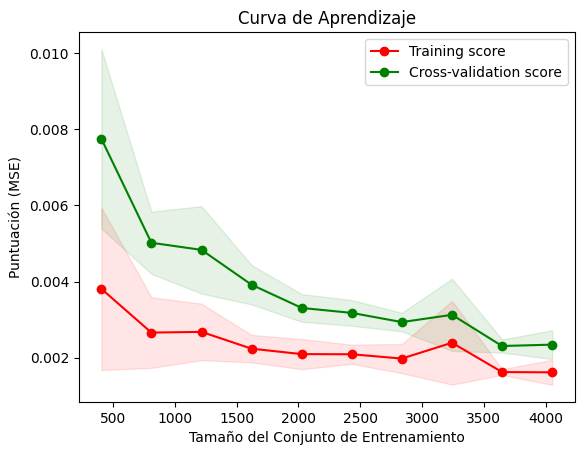

In [ ]:
# Curva de aprendizaje
train_sizes_v3, train_scores_v3, validation_scores_v3 = learning_curve(
    estimator = mejor_estimador_v3, # El estimador obtenido de GridSearchCV
    X = train_X,
    y = train_Y,
    train_sizes = np.linspace(0.1, 1.0, 10),
    cv = k_foldv3, # El objeto de k-fold CV utilizado en GridSearchCV
    scoring = 'neg_mean_squared_error'
)

# Calcula las medias y desviaciones estándar de los scores de entrenamiento y validación
train_scores_mean_v3 = -train_scores_v3.mean(axis = 1)
validation_scores_mean_v3 = -validation_scores_v3.mean(axis = 1)
train_scores_std_v3 = train_scores_v3.std(axis = 1)
validation_scores_std_v3 = validation_scores_v3.std(axis = 1)

# Grafica las curvas de aprendizaje
plt.fill_between(train_sizes_v3, train_scores_mean_v3 - train_scores_std_v3,
                 train_scores_mean_v3 + train_scores_std_v3, alpha=0.1, color="r")
plt.fill_between(train_sizes_v3, validation_scores_mean_v3 - validation_scores_std_v3,
                 validation_scores_mean_v3 + validation_scores_std_v3, alpha=0.1, color="g")
plt.plot(train_sizes_v3, train_scores_mean_v3, 'o-', color="r", label="Training score")
plt.plot(train_sizes_v3, validation_scores_mean_v3, 'o-', color="g", label="Cross-validation score")

plt.title("Curva de Aprendizaje")
plt.xlabel("Tamaño del Conjunto de Entrenamiento")
plt.ylabel("Puntuación (MSE)")
plt.legend(loc="best")
plt.show()

Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 0.0116 - mean_absolute_error: 0.0594
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0103 - mean_absolute_error: 0.0550
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0095 - mean_absolute_error: 0.0517
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0086 - mean_absolute_error: 0.0505
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0072 - mean_absolute_error: 0.0463
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0071 - mean_absolute_error: 0.0462
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0073 - mean_absolute_error: 0.0464
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0057 - mean_absolute_error: 0.0416
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0062 - mean_absolute_error: 0.0404
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0061 - mean_absolute_error: 0.0397
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0111 - mean_absolute_error: 0.0584
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0109 - mean_absolute_error: 0.0559
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0097 - mean_absolute_error: 0.0569
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0075 - mean_absolute_error: 0.0506
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0077 - mean_absolute_error: 0.0483
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0073 - mean_absolute_error: 0.0455
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0414
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0057 - mean_absolute_error: 0.0402
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0449
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0064 - mean_absolute_error: 0.0415
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0105 - mean_absolute_error: 0.0574
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0508
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0083 - mean_absolute_error: 0.0515
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0518
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0077 - mean_absolute_error: 0.0470
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0079 - mean_absolute_error: 0.0460
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0068 - mean_absolute_error: 0.0437
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0066 - mean_absolute_error: 0.0438
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0064 - mean_absolute_error: 0.0427
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0056 - mean_absolute_error: 0.0421
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - loss: 0.0111 - mean_absolute_error: 0.0581
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0089 - mean_absolute_error: 0.0525
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0098 - mean_absolute_error: 0.0496
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0092 - mean_absolute_error: 0.0521
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0094 - mean_absolute_error: 0.0535
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0078 - mean_absolute_error: 0.0465
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0062 - mean_absolute_error: 0.0427
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0073 - mean_absolute_error: 0.0439
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0060 - mean_absolute_error: 0.0410
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0057 - mean_absolute_error: 0.0399
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.0108 - mean_absolute_error: 0.0573
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - loss: 0.0095 - mean_absolute_error: 0.0513
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0083 - mean_absolute_error: 0.0489
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0078 - mean_absolute_error: 0.0523
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0092 - mean_absolute_error: 0.0548
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0065 - mean_absolute_error: 0.0406
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0068 - mean_absolute_error: 0.0452
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0064 - mean_absolute_error: 0.0417
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0061 - mean_absolute_error: 0.0441
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0058 - mean_absolute_error: 0.0400
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0123 - mean_absolute_error: 0.0660
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0106 - mean_absolute_error: 0.0533
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0099 - mean_absolute_error: 0.0529
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0089 - mean_absolute_error: 0.0509
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0089 - mean_absolute_error: 0.0475
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0081 - mean_absolute_error: 0.0503
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0081 - mean_absolute_error: 0.0508
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0074 - mean_absolute_error: 0.0465
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0066 - mean_absolute_error: 0.0452
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0067 - mean_absolute_error: 0.0444
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - loss: 0.0086 - mean_absolute_error: 0.0495
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0091 - mean_absolute_error: 0.0519
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0085 - mean_absolute_error: 0.0522
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0067 - mean_absolute_error: 0.0450
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0076 - mean_absolute_error: 0.0467
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0065 - mean_absolute_error: 0.0442
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0062 - mean_absolute_error: 0.0427
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0062 - mean_absolute_error: 0.0407
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0056 - mean_absolute_error: 0.0390
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0054 - mean_absolute_error: 0.0388
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0094 - mean_absolute_error: 0.0563
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0091 - mean_absolute_error: 0.0473
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0097 - mean_absolute_error: 0.0482
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0098 - mean_absolute_error: 0.0559
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0084 - mean_absolute_error: 0.0494
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0074 - mean_absolute_error: 0.0478
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0075 - mean_absolute_error: 0.0481
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0059 - mean_absolute_error: 0.0413
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0061 - mean_absolute_error: 0.0422
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0063 - mean_absolute_error: 0.0407
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


127/127 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - loss: 0.0096 - mean_absolute_error: 0.0551
Epoch 2/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0087 - mean_absolute_error: 0.0490
Epoch 3/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0105 - mean_absolute_error: 0.0549
Epoch 4/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0089 - mean_absolute_error: 0.0509
Epoch 5/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 0.0086 - mean_absolute_error: 0.0498
Epoch 6/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0074 - mean_absolute_error: 0.0463
Epoch 7/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0068 - mean_absolute_error: 0.0454
Epoch 8/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 0.0061 - mean_absolute_error: 0.0410
Epoch 9/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0105 - mean_absolute_error: 0.0533
Epoch 10/100
127/127 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0484
Epoch 11/100
127/127 

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - loss: 0.0110 - mean_absolute_error: 0.0575
Epoch 2/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0108 - mean_absolute_error: 0.0553
Epoch 3/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0094 - mean_absolute_error: 0.0504
Epoch 4/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0092 - mean_absolute_error: 0.0534
Epoch 5/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0072 - mean_absolute_error: 0.0463
Epoch 6/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0063 - mean_absolute_error: 0.0420
Epoch 7/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0059 - mean_absolute_error: 0.0418
Epoch 8/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0063 - mean_absolute_error: 0.0412
Epoch 9/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0068 - mean_absolute_error: 0.0441
Epoch 10/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0064 - mean_absolute_error: 0.0402
Epoch 11/100
64/64 ━━━━━━━━━━━━━━━━━━━━ 2

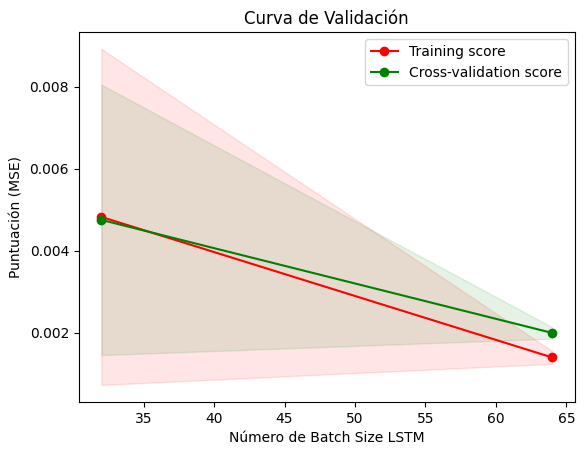

In [ ]:
# Curva de validación con el hiperparámetro 'batch_size'
param_range_v3 = [32, 64]
train_scorescur_v3, test_scorescur_v3 = validation_curve(
    estimator = mejor_estimador_v3,
    X = train_X,
    y = train_Y,
    param_name = "batch_size",
    param_range = param_range_v3,
    cv = k_foldv3,
    scoring = "neg_mean_squared_error"
)

# Calcula las medias y desviaciones estándar y grafica la curva de validación
train_scorescur_mean_v3 = -train_scorescur_v3.mean(axis = 1)
test_scorescur_mean_v3 = -test_scorescur_v3.mean(axis = 1)
train_scorescur_std_v3 = train_scorescur_v3.std(axis = 1)
test_scorescur_std_v3 = test_scorescur_v3.std(axis = 1)

plt.fill_between(param_range_v3, train_scorescur_mean_v3 - train_scorescur_std_v3,
                 train_scorescur_mean_v3 + train_scorescur_std_v3, alpha=0.1, color = "r")
plt.fill_between(param_range_v3, test_scorescur_mean_v3 - test_scorescur_std_v3,
                 test_scorescur_mean_v3 + test_scorescur_std_v3, alpha=0.1, color = "g")
plt.plot(param_range_v3, train_scorescur_mean_v3, 'o-', color = "r", label="Training score")
plt.plot(param_range_v3, test_scorescur_mean_v3, 'o-', color = "g", label="Cross-validation score")

plt.title("Curva de Validación")
plt.xlabel("Número de Batch Size LSTM")
plt.ylabel("Puntuación (MSE)")
plt.legend(loc="best")
plt.show()

### 5.4.3 Entrenamiento del modelo con parametros finales.

En este punto nos ocupamos de entrenar el modelo definido en el punto anterior con los mejores hiper-parámetros obtenidos en este punto.

In [41]:
# Reajustamos nuestro modelo añadiendo una capa de regularización, otra capa LSTM con más unidades y una capa Dense antes de la salida.
# Definir el modelo LSTM
def best_LSTM_v3():
    modelo = Sequential()
    modelo.add(LSTM(50, return_sequences = True, activation='tanh', input_shape=(train_X.shape[1], train_X.shape[2])))
    modelo.add(Dropout(0.2))
    modelo.add(LSTM(100, return_sequences=True, activation='tanh'))
    modelo.add(Dropout(0.2))
    modelo.add(LSTM(units = 50))
    modelo.add(Dense(50, activation='relu'))
    modelo.add(Dense(1))
    return modelo

In [42]:
# Instancia el modelo
best_modelo_v3 = best_LSTM_v3()

# Ahora puedes ver el resumen del modelo
best_modelo_v3.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_9 (LSTM)               (None, 288, 50)           10800     
                                                                 
 dropout_2 (Dropout)         (None, 288, 50)           0         
                                                                 
 lstm_10 (LSTM)              (None, 288, 100)          60400     
                                                                 
 dropout_3 (Dropout)         (None, 288, 100)          0         
                                                                 
 lstm_11 (LSTM)              (None, 50)                30200     
                                                                 
 dense_5 (Dense)             (None, 50)                2550      
                                                                 
 dense_6 (Dense)             (None, 1)                

In [43]:
# Compilamos el modelo
best_modelo_v3.compile(optimizer = 'adam', loss = 'mean_squared_error', metrics = ['mean_absolute_error'])

# Entrenamos el modelo
best_modelo_v3.fit(train_X, train_Y, epochs = 100, batch_size = 64, verbose = 1)

Epoch 1/100
80/80 [==============================] - 8s 30ms/step - loss: 0.0100 - mean_absolute_error: 0.0538
Epoch 2/100
80/80 [==============================] - 2s 27ms/step - loss: 0.0096 - mean_absolute_error: 0.0507
Epoch 3/100
80/80 [==============================] - 2s 27ms/step - loss: 0.0091 - mean_absolute_error: 0.0529
Epoch 4/100
80/80 [==============================] - 2s 27ms/step - loss: 0.0077 - mean_absolute_error: 0.0497
Epoch 5/100
80/80 [==============================] - 2s 27ms/step - loss: 0.0071 - mean_absolute_error: 0.0463
Epoch 6/100
80/80 [==============================] - 2s 28ms/step - loss: 0.0066 - mean_absolute_error: 0.0461
Epoch 7/100
80/80 [==============================] - 2s 27ms/step - loss: 0.0063 - mean_absolute_error: 0.0426
Epoch 8/100
80/80 [==============================] - 2s 27ms/step - loss: 0.0062 - mean_absolute_error: 0.0412
Epoch 9/100
80/80 [==============================] - 2s 27ms/step - loss: 0.0064 - mean_absolute_error: 0.0430
E

In [44]:
# Guardamos el modelo completo
best_modelo_v3.save(os.path.join(rutaML, 'LSTM_best_v3.keras'))

In [45]:
# Evaluamos el modelo con el conjunto de prueba
test_loss_v3, test_mae_v3 = best_modelo_v3.evaluate(test_X, test_Y)

print(f'La pérdida en el conjunto de prueba es: {test_loss_v3}')

40/40 [==============================] - 2s 16ms/step - loss: 0.0027 - mean_absolute_error: 0.0265
La pérdida en el conjunto de prueba es: 0.0027457200922071934


In [46]:
# Se realiza la predicción del modelo
best_train_predic_v3 = best_modelo_v3.predict(train_X)
best_test_predic_v3 = best_modelo_v3.predict(test_X)

# Se calcula la metrica MSE
best_train_mse_v3 = mean_squared_error(train_Y, best_train_predic_v3)
best_test_mse_v3 = mean_squared_error(test_Y, best_test_predic_v3)
print(f'Train MSE: {best_train_mse_v3}, Test MSE: {best_test_mse_v3}')

# Se calcula la metrica MAE
best_train_mae_v3 = mean_absolute_error(train_Y, best_train_predic_v3)
best_test_mae_v3 = mean_absolute_error(test_Y, best_test_predic_v3)
print(f'Train MAE: {best_train_mae_v3}, Test MAE: {best_test_mae_v3}')

# Se calcula la metrica RMSE
best_train_rmse_v3 = np.sqrt(best_train_mse_v3)
best_test_rmse_v3 = np.sqrt(best_test_mse_v3)
print(f'Train RMSE: {best_train_rmse_v3}, Test RMSE: {best_test_rmse_v3}')

40/40 [==============================] - 0s 11ms/step
Train MSE: 0.0022171489633830304, Test MSE: 0.0027457196449807457
Train MAE: 0.024353249439150713, Test MAE: 0.026545835428470284
Train RMSE: 0.047086611296450614, Test RMSE: 0.05239961493160752


In [47]:
metricsv3_df = pd.DataFrame(data=[['Train', round(best_train_mse_v3, 5), round(best_train_mae_v3, 5), round(best_train_rmse_v3, 5)],
                                    ['Test', round(best_test_mse_v3, 5), round(best_test_mae_v3, 5), round(best_test_rmse_v3, 5)]], columns=['LSTM v3','MSE', 'MAE','RMSE'])

metricsv3_df.set_index('LSTM v3', inplace=True)
metricsv3_df

,MSE,MAE,RMSE
LSTM v3,,,
Train,0.00222,0.02435,0.04709
Test,0.00275,0.02655,0.05240


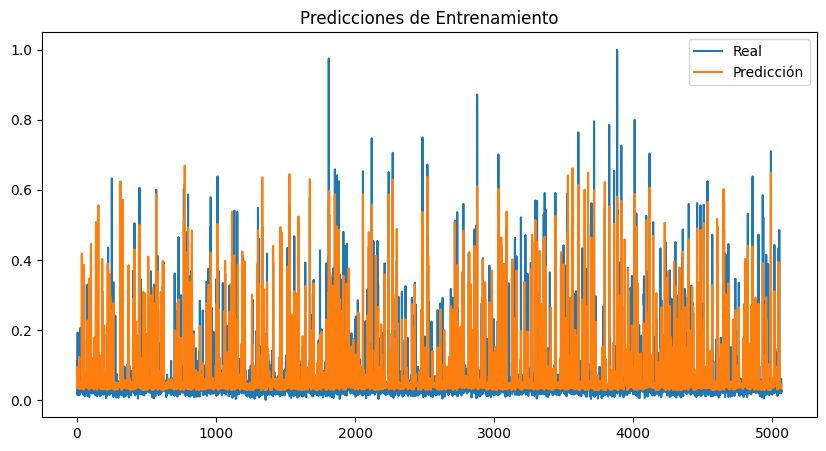

In [48]:
# Dibujamos los valores reales vs. las predicciones de entrenamiento
plt.figure(figsize=(10,5))
plt.plot(train_Y, label='Real')
plt.plot(best_train_predic_v3, label='Predicción')
plt.title('Predicciones de Entrenamiento')
plt.legend()
plt.show()

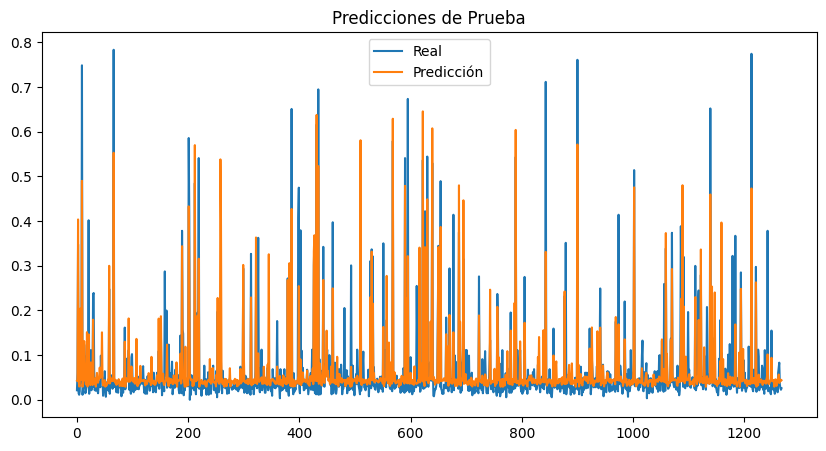

In [49]:
# Dibujamos los valores reales vs. las predicciones de prueba
plt.figure(figsize=(10,5))
plt.plot(test_Y, label='Real')
plt.plot(best_test_predic_v3, label='Predicción')
plt.title('Predicciones de Prueba')
plt.legend()
plt.show()

## 5.5 Comparativa de modelos

In [50]:
comparision_df = pd.DataFrame(data=[['LSTM v1', test_mse_v1 , test_mae_v1, test_rmse_v1],
                                    ['LSTM v2', best_test_mse_v2, best_test_mae_v2, best_test_rmse_v2],
                                    ['LSTM v3', best_test_mse_v3, best_test_mae_v3, best_test_rmse_v3]], columns=['Model','MSE', 'MAE','RMSE'])

comparision_df.set_index('Model', inplace=True)

In [51]:
comparision_df.sort_values(by='RMSE')

,MSE,MAE,RMSE
Model,,,
LSTM v1,0.002409,0.022896,0.049081
LSTM v3,0.002746,0.026546,0.052400
LSTM v2,0.003132,0.032322,0.055968


# 6. Generación del modelo TensorFlow Lite

## 6.1. Conversión de los modelos a TensorFlow Lite

A continuación, realziamos la conversión del modelo LSTM v1 a TensorFlow Lite

In [52]:
Modelo1 = rutaML + '/LSTM_best_v1.keras'
modelov1 = tf.keras.models.load_model(Modelo1)
convertidor = tf.lite.TFLiteConverter.from_keras_model(modelov1)
convertidor.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS, tf.lite.OpsSet.SELECT_TF_OPS]

In [53]:
modelo_tflite = convertidor.convert()
with open(rutaML + '/LSTM_best_v1.tflite', 'wb') as archivo:
    archivo.write(modelo_tflite)

print("Save the Tensorflow 'Lite' model1!")

Save the Tensorflow 'Lite' model1!


In [54]:
convertidor.optimizations = [tf.lite.Optimize.DEFAULT]
quant_tflite_model = convertidor.convert()
with open(rutaML + '/LSTM_quant_best_v1.tflite', 'wb') as archivo:
    archivo.write(quant_tflite_model)

print("Save the Tensorflow 'Lite' Optimized model1!")

Save the Tensorflow 'Lite' Optimized model1!


A continuación, realziamos la conversión del modelo LSTM v2 a TensorFlow Lite

In [55]:
Modelo2 = rutaML + '/LSTM_best_v2.keras'
modelov2 = tf.keras.models.load_model(Modelo2)
convertidor = tf.lite.TFLiteConverter.from_keras_model(modelov2)
convertidor.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS, tf.lite.OpsSet.SELECT_TF_OPS]

In [56]:
modelo2_tflite = convertidor.convert()
with open(rutaML + '/LSTM_best_v2.tflite', 'wb') as archivo:
    archivo.write(modelo2_tflite)

print("Save the Tensorflow 'Lite' model2!")

Save the Tensorflow 'Lite' model2!


In [57]:
convertidor.optimizations = [tf.lite.Optimize.DEFAULT]
quant_tflite_model2 = convertidor.convert()
with open(rutaML + '/LSTM_quant_best_v2.tflite', 'wb') as archivo:
    archivo.write(quant_tflite_model2)

print("Save the Tensorflow 'Lite' Optimized model2!")

Save the Tensorflow 'Lite' Optimized model2!


A continuación, realziamos la conversión del modelo LSTM v3 a TensorFlow Lite

In [58]:
Modelo3 = rutaML + '/LSTM_best_v3.keras'
modelov3 = tf.keras.models.load_model(Modelo3)
convertidor = tf.lite.TFLiteConverter.from_keras_model(modelov3)
convertidor.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS, tf.lite.OpsSet.SELECT_TF_OPS]

In [59]:
modelo3_tflite = convertidor.convert()
with open(rutaML + '/LSTM_best_v3.tflite', 'wb') as archivo:
    archivo.write(modelo3_tflite)

print("Save the Tensorflow 'Lite' model3!")

Save the Tensorflow 'Lite' model3!


In [60]:
convertidor.optimizations = [tf.lite.Optimize.DEFAULT]
quant_tflite_model3 = convertidor.convert()
with open(rutaML + '/LSTM_quant_best_v3.tflite', 'wb') as archivo:
    archivo.write(quant_tflite_model3)

print("Save the Tensorflow 'Lite' Optimized model3!")

Save the Tensorflow 'Lite' Optimized model3!


## 6.2. Comparación del tamaño de los modelos.

In [61]:
print("Model Sizes:")
!ls -lh '/content/drive/MyDrive/TFM_ML/Models' | awk '{print $5 "\t" $9}'

Model Sizes:
	
396K	LSTM_best_v1.keras
139K	LSTM_best_v1.tflite
396K	LSTM_best_v2.keras
139K	LSTM_best_v2.tflite
1.3M	LSTM_best_v3.keras
433K	LSTM_best_v3.tflite
51K	LSTM_quant_best_v1.tflite
51K	LSTM_quant_best_v2.tflite
133K	LSTM_quant_best_v3.tflite


In [62]:
size_df = pd.DataFrame(data=[['LSTM v1', '396K' , '139K', '51K'],
                             ['LSTM v2', '396K', '139K', '51K'],
                             ['LSTM v3', '1.3M', '433K', '133K']], columns=['Model','Original', 'TFLite','TFLite Optimized'])

size_df.set_index('Model', inplace=True)
size_df_styled = size_df.style.set_caption("Resultados de Tamaño")
size_df_styled

,Original,TFLite,TFLite Optimized
Model,,,
LSTM v1,396K,139K,51K
LSTM v2,396K,139K,51K
LSTM v3,1.3M,433K,133K


## 6.3. Comparación de la precisión de los modelos.

In [63]:
# Función para calcular el MAE
def calculate_mae(true_values, predictions):
    return np.mean(np.abs(true_values - predictions))

In [64]:
# Load tflite model v1.
interpreter_v1 = tf.lite.Interpreter(model_path = rutaML + "/LSTM_best_v1.tflite")
interpreter_v1.allocate_tensors()

input_v1 = interpreter_v1.get_input_details()
output_v1 = interpreter_v1.get_output_details()

# Ejecutamos el modelo y calculamos el MAE
mae_v1 = []
for i in range(len(test_X)):
    input_data = np.array([test_X[i]], dtype=np.float32)
    interpreter_v1.set_tensor(input_v1[0]['index'], input_data)
    interpreter_v1.invoke()
    output_data = interpreter_v1.get_tensor(output_v1[0]['index'])
    predicted = np.squeeze(output_data)

    # Calcula y guarda el MAE para este ejemplo
    mae_v1.append(calculate_mae(test_Y[i], predicted))

# Calcula el MAE promedio para todos los ejemplos
average_mae_v1 = np.mean(mae_v1)

# Load tflite quant model v1.
interpreter_quant_v1 = tf.lite.Interpreter(model_path = rutaML + "/LSTM_quant_best_v1.tflite")
interpreter_quant_v1.allocate_tensors()

input_v1_quant = interpreter_quant_v1.get_input_details()
output_v1_quant = interpreter_quant_v1.get_output_details()

# Ejecutamos el modelo y calculamos el MAE
mae_quant_v1 = []
for i in range(len(test_X)):
    input_data = np.array([test_X[i]], dtype=np.float32)
    interpreter_quant_v1.set_tensor(input_v1_quant[0]['index'], input_data)
    interpreter_quant_v1.invoke()
    output_data = interpreter_quant_v1.get_tensor(output_v1_quant[0]['index'])
    predicted = np.squeeze(output_data)

    # Calcula y guarda el MAE para este ejemplo
    mae_quant_v1.append(calculate_mae(test_Y[i], predicted))

# Calcula el MAE promedio para todos los ejemplos
average_maequant_v1 = np.mean(mae_quant_v1)

print(f"Original Model MAE: {test_mae_v1}")
print(f"TF Lite Model MAE promedio: {average_mae_v1}")
print(f"TF Lite Optimized Model MAE promedio: {average_maequant_v1}")

Original Model MAE: 0.022896200664395832
TF Lite Model MAE promedio: 0.022896200789257692
TF Lite Optimized Model MAE promedio: 0.02299300525114129


In [65]:
# Load tflite model v2.
interpreter_v2 = tf.lite.Interpreter(model_path = rutaML + "/LSTM_best_v2.tflite")
interpreter_v2.allocate_tensors()

input_v2 = interpreter_v2.get_input_details()
output_v2 = interpreter_v2.get_output_details()

# Ejecutamos el modelo y calculamos el MAE
mae_v2 = []
for i in range(len(test_X)):
    input_data = np.array([test_X[i]], dtype=np.float32)
    interpreter_v2.set_tensor(input_v2[0]['index'], input_data)
    interpreter_v2.invoke()
    output_data = interpreter_v2.get_tensor(output_v2[0]['index'])
    predicted = np.squeeze(output_data)

    # Calcula y guarda el MAE para este ejemplo
    mae_v2.append(calculate_mae(test_Y[i], predicted))

# Calcula el MAE promedio para todos los ejemplos
average_mae_v2 = np.mean(mae_v2)

# Load tflite quant model v2.
interpreter_quant_v2 = tf.lite.Interpreter(model_path = rutaML + "/LSTM_quant_best_v2.tflite")
interpreter_quant_v2.allocate_tensors()

input_v2_quant = interpreter_quant_v2.get_input_details()
output_v2_quant = interpreter_quant_v2.get_output_details()

# Ejecutamos el modelo y calculamos el MAE
mae_quant_v2 = []
for i in range(len(test_X)):
    input_data = np.array([test_X[i]], dtype=np.float32)
    interpreter_quant_v2.set_tensor(input_v2_quant[0]['index'], input_data)
    interpreter_quant_v2.invoke()
    output_data = interpreter_quant_v2.get_tensor(output_v2_quant[0]['index'])
    predicted = np.squeeze(output_data)

    # Calcula y guarda el MAE para este ejemplo
    mae_quant_v2.append(calculate_mae(test_Y[i], predicted))

# Calcula el MAE promedio para todos los ejemplos
average_maequant_v2 = np.mean(mae_quant_v2)

print(f"Original Model MAE: {test_mae_v2}")
print(f"TF Lite Model MAE promedio: {average_mae_v2}")
print(f"TF Lite Optimized Model MAE promedio: {average_maequant_v2}")

Original Model MAE: 0.0323219820857048
TF Lite Model MAE promedio: 0.03232198425693276
TF Lite Optimized Model MAE promedio: 0.03253770029952939


In [66]:
# Load tflite model v3.
interpreter_v3 = tf.lite.Interpreter(model_path = rutaML + "/LSTM_best_v3.tflite")
interpreter_v3.allocate_tensors()

input_v3 = interpreter_v3.get_input_details()
output_v3 = interpreter_v3.get_output_details()

# Ejecutamos el modelo y calculamos el MAE
mae_v3 = []
for i in range(len(test_X)):
    input_data = np.array([test_X[i]], dtype=np.float32)
    interpreter_v3.set_tensor(input_v3[0]['index'], input_data)
    interpreter_v3.invoke()
    output_data = interpreter_v3.get_tensor(output_v3[0]['index'])
    predicted = np.squeeze(output_data)

    # Calcula y guarda el MAE para este ejemplo
    mae_v3.append(calculate_mae(test_Y[i], predicted))

# Calcula el MAE promedio para todos los ejemplos
average_mae_v3 = np.mean(mae_v3)

# Load tflite quant model v2.
interpreter_quant_v3 = tf.lite.Interpreter(model_path = rutaML + "/LSTM_quant_best_v3.tflite")
interpreter_quant_v3.allocate_tensors()

input_v3_quant = interpreter_quant_v3.get_input_details()
output_v3_quant = interpreter_quant_v3.get_output_details()

# Ejecutamos el modelo y calculamos el MAE
mae_quant_v3 = []
for i in range(len(test_X)):
    input_data = np.array([test_X[i]], dtype=np.float32)
    interpreter_quant_v3.set_tensor(input_v3_quant[0]['index'], input_data)
    interpreter_quant_v3.invoke()
    output_data = interpreter_quant_v3.get_tensor(output_v3_quant[0]['index'])
    predicted = np.squeeze(output_data)

    # Calcula y guarda el MAE para este ejemplo
    mae_quant_v3.append(calculate_mae(test_Y[i], predicted))

# Calcula el MAE promedio para todos los ejemplos
average_maequant_v3 = np.mean(mae_quant_v3)

print(f"Original Model MAE: {test_mae_v3}")
print(f"TF Lite Model MAE promedio: {average_mae_v3}")
print(f"TF Lite Optimized Model MAE promedio: {average_maequant_v3}")

Original Model MAE: 0.02654583379626274
TF Lite Model MAE promedio: 0.026545836840143777
TF Lite Optimized Model MAE promedio: 0.026572768301311857


In [67]:
# Se genera la tabla resumen de los resultados obtenidos.
metrics_df = pd.DataFrame(data=[['LSTM v1', round(test_mae_v1, 5), round(average_mae_v1, 5), round(average_maequant_v1, 5)],
                                ['LSTM v2', round(test_mae_v2, 5), round(average_mae_v2, 5), round(average_maequant_v2, 5)],
                                ['LSTM v3', round(test_mae_v3, 5), round(average_mae_v3, 5), round(average_maequant_v3, 5)]], columns=['Model', 'Original', 'TFLite', 'TFLite Optimized'])

metrics_df.set_index('Model', inplace=True)
metrics_df = metrics_df.style.set_caption("Resultados de metricas")
metrics_df

,Original,TFLite,TFLite Optimized
Model,,,
LSTM v1,0.022900,0.022900,0.022990
LSTM v2,0.032320,0.032320,0.032540
LSTM v3,0.026550,0.026550,0.026570


## 6.4. Comparación de los tiempos de ejecución de los modelos.

In [68]:
# Se realiza el cáculo para el Modelo 1
input_data = np.random.randn(1, 288, 3).astype(np.float32)

start_time = time.time()
for i in range(100):
    v1_predictions = modelo_v1.predict(input_data)
v1_inference_time = time.time() - start_time

start_time = time.time()
for i in range(100):
    interpreter_v1.set_tensor(interpreter_v1.get_input_details()[0]['index'], input_data)
    interpreter_v1.invoke()
    tflite_predictions = interpreter_v1.get_tensor(interpreter_v1.get_output_details()[0]['index'])
    interpreter_v1.reset_all_variables()
tflite1_inference_time = time.time() - start_time

start_time = time.time()
for i in range(100):
    interpreter_quant_v1.set_tensor(interpreter_quant_v1.get_input_details()[0]['index'], input_data)
    interpreter_quant_v1.invoke()
    tflite_predictions = interpreter_quant_v1.get_tensor(interpreter_quant_v1.get_output_details()[0]['index'])
    interpreter_quant_v1.reset_all_variables()
tflite1optmz_inference_time = time.time() - start_time

print("Inference Time Comparison:")
print(f"Original Model: {v1_inference_time}s")
print(f"TF Lite Model: {tflite1_inference_time}s")
print(f"TF Lite Optimized Model: {tflite1optmz_inference_time}s")

1/1 [==============================] - 0s 27ms/step
Inference Time Comparison:
Original Model: 7.2098469734191895s
TF Lite Model: 1.4450137615203857s
TF Lite Optimized Model: 1.6283507347106934s


In [69]:
# Se realiza el cáculo para el Modelo 2
input_data = np.random.randn(1, 288, 3).astype(np.float32)

start_time = time.time()
for i in range(100):
    v2_predictions = best_modelo_v2.predict(input_data)
v2_inference_time = time.time() - start_time

start_time = time.time()
for i in range(100):
    interpreter_v2.set_tensor(interpreter_v2.get_input_details()[0]['index'], input_data)
    interpreter_v2.invoke()
    tflite_predictions = interpreter_v2.get_tensor(interpreter_v2.get_output_details()[0]['index'])
    interpreter_v2.reset_all_variables()
tflite2_inference_time = time.time() - start_time

start_time = time.time()
for i in range(100):
    interpreter_quant_v2.set_tensor(interpreter_quant_v2.get_input_details()[0]['index'], input_data)
    interpreter_quant_v2.invoke()
    tflite_predictions = interpreter_quant_v2.get_tensor(interpreter_quant_v2.get_output_details()[0]['index'])
    interpreter_quant_v2.reset_all_variables()
tflite2optmz_inference_time = time.time() - start_time

print("Inference Time Comparison:")
print(f"Original Model: {v2_inference_time}s")
print(f"TF Lite Model: {tflite2_inference_time}s")
print(f"TF Lite Optimized Model: {tflite2optmz_inference_time}s")

1/1 [==============================] - 0s 24ms/step
Inference Time Comparison:
Original Model: 6.996608734130859s
TF Lite Model: 1.440255880355835s
TF Lite Optimized Model: 1.6780827045440674s


In [70]:
# Se realiza el cáculo para el Modelo 3
input_data = np.random.randn(1, 288, 3).astype(np.float32)

start_time = time.time()
for i in range(100):
    v3_predictions = best_modelo_v3.predict(input_data)
v3_inference_time = time.time() - start_time

start_time = time.time()
for i in range(100):
    interpreter_v3.set_tensor(interpreter_v3.get_input_details()[0]['index'], input_data)
    interpreter_v3.invoke()
    tflite_predictions = interpreter_v3.get_tensor(interpreter_v3.get_output_details()[0]['index'])
    interpreter_v3.reset_all_variables()
tflite3_inference_time = time.time() - start_time

start_time = time.time()
for i in range(100):
    interpreter_quant_v3.set_tensor(interpreter_quant_v3.get_input_details()[0]['index'], input_data)
    interpreter_quant_v3.invoke()
    tflite_predictions = interpreter_quant_v3.get_tensor(interpreter_quant_v3.get_output_details()[0]['index'])
    interpreter_quant_v3.reset_all_variables()
tflite3optmz_inference_time = time.time() - start_time

print("Inference Time Comparison:")
print(f"Original Model: {v3_inference_time}s")
print(f"TF Lite Model: {tflite3_inference_time}s")
print(f"TF Lite Optimized Model: {tflite3optmz_inference_time}s")

1/1 [==============================] - 0s 26ms/step
Inference Time Comparison:
Original Model: 6.939375638961792s
TF Lite Model: 2.3957550525665283s
TF Lite Optimized Model: 3.020878314971924s


In [71]:
# Se genera la tabla resumen de los resultados obtenidos.
inference_df = pd.DataFrame(data=[['LSTM v1', round(v1_inference_time, 5), round(tflite1_inference_time, 5), round(tflite1optmz_inference_time, 5)],
                                  ['LSTM v2', round(v2_inference_time, 5), round(tflite2_inference_time, 5), round(tflite2optmz_inference_time, 5)],
                                  ['LSTM v3', round(v3_inference_time, 5), round(tflite3_inference_time, 5), round(tflite3optmz_inference_time, 5)]], columns=['Model', 'Original', 'TFLite', 'TFLite Optimized'])

inference_df.set_index('Model', inplace=True)
inference_df = inference_df.style.set_caption("Resultados de Inferencia")
inference_df

,Original,TFLite,TFLite Optimized
Model,,,
LSTM v1,7.209850,1.445010,1.628350
LSTM v2,6.996610,1.440260,1.678080
LSTM v3,6.939380,2.395760,3.020880
